In [2]:
#Import packages
import pandas as pd
import h5py
import numpy as np
import scipy as sp
import scipy.signal as sg
import scipy.stats as st
import xarray as xr
import os
import matplotlib.pyplot as plt
from matplotlib import patches
from matplotlib.ticker import MaxNLocator
import ast
import glob
import re

from DR_analysis_utils import Session, makePSTH, make_neuron_time_trials_tensor 
from DR_analysis_utils import compute_smoothed_response_rate, compute_block_modulation

%matplotlib notebook

In [3]:
main_path = [
    r"\\allen\programs\mindscope\workgroups\dynamicrouting\PilotEphys\Task 2 pilot\DRpilot_636766_20230123\processed", 
    r"\\allen\programs\mindscope\workgroups\dynamicrouting\PilotEphys\Task 2 pilot\DRpilot_636766_20230124\processed", 
    r"\\allen\programs\mindscope\workgroups\dynamicrouting\PilotEphys\Task 2 pilot\DRpilot_636766_20230125\processed", 
    r"\\allen\programs\mindscope\workgroups\dynamicrouting\PilotEphys\Task 2 pilot\DRpilot_636766_20230126\processed", 
]

In [4]:
sessions={}

for mi,mm in enumerate(main_path):
    sessions[mi]=Session(path=mm)
    sessions[mi].assign_unit_areas()
    sessions[mi]=compute_smoothed_response_rate(sessions[mi])
    

probeA areas found
probeB areas found
probeC areas found
probeD areas found
probeF areas found


C:\Users\ethan.mcbride\Code\dynamic_routing_ephys\analysis\DR_analysis_utils.py:1098: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stimTrials.loc[:,ss+'_smooth']=sg.convolve(stimTrials.loc[:,'trial_response'].values,gwindow,mode='same')/np.sum(gwindow)
C:\Users\ethan.mcbride\Code\dynamic_routing_ephys\analysis\DR_analysis_utils.py:1098: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stimTrials.loc[:,ss+'_smooth']=sg.convolve(stimTrials.loc[:,'trial_response'].values,gwindow,mode='same')/np.sum(gwindow)
C:\U

probeA areas found
probeB areas found
probeC areas found
probeD areas found
probeF areas found


C:\Users\ethan.mcbride\Code\dynamic_routing_ephys\analysis\DR_analysis_utils.py:1098: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stimTrials.loc[:,ss+'_smooth']=sg.convolve(stimTrials.loc[:,'trial_response'].values,gwindow,mode='same')/np.sum(gwindow)
C:\Users\ethan.mcbride\Code\dynamic_routing_ephys\analysis\DR_analysis_utils.py:1098: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stimTrials.loc[:,ss+'_smooth']=sg.convolve(stimTrials.loc[:,'trial_response'].values,gwindow,mode='same')/np.sum(gwindow)
C:\U

probeA areas found
probeB areas found
probeC areas found
probeD areas found
probeE areas found
probeF areas found


C:\Users\ethan.mcbride\Code\dynamic_routing_ephys\analysis\DR_analysis_utils.py:1098: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stimTrials.loc[:,ss+'_smooth']=sg.convolve(stimTrials.loc[:,'trial_response'].values,gwindow,mode='same')/np.sum(gwindow)
C:\Users\ethan.mcbride\Code\dynamic_routing_ephys\analysis\DR_analysis_utils.py:1098: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stimTrials.loc[:,ss+'_smooth']=sg.convolve(stimTrials.loc[:,'trial_response'].values,gwindow,mode='same')/np.sum(gwindow)
C:\U

probeA areas found
probeB areas found
probeC areas found
probeD areas found
probeE areas found


C:\Users\ethan.mcbride\Code\dynamic_routing_ephys\analysis\DR_analysis_utils.py:1098: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stimTrials.loc[:,ss+'_smooth']=sg.convolve(stimTrials.loc[:,'trial_response'].values,gwindow,mode='same')/np.sum(gwindow)
C:\Users\ethan.mcbride\Code\dynamic_routing_ephys\analysis\DR_analysis_utils.py:1098: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stimTrials.loc[:,ss+'_smooth']=sg.convolve(stimTrials.loc[:,'trial_response'].values,gwindow,mode='same')/np.sum(gwindow)
C:\U

In [5]:
for ss in range(0,len(sessions)):
    sessions[ss].trials['trialOptoRegion'][sessions[ss].trials['trialOptoRegion'].isnull().values]='none'
    
sessions[0].trials

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\840296974.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sessions[ss].trials['trialOptoRegion'][sessions[ss].trials['trialOptoRegion'].isnull().values]='none'


,trialStartFrame,trialStimID,trialstimRewarded,trial_response,trial_rewarded,trial_sound_dur,trial_vis_stim_dur,vis_go_trials,vis_nogo_trials,vis_hit_trials,...,stimLatency,trial_stim_dur,avg_run_speed,vis1_interp,sound2_interp,vis2_interp,sound1_interp,catch_interp,cross_modal_dprime,intra_modal_dprime
0,0,vis1,vis1,True,True,0.0,0.5,True,False,False,...,0.020830,0.5,19.270120,0.546012,NaN,NaN,NaN,NaN,NaN,NaN
1,714,vis1,vis1,True,True,0.0,0.5,True,False,False,...,0.020830,0.5,31.248746,0.636215,NaN,NaN,NaN,NaN,NaN,NaN
2,1315,vis1,vis1,True,True,0.0,0.5,True,False,False,...,0.022530,0.5,29.410584,0.721164,NaN,NaN,NaN,NaN,NaN,NaN
3,1714,vis1,vis1,True,True,0.0,0.5,True,False,False,...,0.022530,0.5,26.234270,0.798030,NaN,NaN,NaN,NaN,NaN,NaN
4,2049,vis1,vis1,True,True,0.0,0.5,True,False,False,...,0.022520,0.5,27.104789,0.864853,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
526,214637,vis1,sound1,True,False,0.0,0.5,True,False,True,...,0.022580,0.5,32.910645,NaN,0.168483,0.0,0.648350,NaN,NaN,1.341046
527,215093,sound1,sound1,True,True,0.5,0.0,False,False,False,...,0.057833,0.5,39.187733,NaN,0.165149,0.0,0.636215,NaN,NaN,1.321872
528,215497,sound2,sound1,False,False,0.5,0.0,False,False,False,...,0.062646,0.5,43.126650,NaN,NaN,0.0,0.591114,NaN,NaN,NaN
529,215876,sound1,sound1,True,True,0.5,0.0,False,False,False,...,0.057646,0.5,31.011331,NaN,NaN,0.0,NaN,NaN,NaN,NaN


In [17]:
sessions[0].trials['trialOptoDur']

0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
      ... 
526    1.0
527    1.0
528    1.0
529    NaN
530    1.0
Name: trialOptoDur, Length: 531, dtype: float64

In [6]:
# loop through sessions and make unit xarrays
time_before_flash = 0.25
trial_duration = 1
bin_size = 0.001


for ss in sessions:
    #Make tensor
    trial_tensor = make_neuron_time_trials_tensor(sessions[ss].good_units, sessions[ss].spike_times, 
                                                  sessions[ss].trials,time_before_flash, trial_duration, 
                                                  bin_size)

    # make xarray
    sessions[ss].trial_da = xr.DataArray(trial_tensor, dims=("unit_id", "time", "trials"), 
                               coords={
                                   "unit_id": sessions[ss].good_units.index.values,
                                   "time": np.arange(0, trial_duration, bin_size)-time_before_flash,
                                   "trials": sessions[ss].trials.index.values
                                   })
    
    print(main_path[ss]+' done')

\\allen\programs\mindscope\workgroups\dynamicrouting\PilotEphys\Task 2 pilot\DRpilot_636766_20230123\processed done
\\allen\programs\mindscope\workgroups\dynamicrouting\PilotEphys\Task 2 pilot\DRpilot_636766_20230124\processed done
\\allen\programs\mindscope\workgroups\dynamicrouting\PilotEphys\Task 2 pilot\DRpilot_636766_20230125\processed done
\\allen\programs\mindscope\workgroups\dynamicrouting\PilotEphys\Task 2 pilot\DRpilot_636766_20230126\processed done


In [ ]:
#plot how units are affected by opto

In [ ]:
sessions[0].trials['trialOptoRegion'].unique()

In [ ]:
sessions[0].good_units['area'].unique()

In [ ]:
# for a given area and stimulus

sel_area='AI'
sel_stim = 'vis1'

opto_resp={}
opto_regions=sessions[0].trials['trialOptoRegion'].unique()

for oo in opto_regions:
    opto_resp[oo] = []

for ss in range(0,1):#len(sessions)):
    
    area_units = sessions[ss].good_units.query('area.str.contains(@sel_area)')
    
    for oo in opto_regions:
        
        sel_trials = sessions[ss].trials.query('trialStimID == "vis1" and trialOptoRegion == @oo').index
    
        # compute avg firing rate for each opto stimulus

        opto_resp[oo].append(sessions[ss].trial_da.sel(
            unit_id=area_units.index,trials=sel_trials).mean(dim=['trials']))

    
for oo in opto_regions:   
    opto_resp[oo]=xr.concat(opto_resp[oo],dim='unit_id')

In [ ]:
# opto_resp[oo]

In [ ]:
# add error bars
### smooth each unit first, then find standard error
gwindow = sg.gaussian(15, std=5)

opto_resp_smooth={}
opto_resp_smooth_mean={}
opto_resp_smooth_sem={}

for oo in opto_regions:
    opto_resp_smooth[oo]=np.zeros(opto_resp[oo].shape)

    
    for iu,uu in enumerate(opto_resp[oo].unit_id.values):
        opto_resp_smooth[oo][iu,:]=sg.convolve(opto_resp[oo].sel(unit_id=uu),gwindow,mode='same')/np.sum(gwindow)
    
    opto_resp_smooth_mean[oo]=np.nanmean(opto_resp_smooth[oo],0)
    opto_resp_smooth_sem[oo]=np.nanstd(opto_resp_smooth[oo],0)/np.sqrt(opto_resp_smooth[oo].shape[0])


In [ ]:
fig,ax=plt.subplots(1,1,figsize=(4,4))

stim_rect=patches.Rectangle([0,-5],0.5,100,color='grey',alpha=0.1)
ax.add_patch(stim_rect)

maxvals=[]
minvals=[]

for oo in opto_regions:
    y=opto_resp_smooth_mean[oo]
    err=opto_resp_smooth_sem[oo]
    line0=ax.plot(opto_resp[oo].time, y)
    plt.fill_between(opto_resp[oo].time, y-err, y+err,
        alpha=0.2, edgecolor=None, facecolor=line0[0].get_color())
    maxvals.append(np.max(y))
    minvals.append(np.min(y))

ax.set_title(sel_area+' neurons (n='+str(len(opto_resp[oo].unit_id))+') target='+sel_stim[:-1])
ax.set_xlabel('time relative to stimulus onset (s)')
ax.set_ylabel('firing rate (Hz)')
ax.set_xlim([-0.2,0.75])
ax.legend(opto_regions)
ax.set_ylim([np.min(minvals)-5,np.max(maxvals)+5])
# ax.set_yticks([0,5,10,15,20,25,30])

fig.tight_layout()

In [ ]:
# line0[0].get_color()

In [ ]:
# all in one cell

# for a given area and stimulus

sel_area='MOp'
sel_stim = 'catch'

opto_resp={}
opto_regions=sessions[0].trials['trialOptoRegion'].unique()

for oo in opto_regions:
    opto_resp[oo] = []

for ss in range(0,len(sessions)):
    
    area_units = sessions[ss].good_units.query('area.str.contains(@sel_area)')
    
    for oo in opto_regions:
        
        sel_trials = sessions[ss].trials.query('trialStimID == @sel_stim and trialOptoRegion == @oo').index
    
        # compute avg firing rate for each opto stimulus

        opto_resp[oo].append(sessions[ss].trial_da.sel(
            unit_id=area_units.index,trials=sel_trials).mean(dim=['trials']))

    
for oo in opto_regions:   
    opto_resp[oo]=xr.concat(opto_resp[oo],dim='unit_id')


# add error bars
### smooth each unit first, then find standard error
gwindow = sg.gaussian(15, std=5)

opto_resp_smooth={}
opto_resp_smooth_mean={}
opto_resp_smooth_sem={}

for oo in opto_regions:
    opto_resp_smooth[oo]=np.zeros(opto_resp[oo].shape)

    
    for iu,uu in enumerate(opto_resp[oo].unit_id.values):
        opto_resp_smooth[oo][iu,:]=sg.convolve(opto_resp[oo].sel(unit_id=uu),gwindow,mode='same')/np.sum(gwindow)
    
    opto_resp_smooth_mean[oo]=np.nanmean(opto_resp_smooth[oo],0)
    opto_resp_smooth_sem[oo]=np.nanstd(opto_resp_smooth[oo],0)/np.sqrt(opto_resp_smooth[oo].shape[0])

    
fig,ax=plt.subplots(1,1,figsize=(4,4))

stim_rect=patches.Rectangle([0,-5],0.5,100,color='grey',alpha=0.1)
ax.add_patch(stim_rect)

maxvals=[]
minvals=[]

for oo in opto_regions:
    y=opto_resp_smooth_mean[oo]
    err=opto_resp_smooth_sem[oo]
    line0=ax.plot(opto_resp[oo].time, y)
    plt.fill_between(opto_resp[oo].time, y-err, y+err,
        alpha=0.2, edgecolor=None, facecolor=line0[0].get_color())
    maxvals.append(np.max(y))
    minvals.append(np.min(y))

ax.set_title(sel_area+' neurons (n='+str(len(opto_resp[oo].unit_id))+') stim='+sel_stim[:])
ax.set_xlabel('time relative to stimulus onset (s)')
ax.set_ylabel('firing rate (Hz)')
ax.set_xlim([-0.2,0.75])
ax.legend(opto_regions,title='opto loc:')
ax.set_ylim([np.min(minvals)-5,np.max(maxvals)+5])
# ax.set_yticks([0,5,10,15,20,25,30])

fig.tight_layout()


In [ ]:
sessions[0].good_units['area_short'].unique()

In [ ]:
# separate into RS and FS units

# for a given area and stimulus

sel_area='VISp'
sel_stim = 'vis1'

opto_resp={}
opto_regions=sessions[0].trials['trialOptoRegion'].unique()

baseline_mean=[]
baseline_std=[]

for oo in opto_regions:
    opto_resp[oo] = []
    
all_unit_info = []

for ss in range(0,len(sessions)):
    
    area_units = sessions[ss].good_units.query('area.str.contains(@sel_area)')
    
    all_unit_info.append(area_units)
    
    for oo in opto_regions:
        
        sel_trials = sessions[ss].trials.query('trialStimID == @sel_stim and trialOptoRegion == @oo').index
    
        # compute avg firing rate for each opto stimulus

        opto_resp[oo].append(sessions[ss].trial_da.sel(
            unit_id=area_units.index,trials=sel_trials).mean(dim=['trials']))
    
    baseline=sessions[ss].trial_da.sel(unit_id=area_units.index,time=slice(-0.25,-0.15)).mean(dim=['time'])
    baseline_mean.append(baseline.mean(dim=['trials']))
    baseline_std.append(baseline.std(dim=['trials']))
    
baseline_mean=xr.concat(baseline_mean,dim='unit_id')
baseline_std=xr.concat(baseline_std,dim='unit_id')
    
for oo in opto_regions:   
    opto_resp[oo]=xr.concat(opto_resp[oo],dim='unit_id')

all_unit_info = pd.concat(all_unit_info,axis=0)

FS_units = all_unit_info.query('duration < 0.4').index
RS_units = all_unit_info.query('duration >= 0.4').index

# add error bars
### smooth each unit first, then find standard error
gwindow = sg.gaussian(15, std=5)

opto_resp_RS_smooth={}
opto_resp_FS_smooth={}

opto_resp_RS_smooth_mean={}
opto_resp_RS_smooth_sem={}

opto_resp_FS_smooth_mean={}
opto_resp_FS_smooth_sem={}

opto_resp_FS_smooth_z={}
opto_resp_RS_smooth_z={}


for oo in opto_regions:
    opto_resp_FS_smooth[oo]=np.zeros((len(FS_units),opto_resp[oo].shape[1]))
    opto_resp_RS_smooth[oo]=np.zeros((len(RS_units),opto_resp[oo].shape[1]))
    
    for iu,uu in enumerate(FS_units):
        opto_resp_FS_smooth[oo][iu,:]=sg.convolve(opto_resp[oo].sel(unit_id=uu),gwindow,mode='same')/np.sum(gwindow)
    for iu,uu in enumerate(RS_units):
        opto_resp_RS_smooth[oo][iu,:]=sg.convolve(opto_resp[oo].sel(unit_id=uu),gwindow,mode='same')/np.sum(gwindow)
    
    opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
    opto_resp_FS_smooth_sem[oo]=np.nanstd(opto_resp_FS_smooth[oo],0)/np.sqrt(opto_resp_FS_smooth[oo].shape[0])
    
    opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
    opto_resp_RS_smooth_sem[oo]=np.nanstd(opto_resp_RS_smooth[oo],0)/np.sqrt(opto_resp_RS_smooth[oo].shape[0])
    
    #zscore units firing rates
    opto_resp_FS_smooth_z[oo]=((opto_resp_FS_smooth[oo].T-baseline_mean.sel(unit_id=FS_units).values)/
                              baseline_std.sel(unit_id=FS_units).values).T
    opto_resp_RS_smooth_z[oo]=((opto_resp_RS_smooth[oo].T-baseline_mean.sel(unit_id=RS_units).values)/
                              baseline_std.sel(unit_id=RS_units).values).T
    
fig,ax=plt.subplots(1,2,figsize=(8,4))

stim_rect=patches.Rectangle([0,-5],0.5,100,color='grey',alpha=0.1)
ax[0].add_patch(stim_rect)

maxvals=[]
minvals=[]

for oo in opto_regions:
    y=opto_resp_RS_smooth_mean[oo]
    err=opto_resp_RS_smooth_sem[oo]
    line0=ax[0].plot(opto_resp[oo].time, y)
    ax[0].fill_between(opto_resp[oo].time, y-err, y+err,
        alpha=0.2, edgecolor=None, facecolor=line0[0].get_color())
    maxvals.append(np.max(y))
    minvals.append(np.min(y))

ax[0].set_title(sel_area+' RS neurons (n='+str(len(opto_resp_RS_smooth[oo]))+') stim='+sel_stim[:])
ax[0].set_xlabel('time relative to stimulus onset (s)')
ax[0].set_ylabel('firing rate (Hz)')
ax[0].set_xlim([-0.2,0.75])
ax[0].legend(opto_regions,title='opto loc:')
ax[0].set_ylim([np.min(minvals)-5,np.max(maxvals)+5])



stim_rect=patches.Rectangle([0,-5],0.5,100,color='grey',alpha=0.1)
ax[1].add_patch(stim_rect)

maxvals=[]
minvals=[]

for oo in opto_regions:
    y=opto_resp_FS_smooth_mean[oo]
    err=opto_resp_FS_smooth_sem[oo]
    line0=ax[1].plot(opto_resp[oo].time, y)
    ax[1].fill_between(opto_resp[oo].time, y-err, y+err,
        alpha=0.2, edgecolor=None, facecolor=line0[0].get_color())
    maxvals.append(np.max(y))
    minvals.append(np.min(y))

ax[1].set_title(sel_area+' FS neurons (n='+str(len(opto_resp_FS_smooth[oo]))+') stim='+sel_stim[:])
ax[1].set_xlabel('time relative to stimulus onset (s)')
ax[1].set_ylabel('firing rate (Hz)')
ax[1].set_xlim([-0.2,0.75])
# ax[1].legend(opto_regions,title='opto loc:')
ax[1].set_ylim([np.min(minvals)-5,np.max(maxvals)+5])


fig.tight_layout()


In [ ]:
# fig,ax=plt.subplots(1,1)
# ax.hist(sessions[0].good_units['duration'],bins=30)
opto_resp[oo].shape

In [ ]:
#plot heatmaps of unit responses - order by depth

fig,ax=plt.subplots(2,4,figsize=(10,8))

for oi,oo in enumerate(opto_regions): 
    im1 = ax[0,oi].imshow(opto_resp_RS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
                   cmap=plt.get_cmap('bwr'),interpolation='none',
                   extent=(-time_before_flash,trial_duration-time_before_flash,
                           -0.5,opto_resp_RS_smooth_z[oo].shape[0]-0.5))
    
    ax[0,oi].axvline(0,color='k',linestyle='--',linewidth=1)
    ax[0,oi].set_title(oo)
    ax[0,oi].set_xlim(-0.25,0.75)
#     ax[0,oi].hlines(unit_frs_by_stim.shape[0]-probe_borders,xmin=-0.5,xmax=1.5,
#                    color='k',linewidth=1)
#     ax[0,oi].set_yticks(unit_frs_by_stim.shape[0]-midpoints)
#     ax[0,oi].set_yticklabels(probe_labels)
        
        
    im2 = ax[1,oi].imshow(opto_resp_FS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
                   cmap=plt.get_cmap('bwr'),interpolation='none',
                   extent=(-time_before_flash,trial_duration-time_before_flash,
                           -0.5,opto_resp_FS_smooth_z[oo].shape[0]-0.5))
    
    ax[1,oi].axvline(0,color='k',linestyle='--',linewidth=1)
    ax[1,oi].set_title(oo)
    ax[1,oi].set_xlim(-0.25,0.75)
#     ax[0,oi].hlines(unit_frs_by_stim.shape[0]-probe_borders,xmin=-0.5,xmax=1.5,
#                    color='k',linewidth=1)
#     ax[0,oi].set_yticks(unit_frs_by_stim.shape[0]-midpoints)
#     ax[0,oi].set_yticklabels(probe_labels)
    if oi==0:
        ax[0,oi].set_ylabel('RS neurons')
        ax[1,oi].set_ylabel('FS neurons')
    elif oi>0:
        ax[0,oi].set_yticklabels([])
        ax[1,oi].set_yticklabels([])
        
    ax[0,oi].yaxis.set_major_locator(MaxNLocator(integer=True))
    ax[1,oi].yaxis.set_major_locator(MaxNLocator(integer=True))

fig.suptitle('area-'+sel_area+'; stim-'+sel_stim[:])
        
# this adjusts the other plots to make space for the colorbar
fig.subplots_adjust(bottom=0.1, right=0.8, top=0.9, hspace=0.3) 
cax = plt.axes([0.85, 0.1, 0.025, 0.8])
cbar = fig.colorbar(im1, cax=cax)
cbar.ax.set_ylabel('z-scored firing rates')



In [12]:
unique_areas[25]

'N/A'

<IPython.core.display.Javascript object>


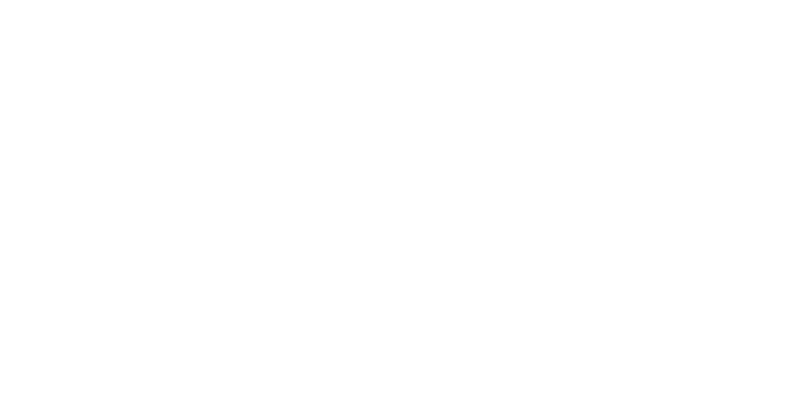

<IPython.core.display.Javascript object>


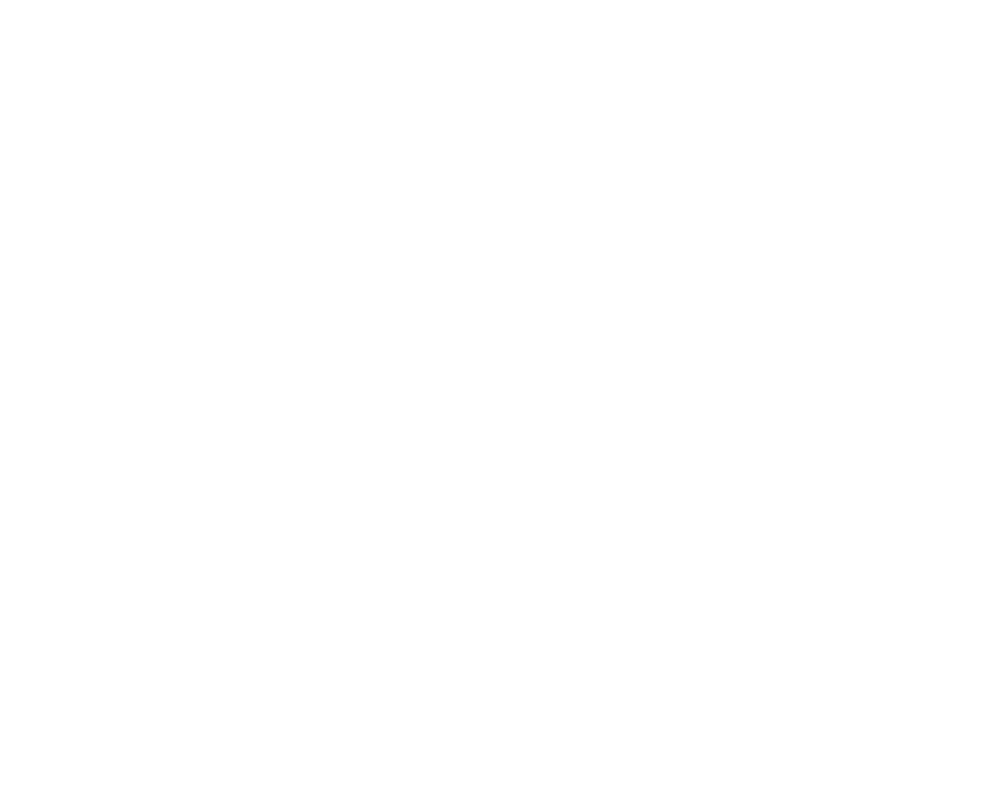

<IPython.core.display.Javascript object>


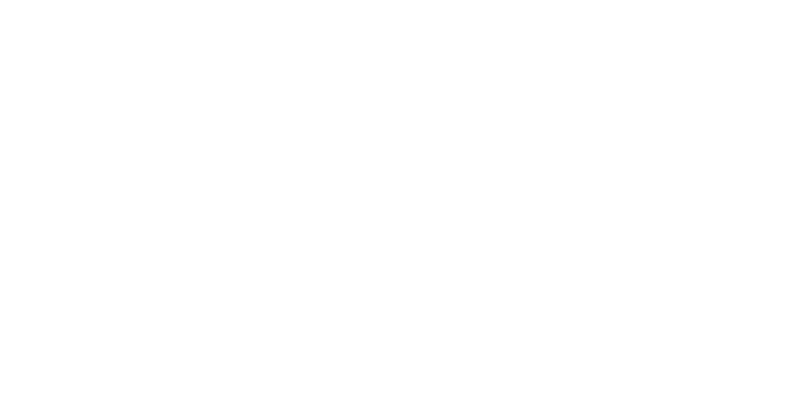

<IPython.core.display.Javascript object>


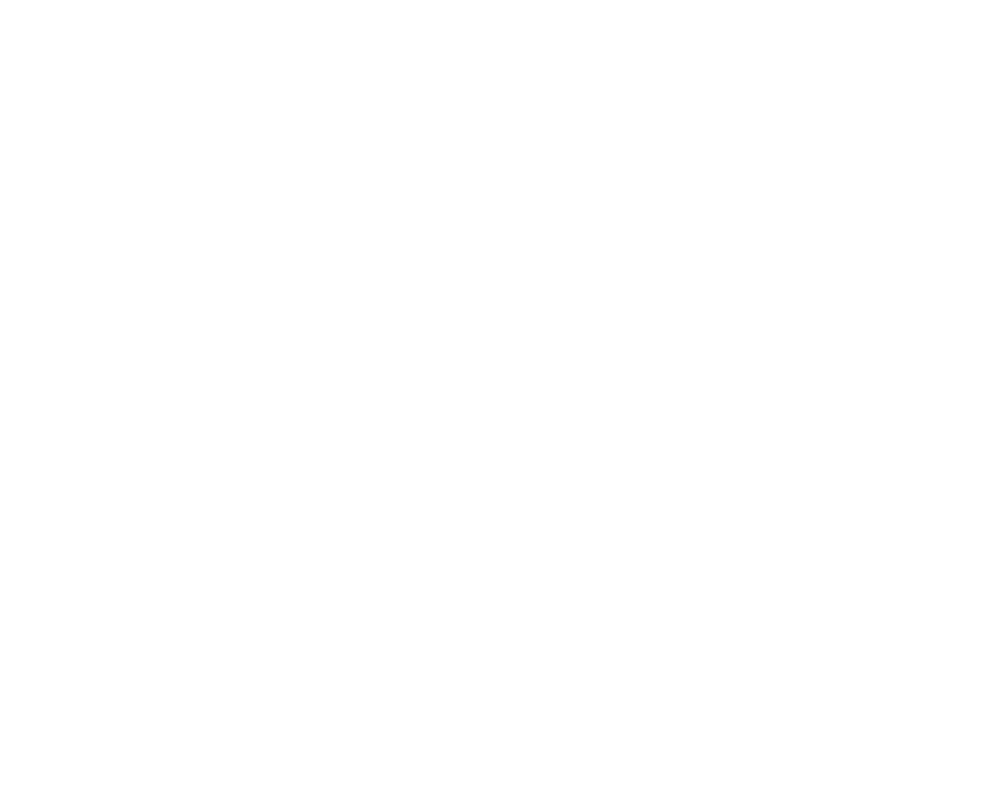

<IPython.core.display.Javascript object>


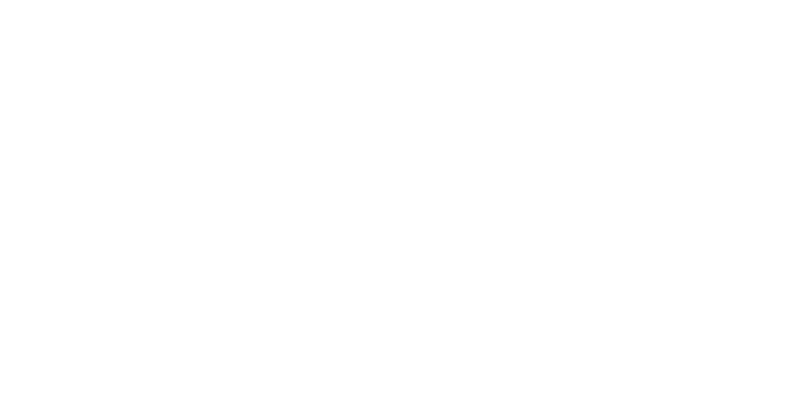

<IPython.core.display.Javascript object>


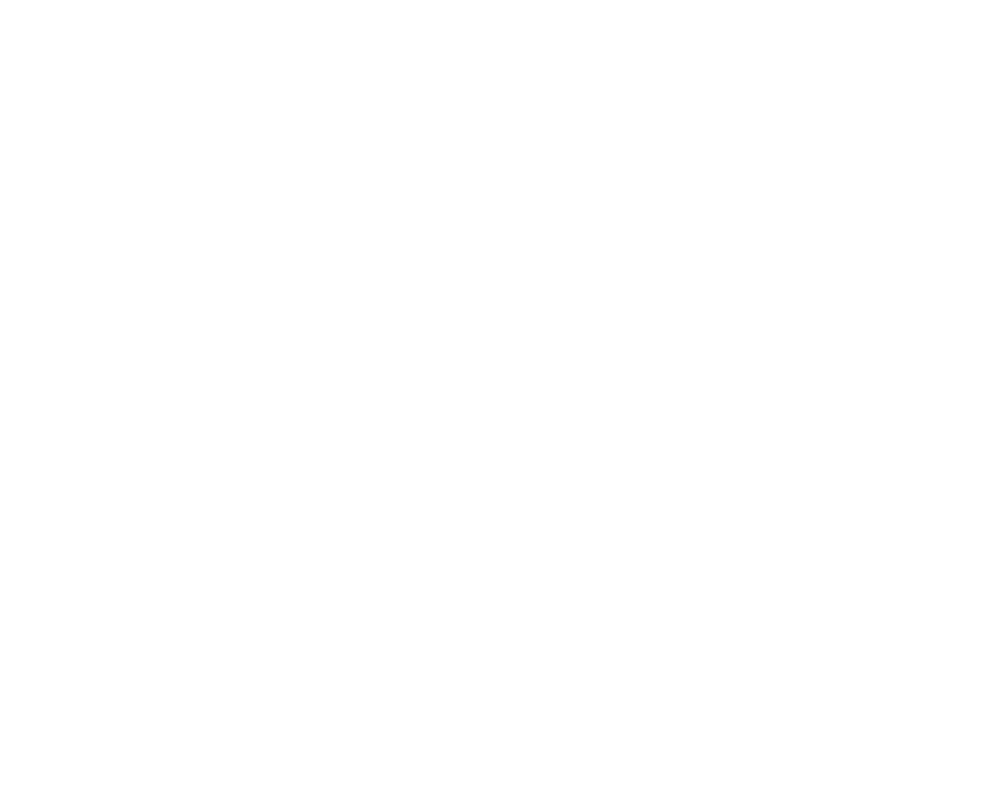

<IPython.core.display.Javascript object>


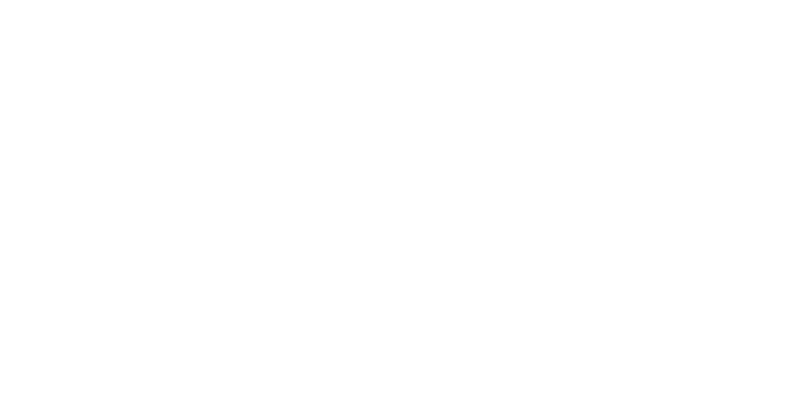

<IPython.core.display.Javascript object>


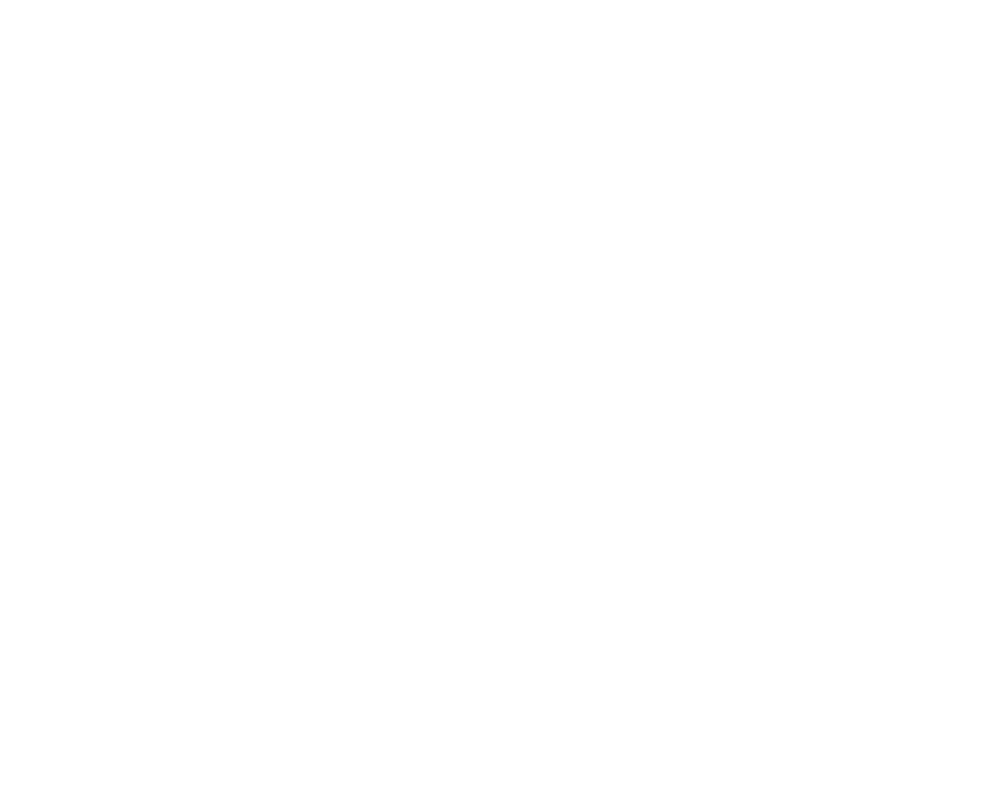

<IPython.core.display.Javascript object>


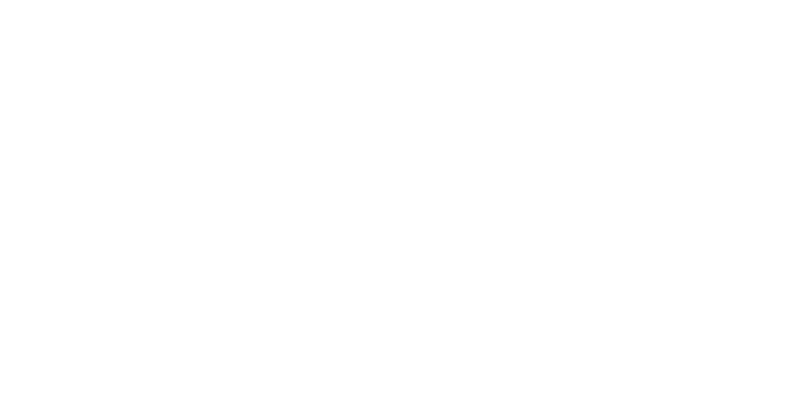

<IPython.core.display.Javascript object>


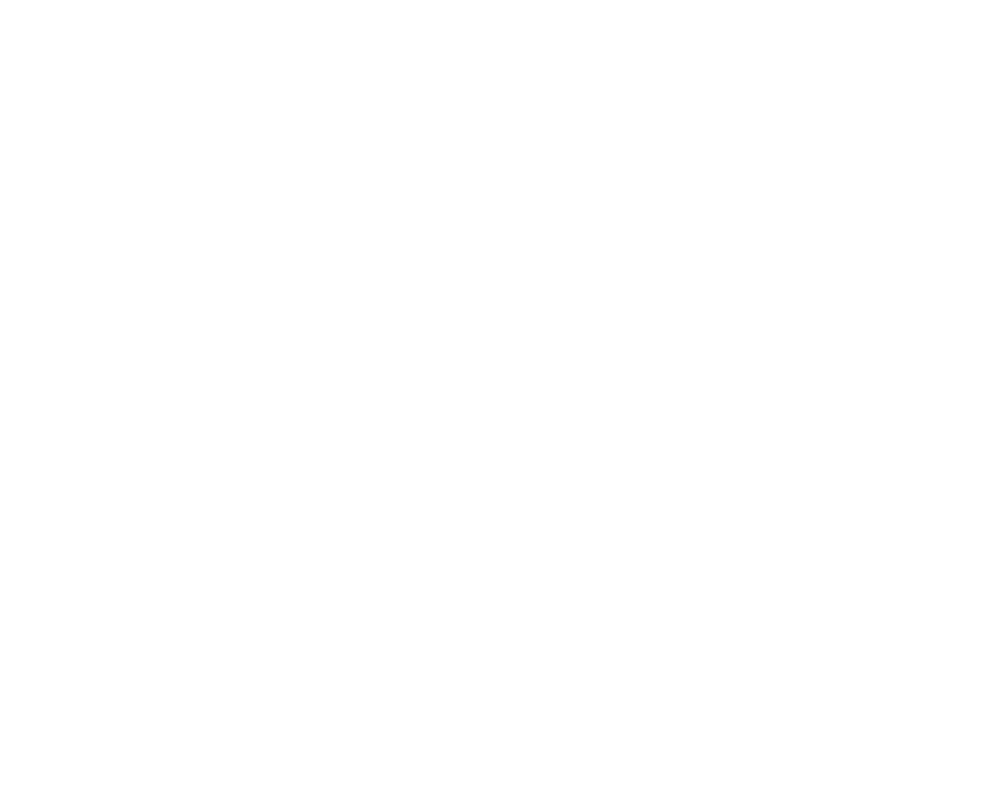

<IPython.core.display.Javascript object>


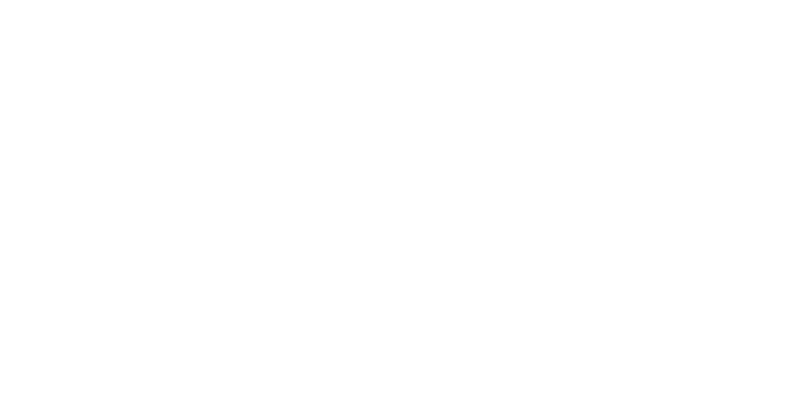

<IPython.core.display.Javascript object>


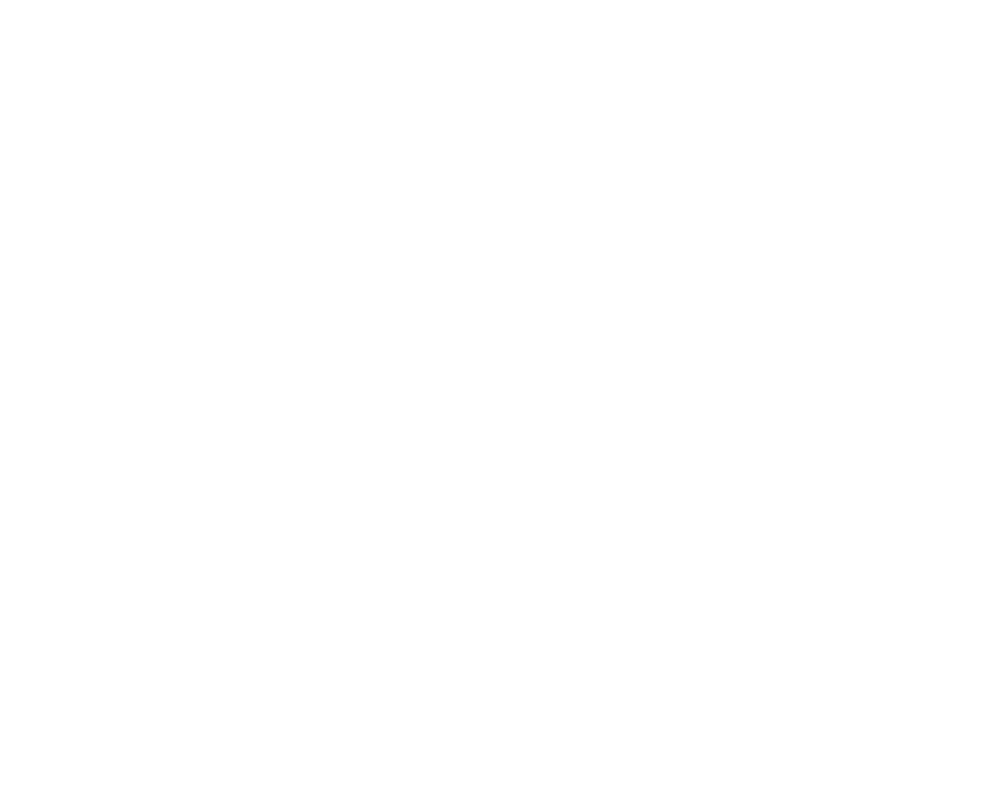

<IPython.core.display.Javascript object>


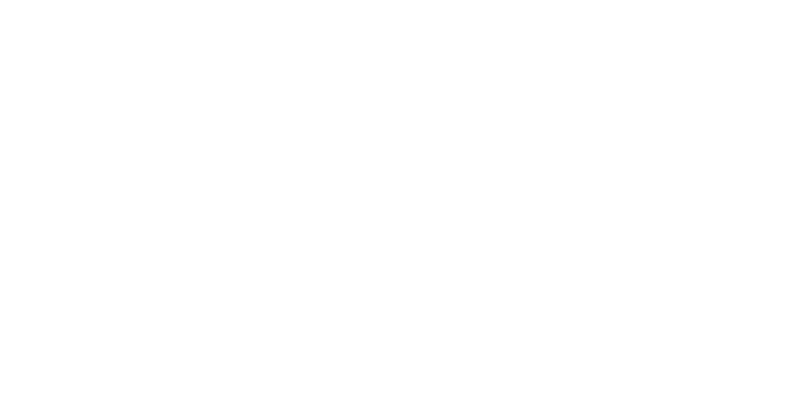

<IPython.core.display.Javascript object>


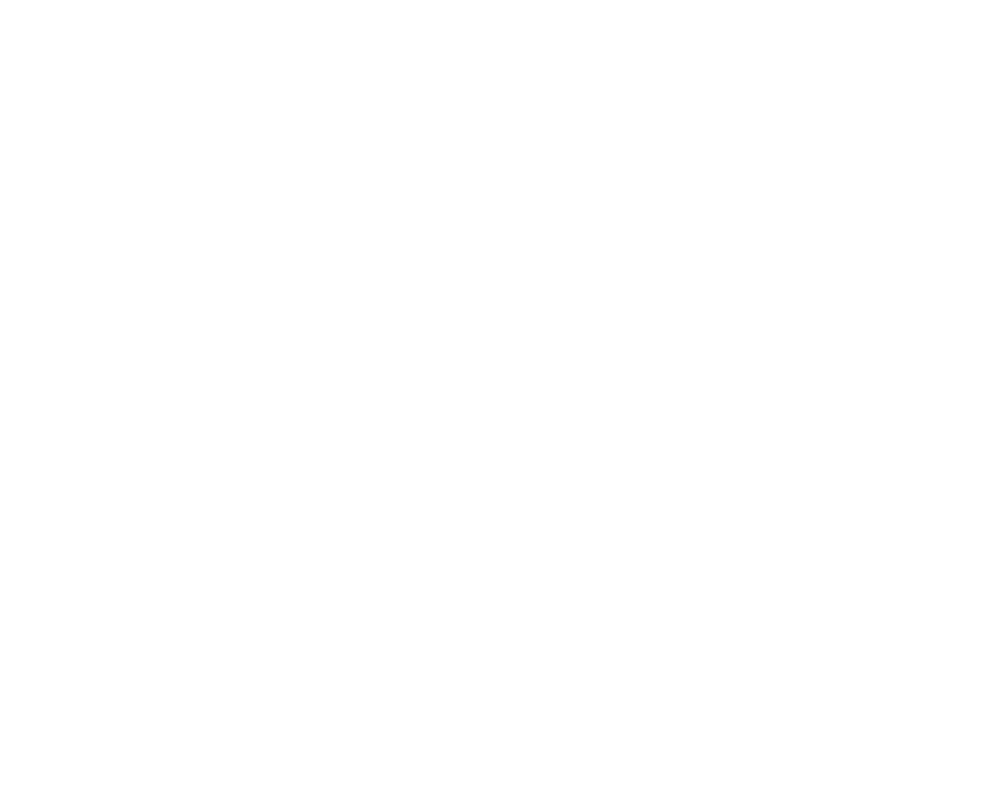

<IPython.core.display.Javascript object>


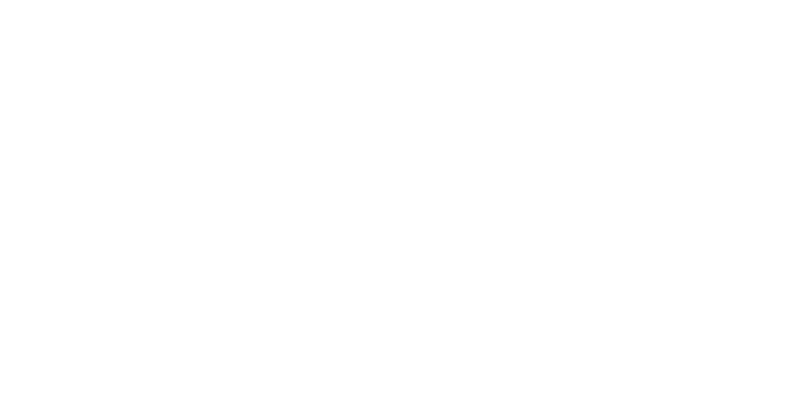

<IPython.core.display.Javascript object>


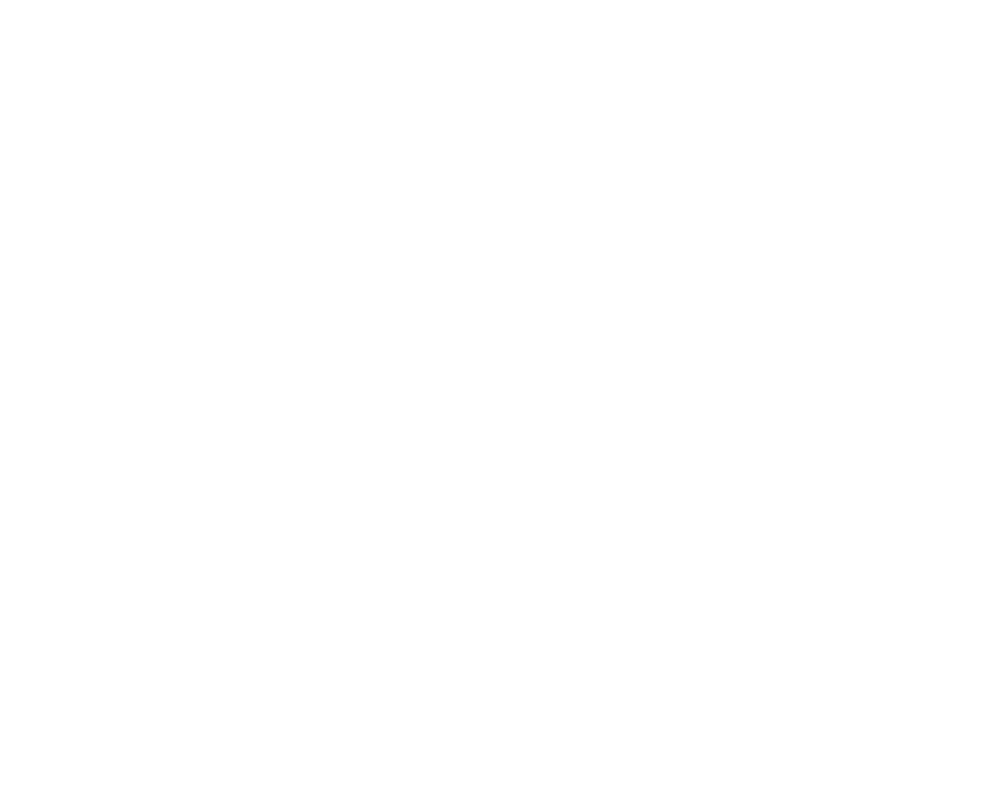

<IPython.core.display.Javascript object>


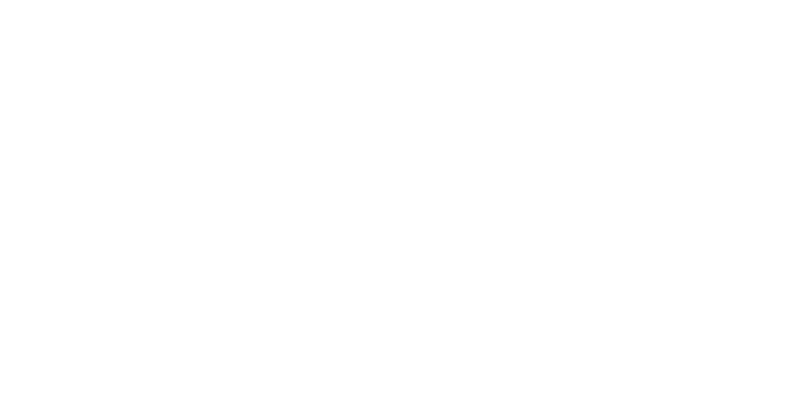

<IPython.core.display.Javascript object>


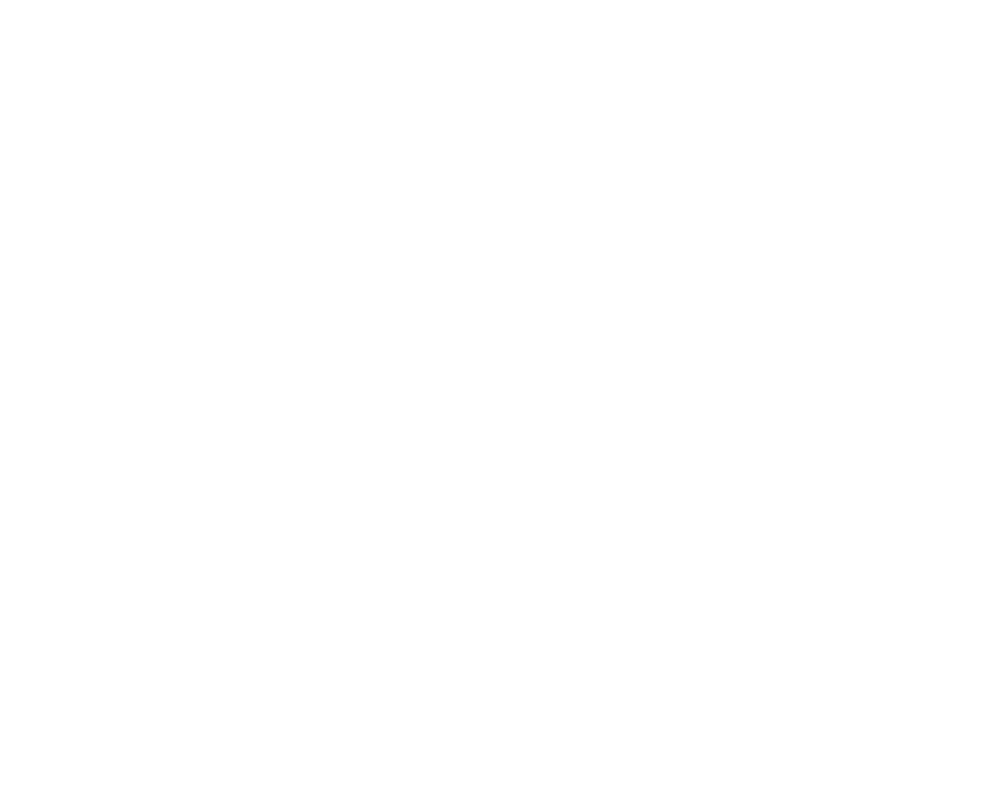

<IPython.core.display.Javascript object>


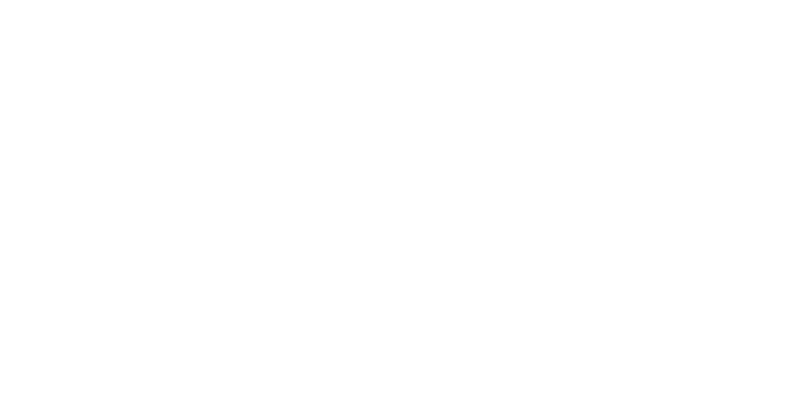

<IPython.core.display.Javascript object>


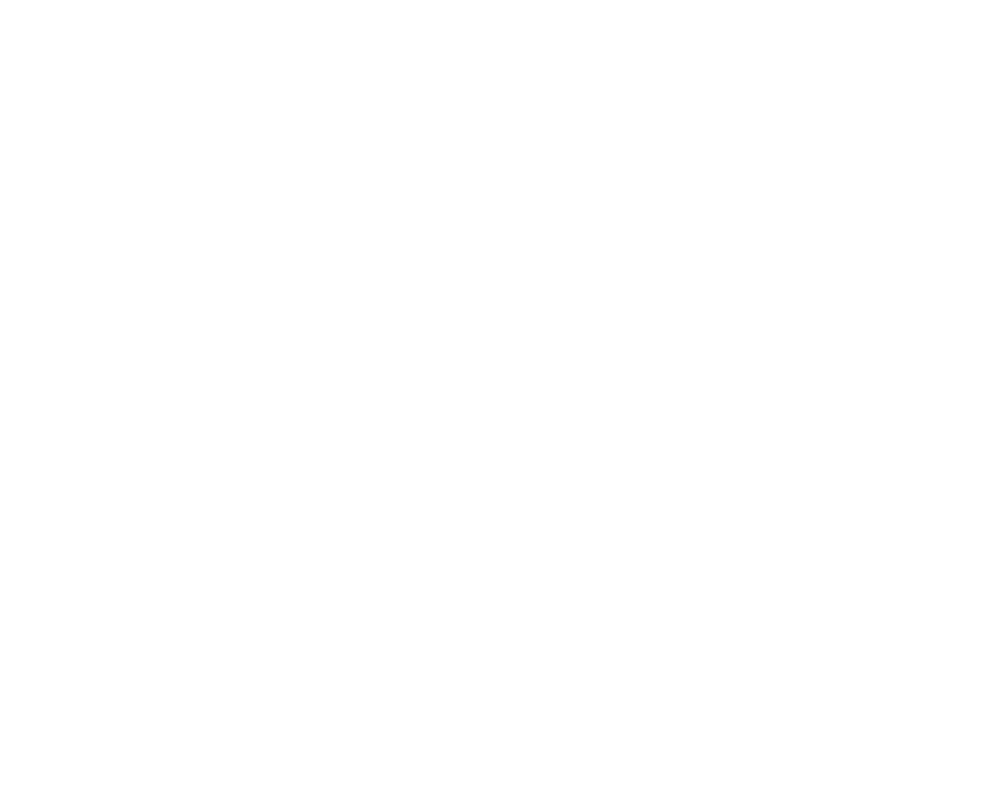

<IPython.core.display.Javascript object>


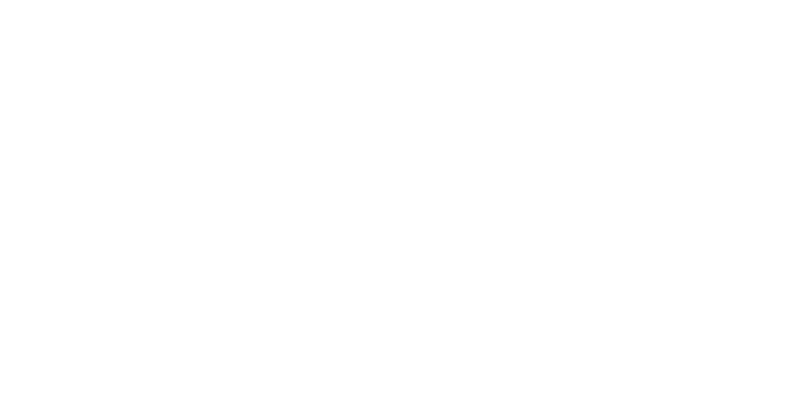

<IPython.core.display.Javascript object>


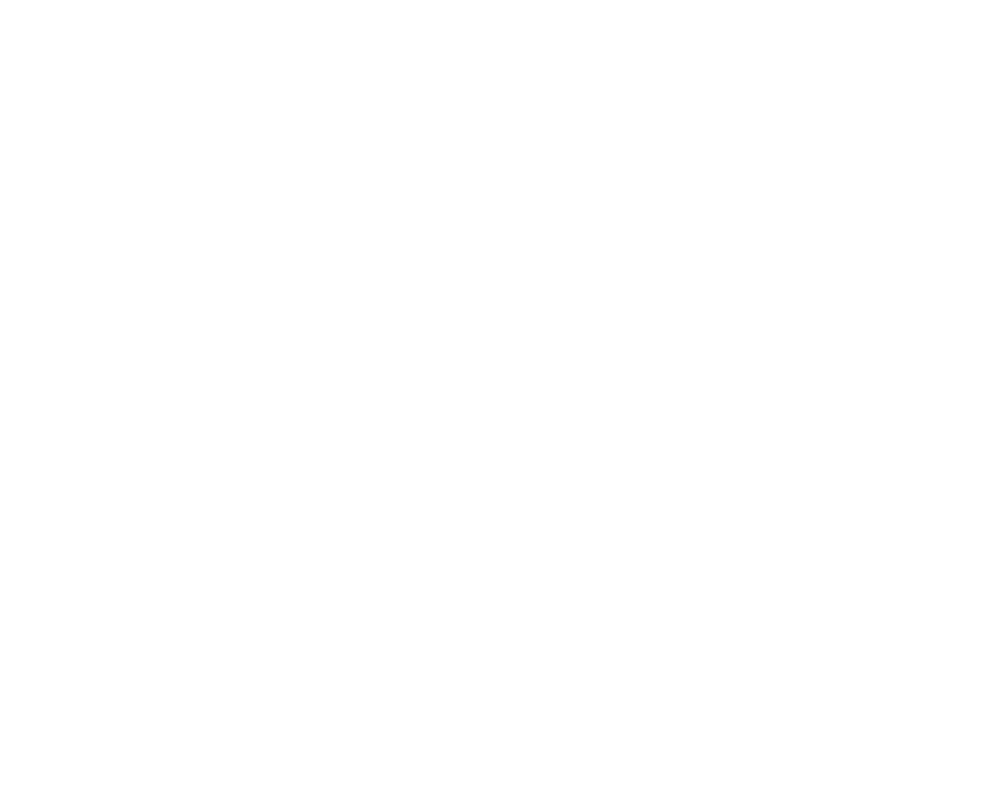

<IPython.core.display.Javascript object>


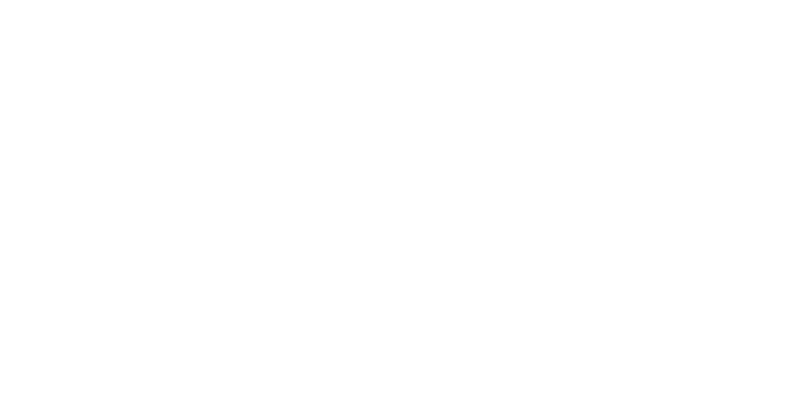

<IPython.core.display.Javascript object>


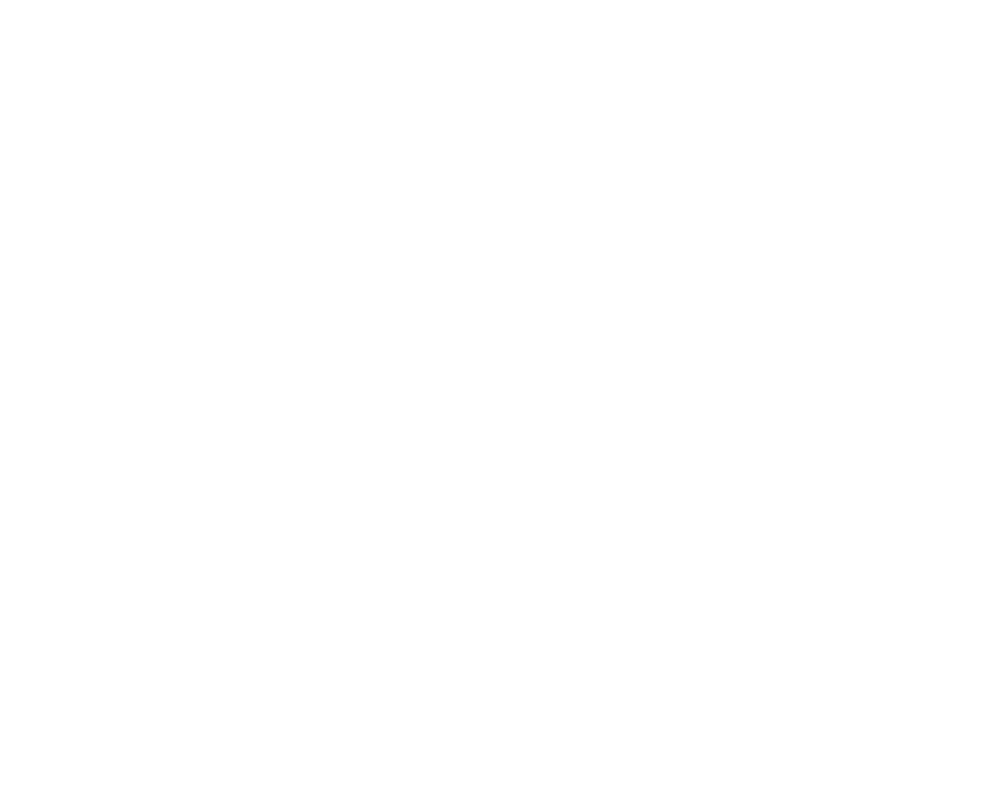

<IPython.core.display.Javascript object>


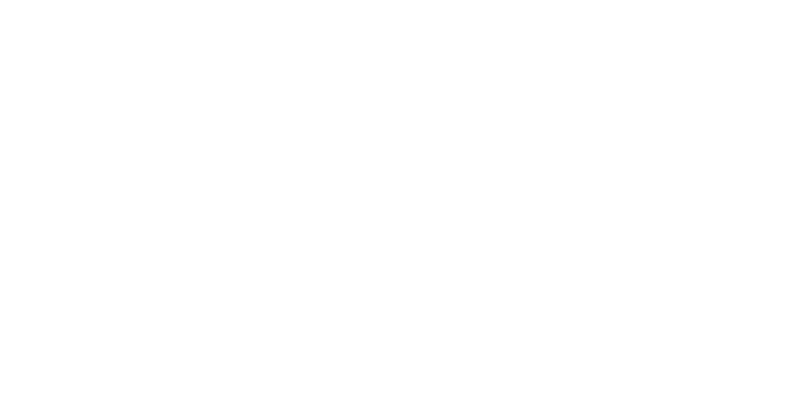

<IPython.core.display.Javascript object>


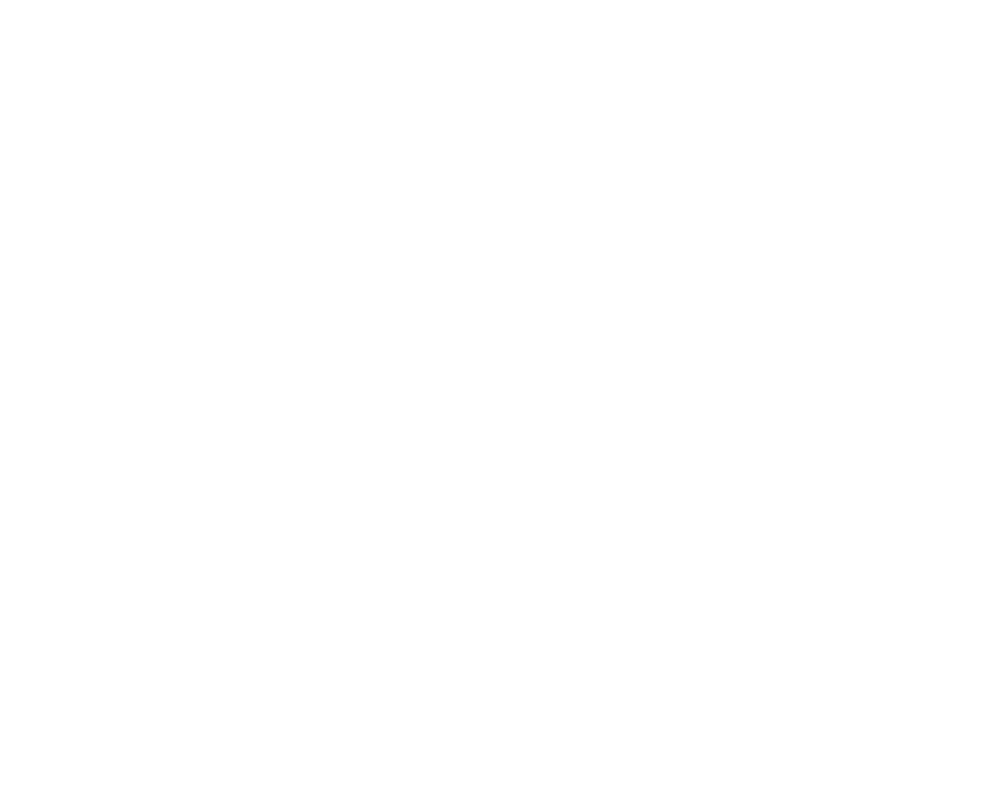

<IPython.core.display.Javascript object>


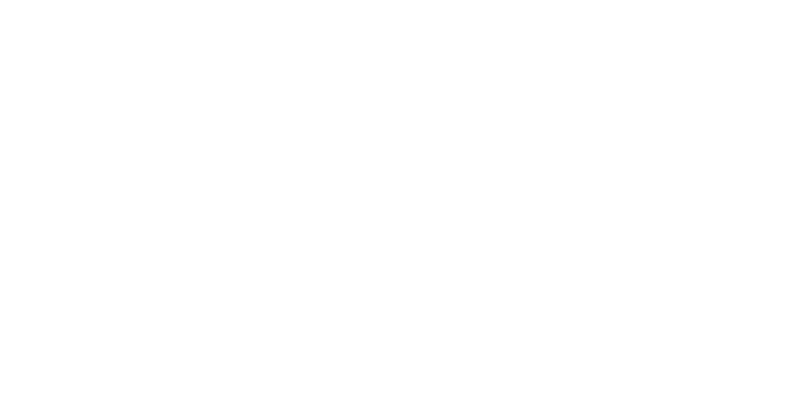

<IPython.core.display.Javascript object>


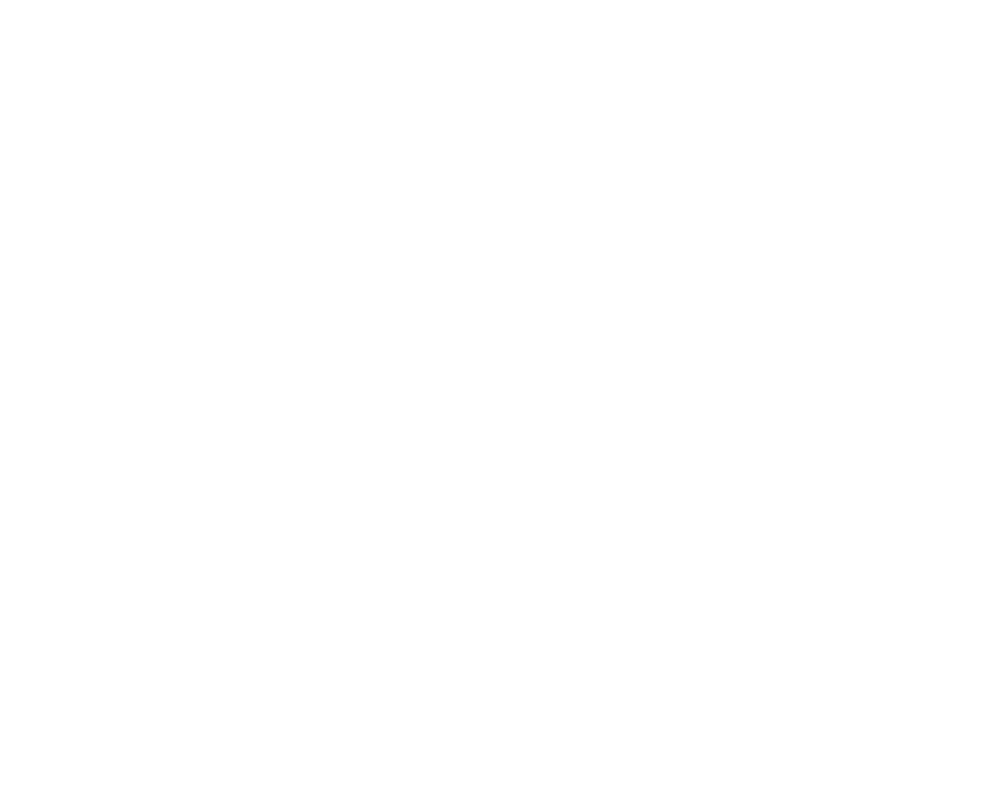

<IPython.core.display.Javascript object>


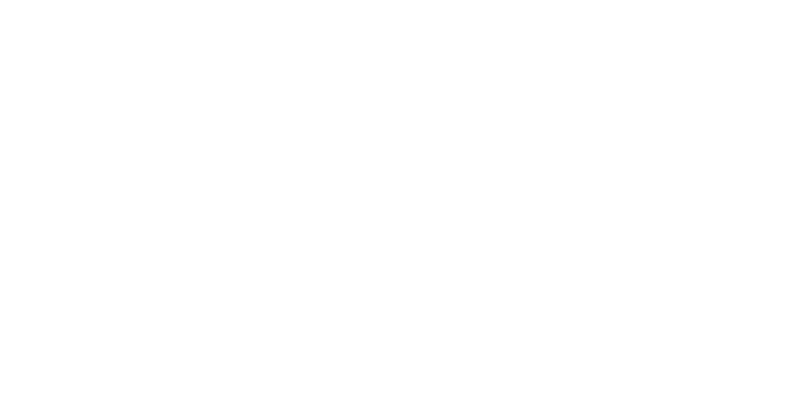

<IPython.core.display.Javascript object>


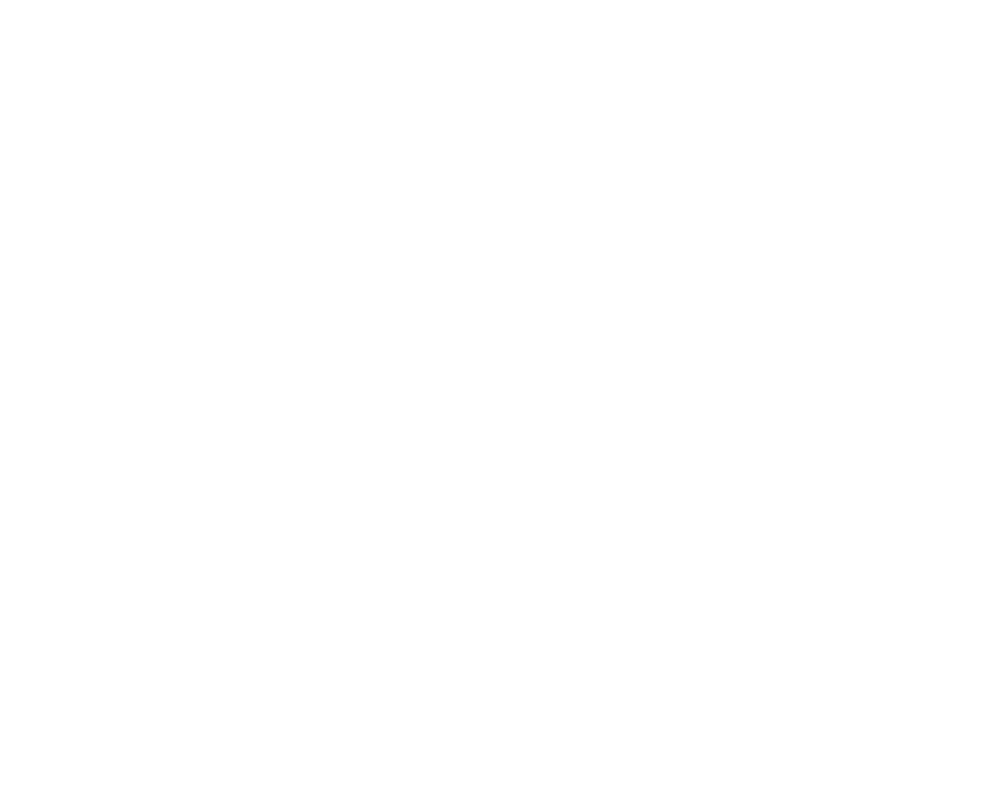

<IPython.core.display.Javascript object>


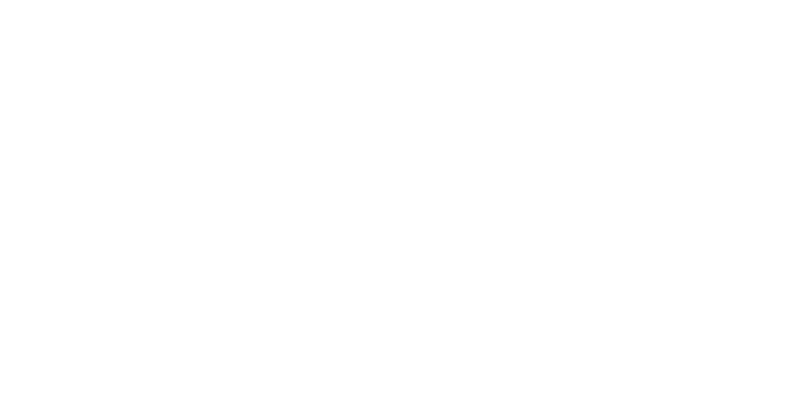

<IPython.core.display.Javascript object>


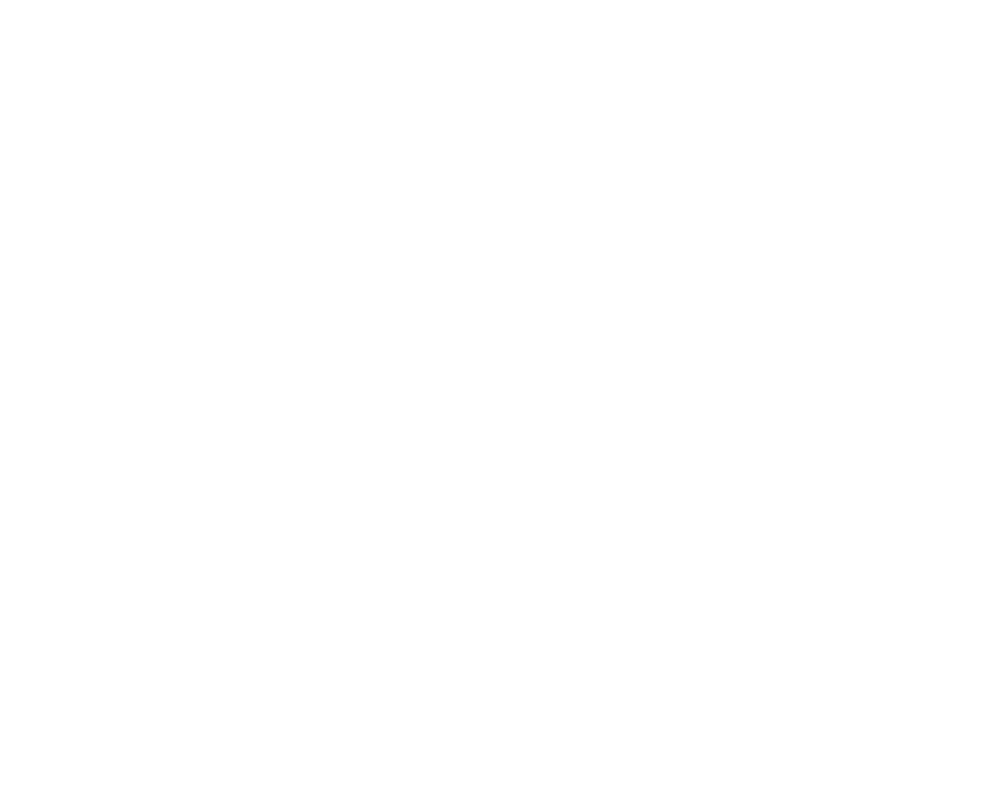

<IPython.core.display.Javascript object>


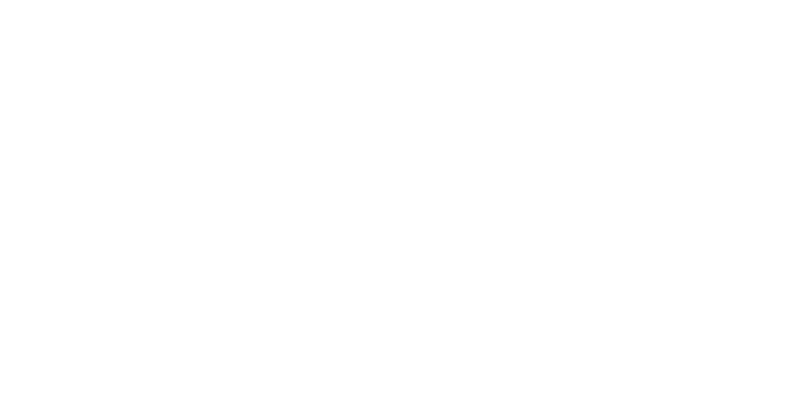

<IPython.core.display.Javascript object>


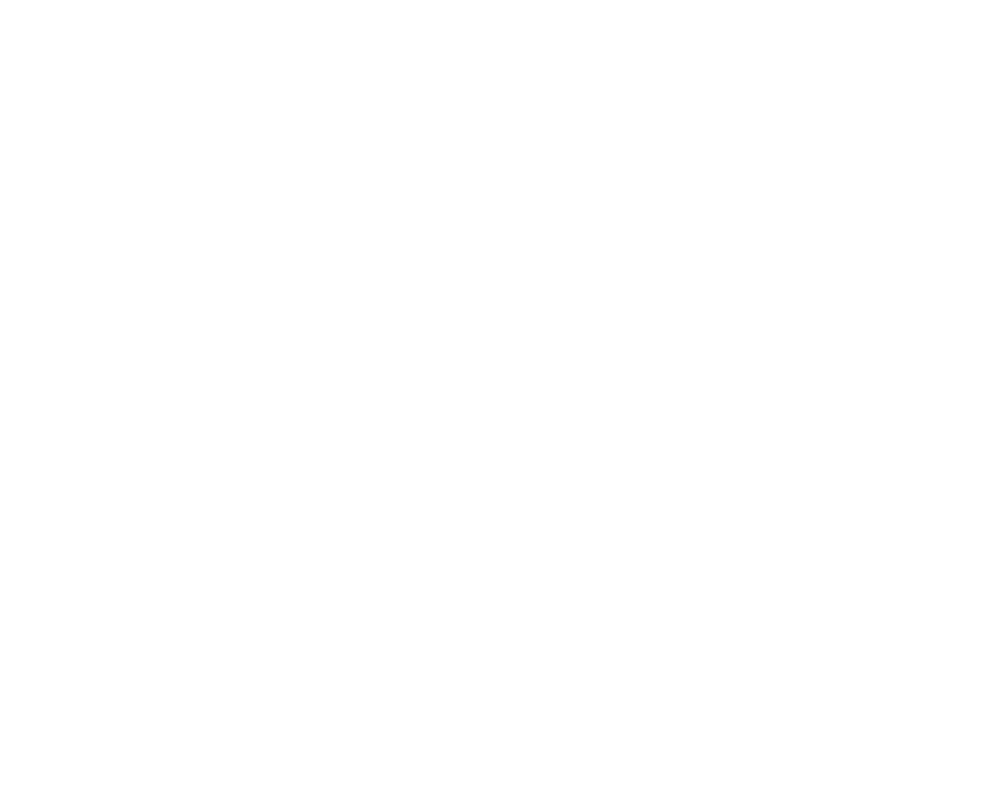

<IPython.core.display.Javascript object>


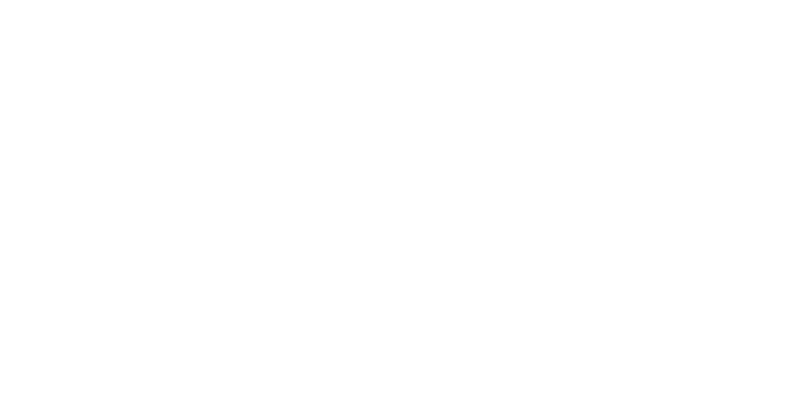

<IPython.core.display.Javascript object>


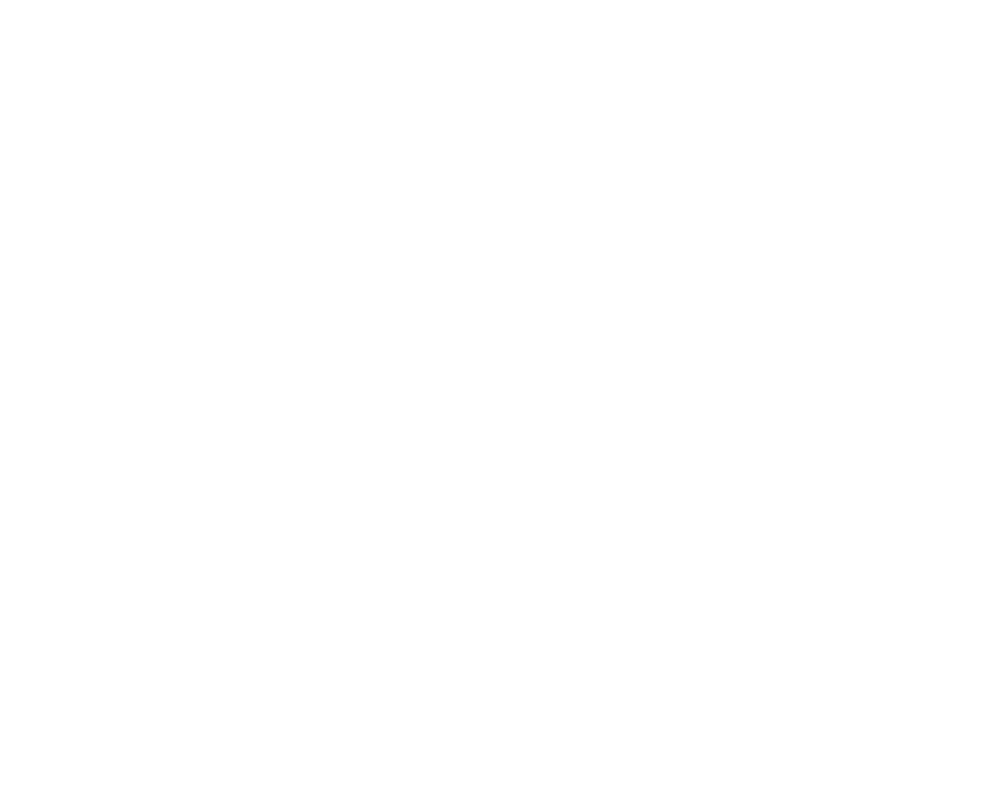

<IPython.core.display.Javascript object>


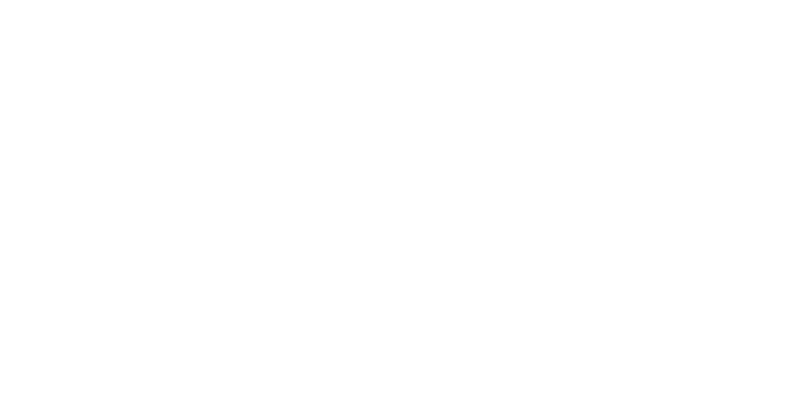

<IPython.core.display.Javascript object>


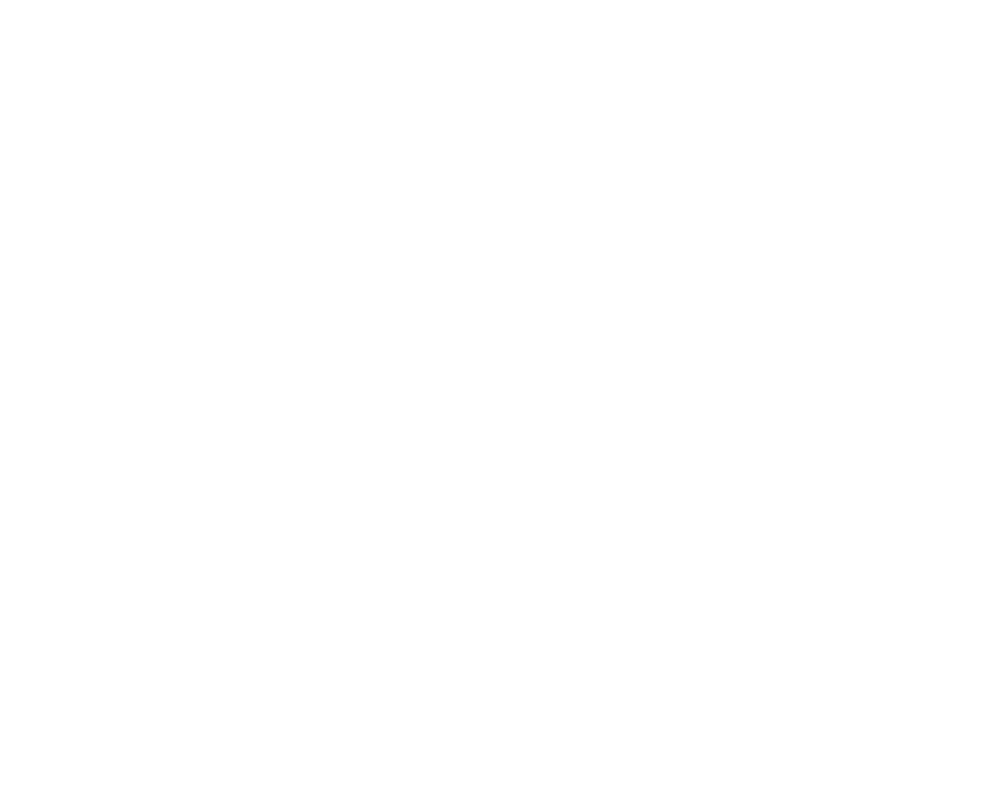

<IPython.core.display.Javascript object>


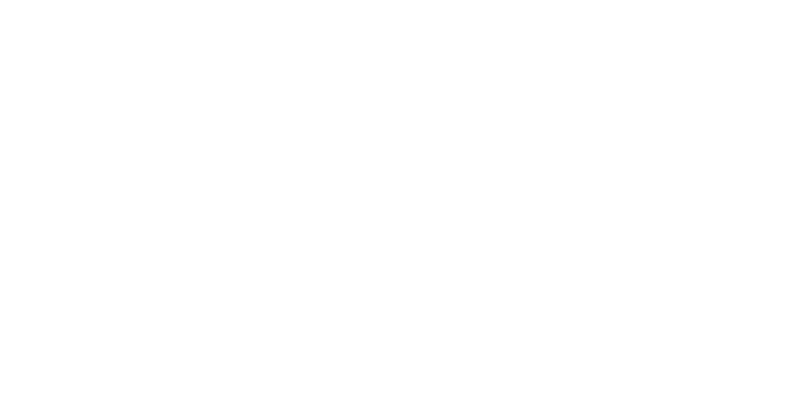

<IPython.core.display.Javascript object>


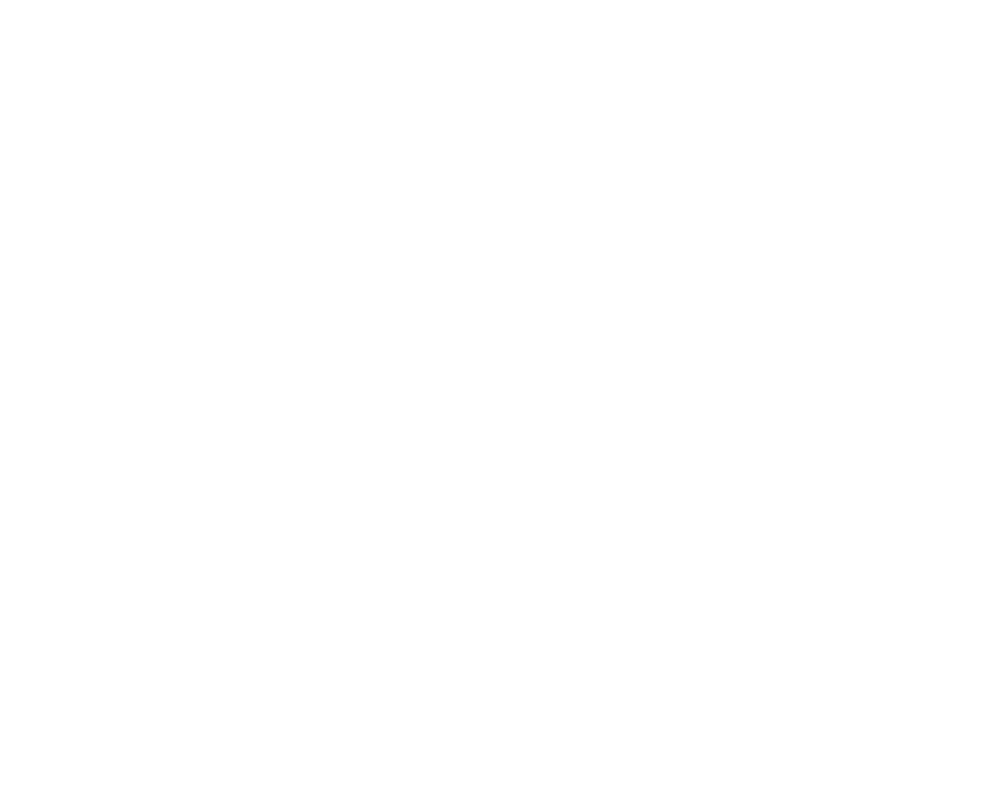

<IPython.core.display.Javascript object>


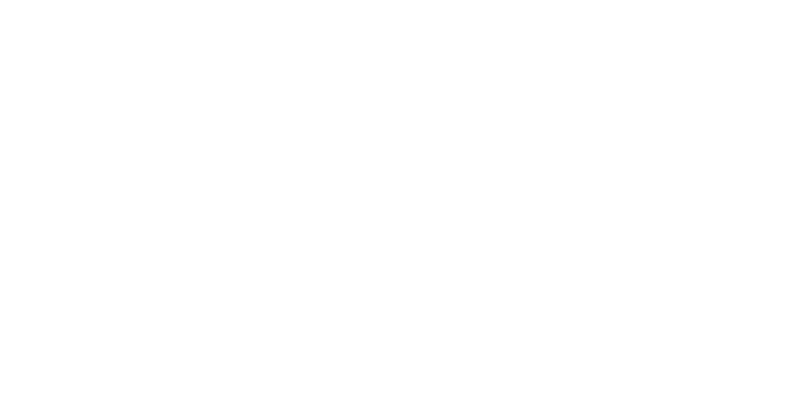

<IPython.core.display.Javascript object>


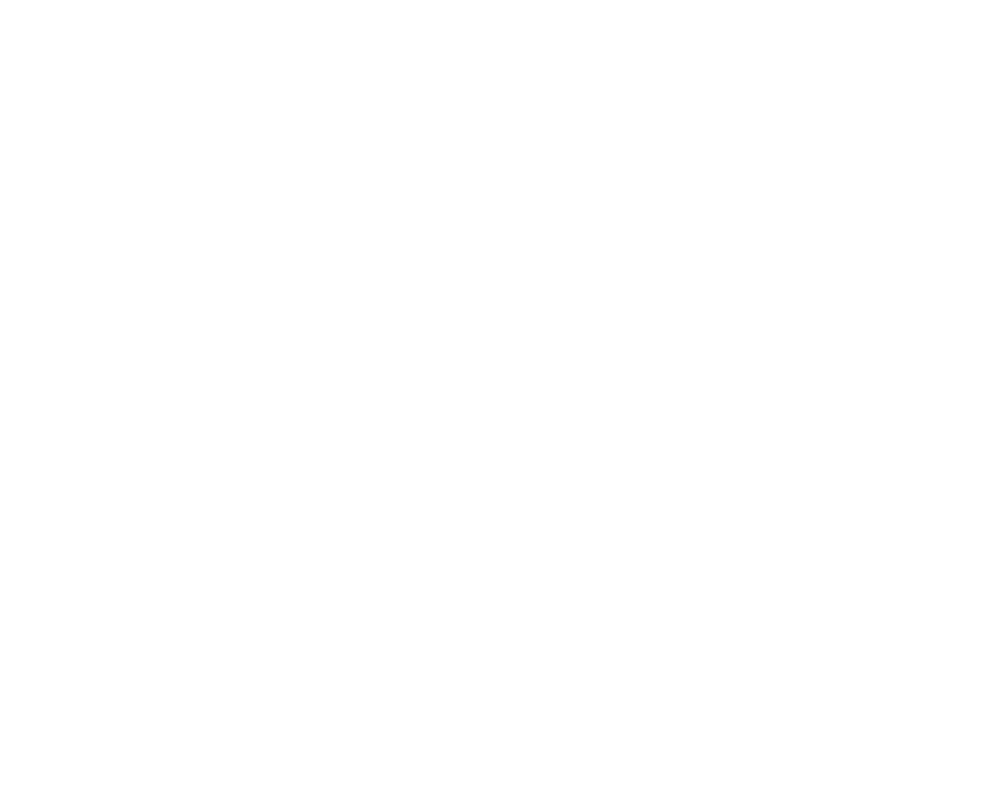

<IPython.core.display.Javascript object>


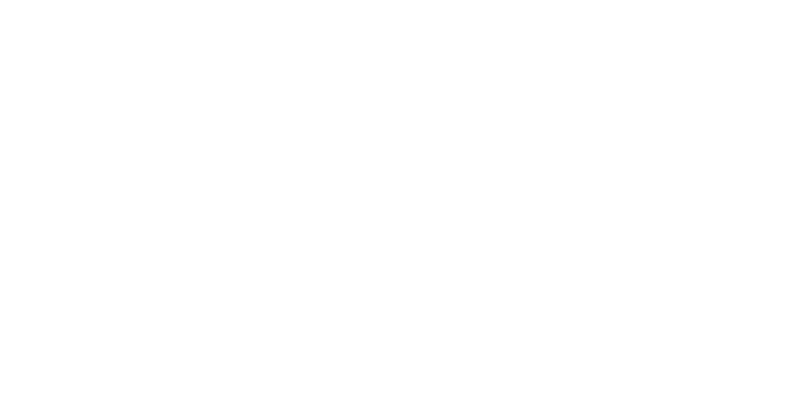

<IPython.core.display.Javascript object>


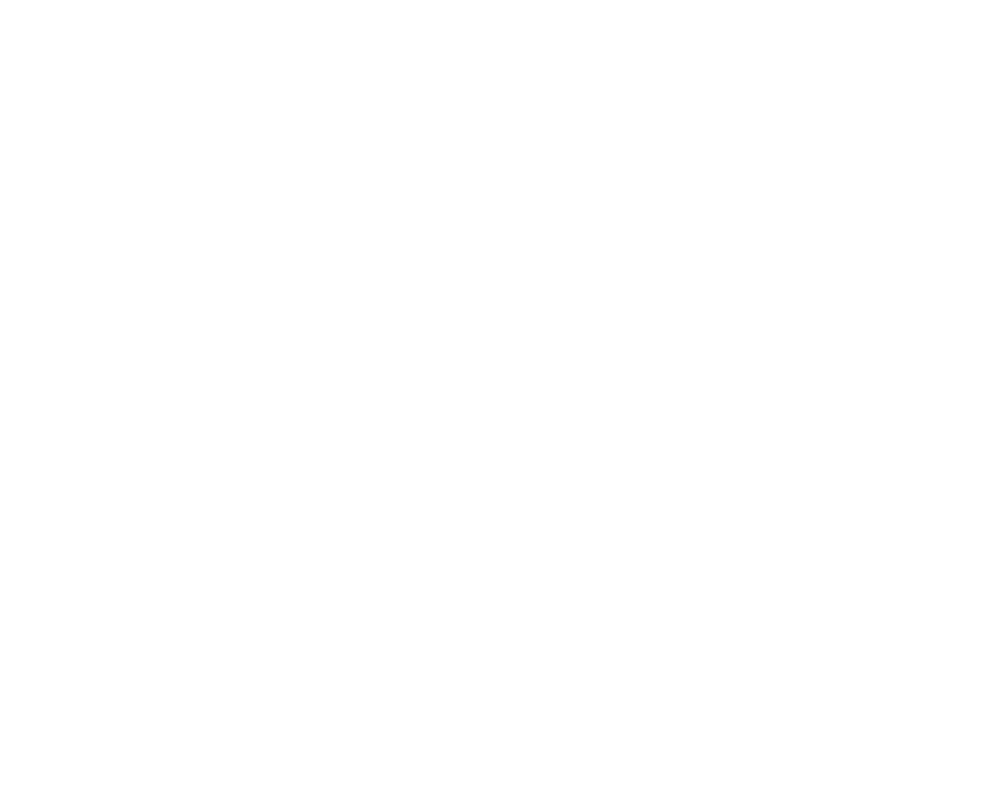

<IPython.core.display.Javascript object>


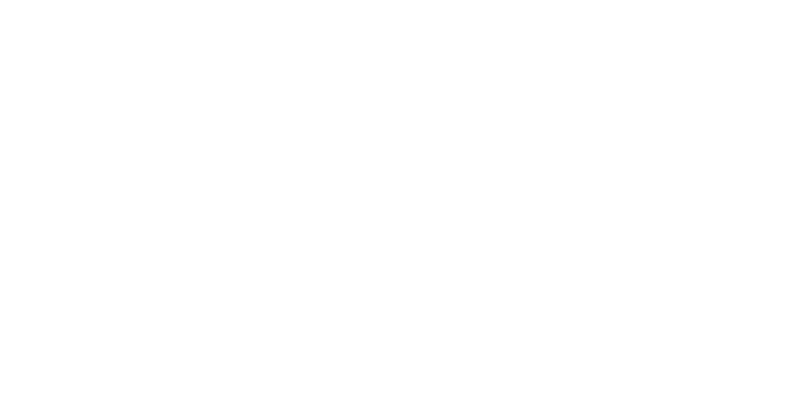

<IPython.core.display.Javascript object>


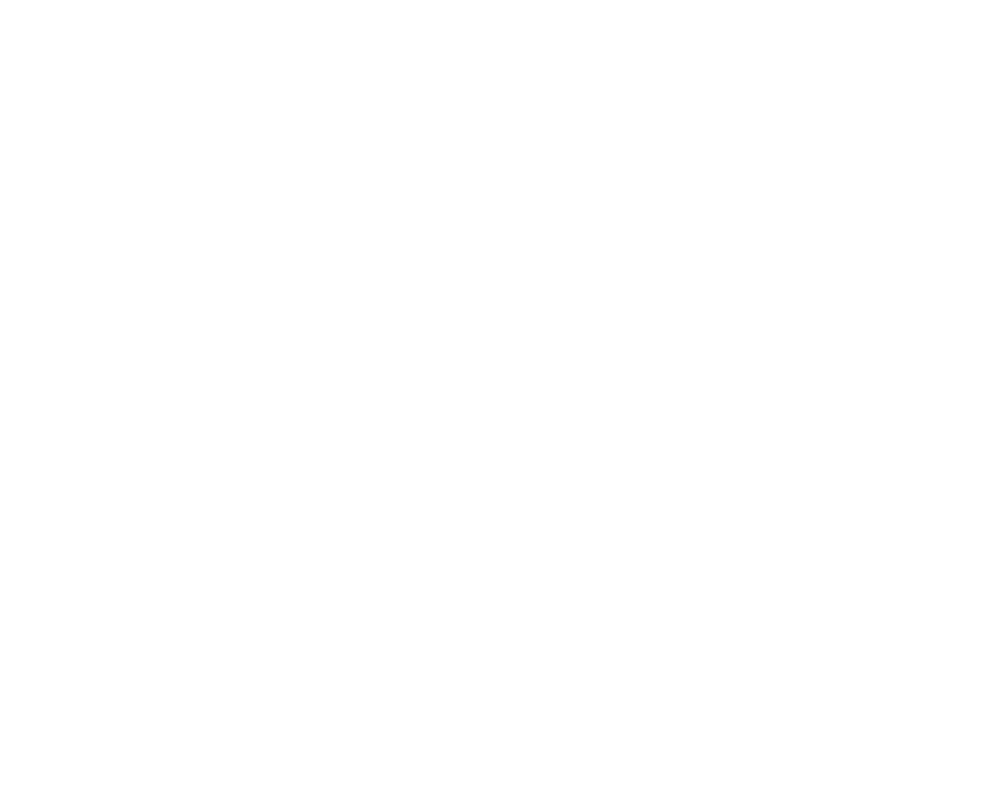

<IPython.core.display.Javascript object>


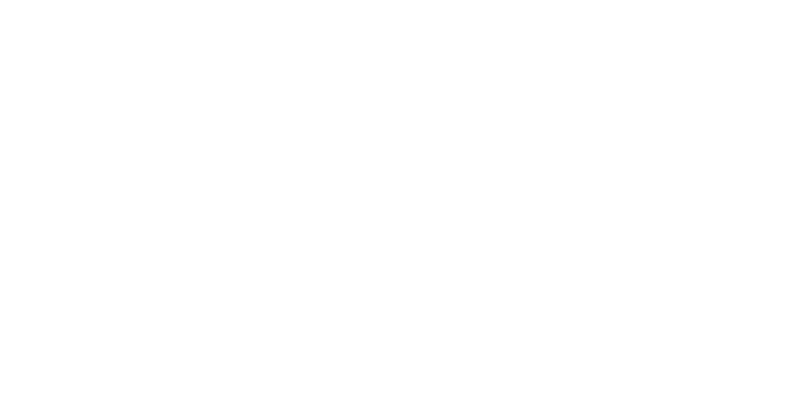

<IPython.core.display.Javascript object>


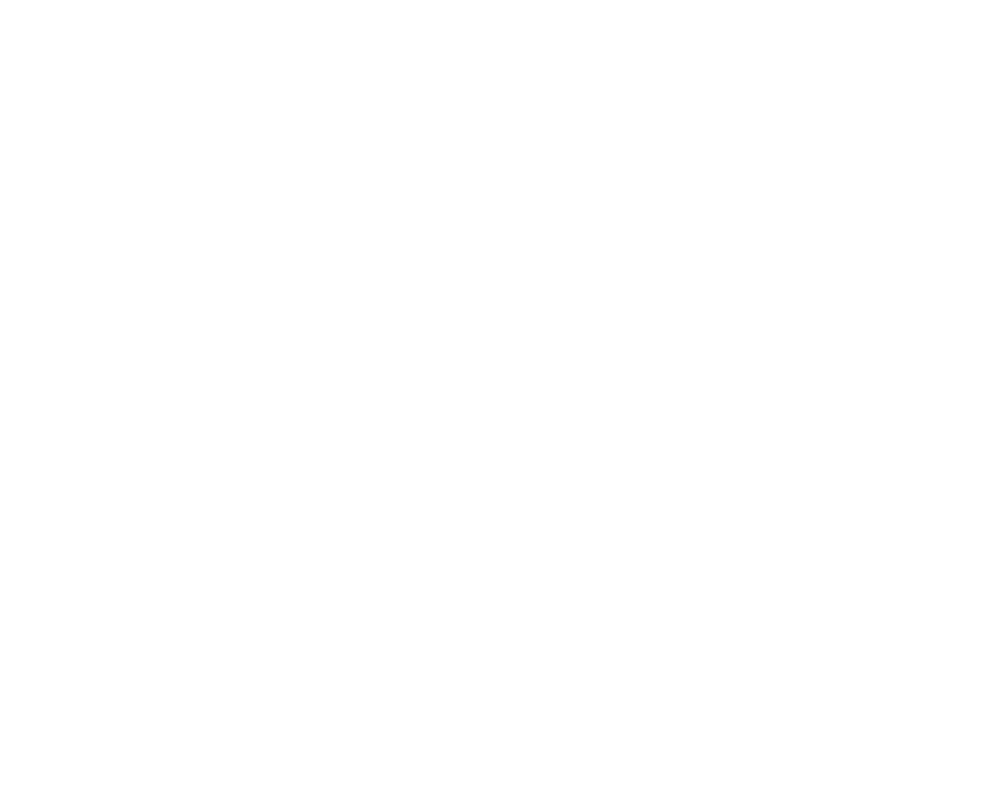

<IPython.core.display.Javascript object>


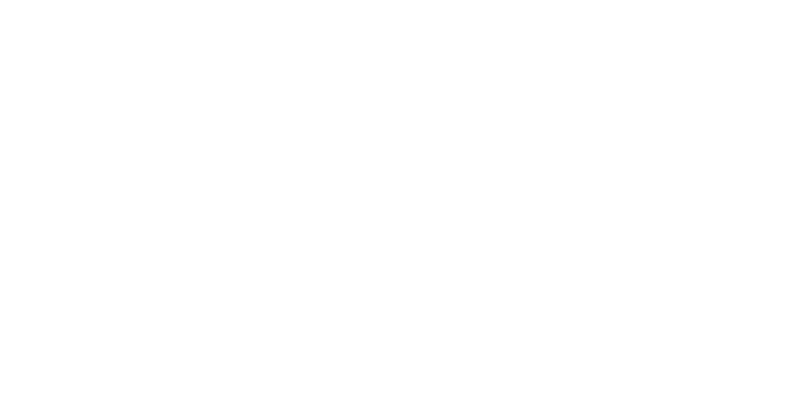

<IPython.core.display.Javascript object>


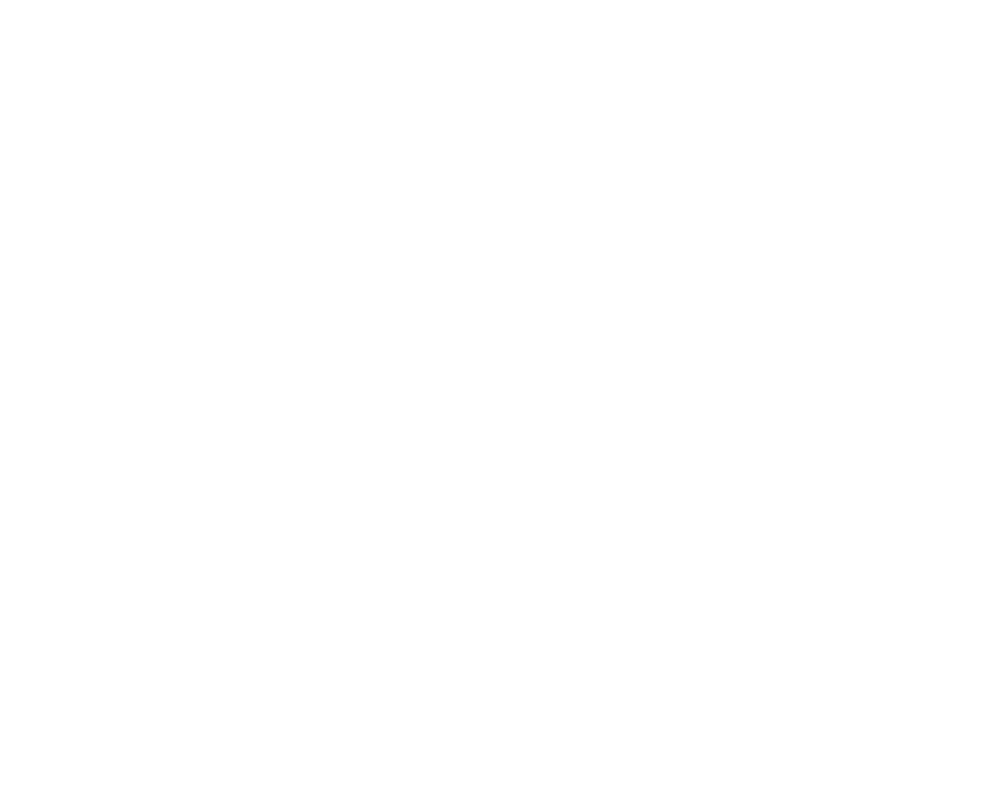

<IPython.core.display.Javascript object>


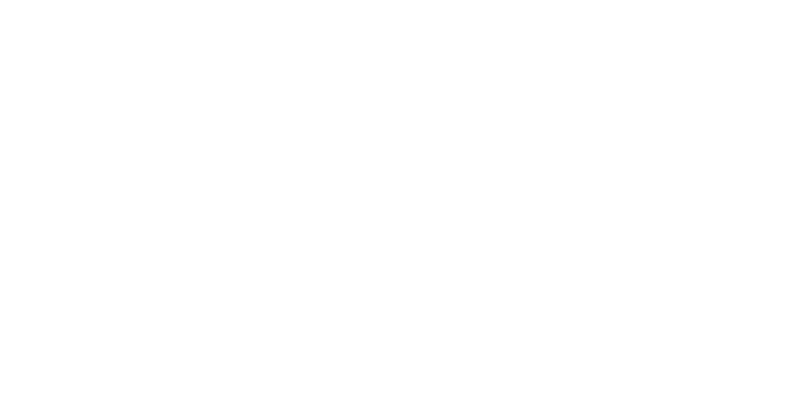

<IPython.core.display.Javascript object>


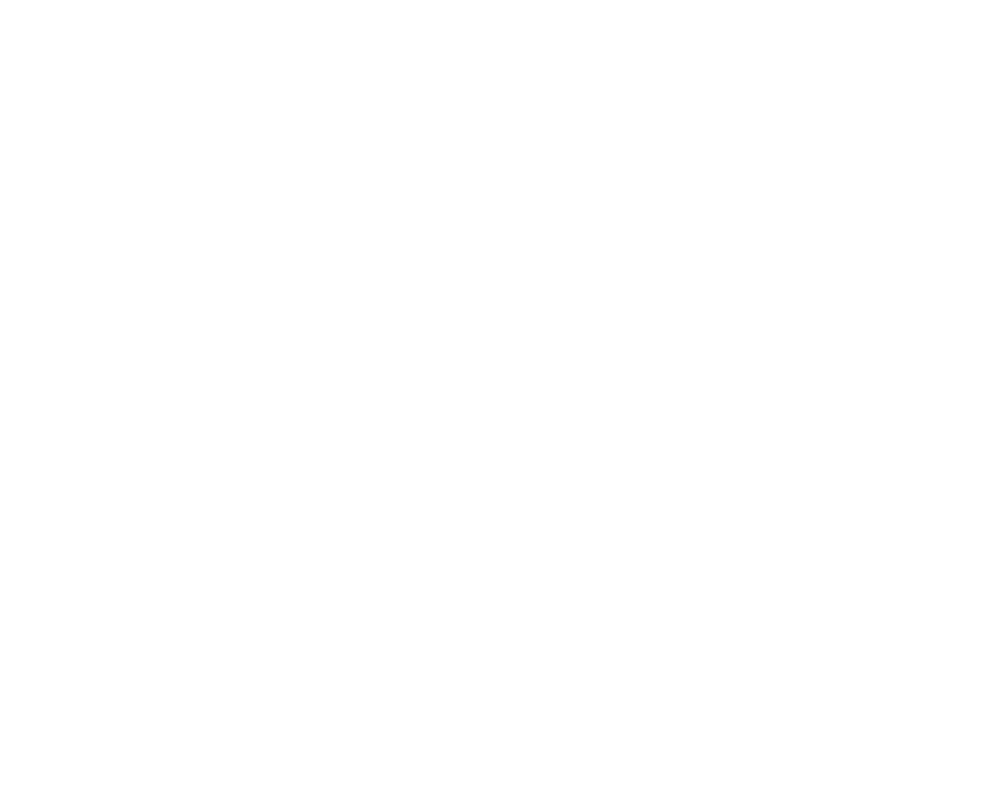

<IPython.core.display.Javascript object>


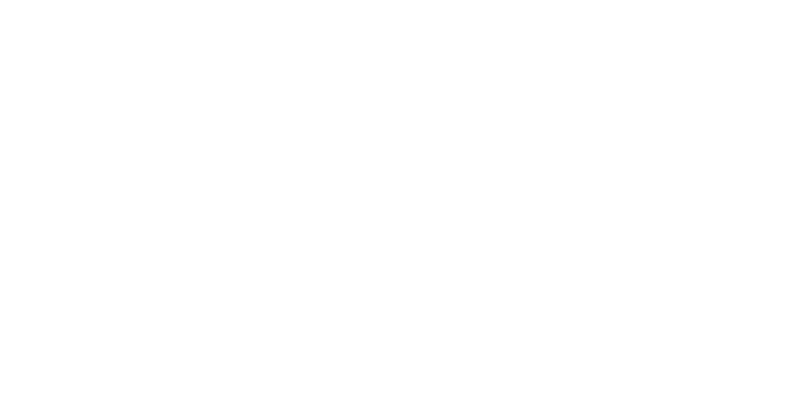

<IPython.core.display.Javascript object>


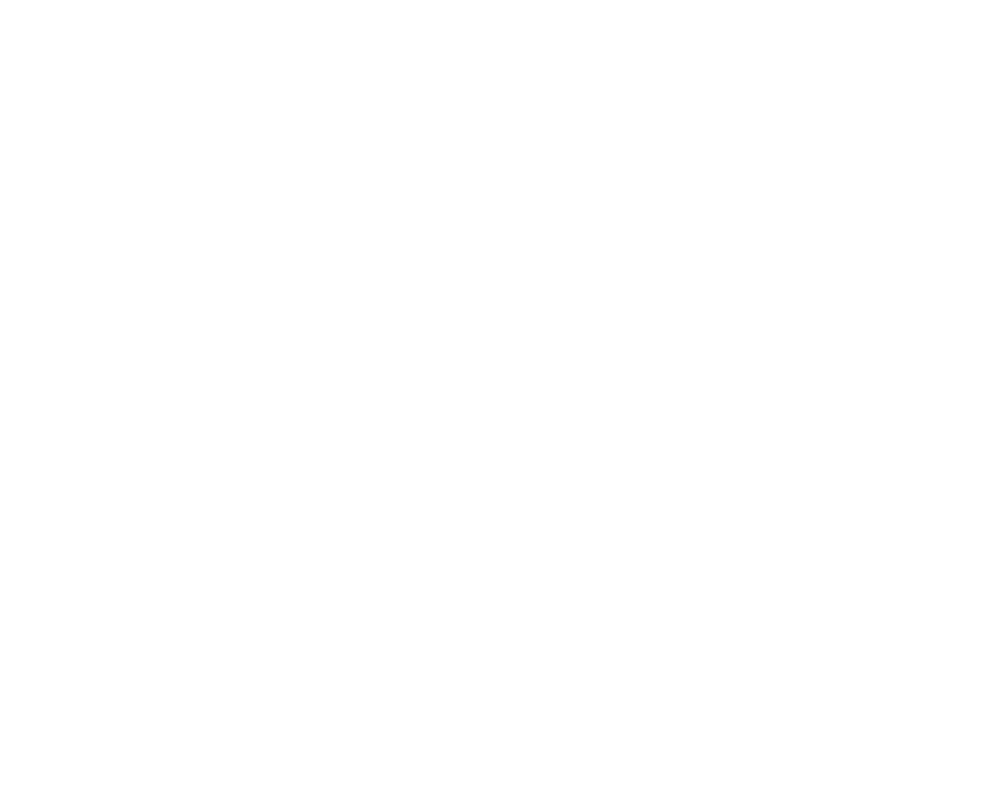

<IPython.core.display.Javascript object>


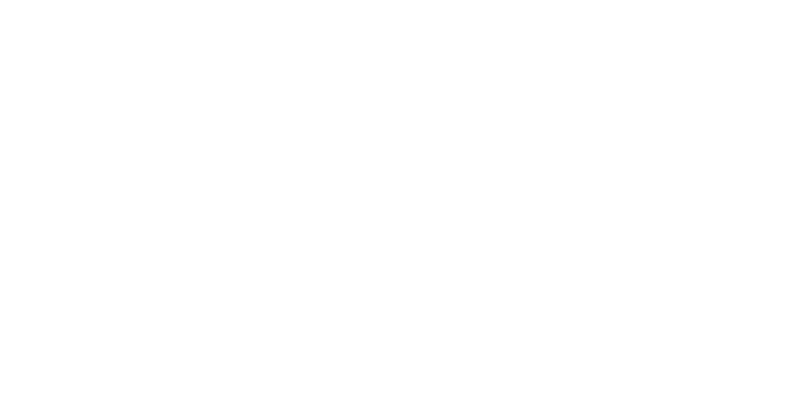

<IPython.core.display.Javascript object>


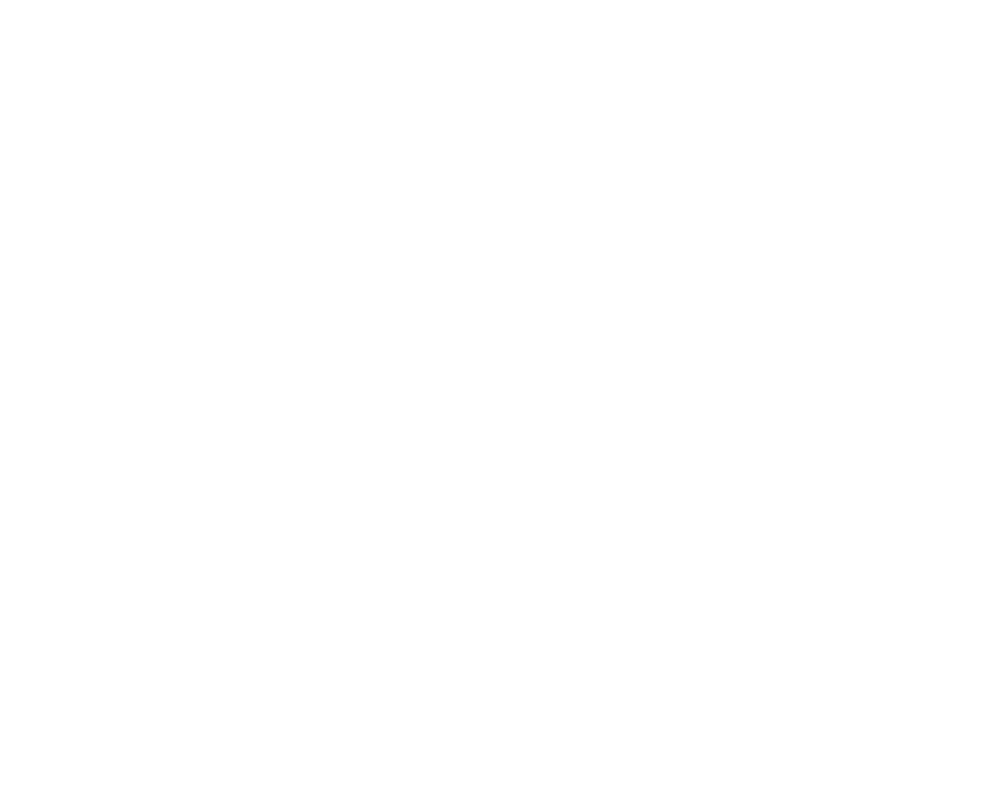

<IPython.core.display.Javascript object>


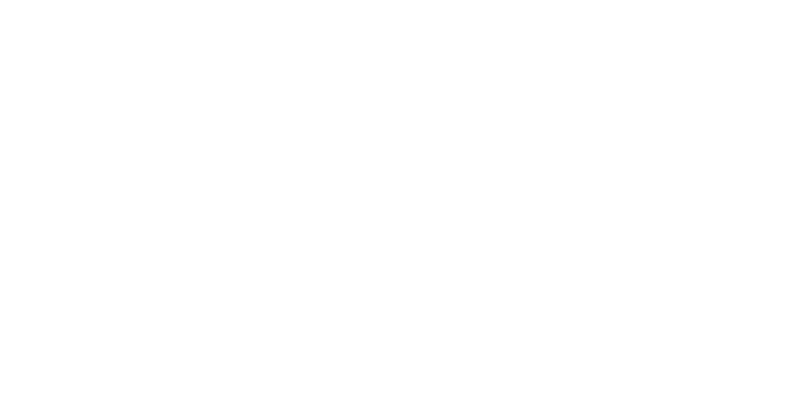

<IPython.core.display.Javascript object>


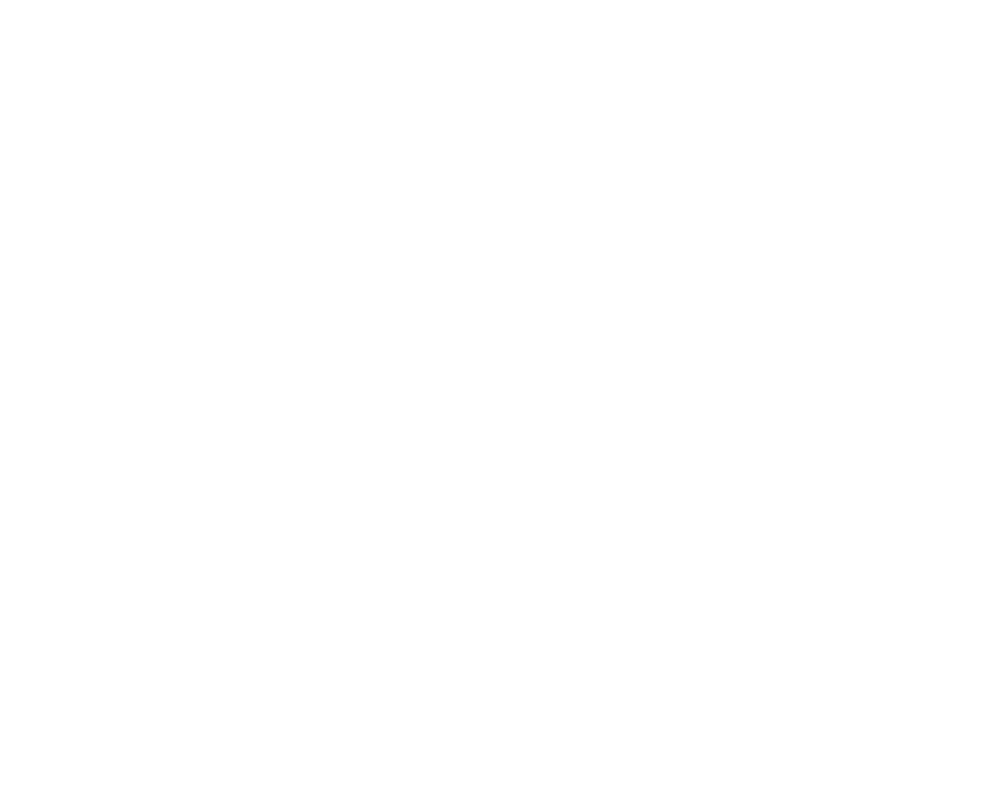

<IPython.core.display.Javascript object>


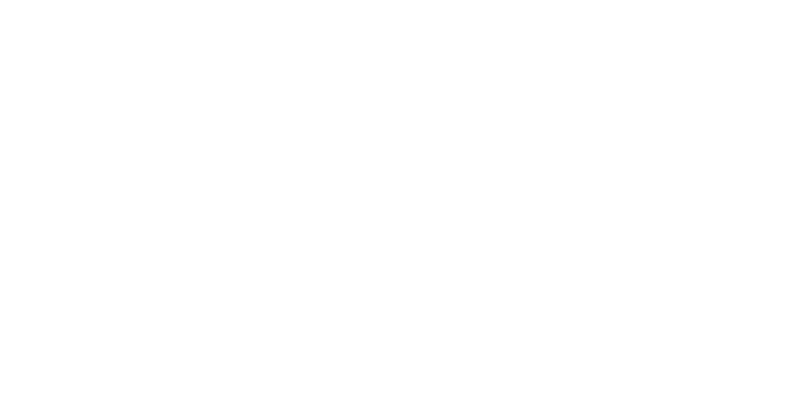

<IPython.core.display.Javascript object>


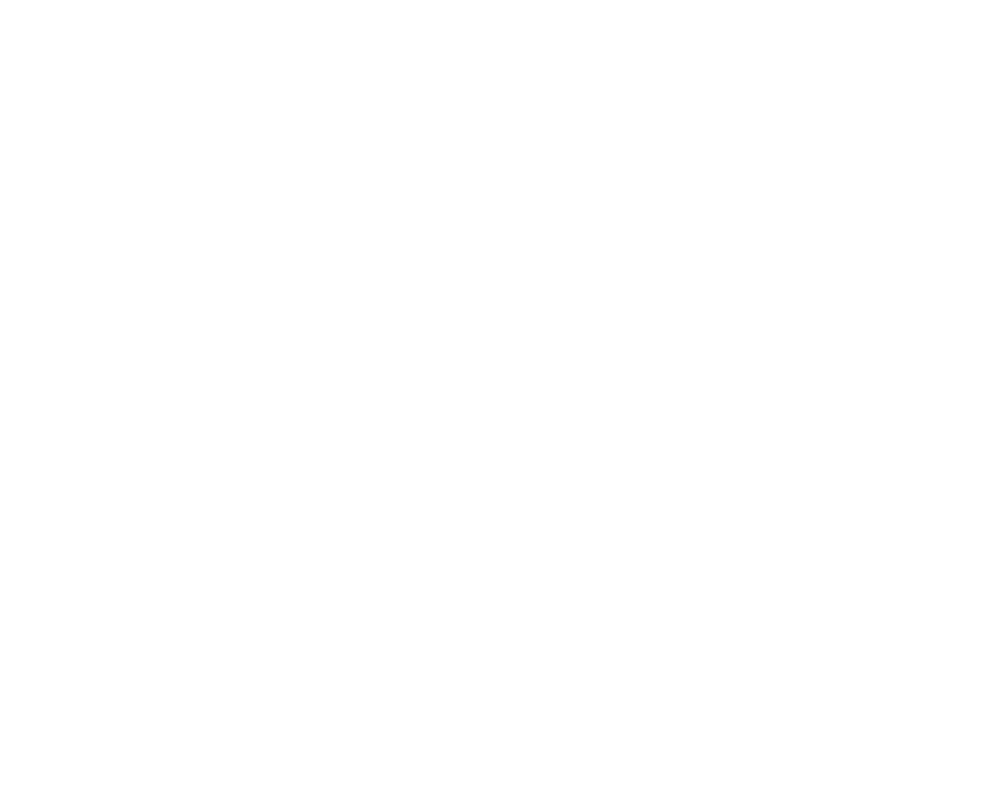

<IPython.core.display.Javascript object>


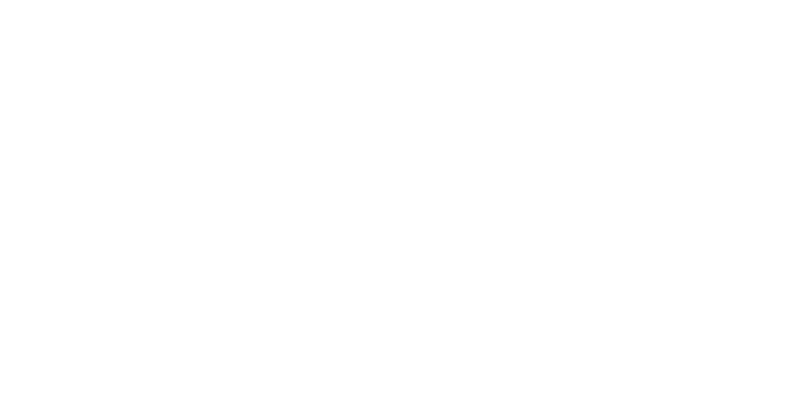

<IPython.core.display.Javascript object>


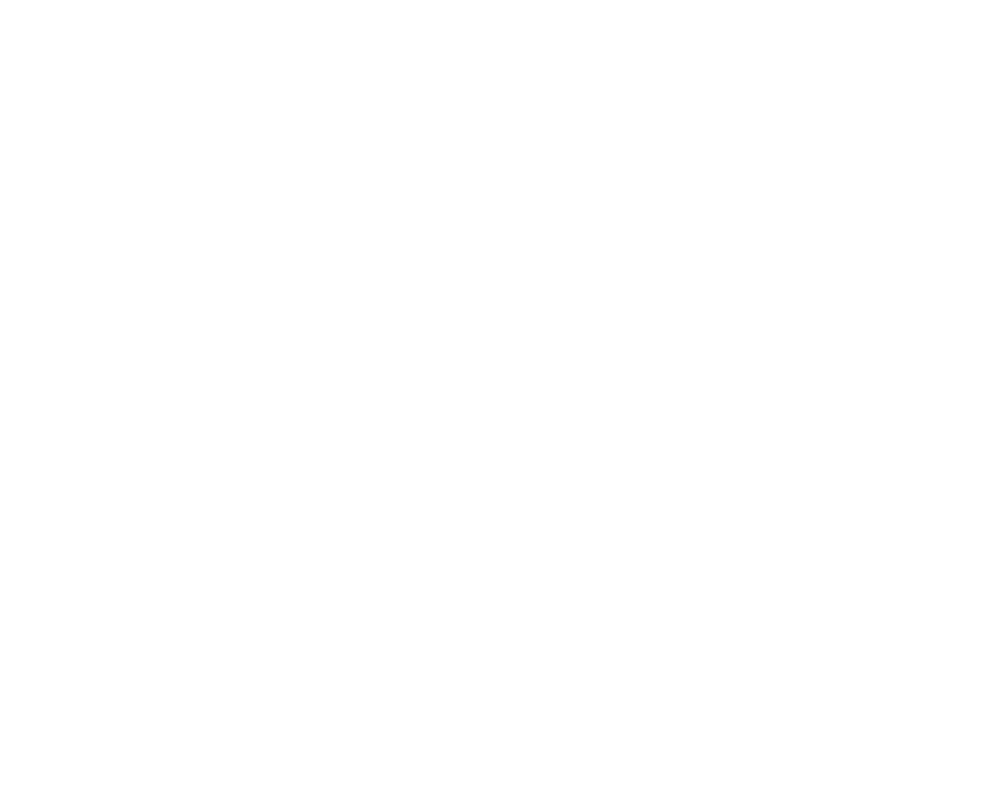

<IPython.core.display.Javascript object>


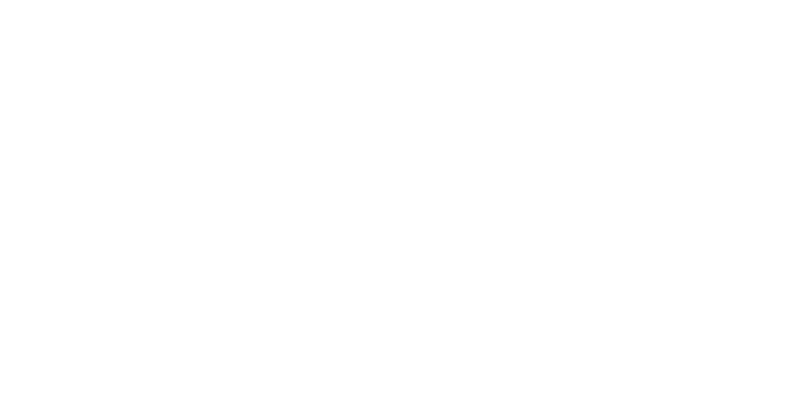

<IPython.core.display.Javascript object>


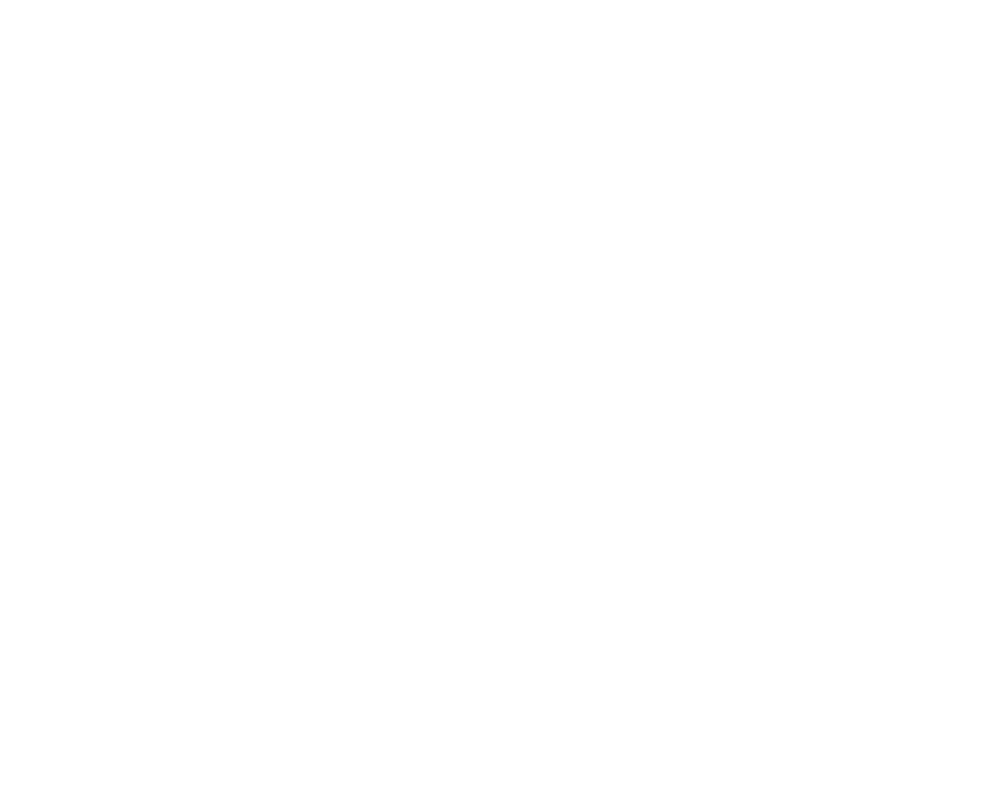

<IPython.core.display.Javascript object>


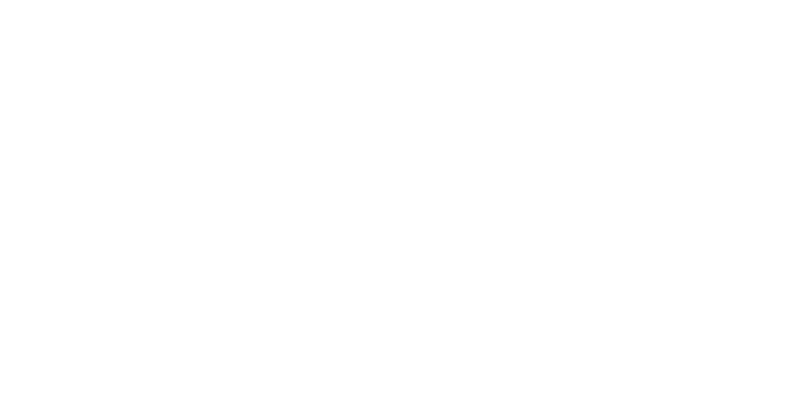

<IPython.core.display.Javascript object>


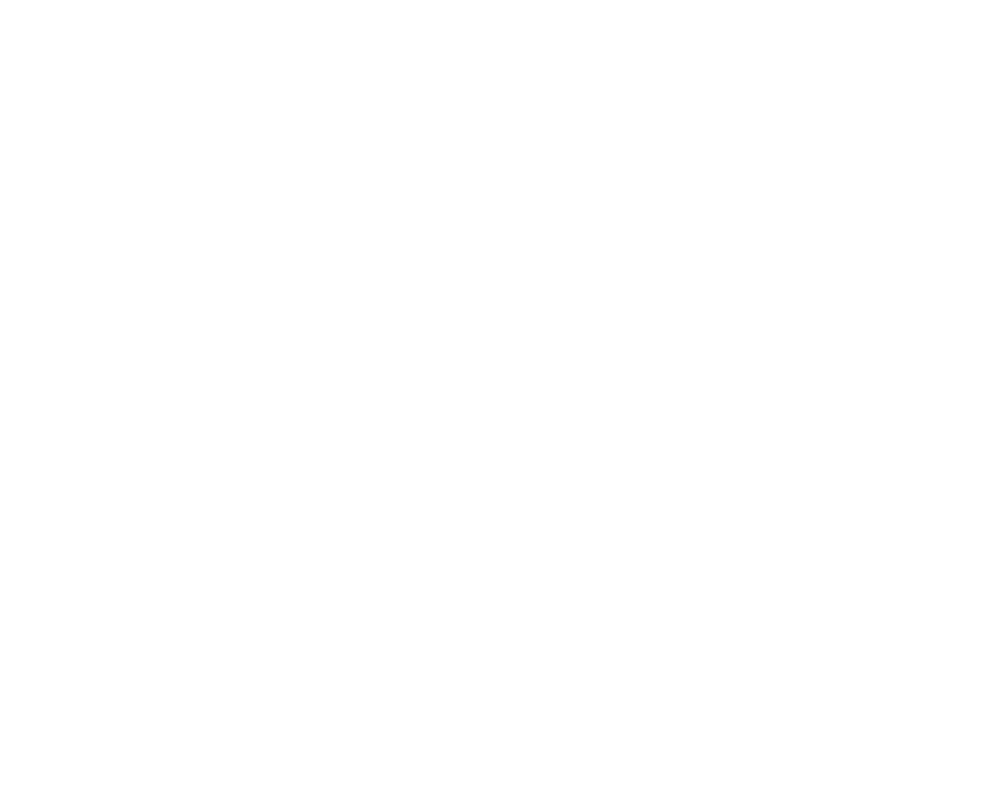

<IPython.core.display.Javascript object>


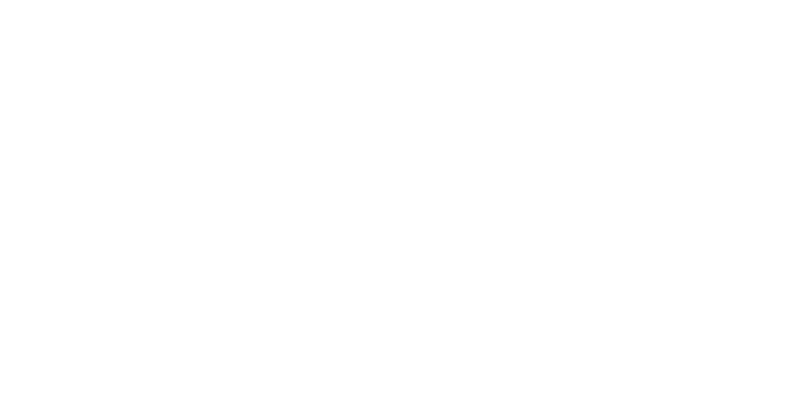

<IPython.core.display.Javascript object>


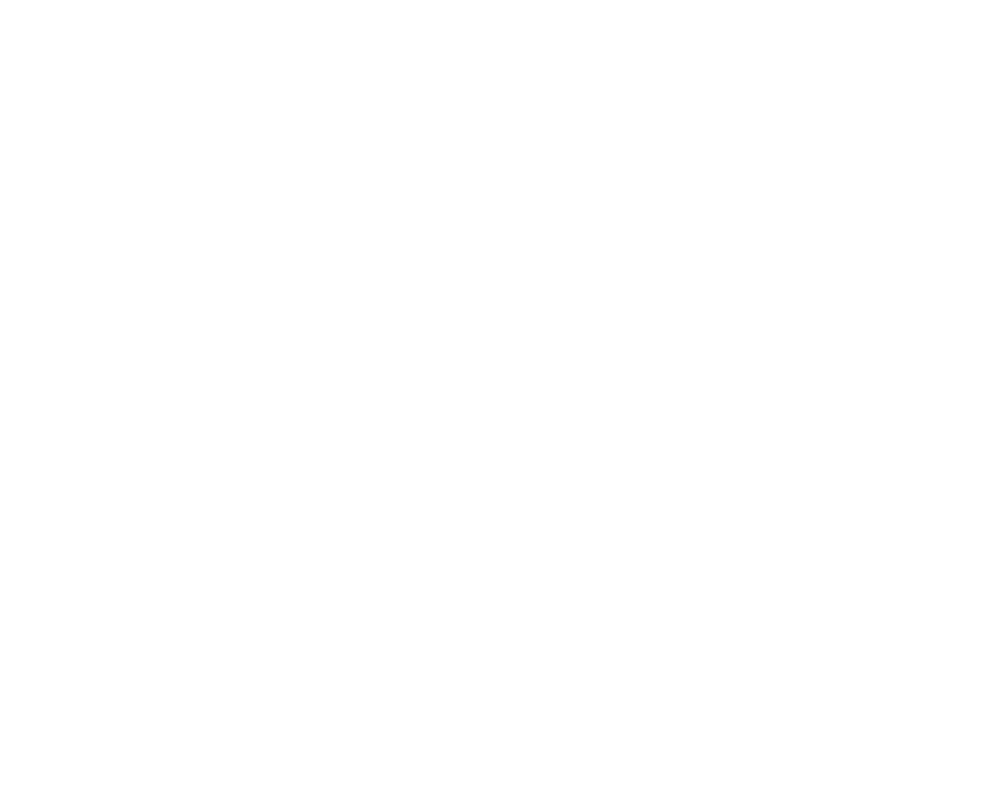

<IPython.core.display.Javascript object>


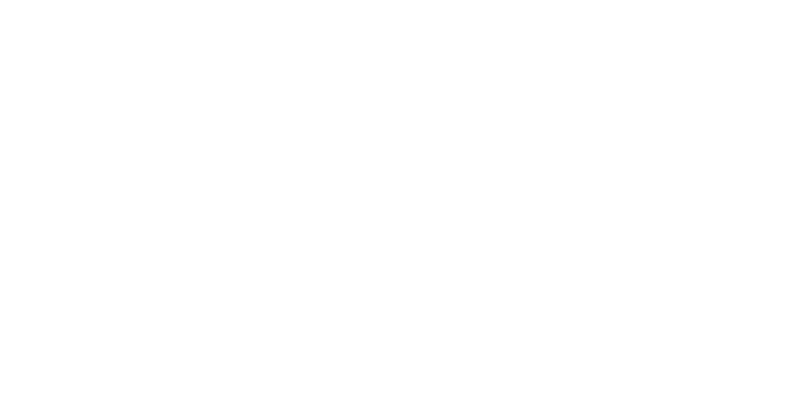

<IPython.core.display.Javascript object>


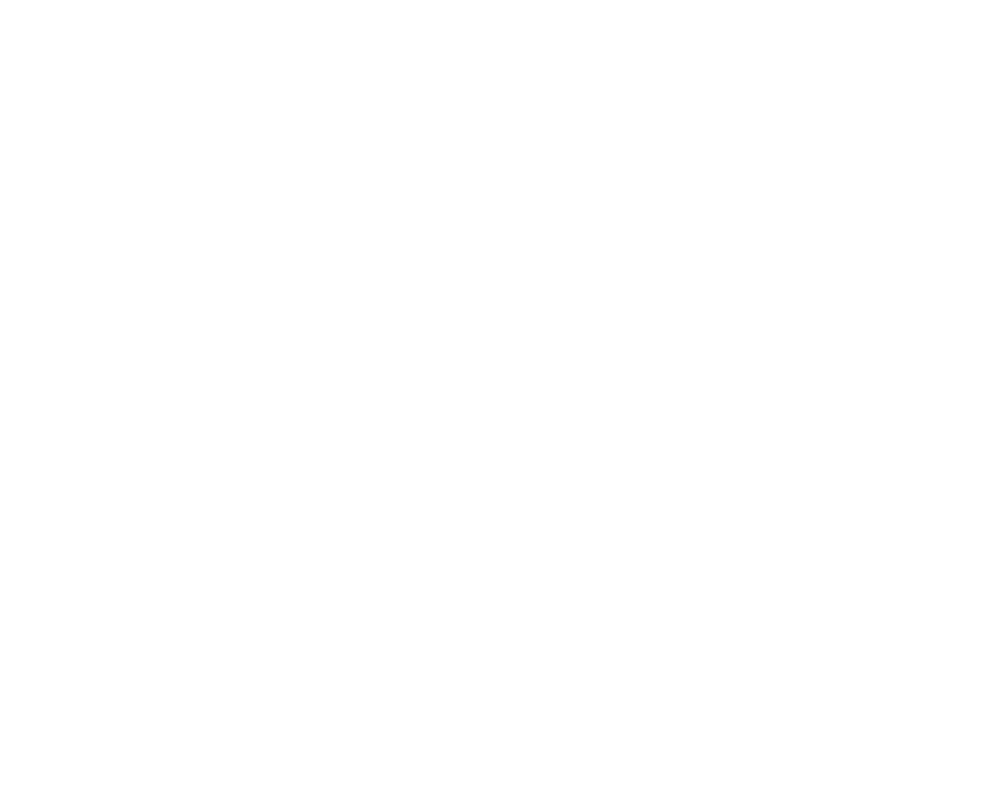

<IPython.core.display.Javascript object>


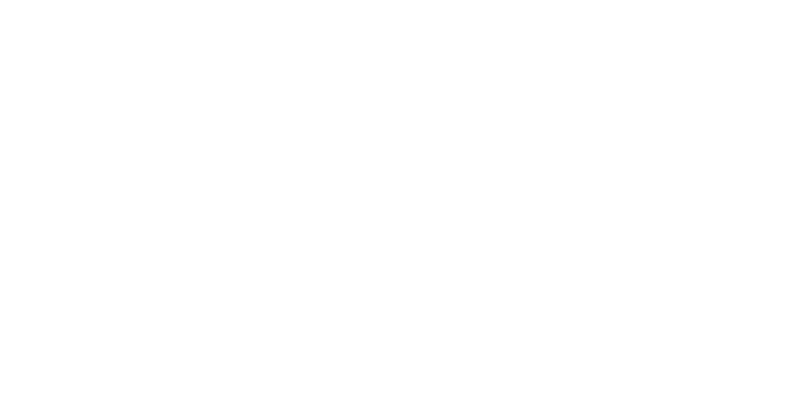

<IPython.core.display.Javascript object>


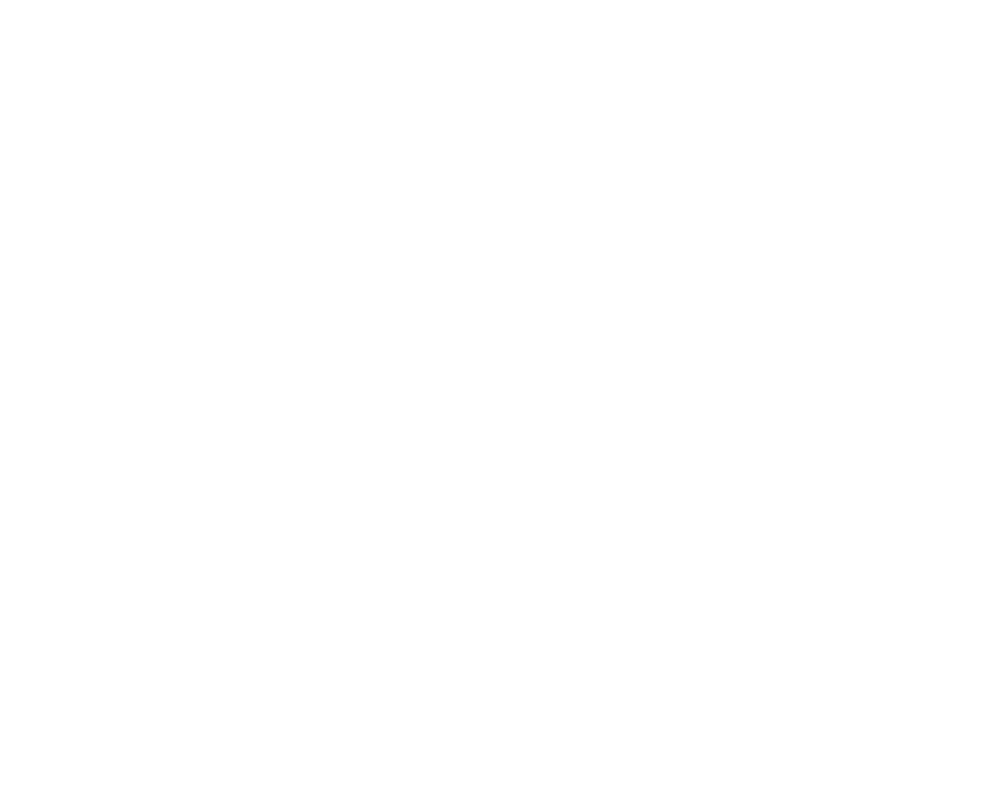

<IPython.core.display.Javascript object>


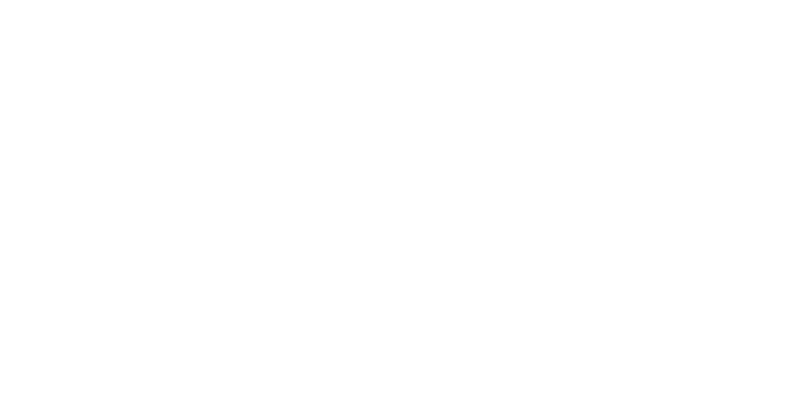

<IPython.core.display.Javascript object>


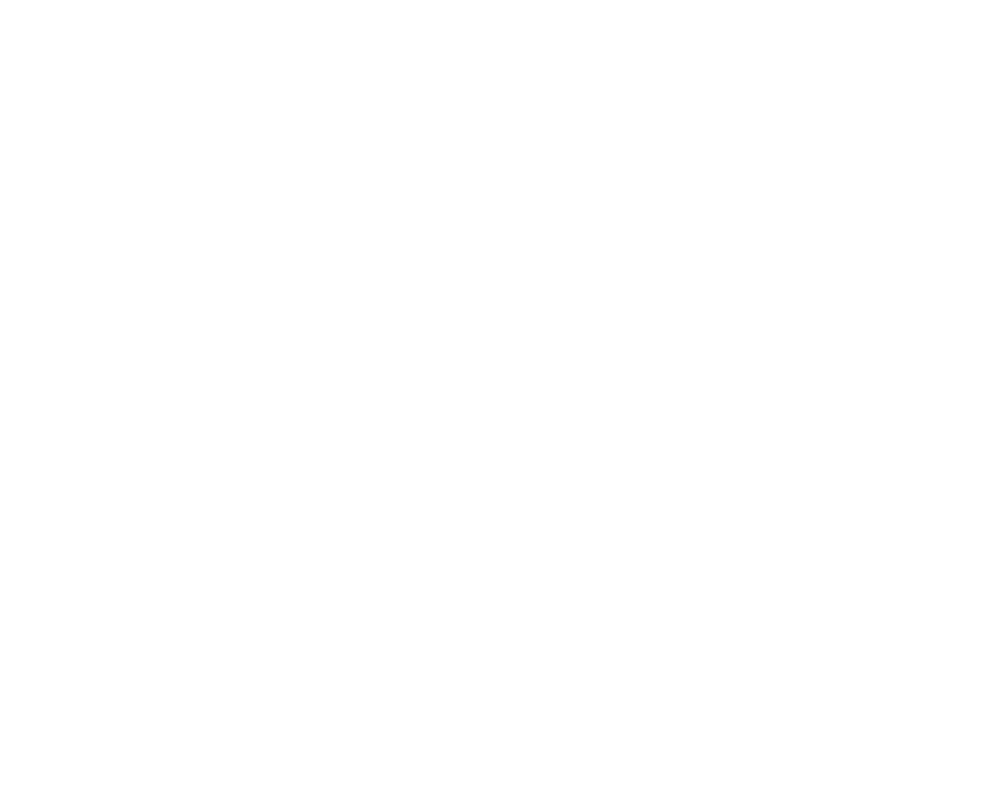

<IPython.core.display.Javascript object>


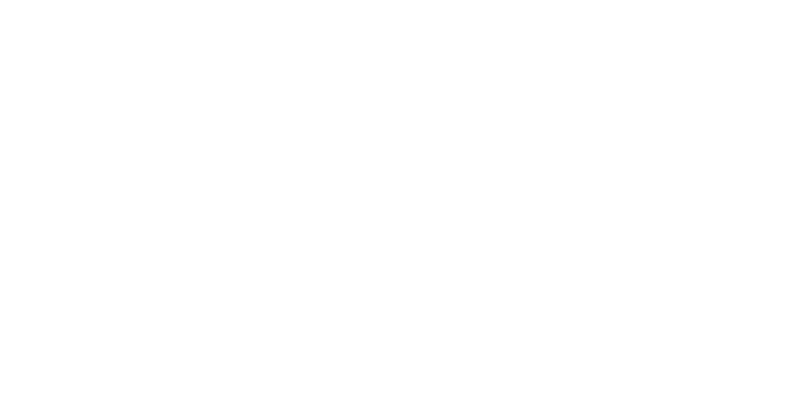

<IPython.core.display.Javascript object>


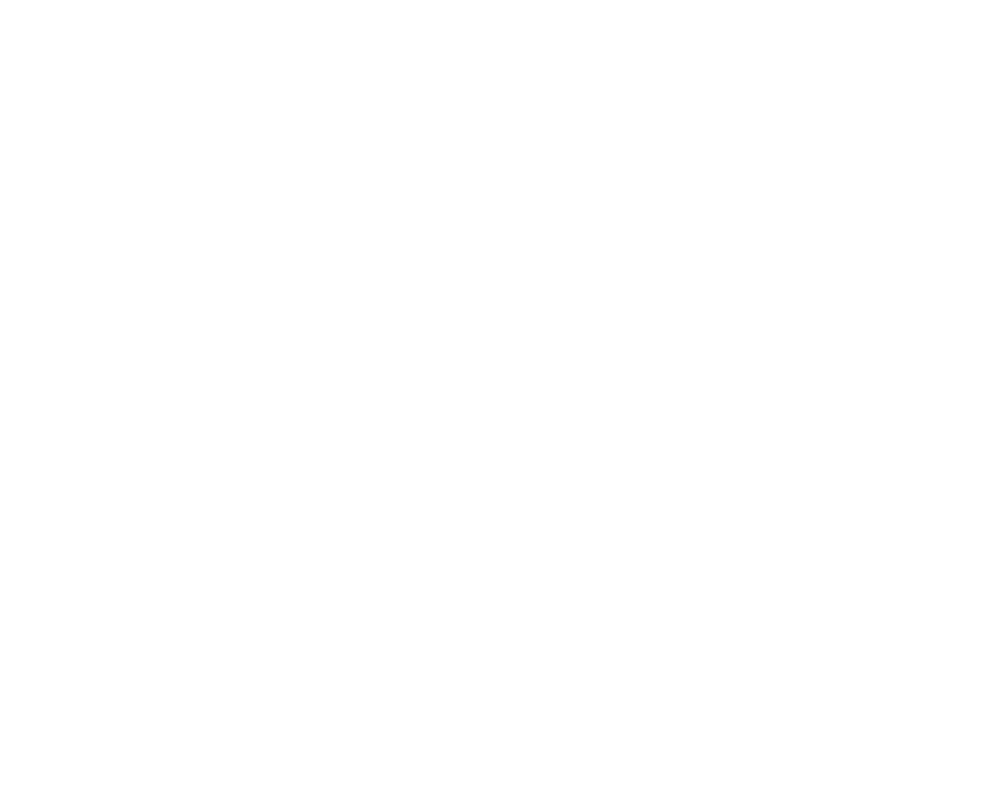

<IPython.core.display.Javascript object>


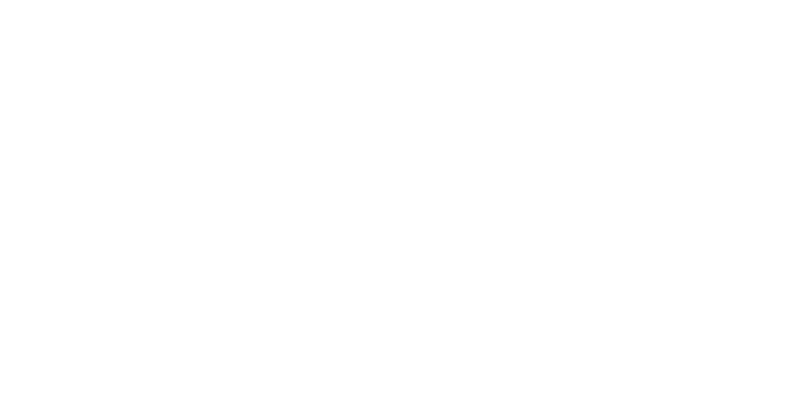

<IPython.core.display.Javascript object>


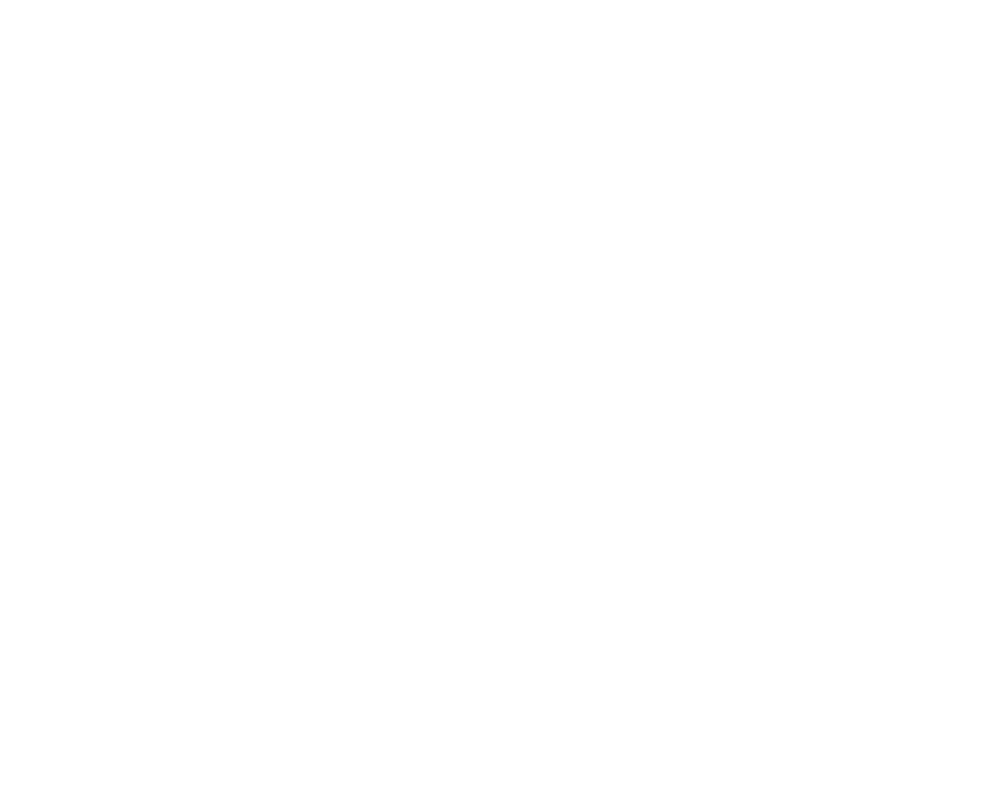

<IPython.core.display.Javascript object>


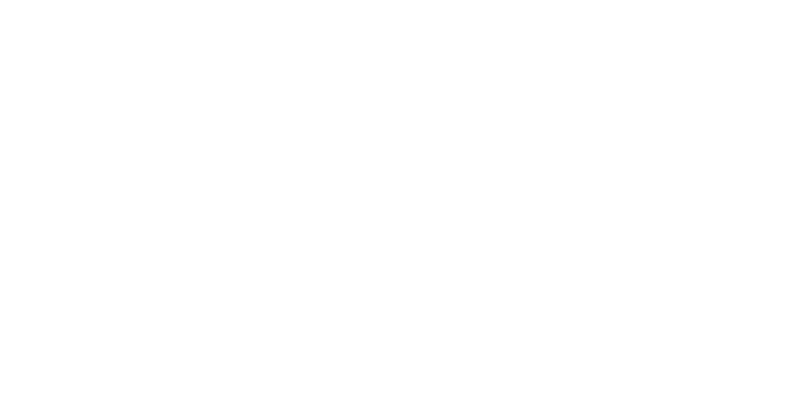

<IPython.core.display.Javascript object>


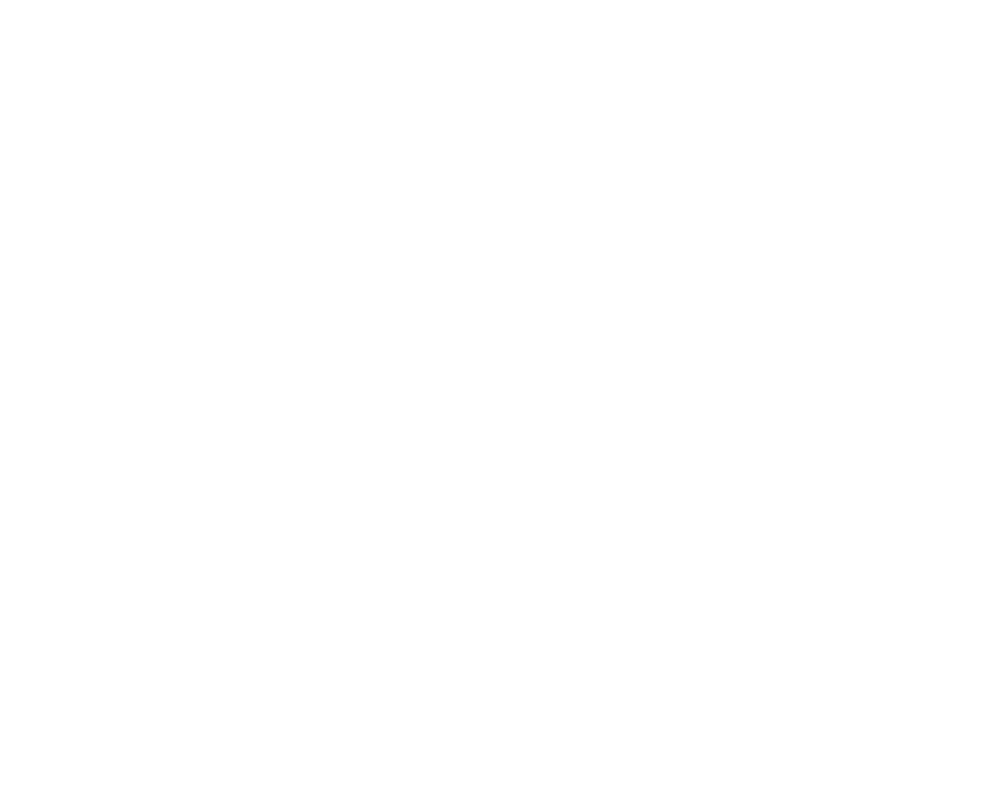

<IPython.core.display.Javascript object>


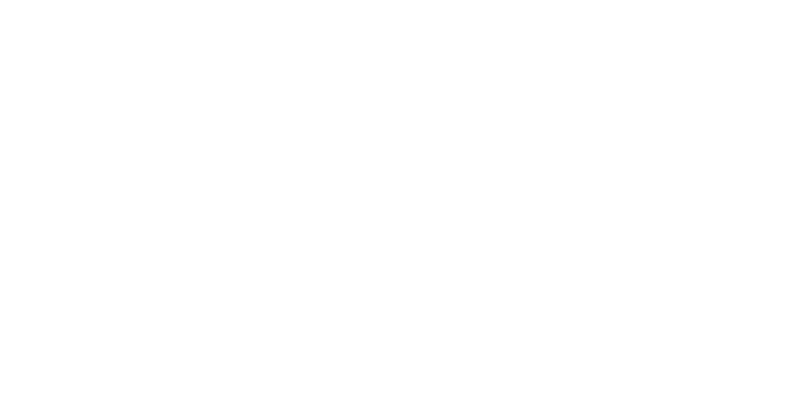

<IPython.core.display.Javascript object>


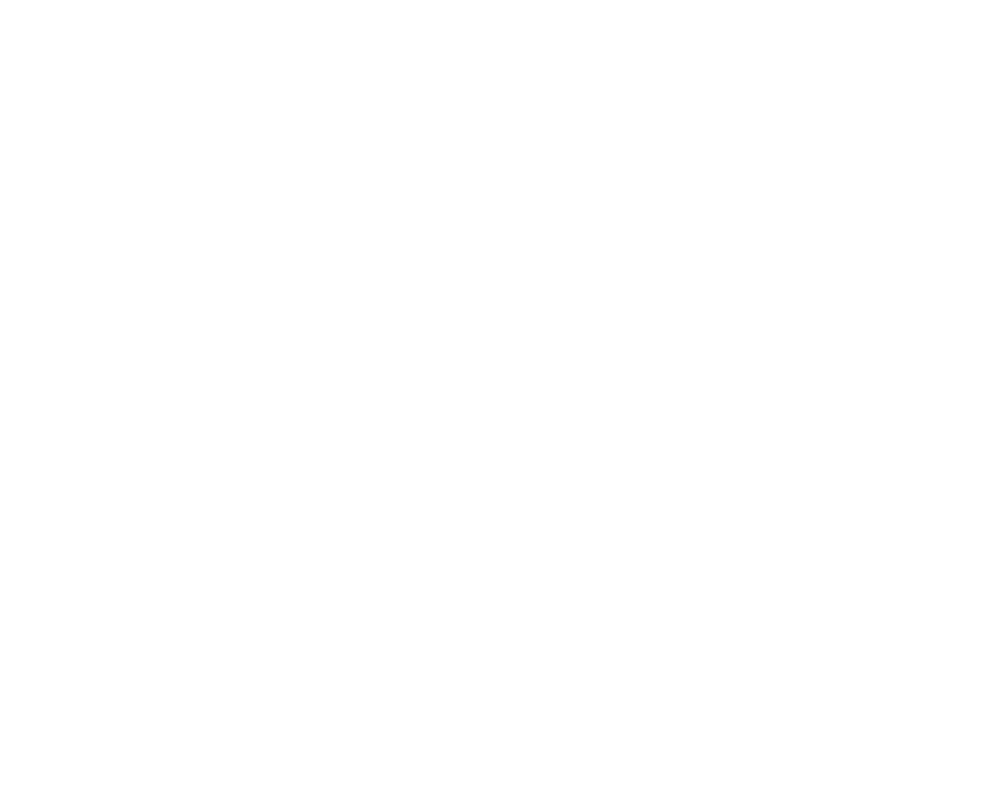

<IPython.core.display.Javascript object>


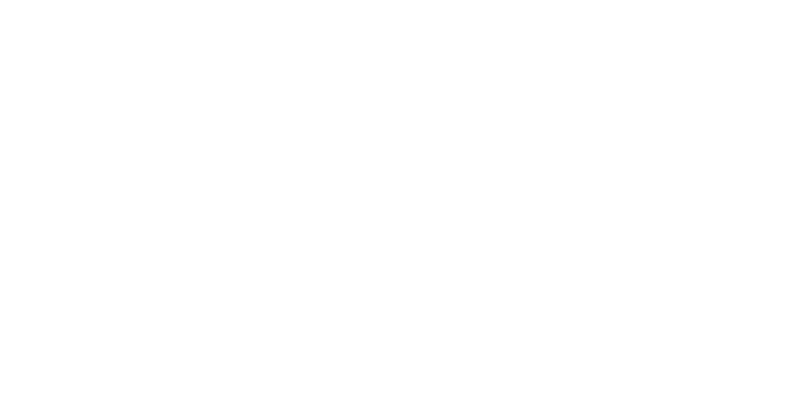

<IPython.core.display.Javascript object>


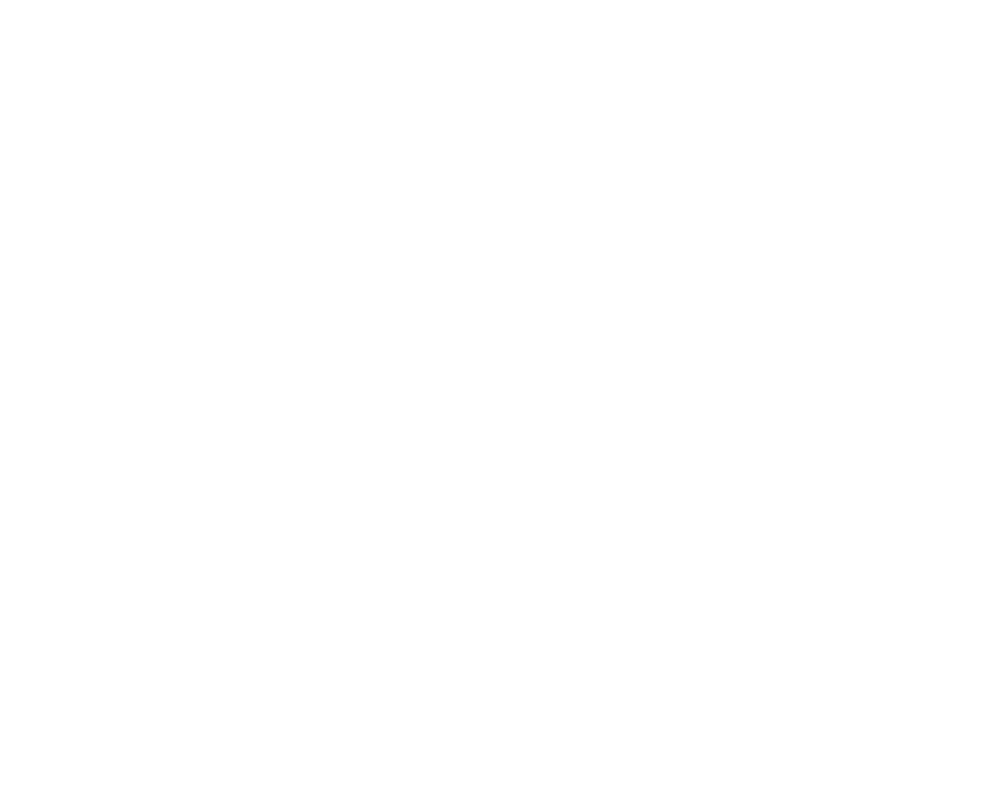

<IPython.core.display.Javascript object>


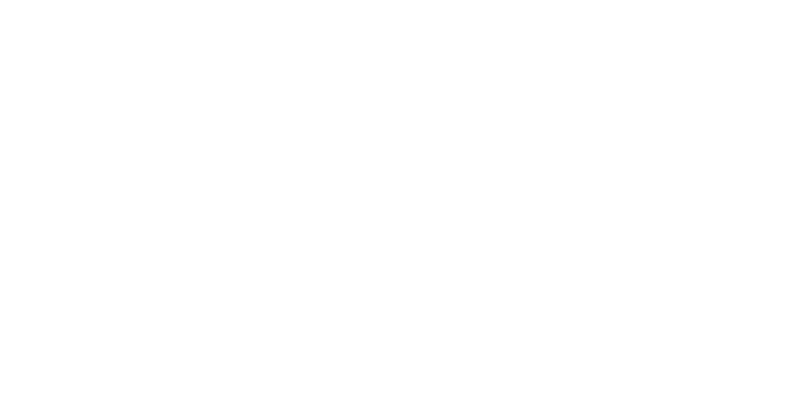

<IPython.core.display.Javascript object>


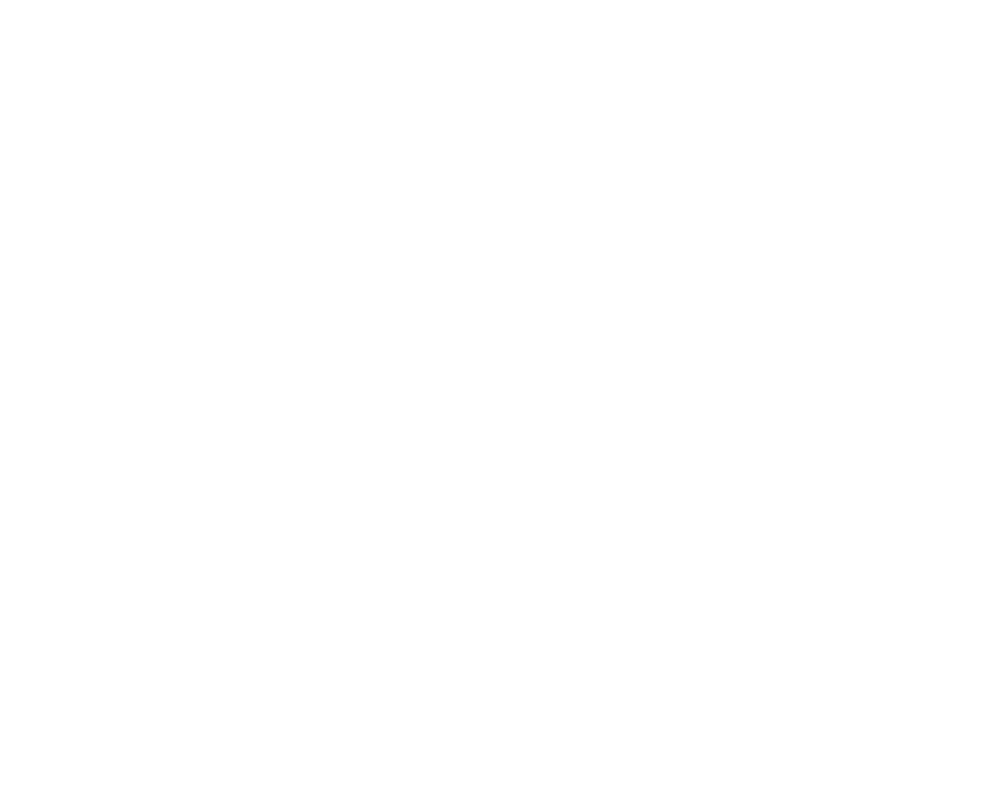

<IPython.core.display.Javascript object>


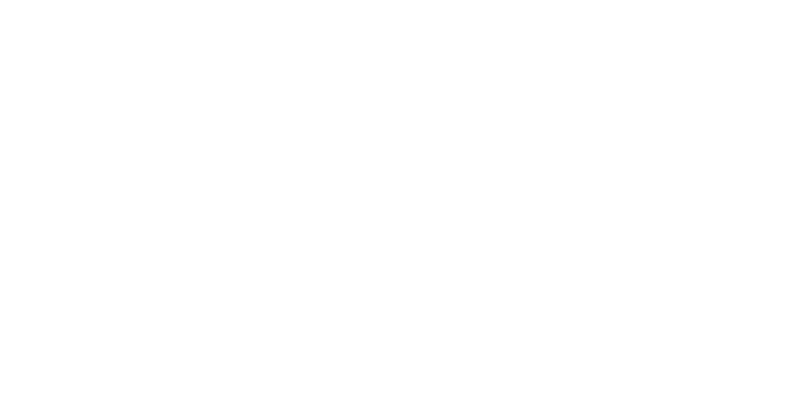

<IPython.core.display.Javascript object>


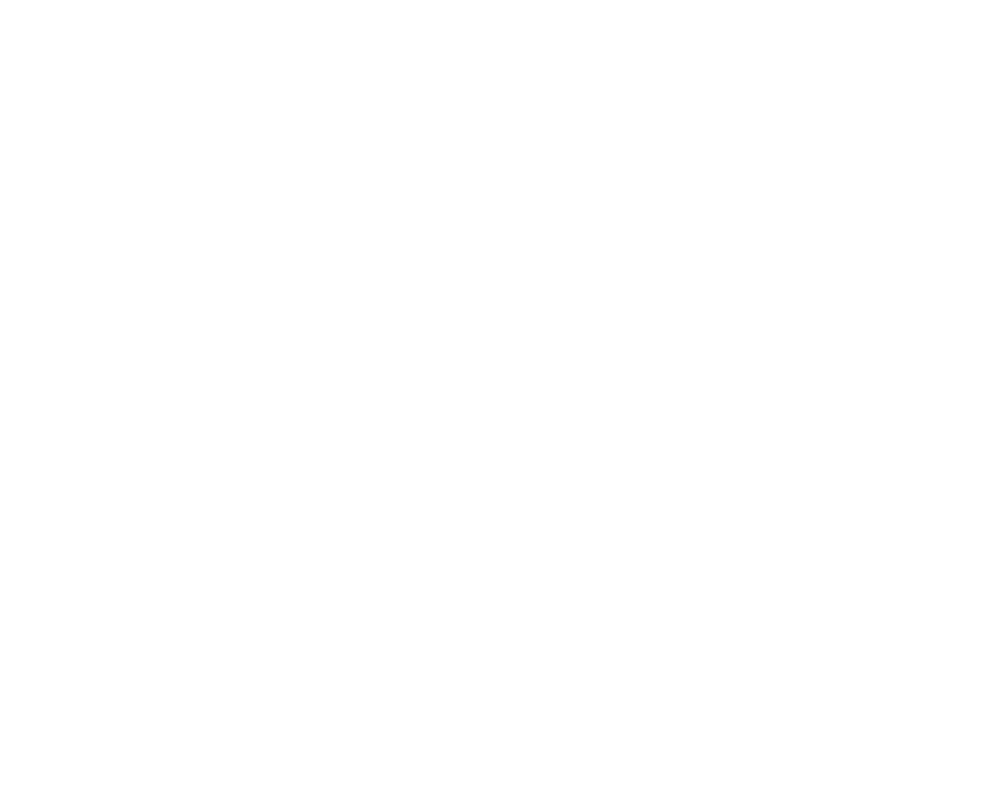

<IPython.core.display.Javascript object>


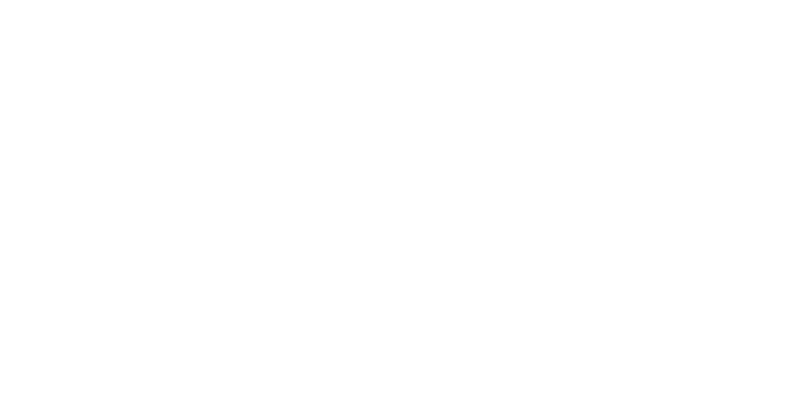

<IPython.core.display.Javascript object>


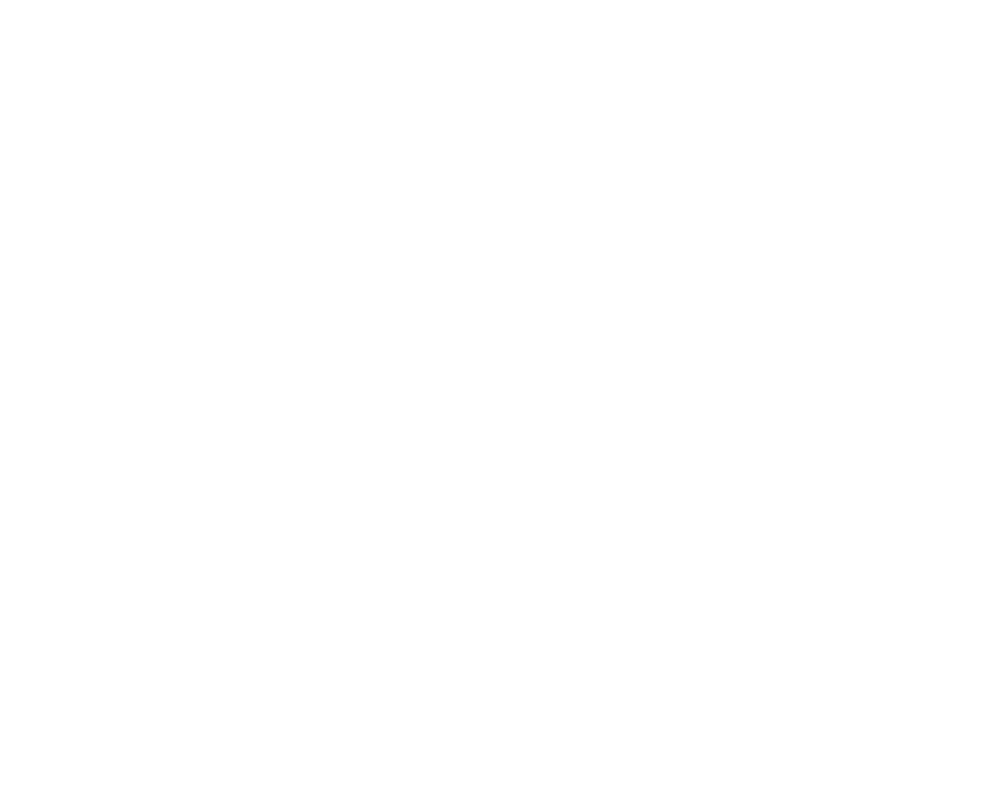

<IPython.core.display.Javascript object>


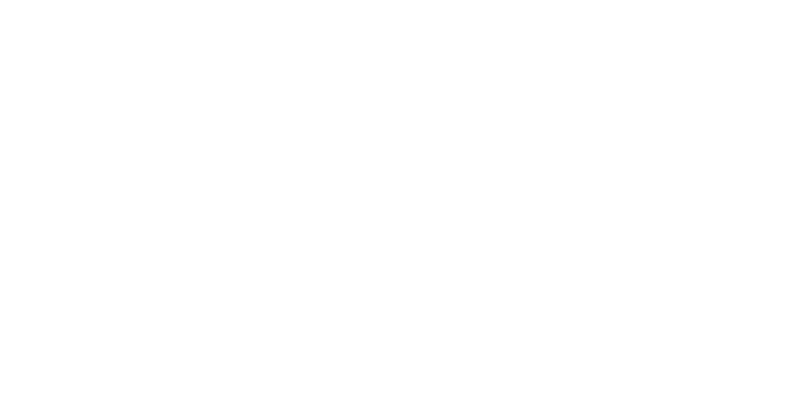

<IPython.core.display.Javascript object>


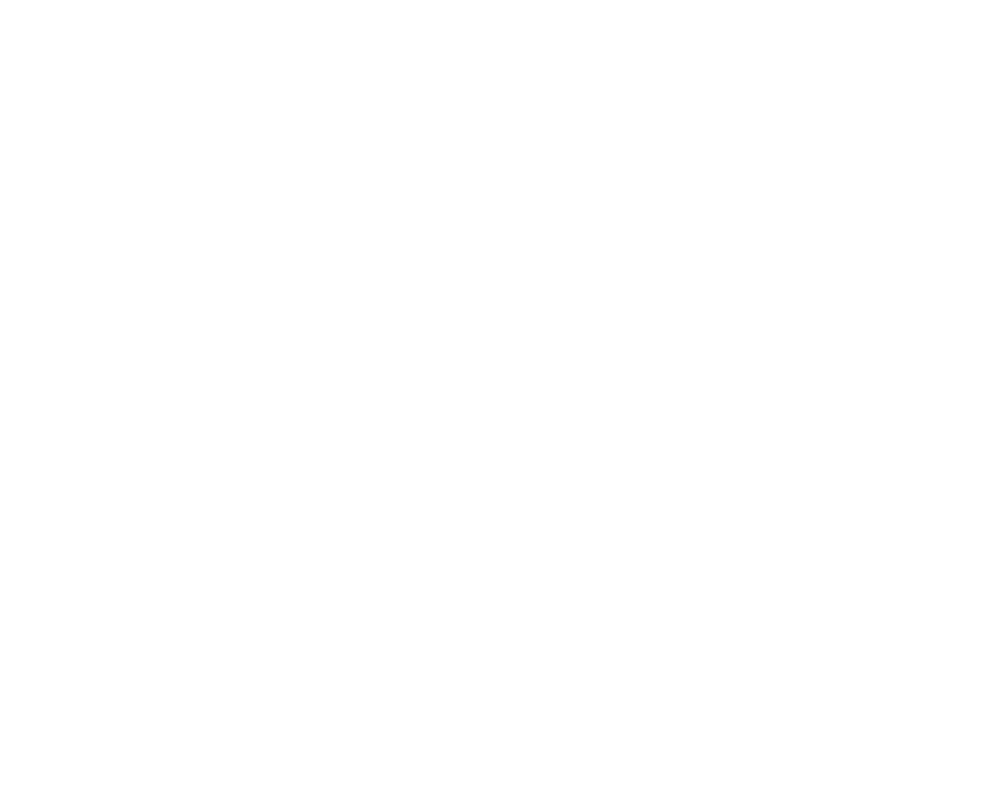

<IPython.core.display.Javascript object>


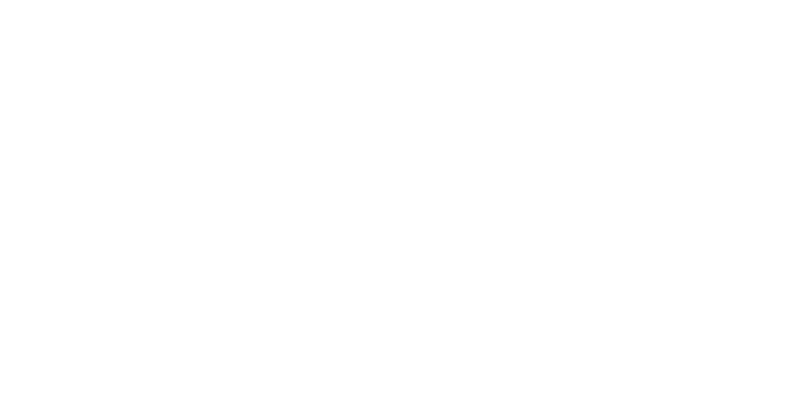

<IPython.core.display.Javascript object>


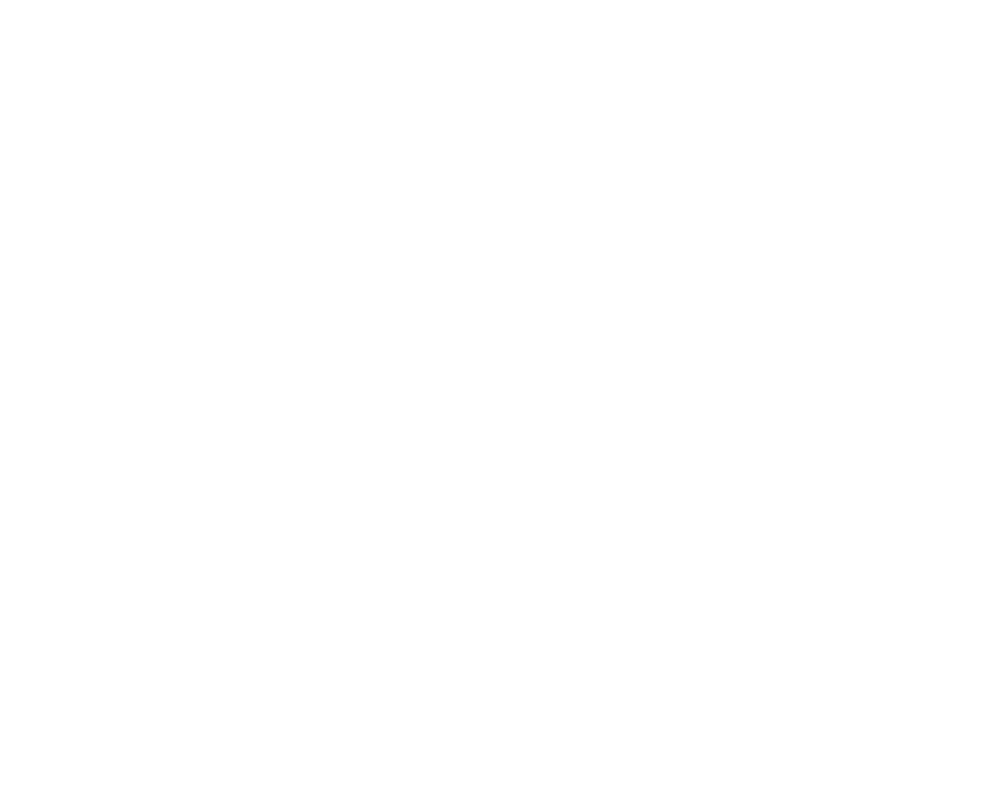

<IPython.core.display.Javascript object>


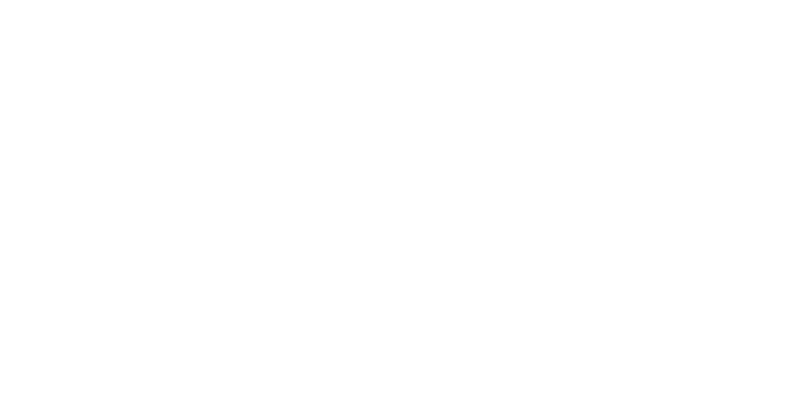

<IPython.core.display.Javascript object>


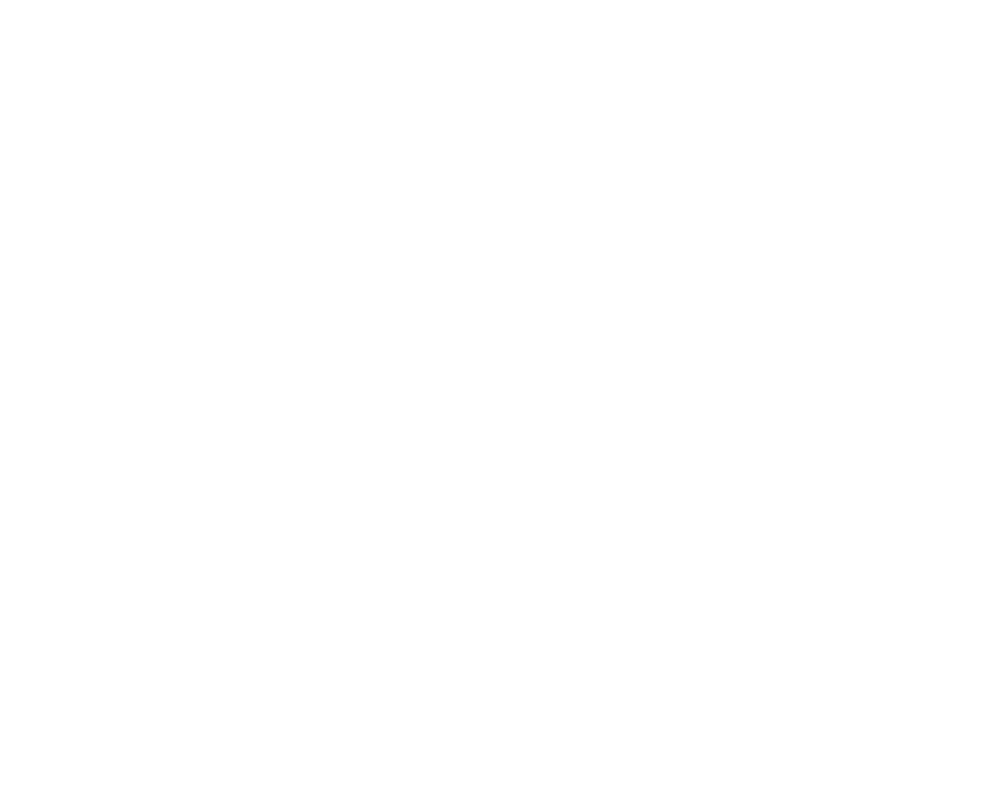

<IPython.core.display.Javascript object>


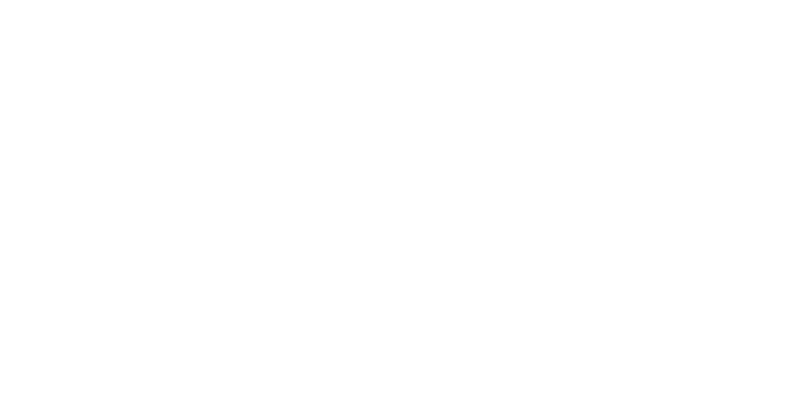

<IPython.core.display.Javascript object>


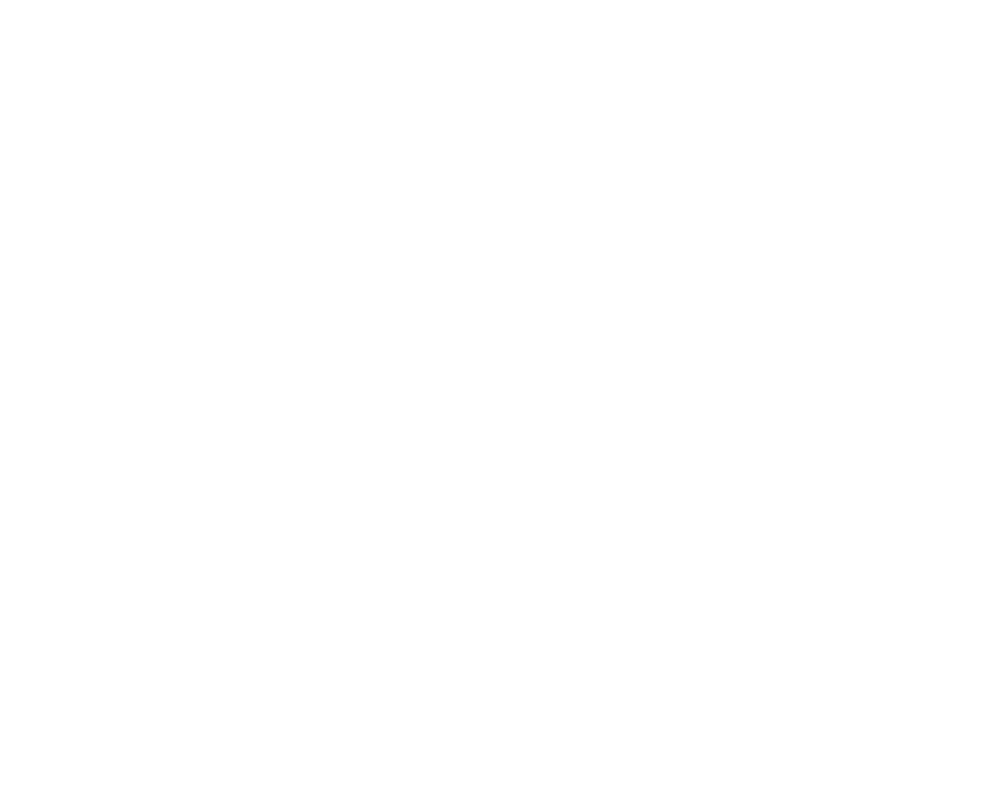

<IPython.core.display.Javascript object>


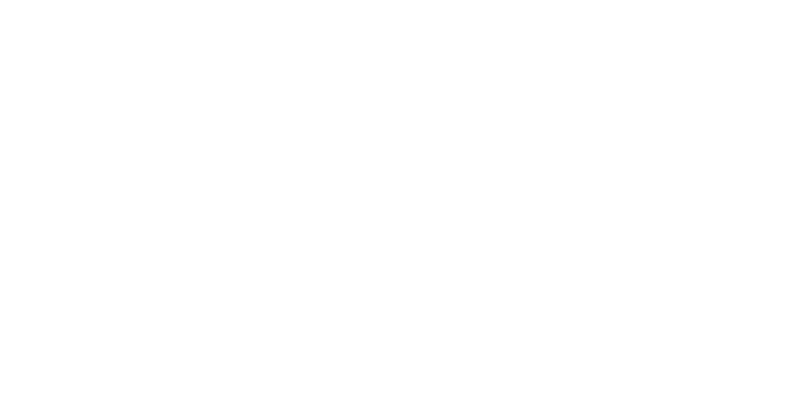

<IPython.core.display.Javascript object>


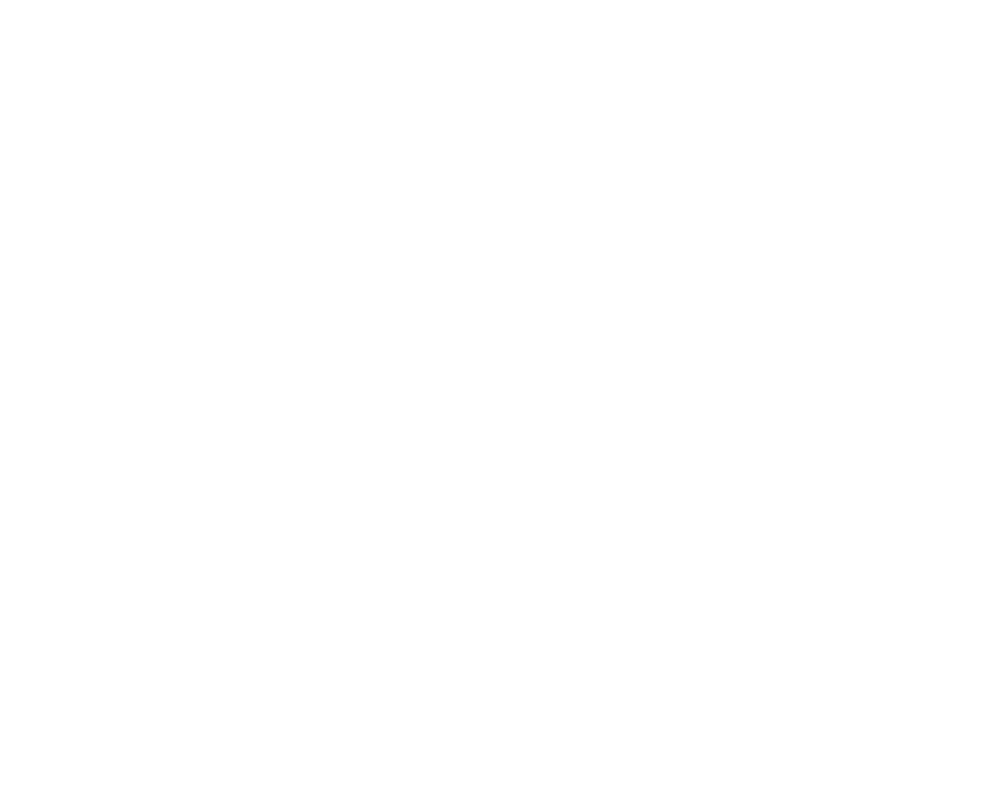

<IPython.core.display.Javascript object>


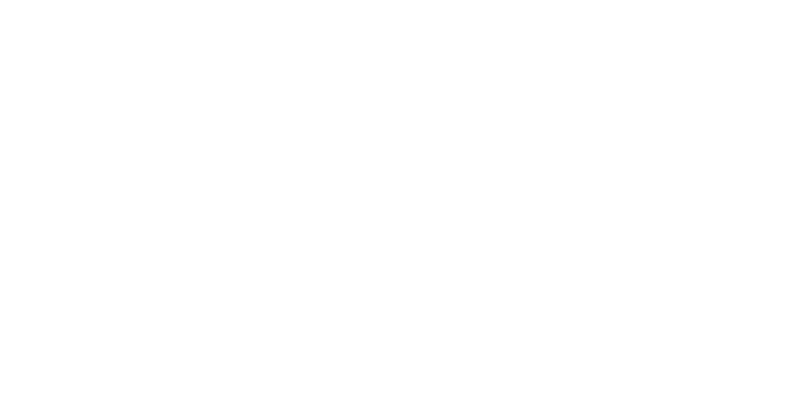

<IPython.core.display.Javascript object>


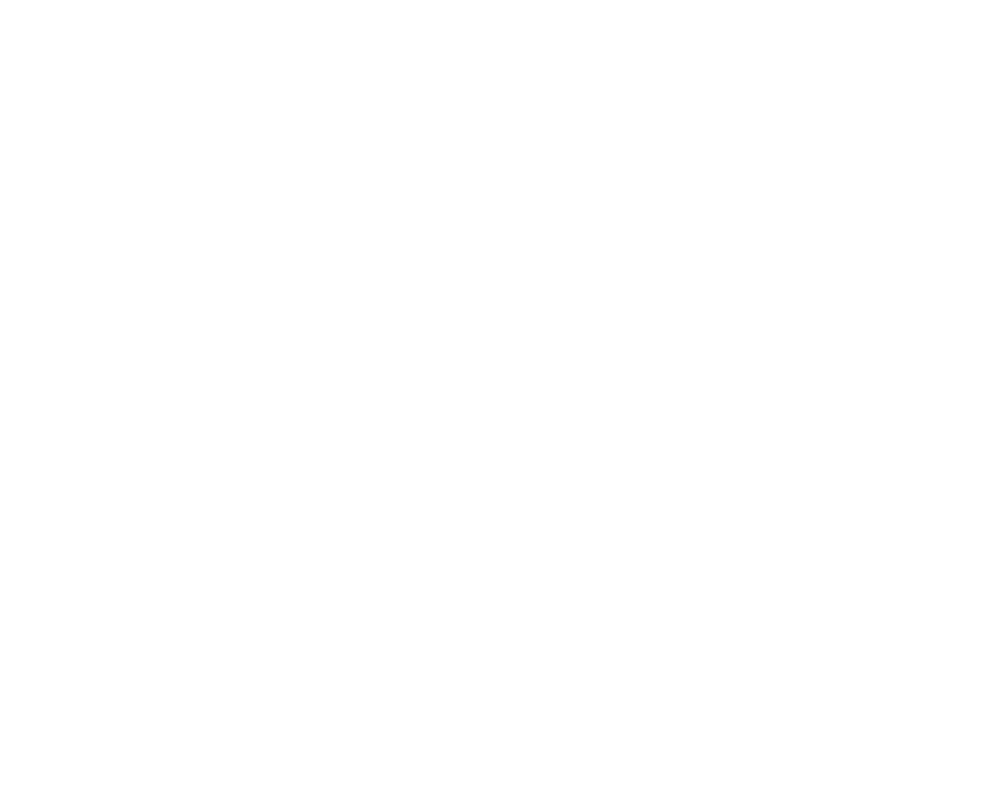

<IPython.core.display.Javascript object>


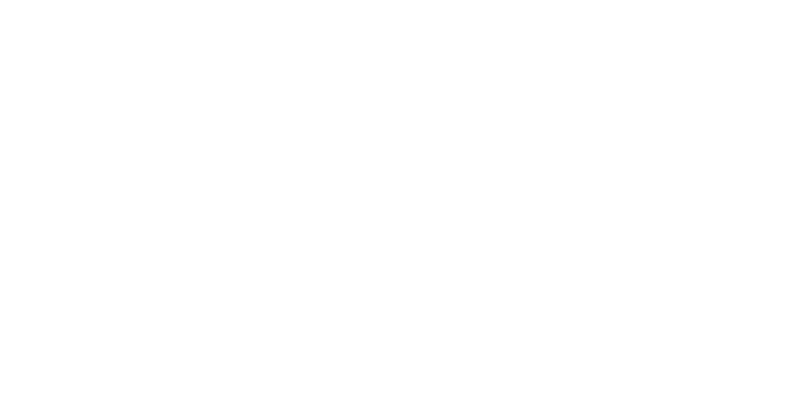

<IPython.core.display.Javascript object>


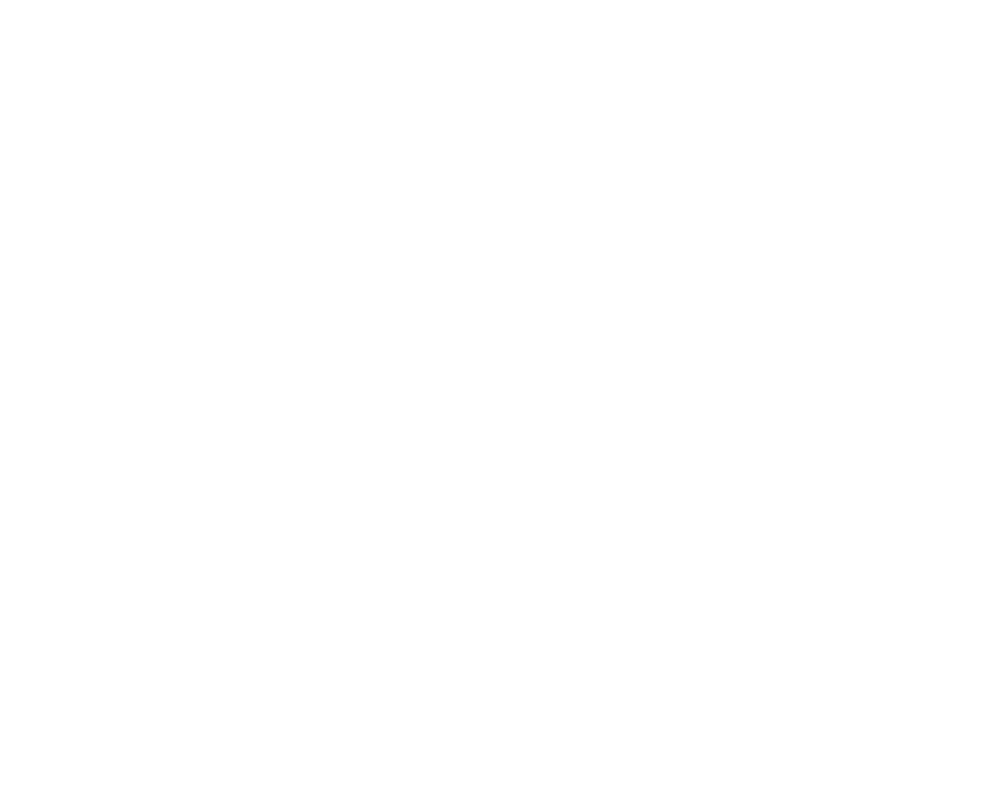

<IPython.core.display.Javascript object>


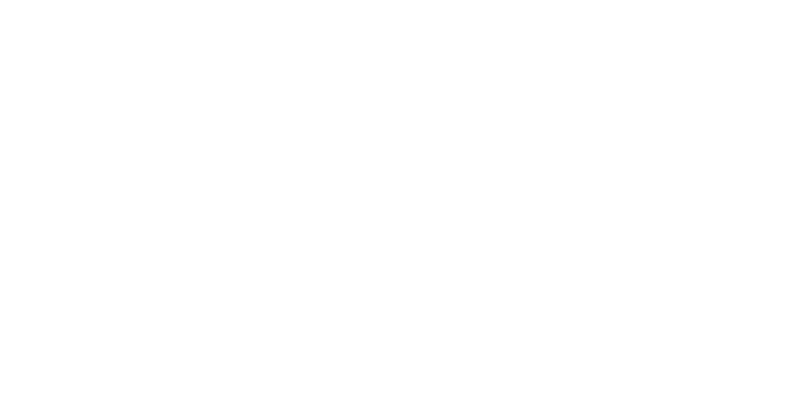

<IPython.core.display.Javascript object>


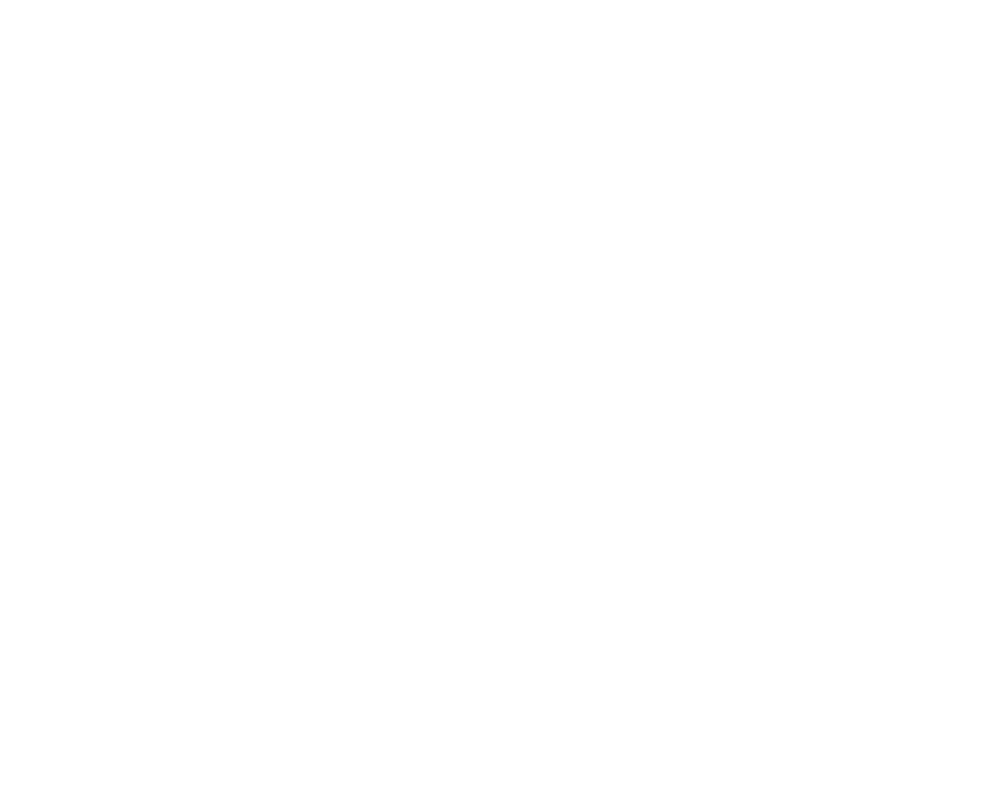

<IPython.core.display.Javascript object>


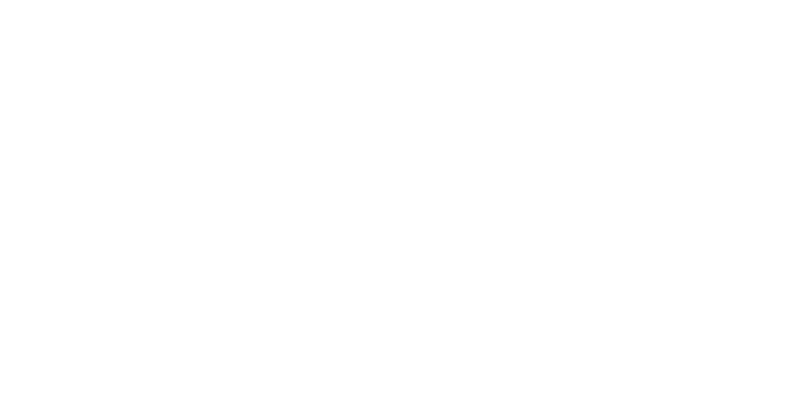

<IPython.core.display.Javascript object>


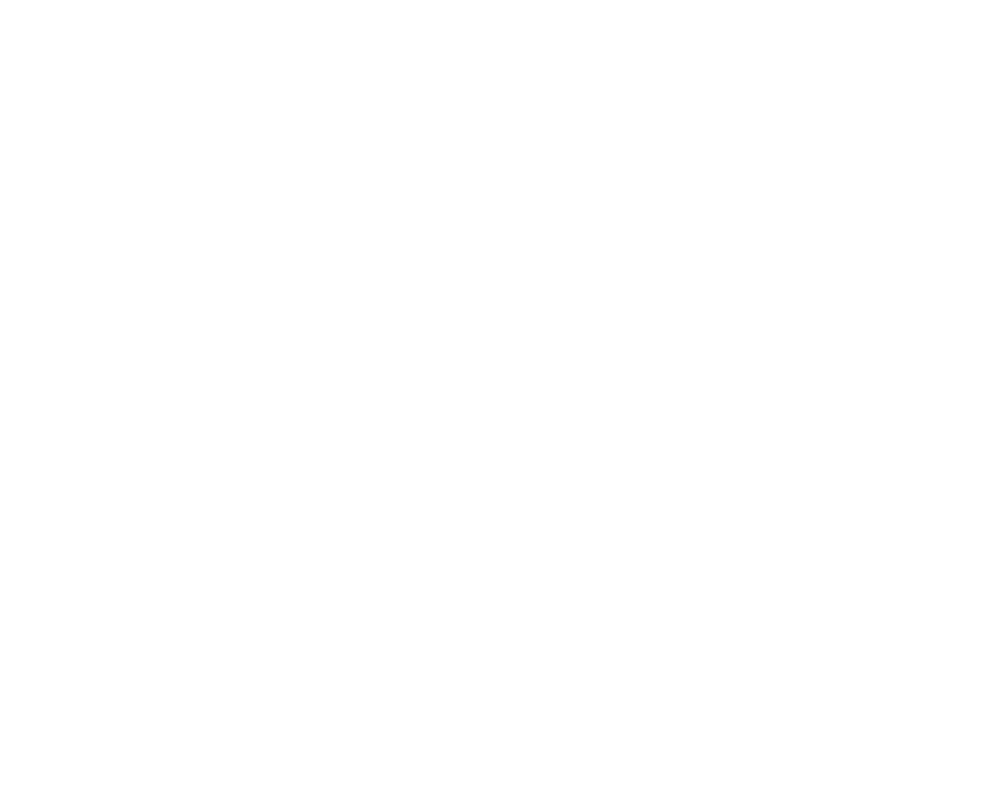

<IPython.core.display.Javascript object>


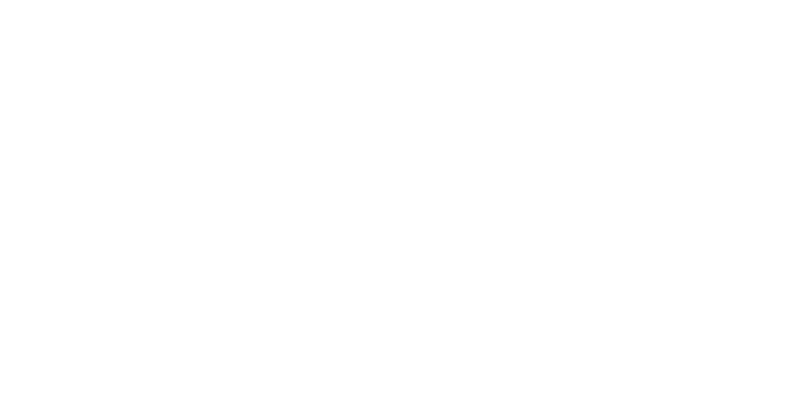

<IPython.core.display.Javascript object>


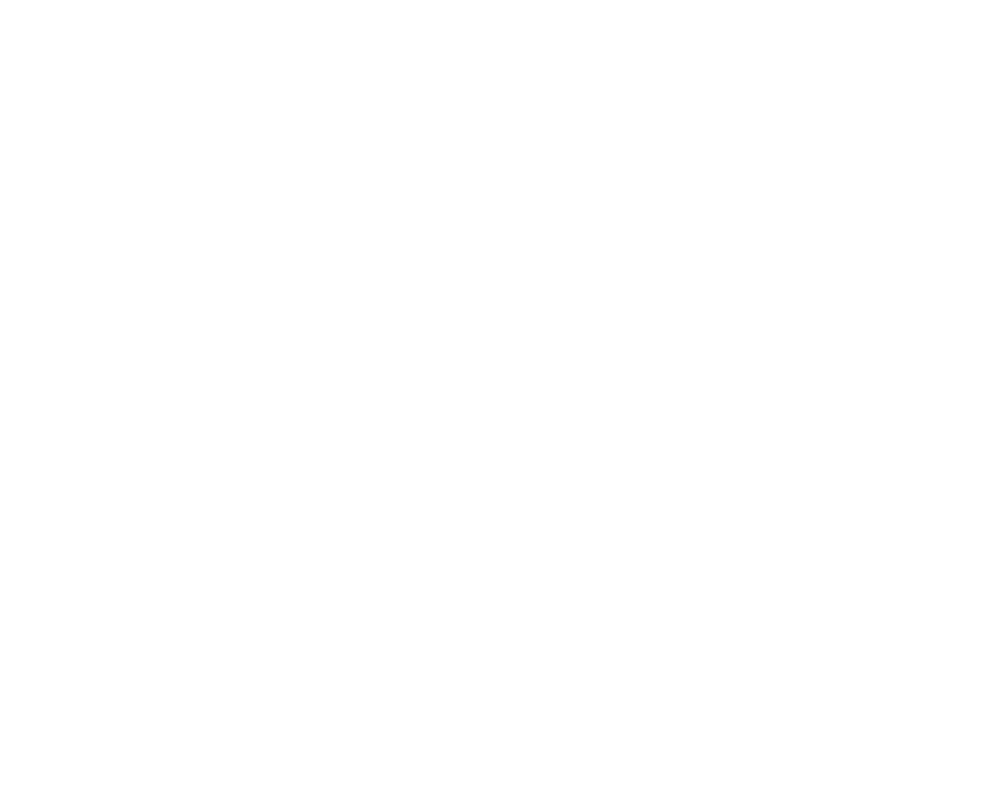

<IPython.core.display.Javascript object>


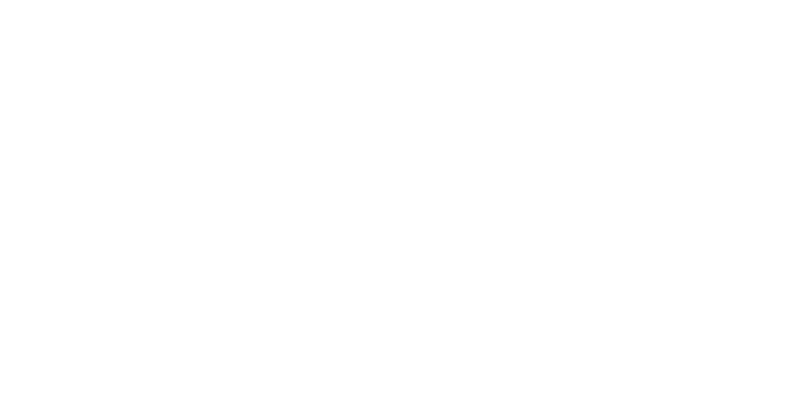

<IPython.core.display.Javascript object>


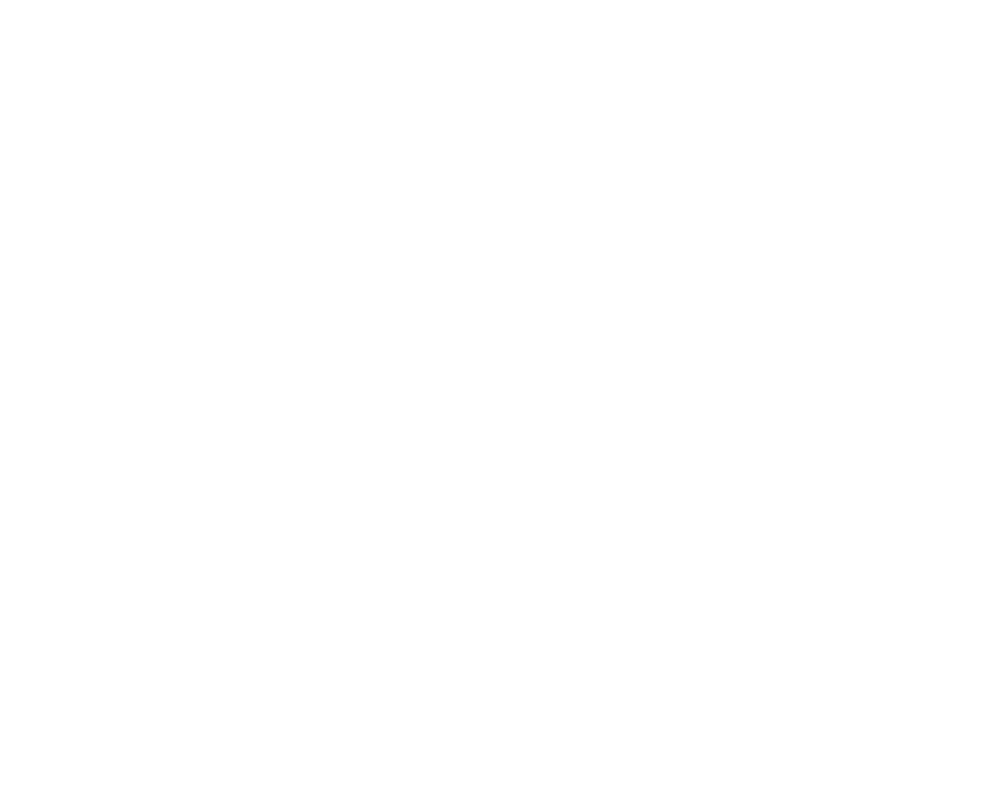

<IPython.core.display.Javascript object>


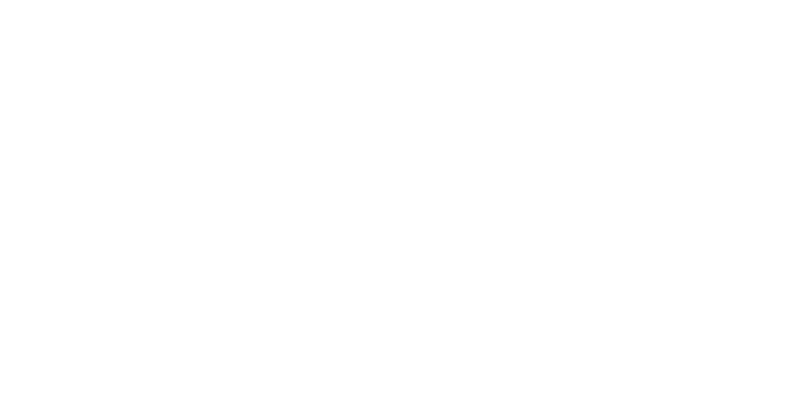

<IPython.core.display.Javascript object>


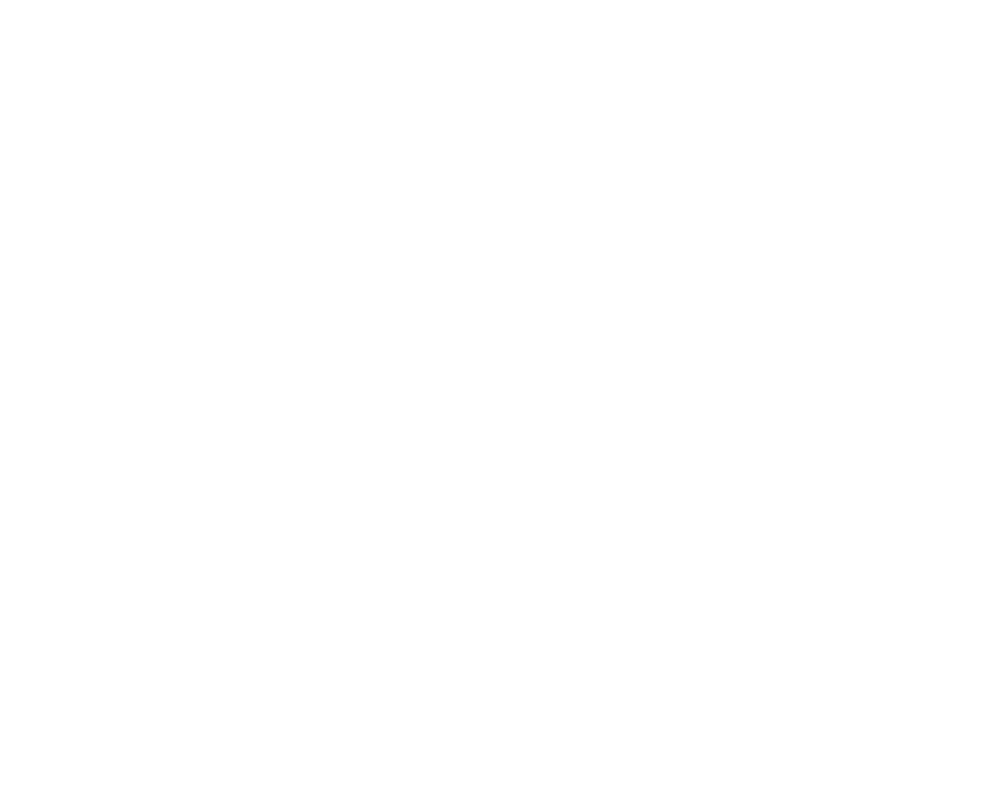

<IPython.core.display.Javascript object>


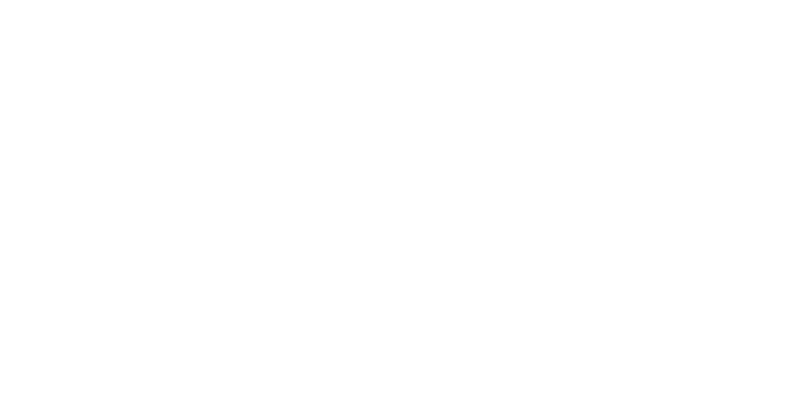

<IPython.core.display.Javascript object>


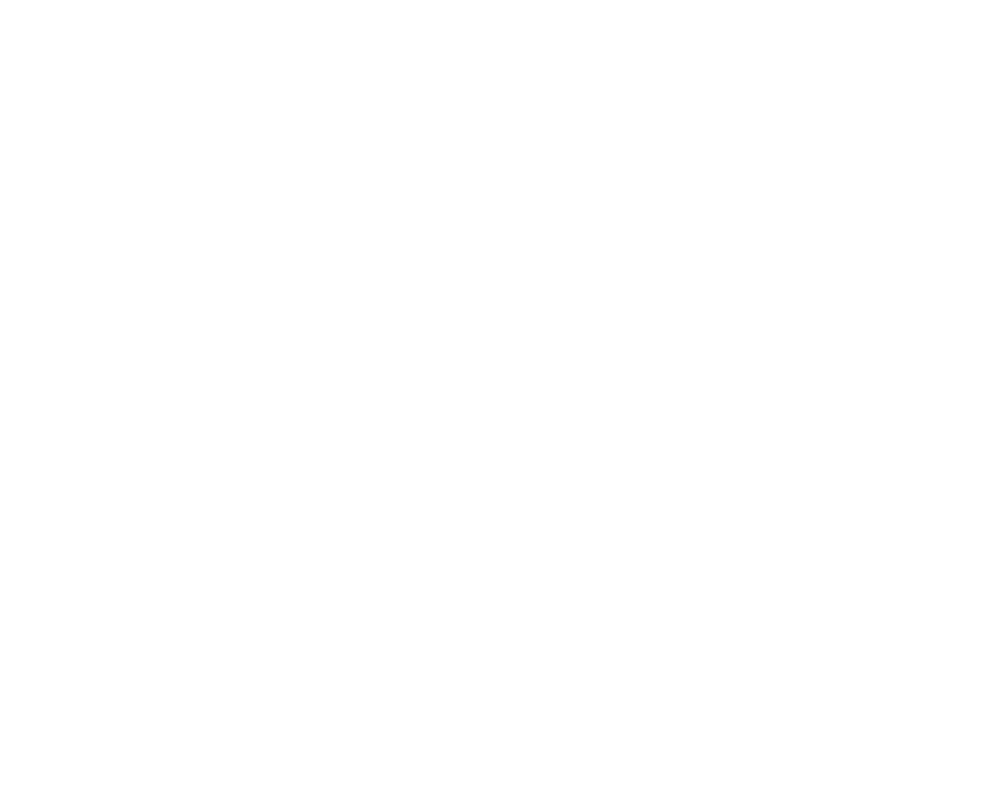

<IPython.core.display.Javascript object>


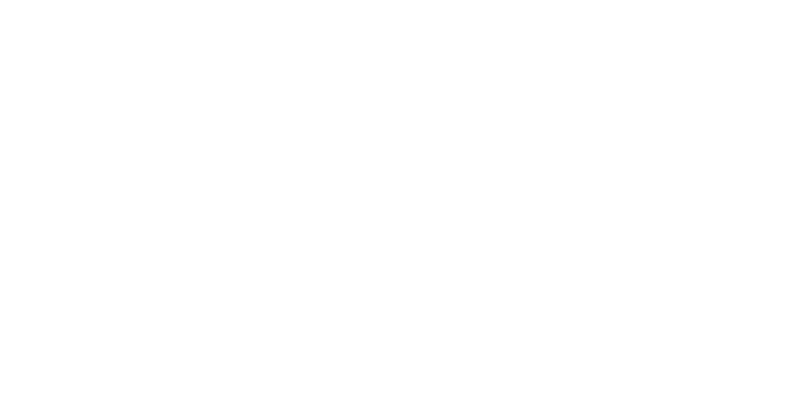

<IPython.core.display.Javascript object>


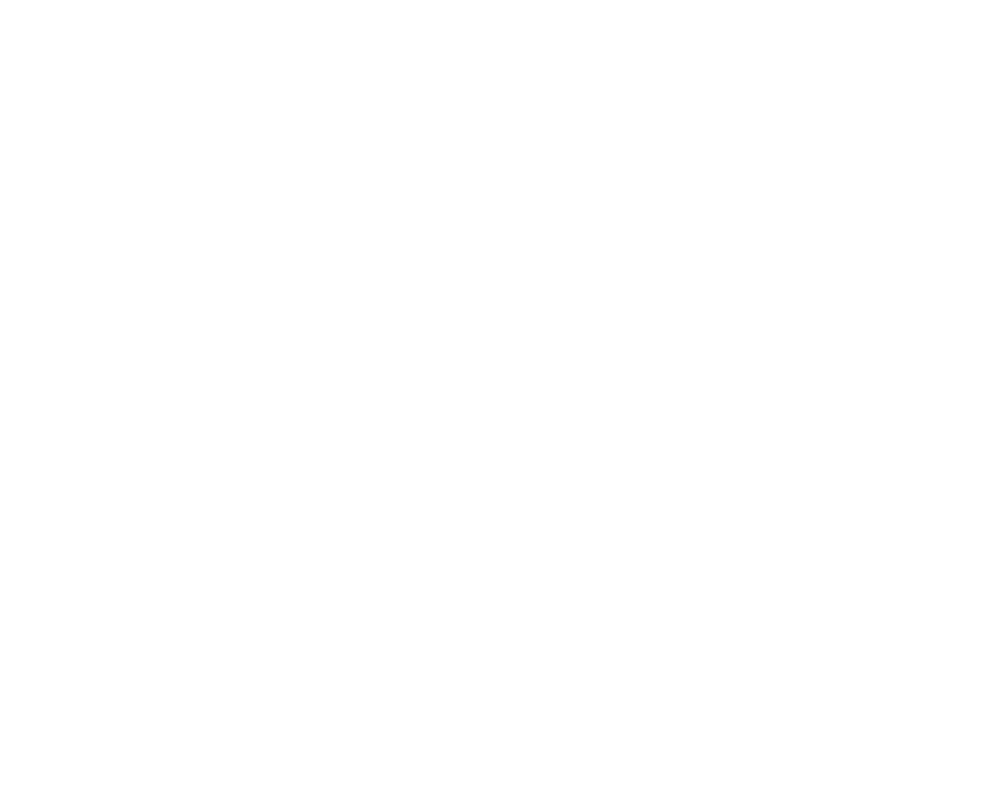

<IPython.core.display.Javascript object>


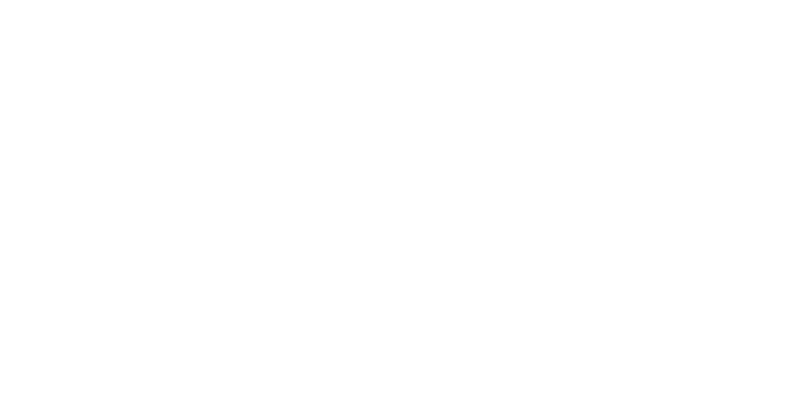

<IPython.core.display.Javascript object>


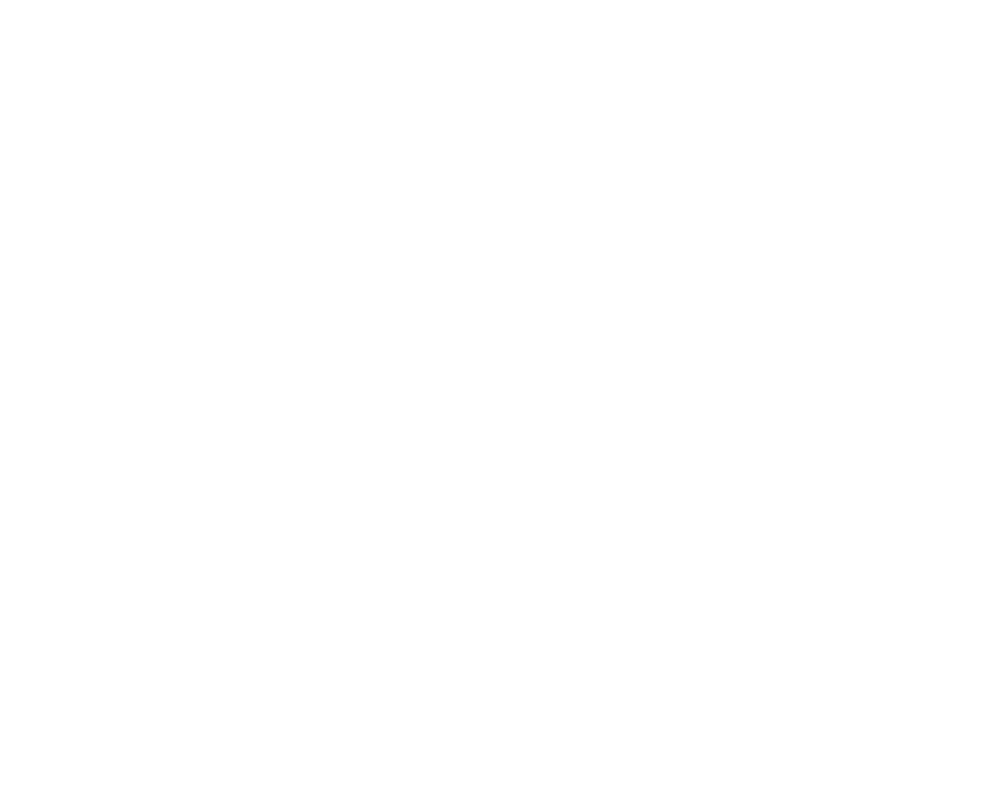

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:83: RuntimeWarning: Mean of empty slice
  opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:83: RuntimeWarning: Mean of empty slice
  opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:83: RuntimeWarning: Mean of empty slice
  opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanf

<IPython.core.display.Javascript object>


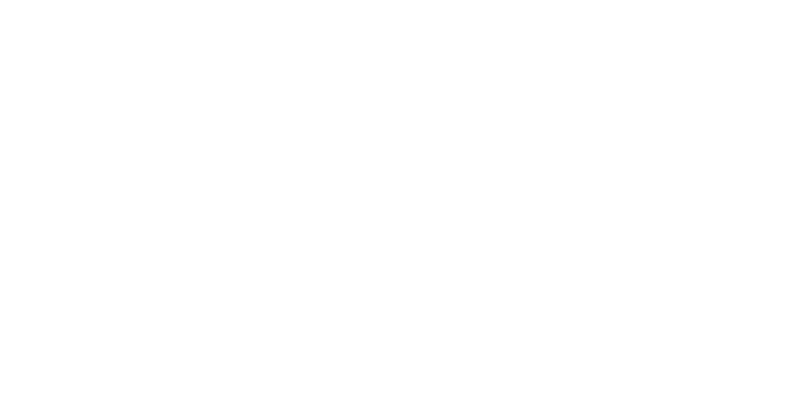

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


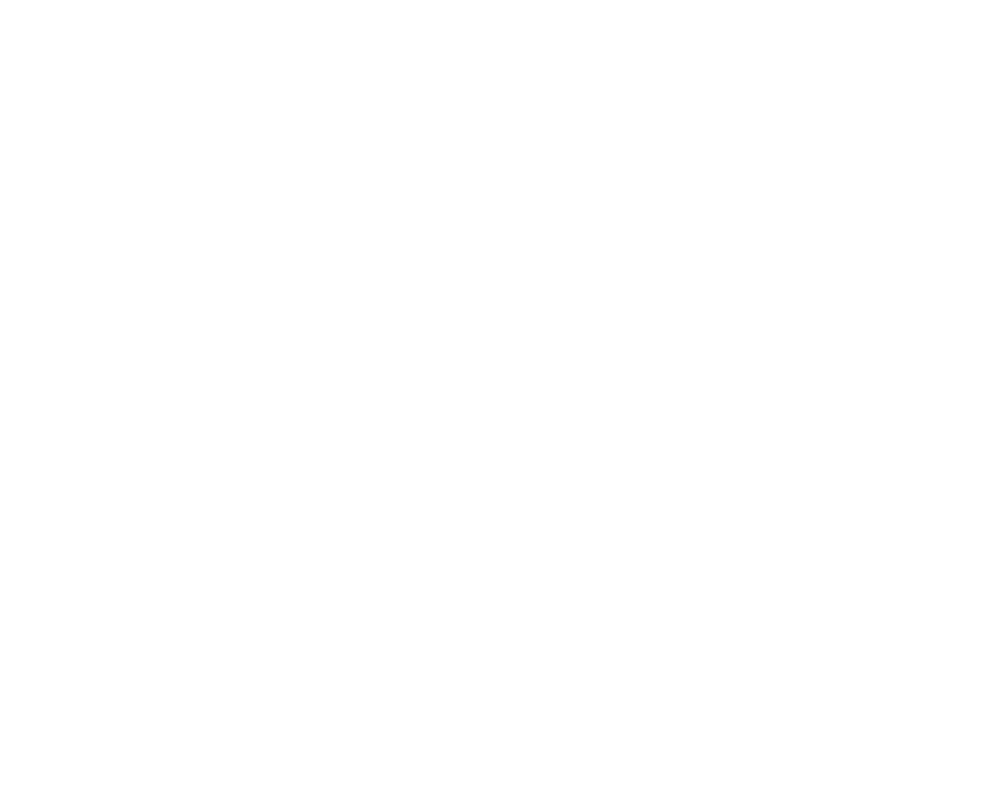

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:158: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im1 = ax[0,oi].imshow(opto_resp_RS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:83: RuntimeWarning: Mean of empty slice
  opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:83: RuntimeWarning: Mean of empty slice
  opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


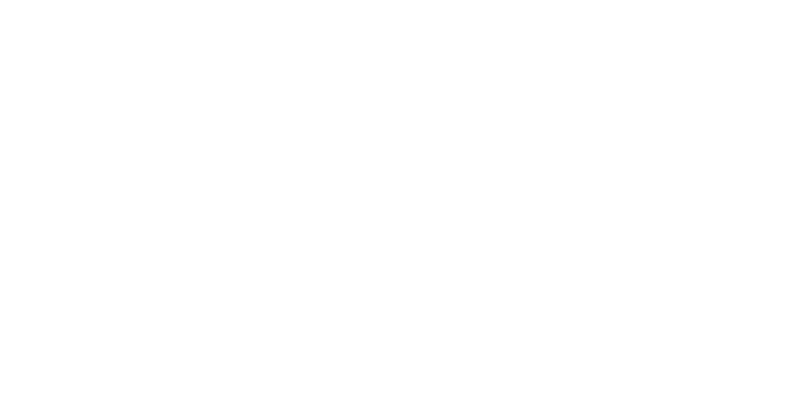

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


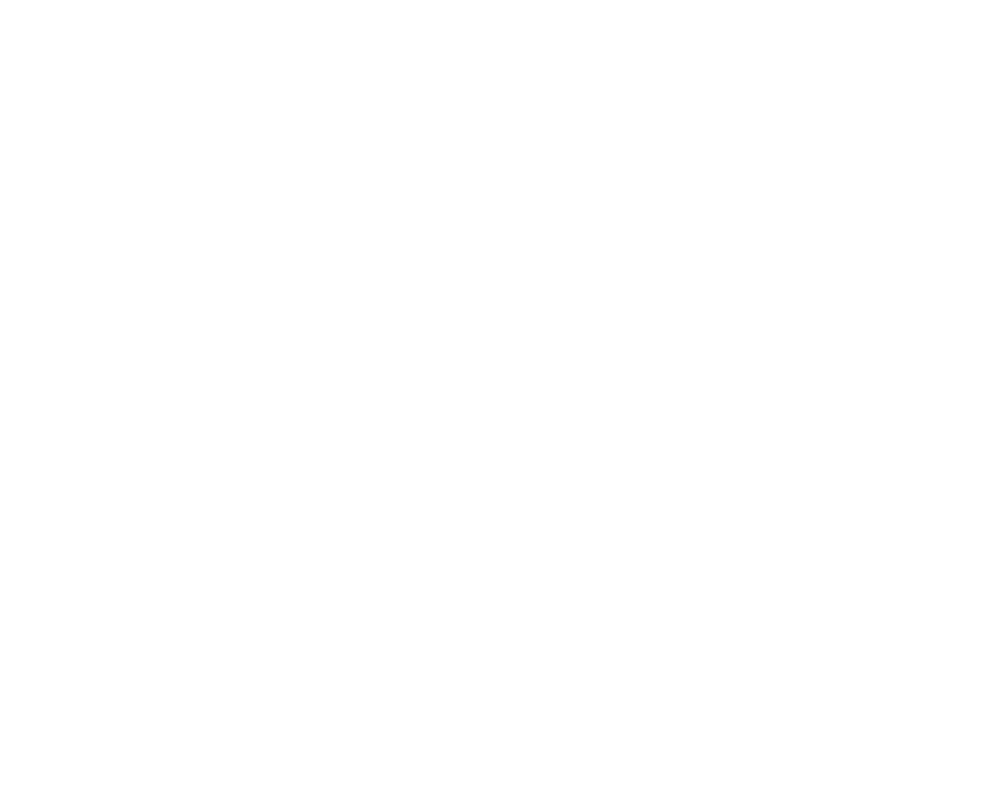

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:158: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im1 = ax[0,oi].imshow(opto_resp_RS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:83: RuntimeWarning: Mean of empty slice
  opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:83: RuntimeWarning: Mean of empty slice
  opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


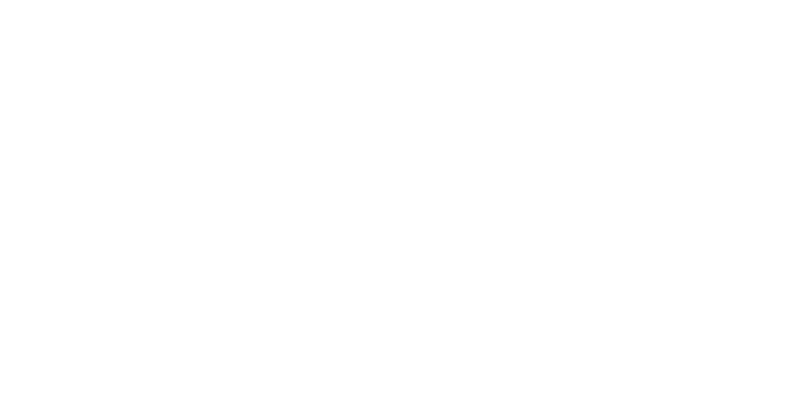

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


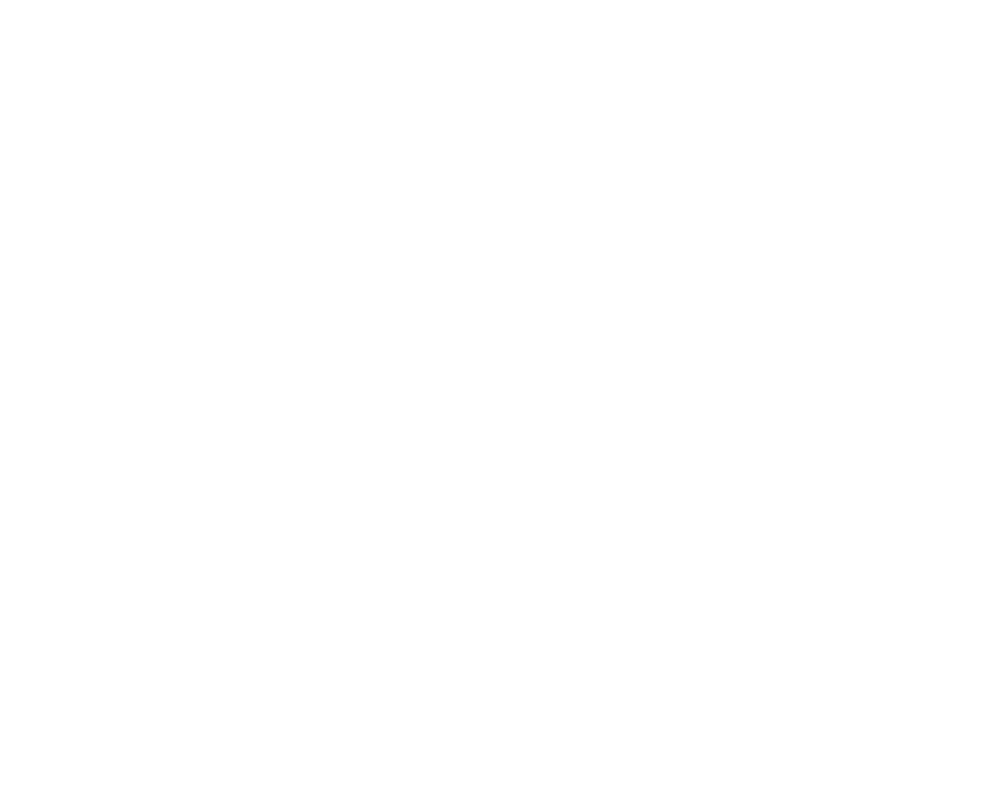

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:158: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im1 = ax[0,oi].imshow(opto_resp_RS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:83: RuntimeWarning: Mean of empty slice
  opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:83: RuntimeWarning: Mean of empty slice
  opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


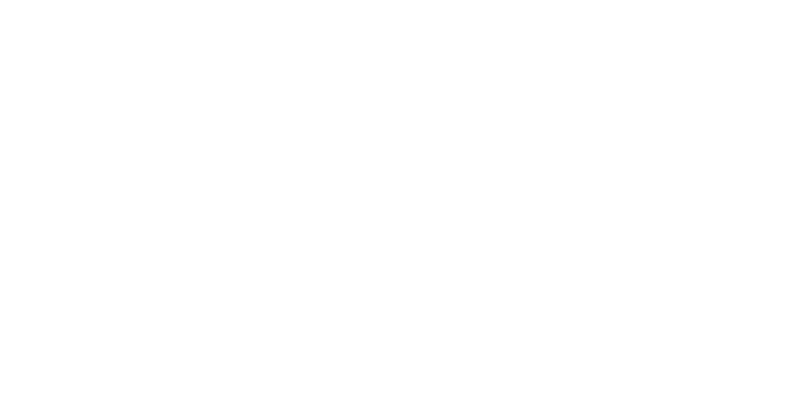

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


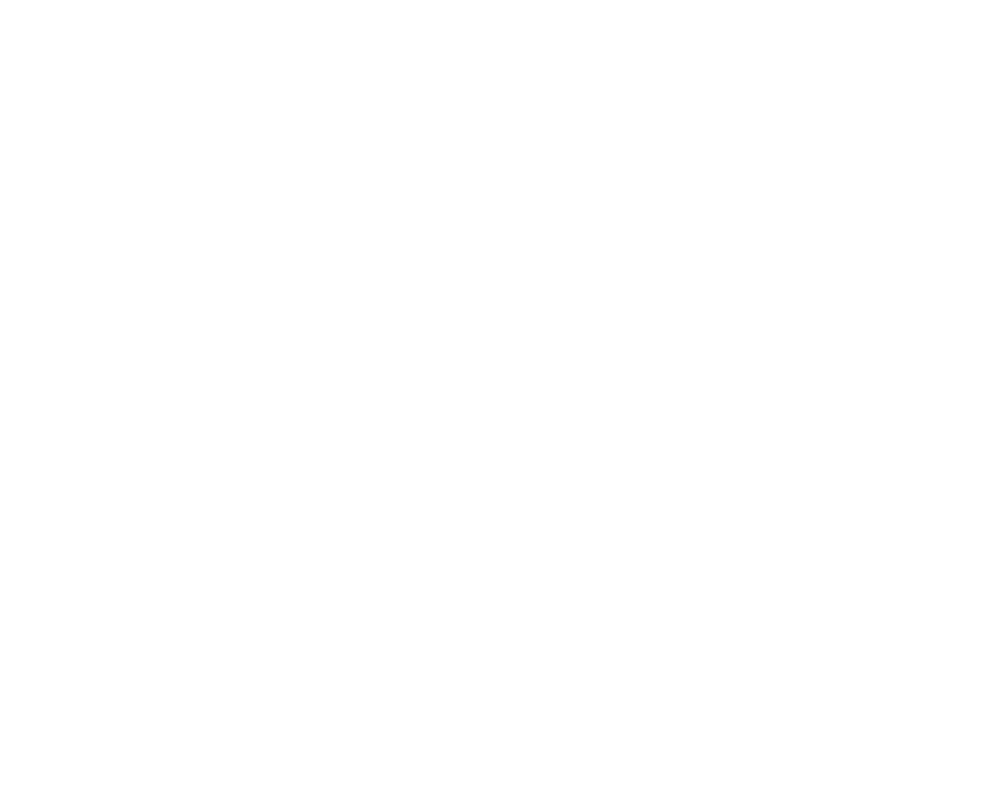

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:158: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im1 = ax[0,oi].imshow(opto_resp_RS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:83: RuntimeWarning: Mean of empty slice
  opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:83: RuntimeWarning: Mean of empty slice
  opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


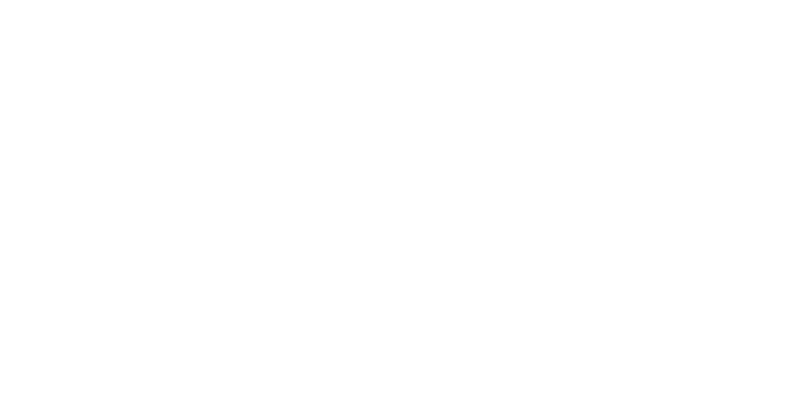

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:107: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:106: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


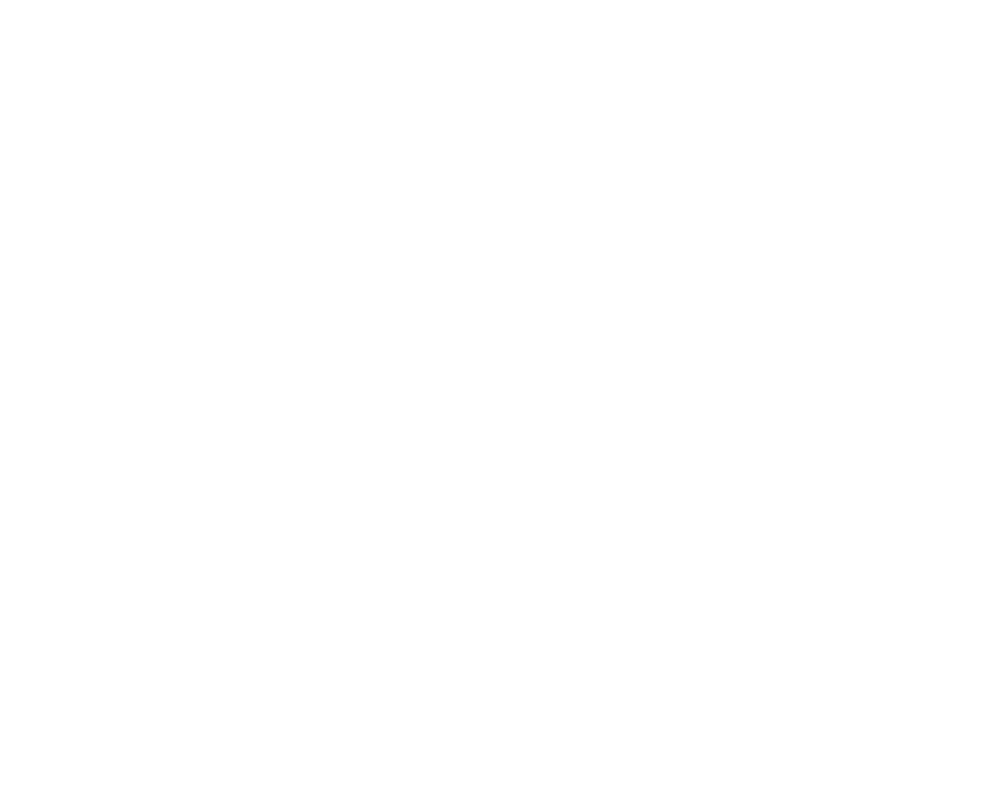

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:158: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im1 = ax[0,oi].imshow(opto_resp_RS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,


<IPython.core.display.Javascript object>


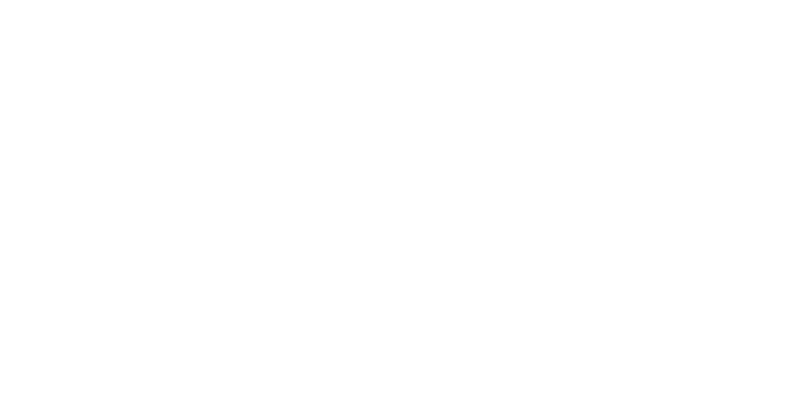

<IPython.core.display.Javascript object>


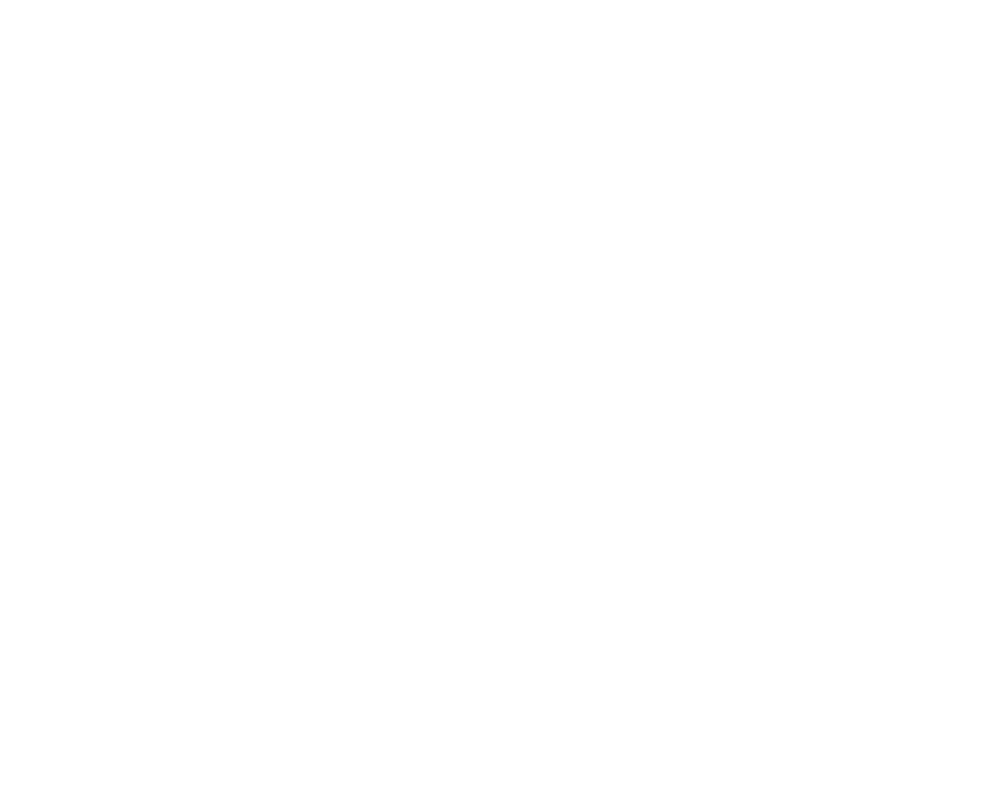

<IPython.core.display.Javascript object>


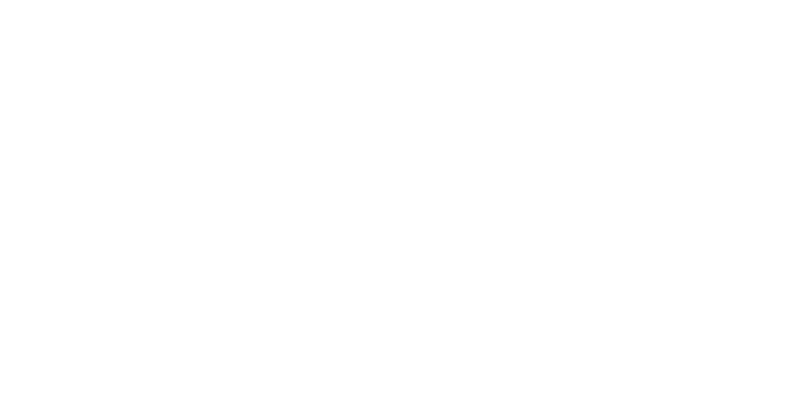

<IPython.core.display.Javascript object>


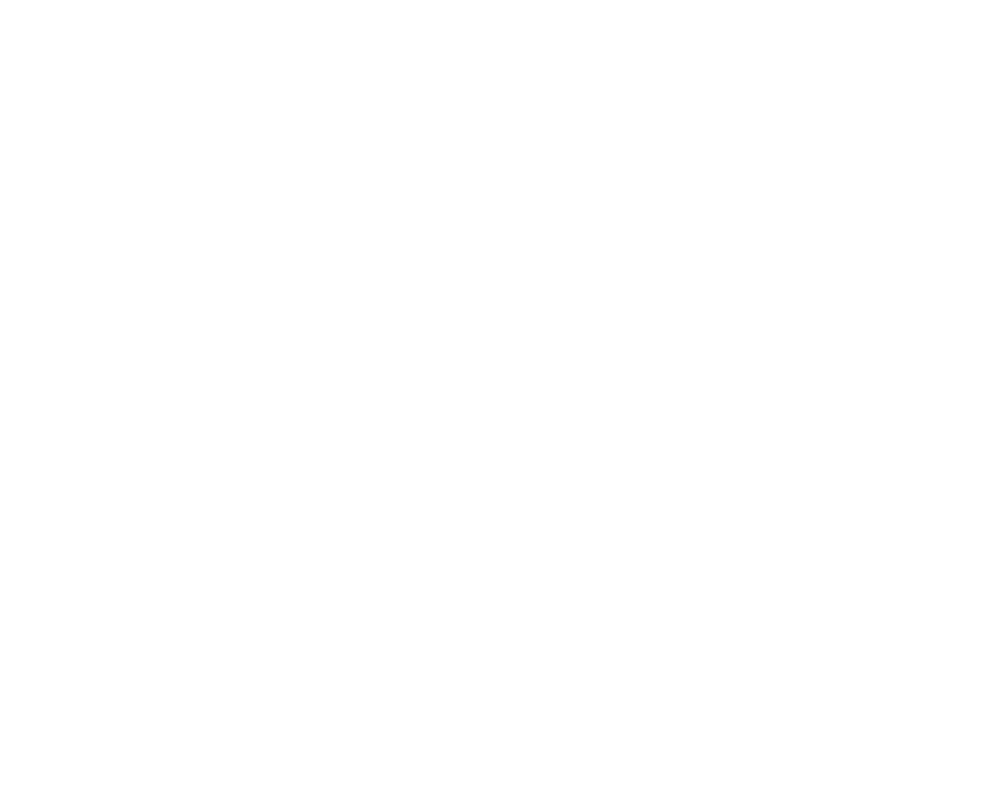

<IPython.core.display.Javascript object>


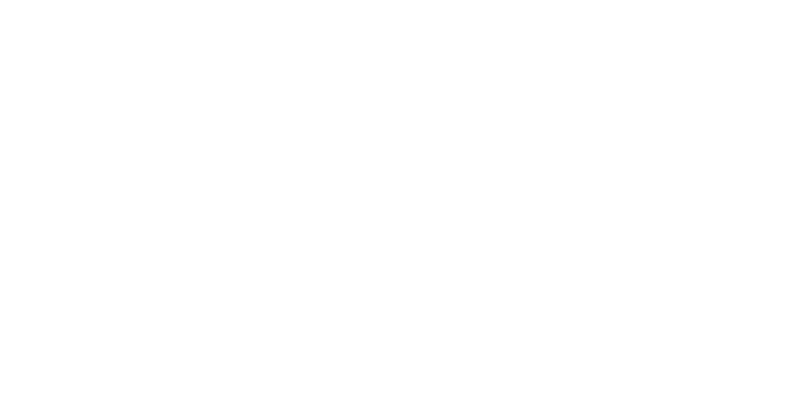

<IPython.core.display.Javascript object>


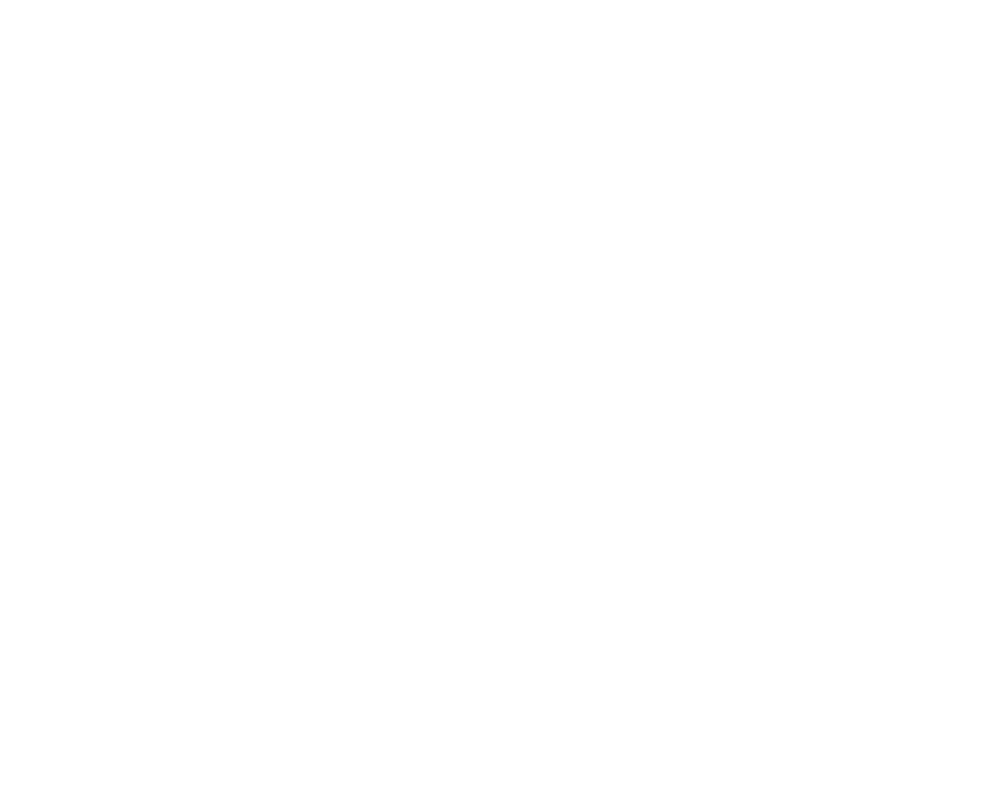

<IPython.core.display.Javascript object>


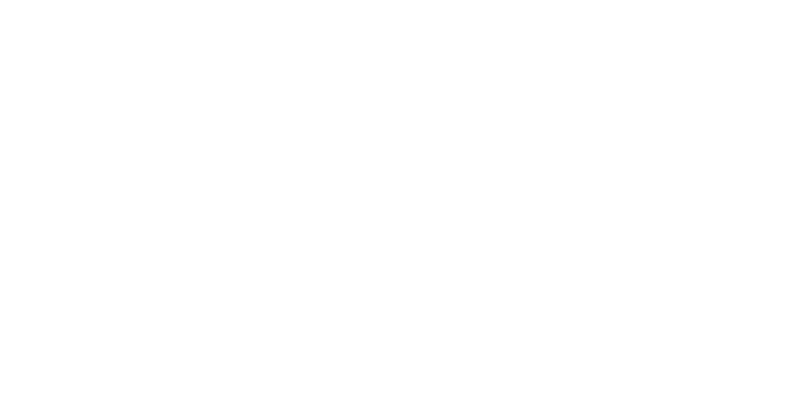

<IPython.core.display.Javascript object>


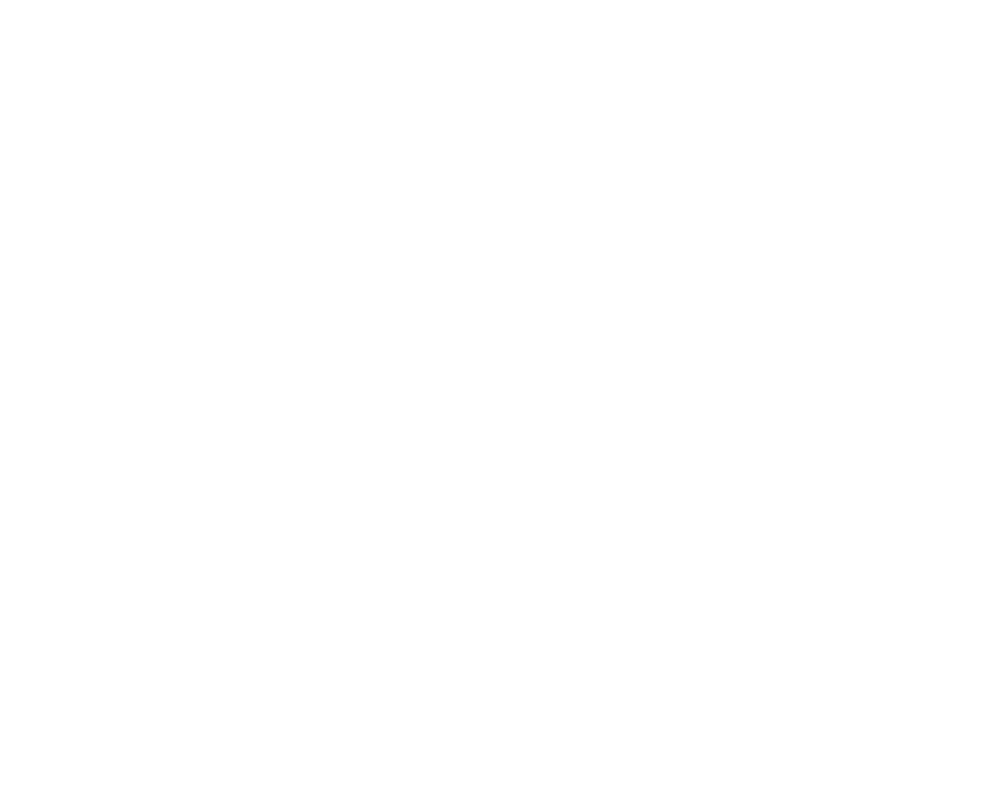

<IPython.core.display.Javascript object>


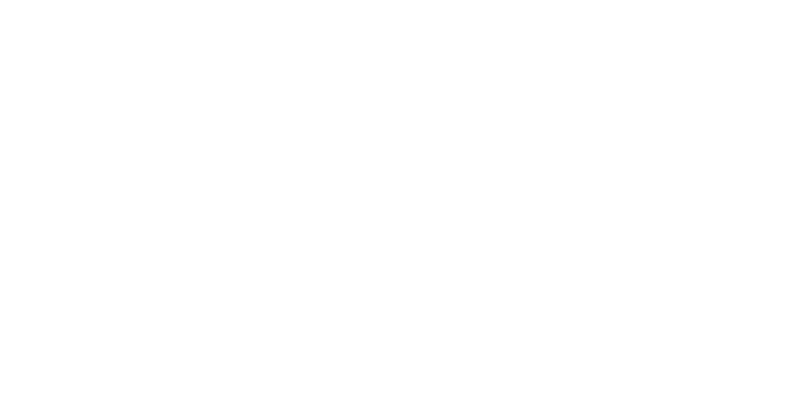

<IPython.core.display.Javascript object>


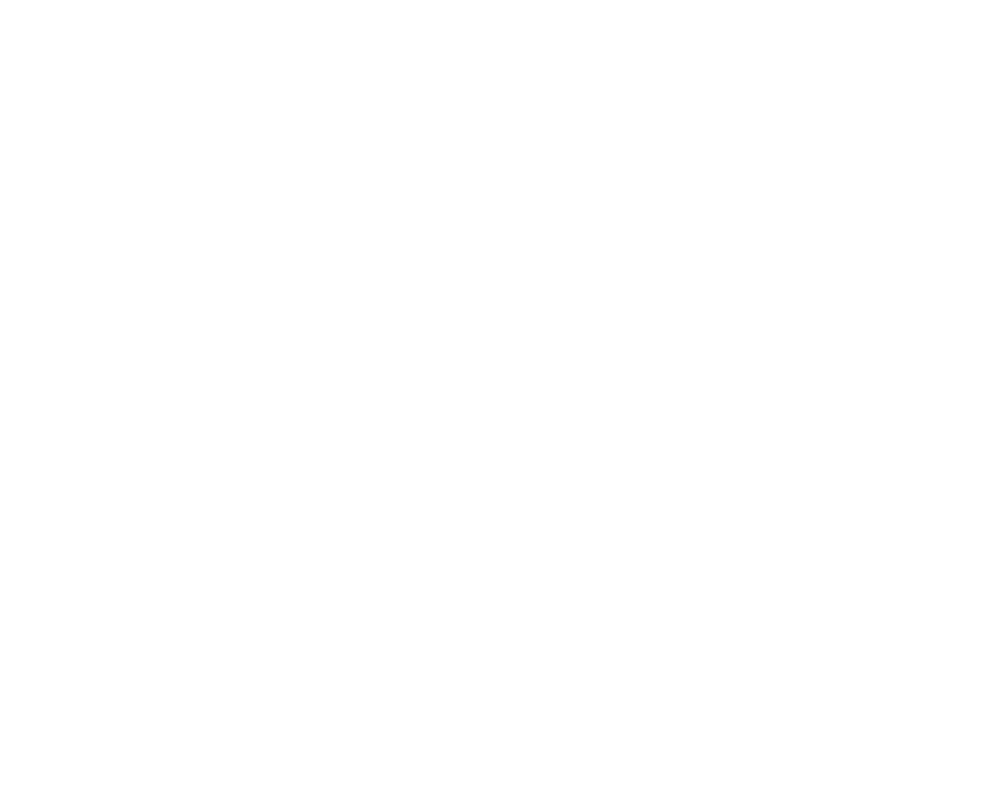

<IPython.core.display.Javascript object>


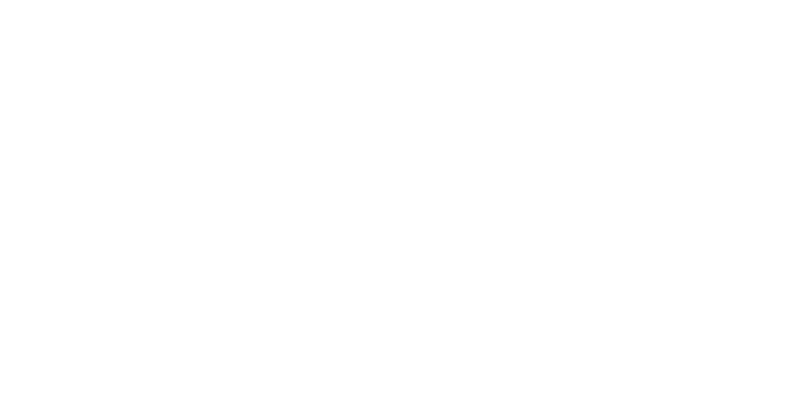

<IPython.core.display.Javascript object>


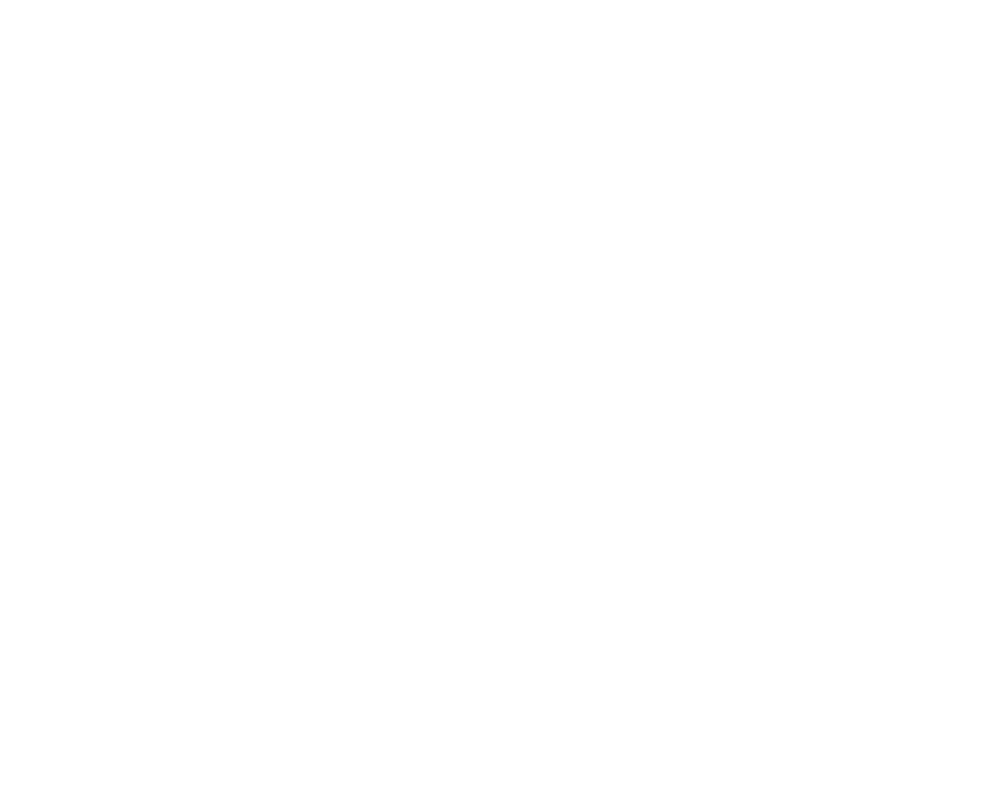

<IPython.core.display.Javascript object>


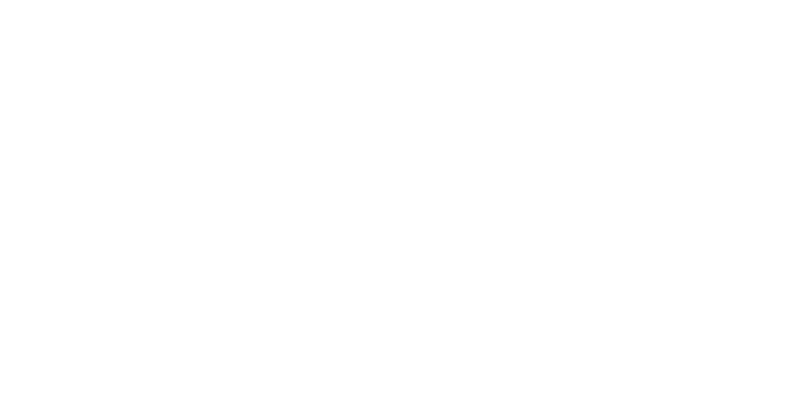

<IPython.core.display.Javascript object>


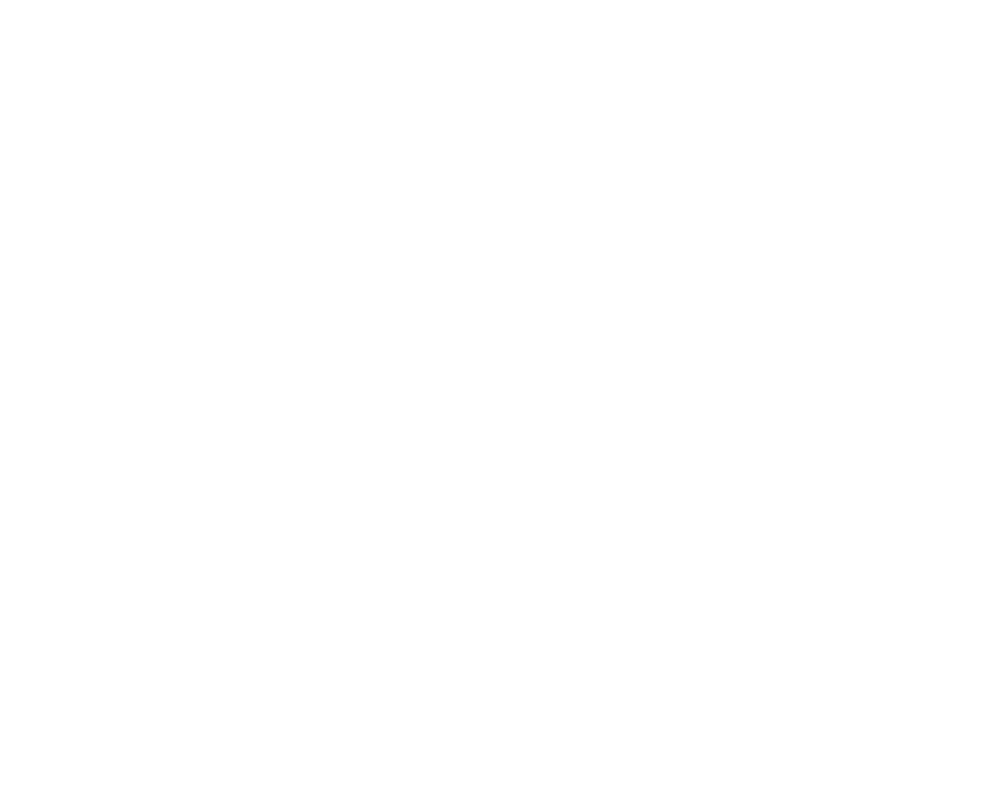

<IPython.core.display.Javascript object>


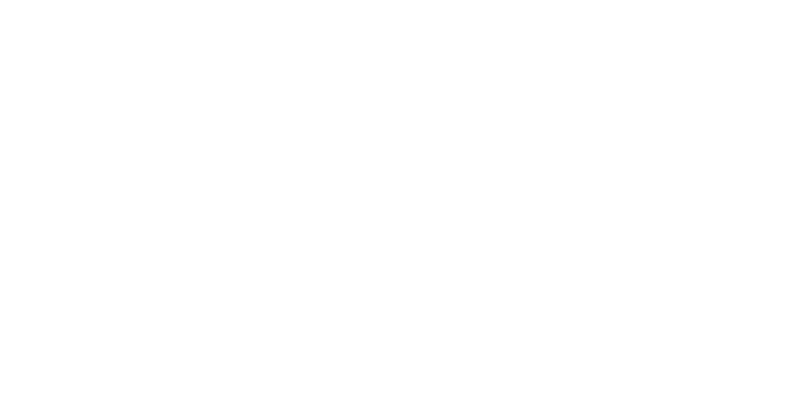

<IPython.core.display.Javascript object>


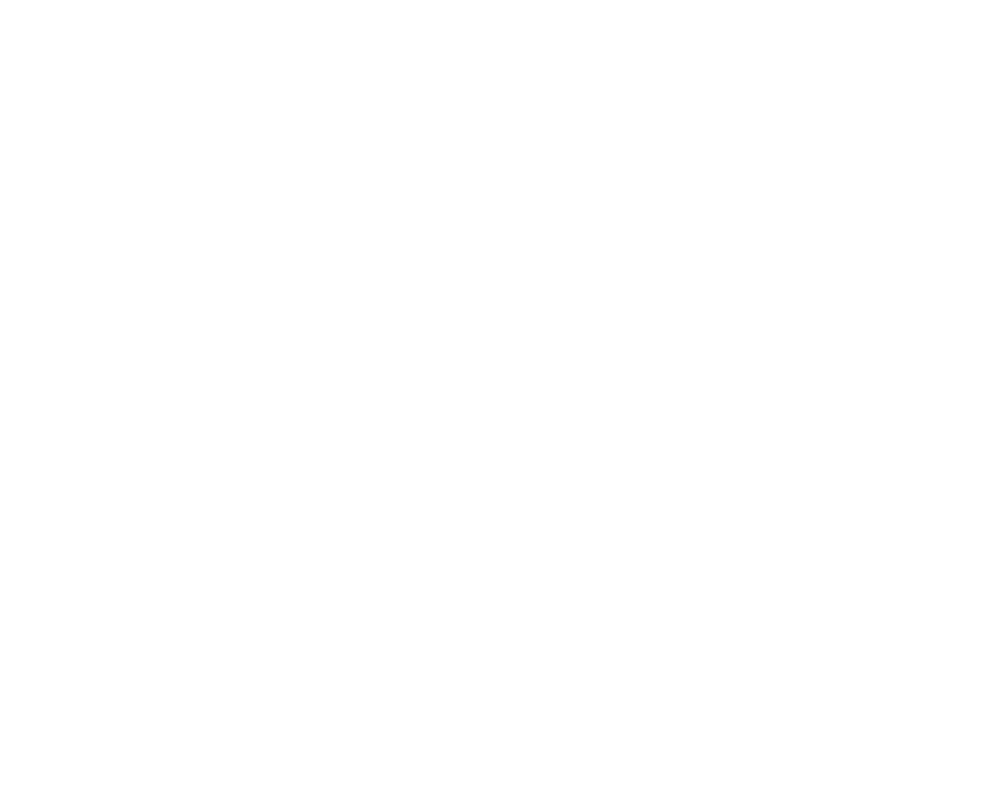

<IPython.core.display.Javascript object>


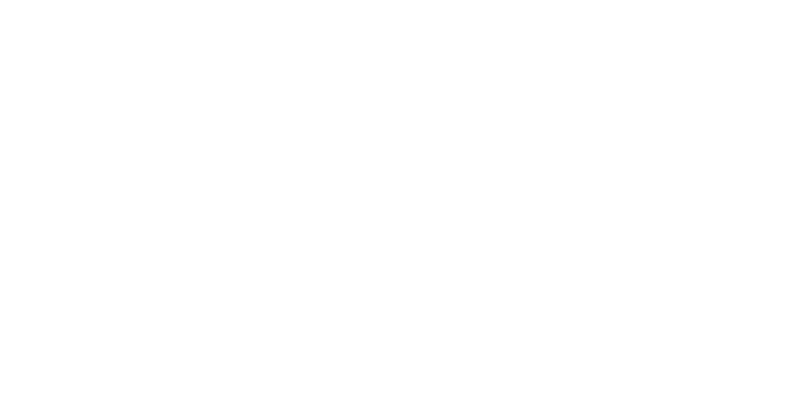

<IPython.core.display.Javascript object>


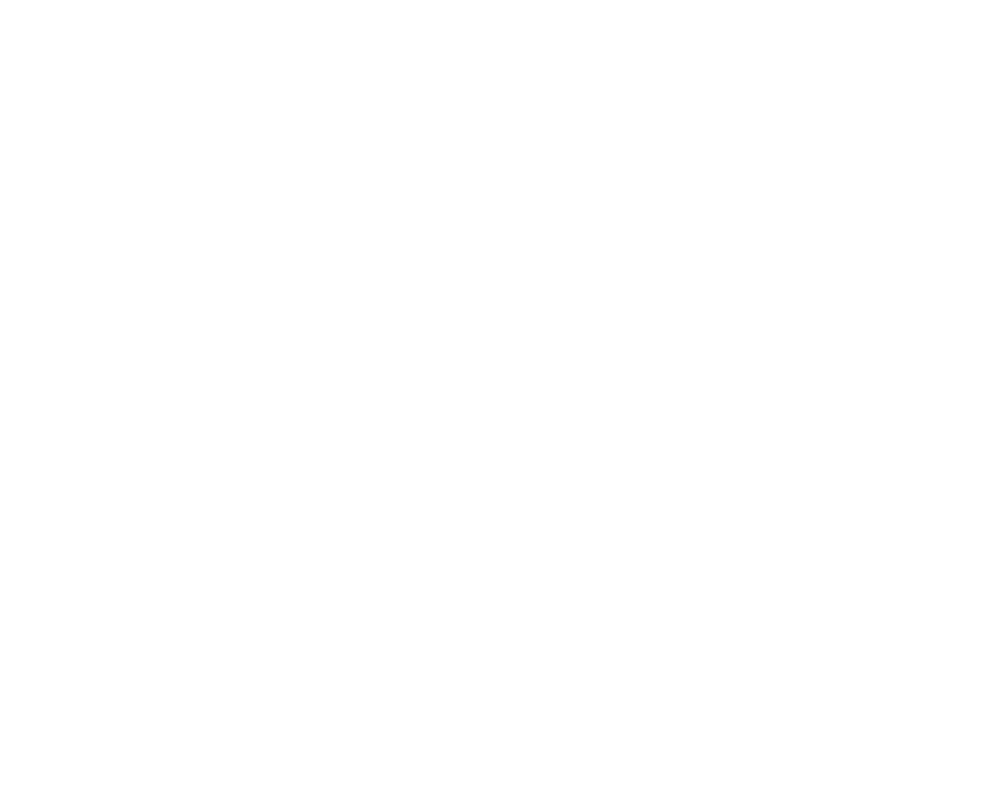

<IPython.core.display.Javascript object>


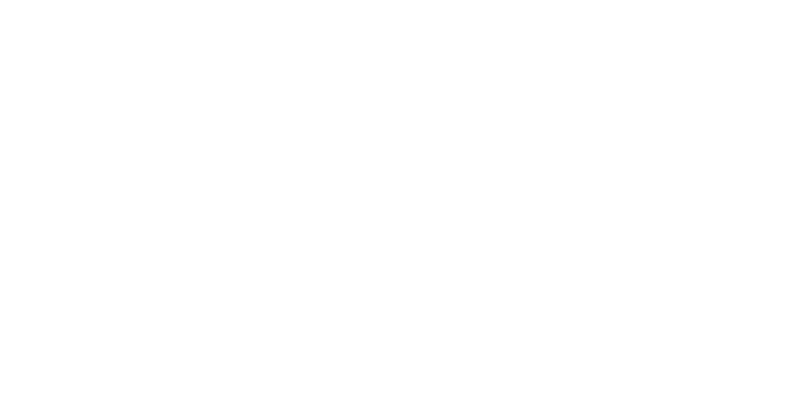

<IPython.core.display.Javascript object>


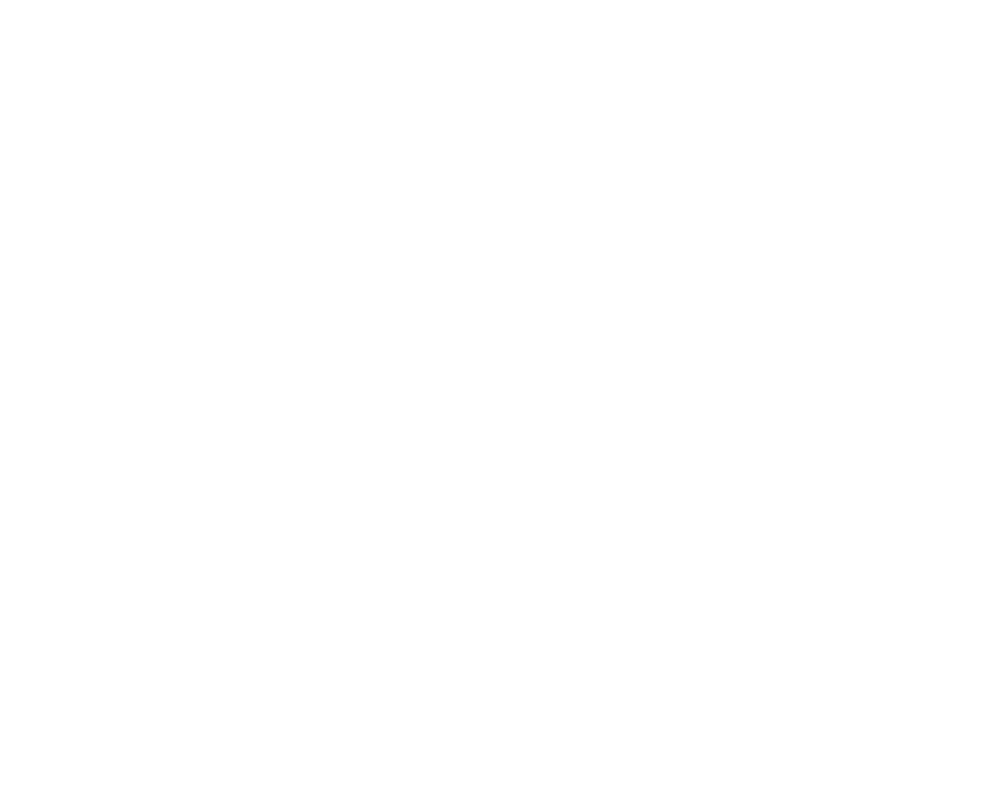

<IPython.core.display.Javascript object>


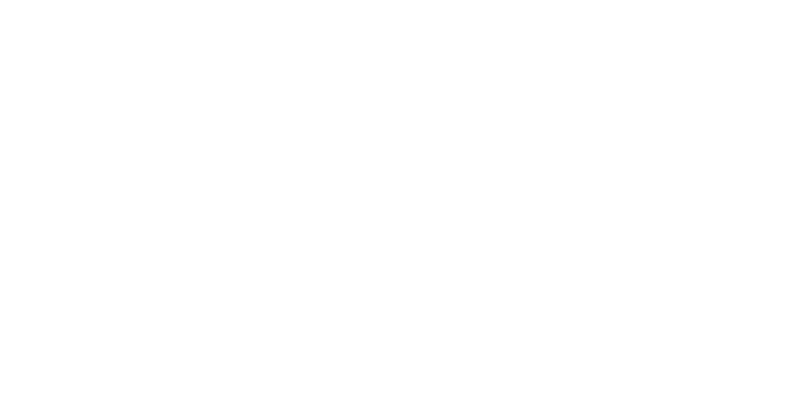

<IPython.core.display.Javascript object>


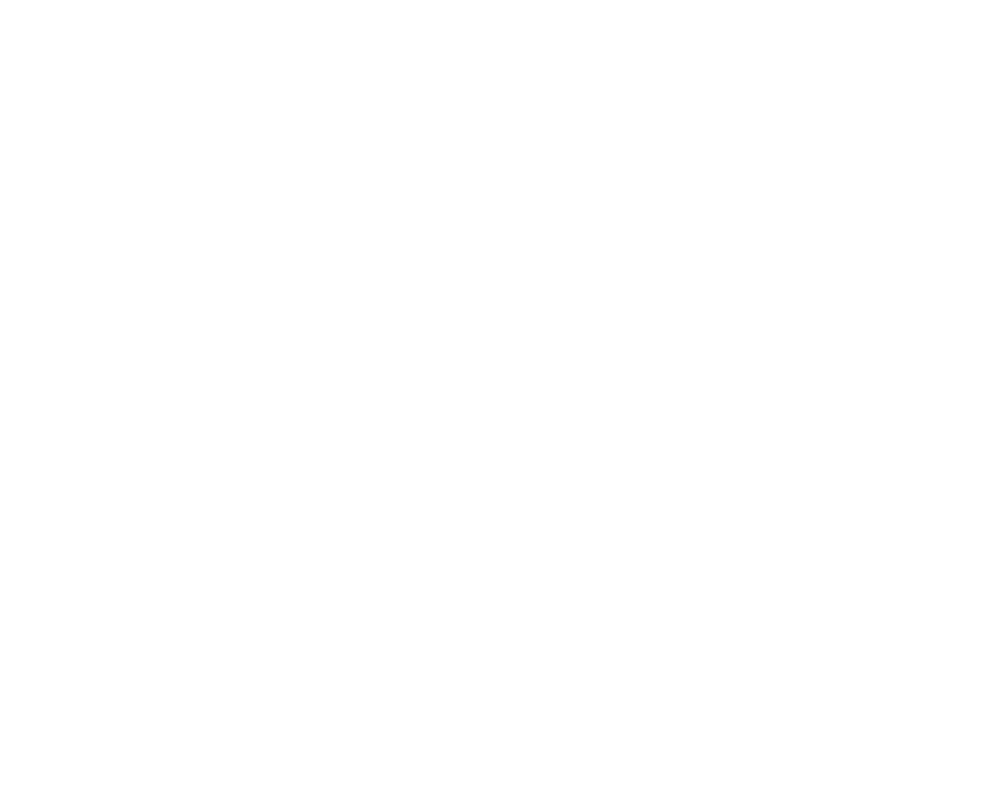

<IPython.core.display.Javascript object>


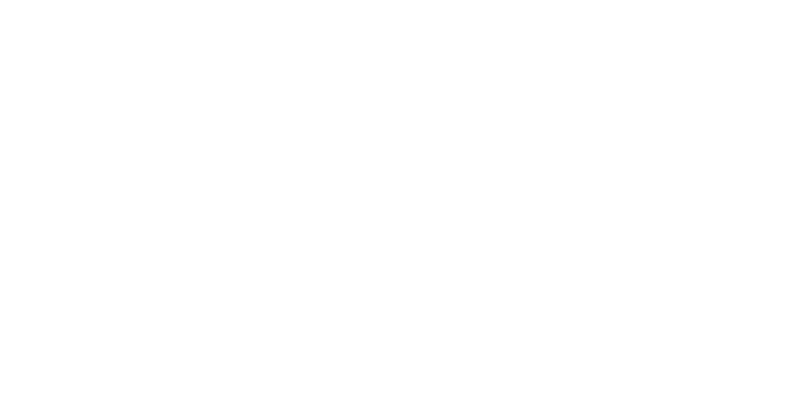

<IPython.core.display.Javascript object>


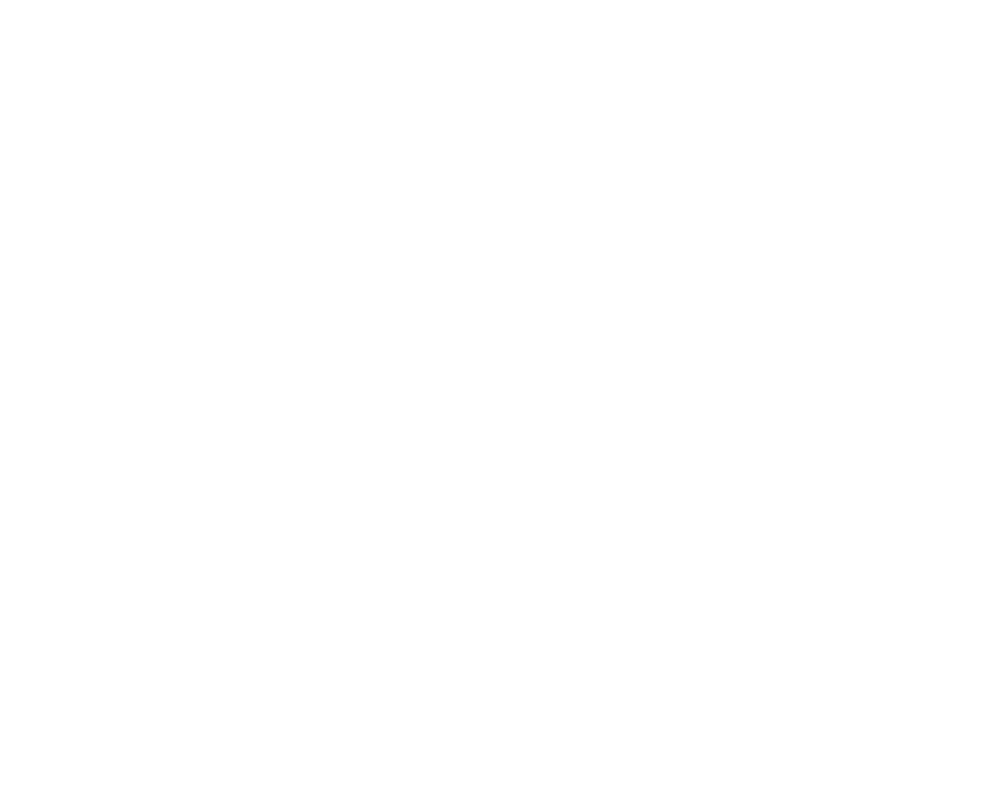

<IPython.core.display.Javascript object>


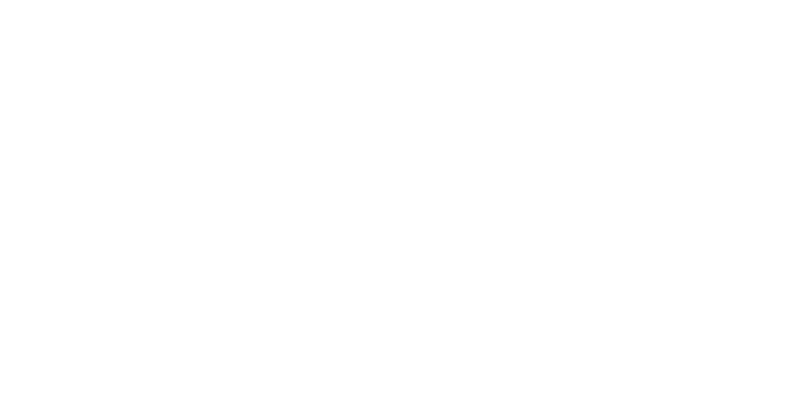

<IPython.core.display.Javascript object>


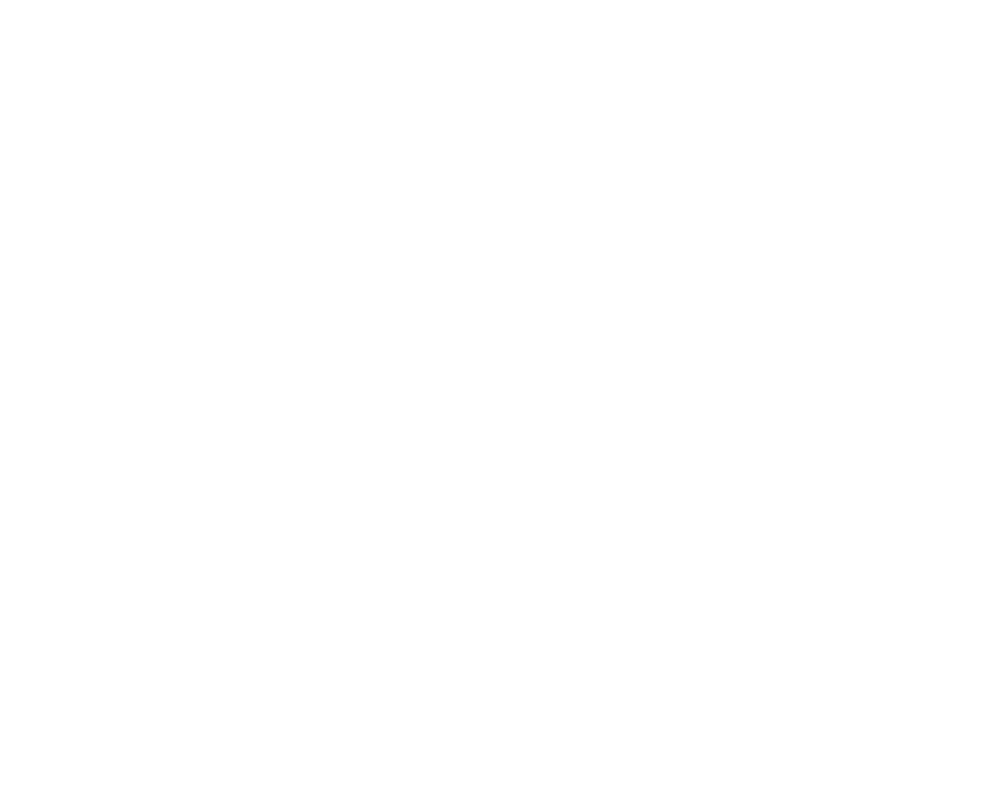

<IPython.core.display.Javascript object>


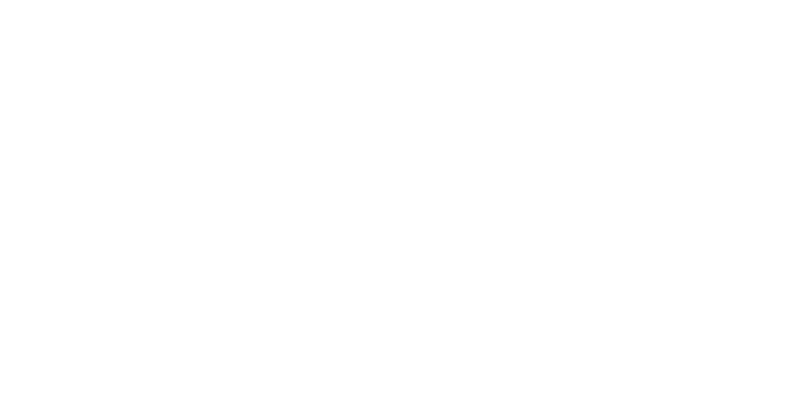

<IPython.core.display.Javascript object>


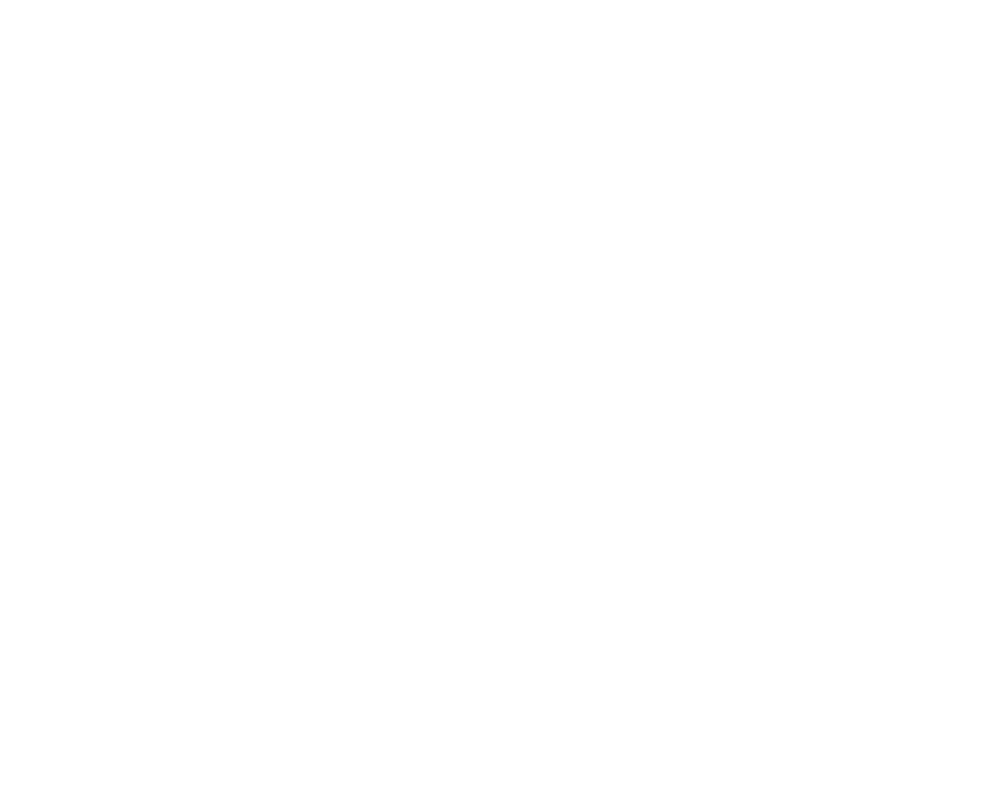

<IPython.core.display.Javascript object>


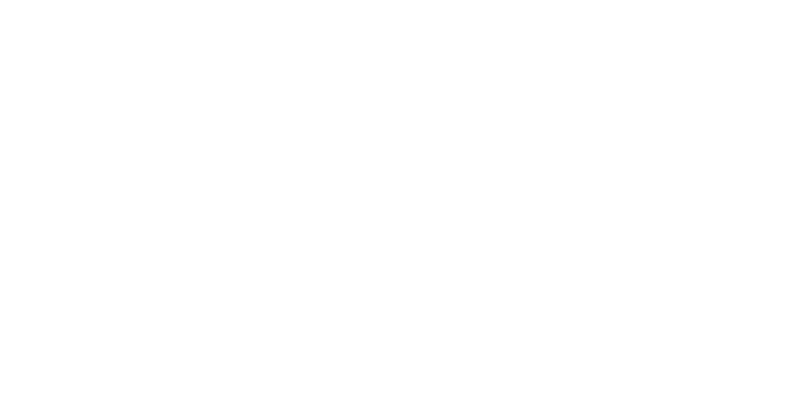

<IPython.core.display.Javascript object>


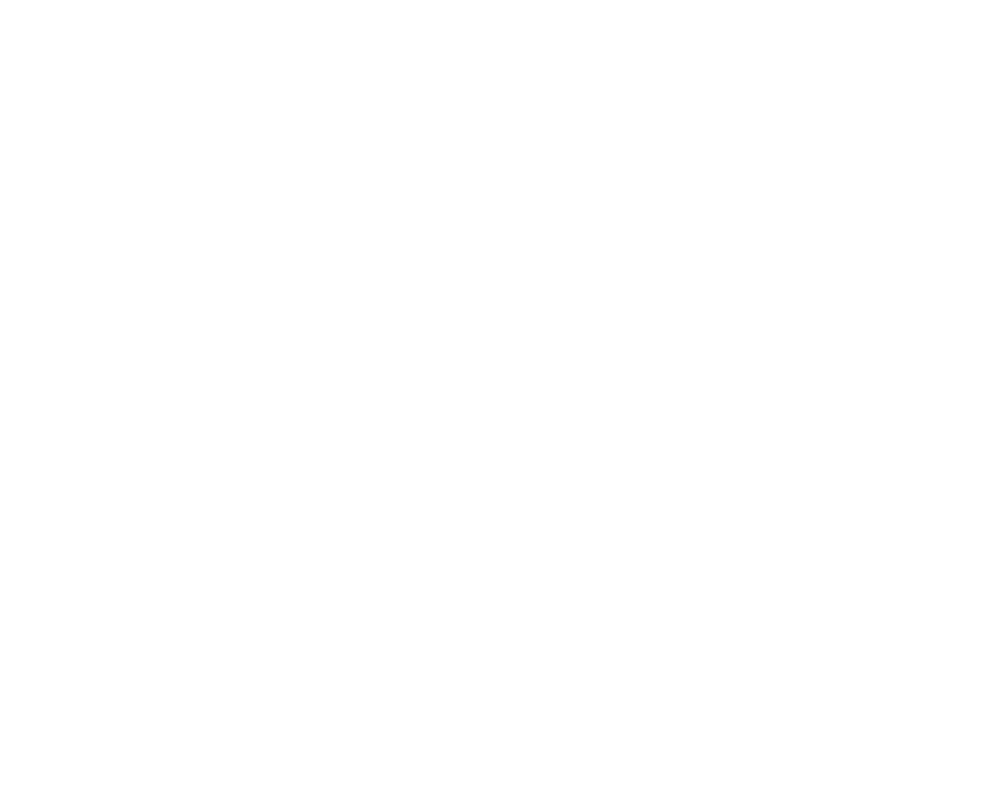

<IPython.core.display.Javascript object>


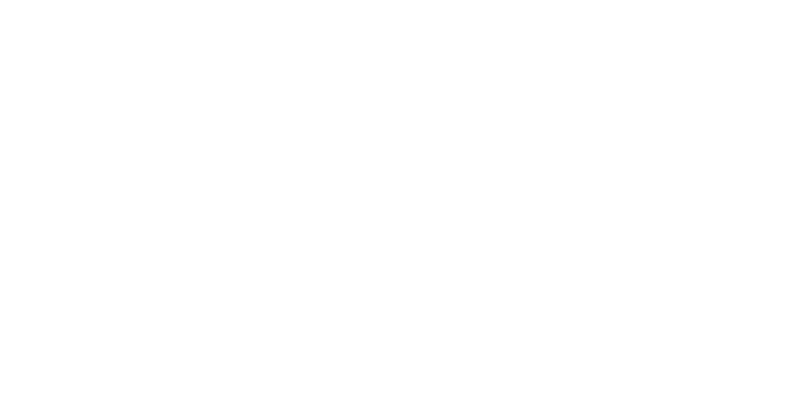

<IPython.core.display.Javascript object>


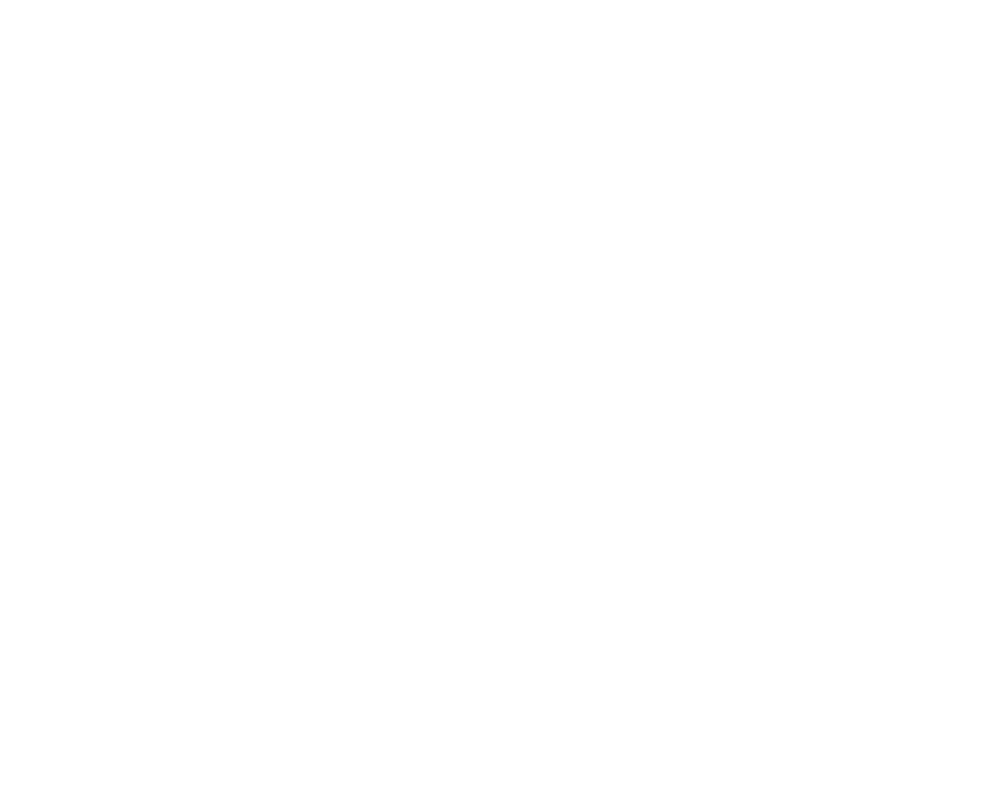

<IPython.core.display.Javascript object>


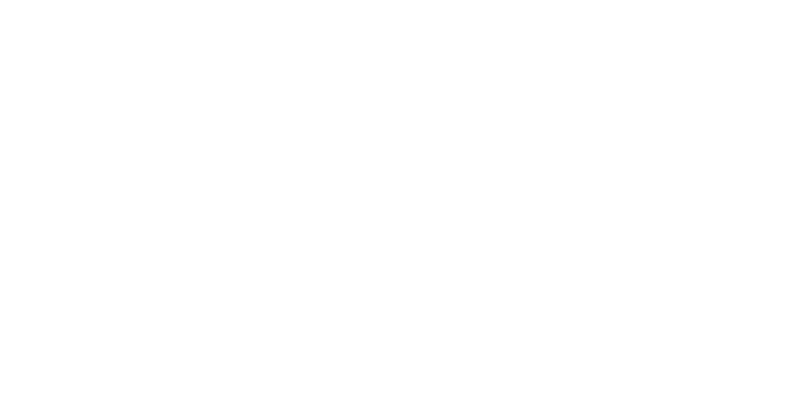

<IPython.core.display.Javascript object>


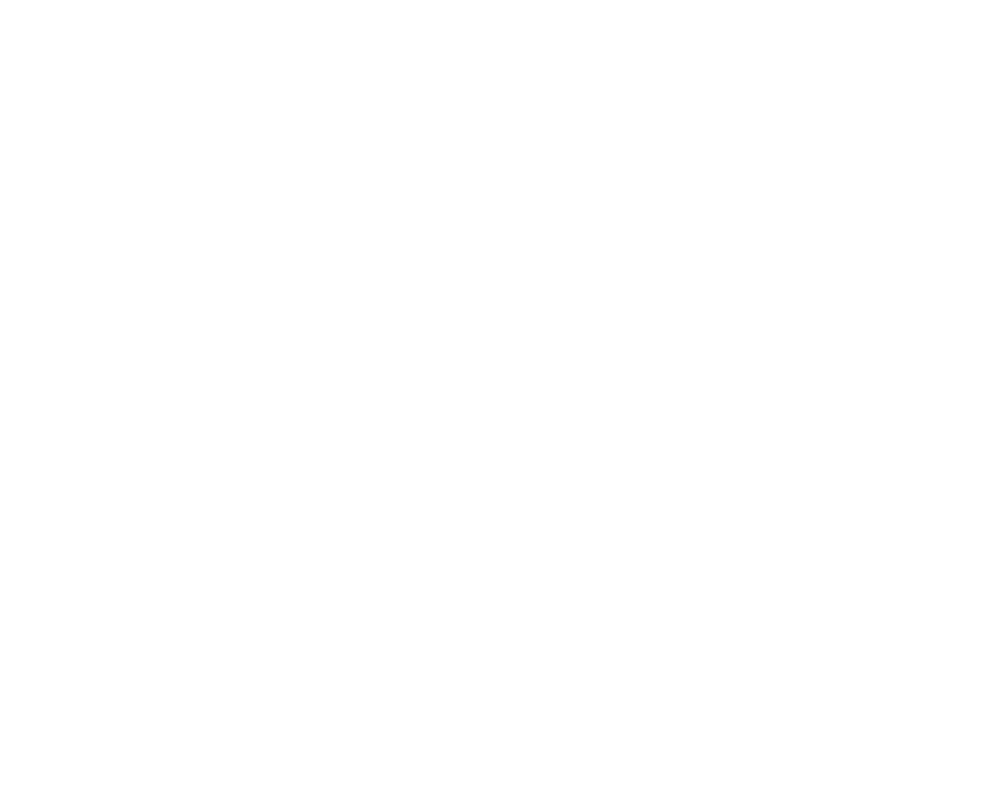

<IPython.core.display.Javascript object>


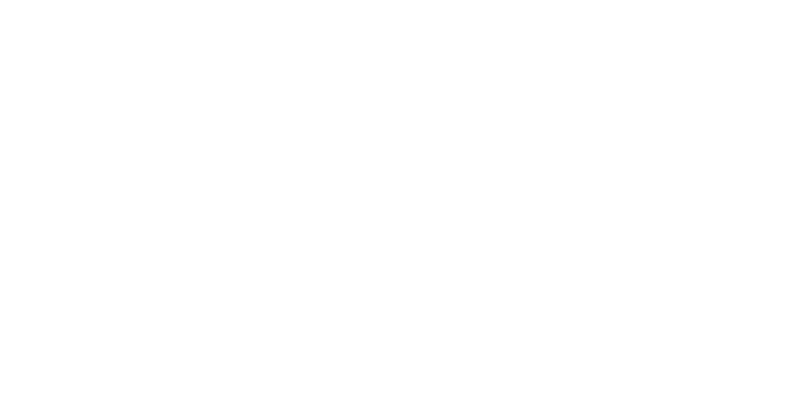

<IPython.core.display.Javascript object>


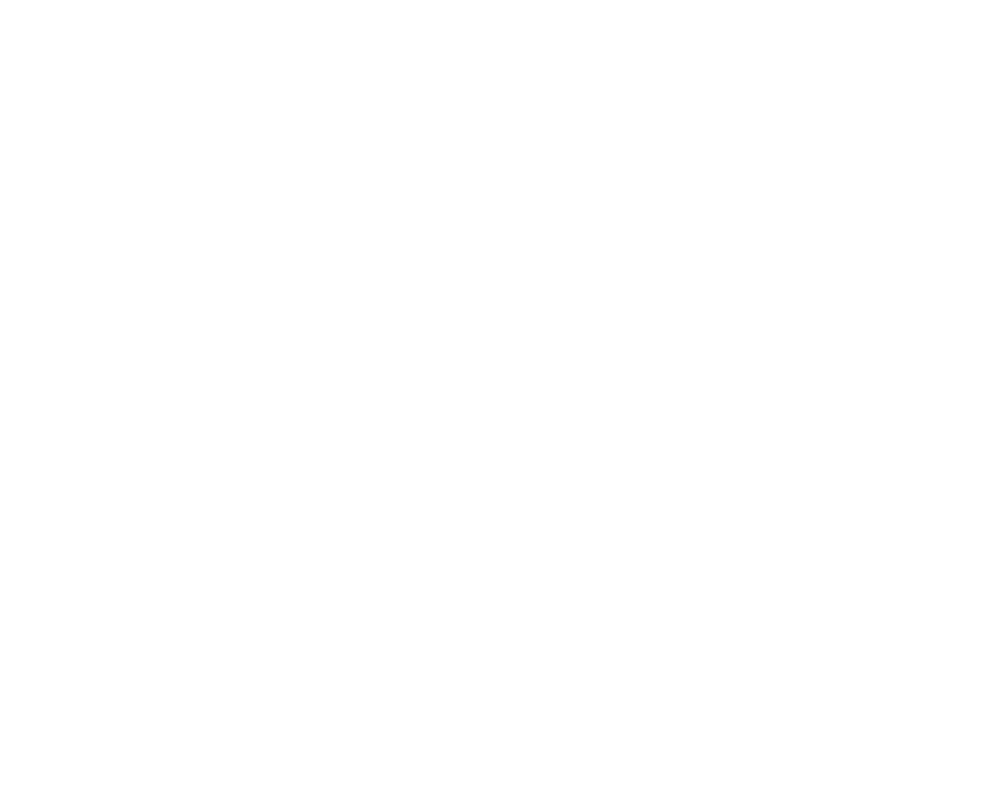

<IPython.core.display.Javascript object>


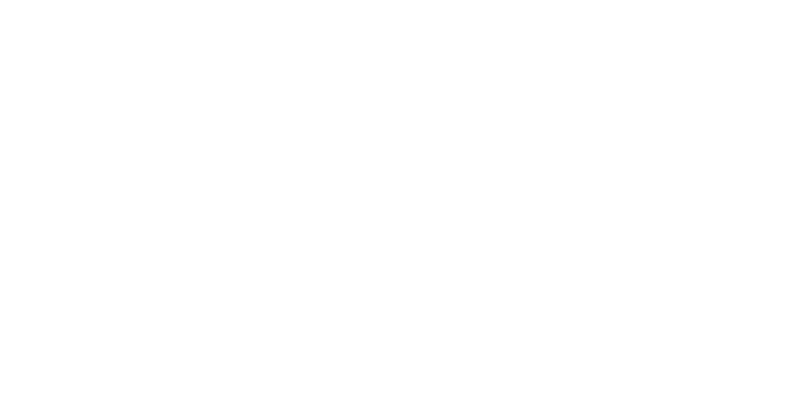

<IPython.core.display.Javascript object>


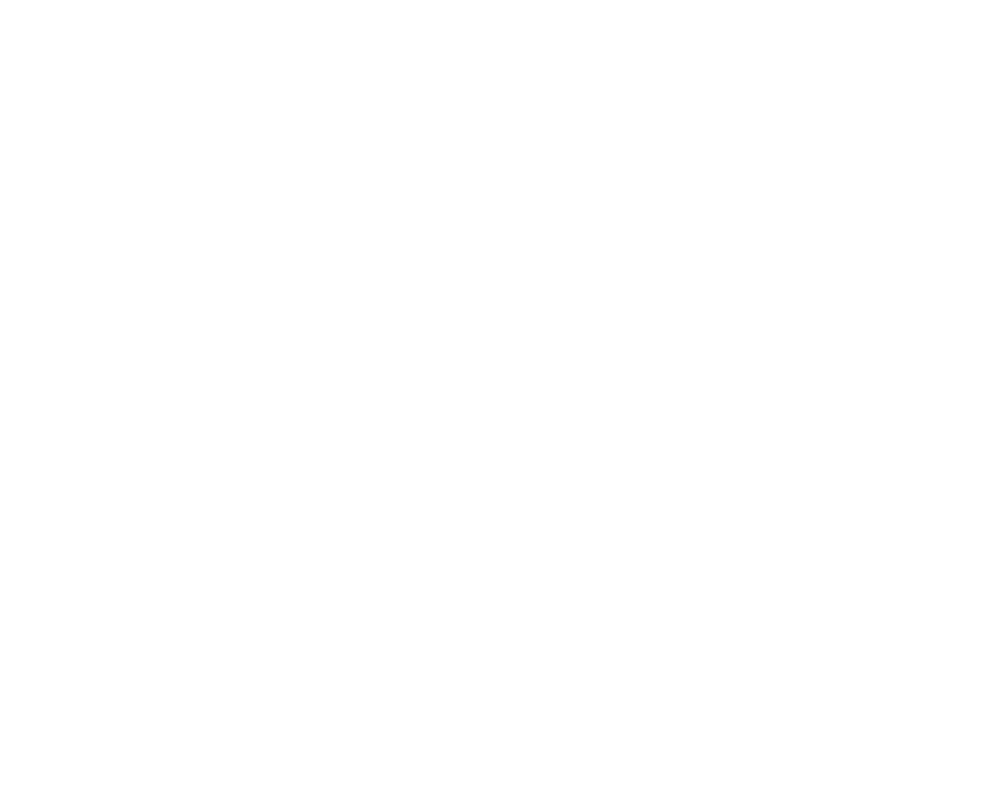

<IPython.core.display.Javascript object>


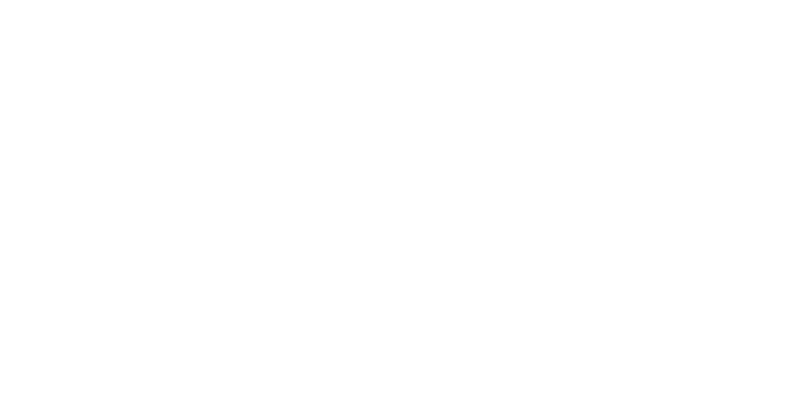

<IPython.core.display.Javascript object>


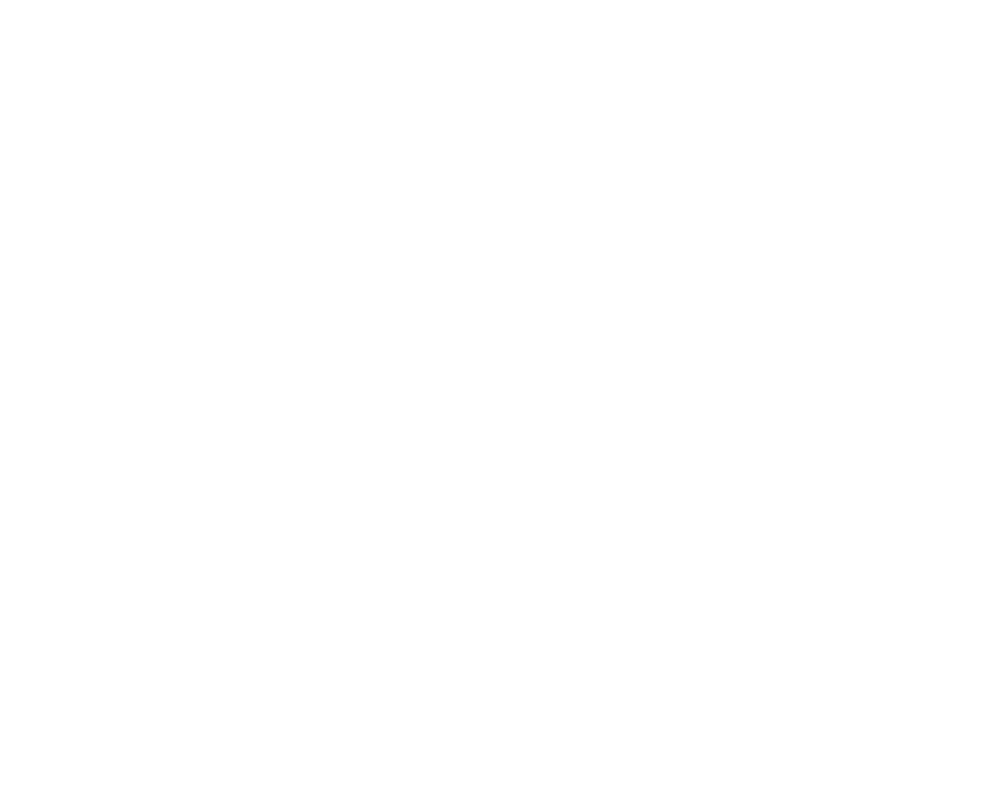

<IPython.core.display.Javascript object>


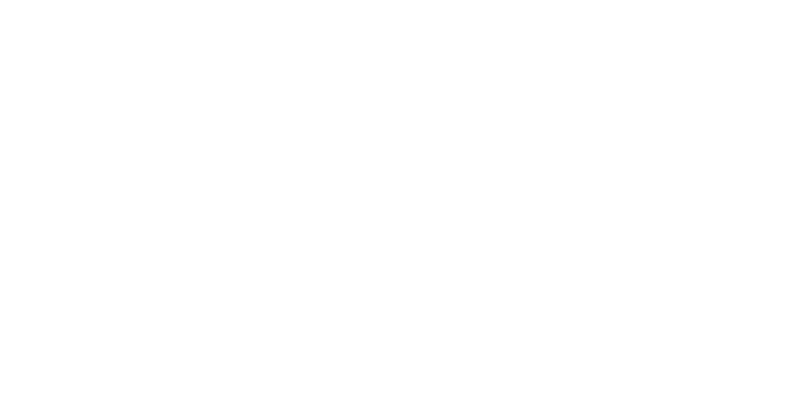

<IPython.core.display.Javascript object>


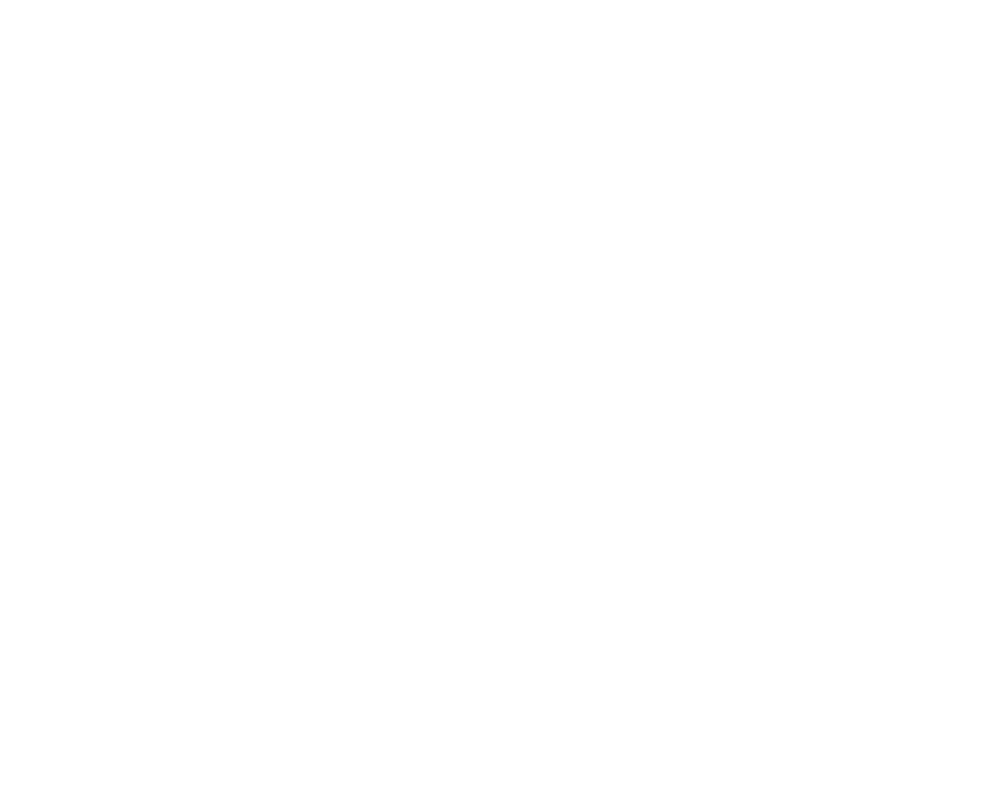

<IPython.core.display.Javascript object>


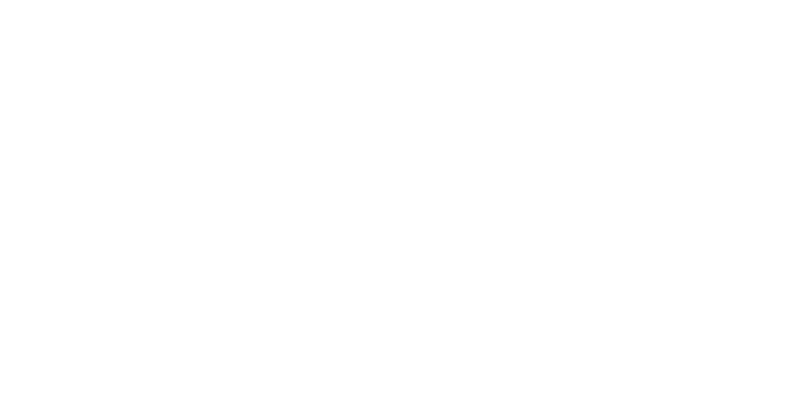

<IPython.core.display.Javascript object>


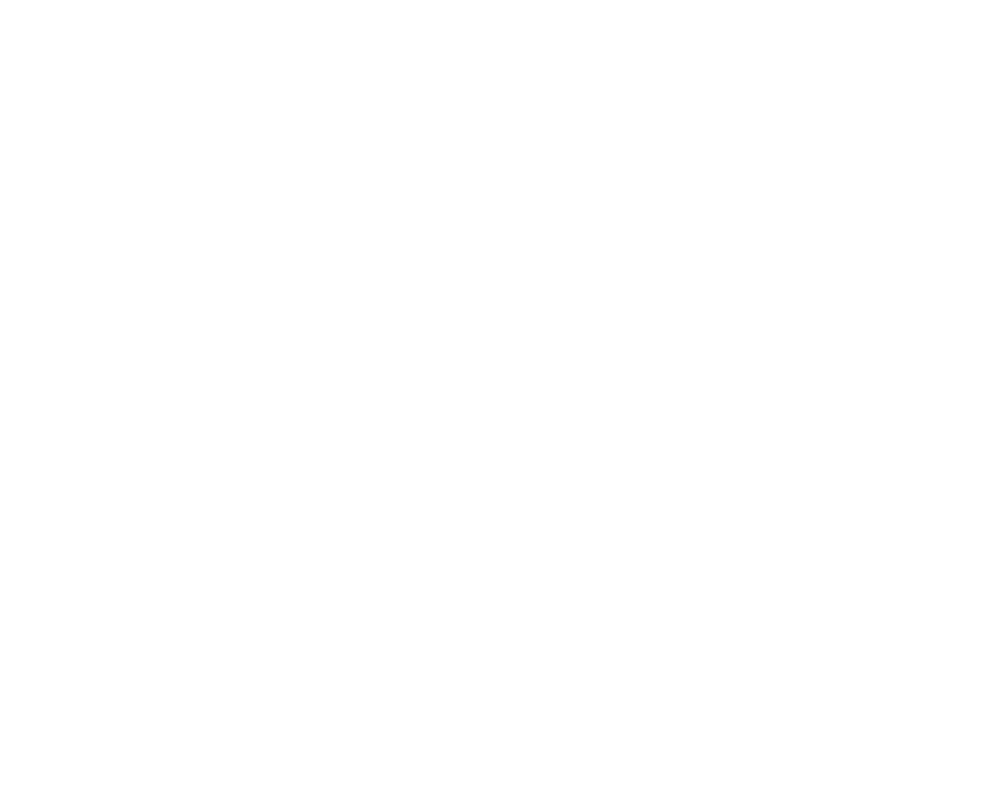

<IPython.core.display.Javascript object>


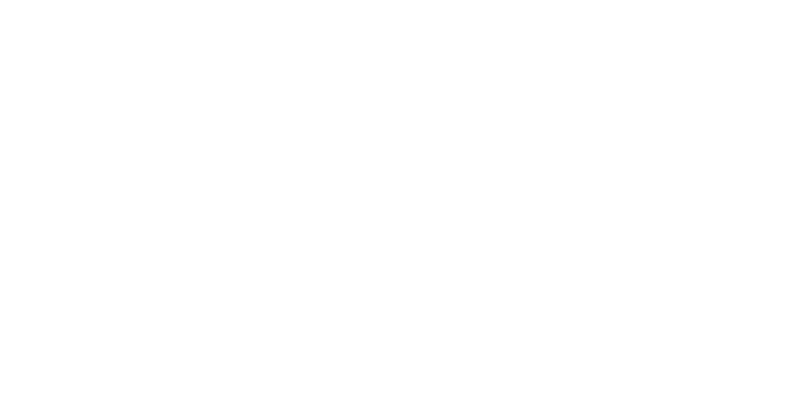

<IPython.core.display.Javascript object>


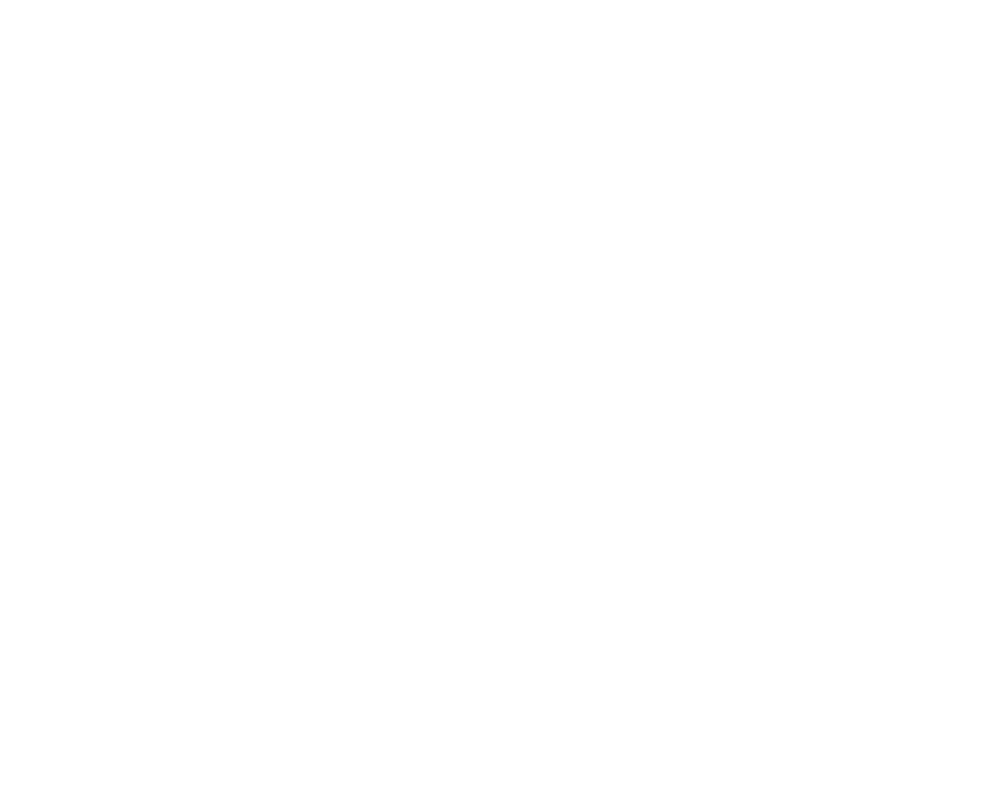

<IPython.core.display.Javascript object>


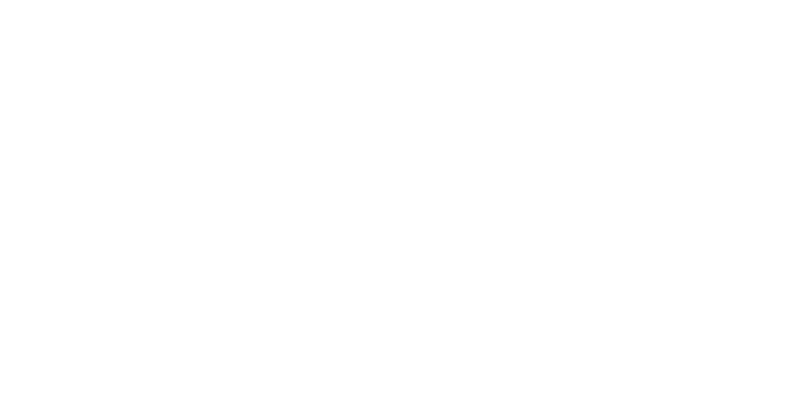

<IPython.core.display.Javascript object>


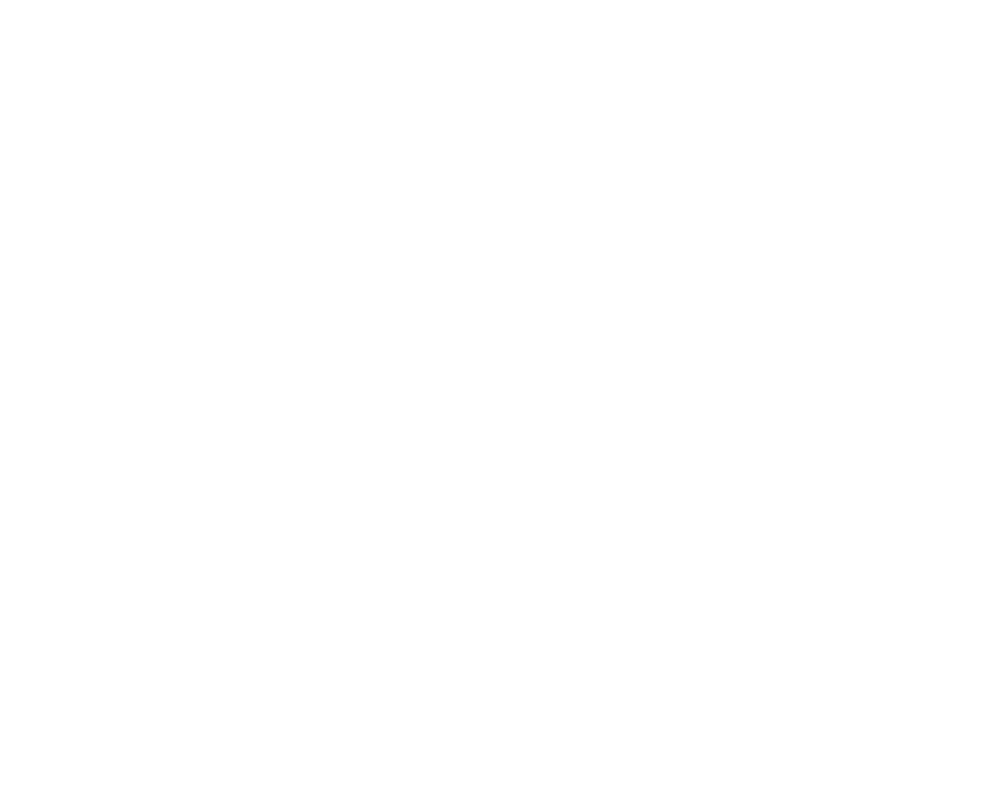

<IPython.core.display.Javascript object>


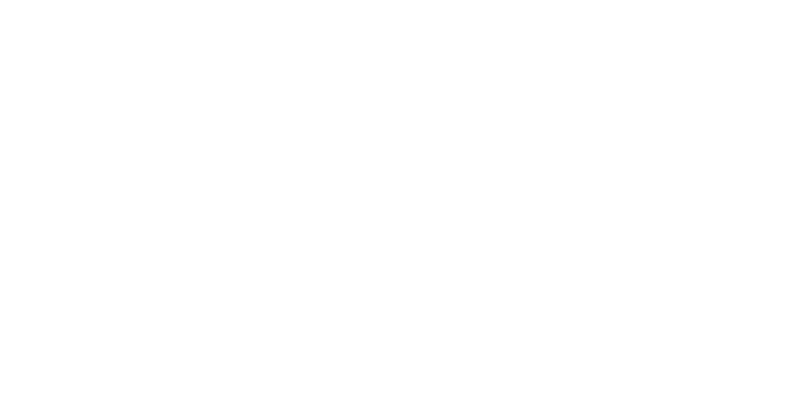

<IPython.core.display.Javascript object>


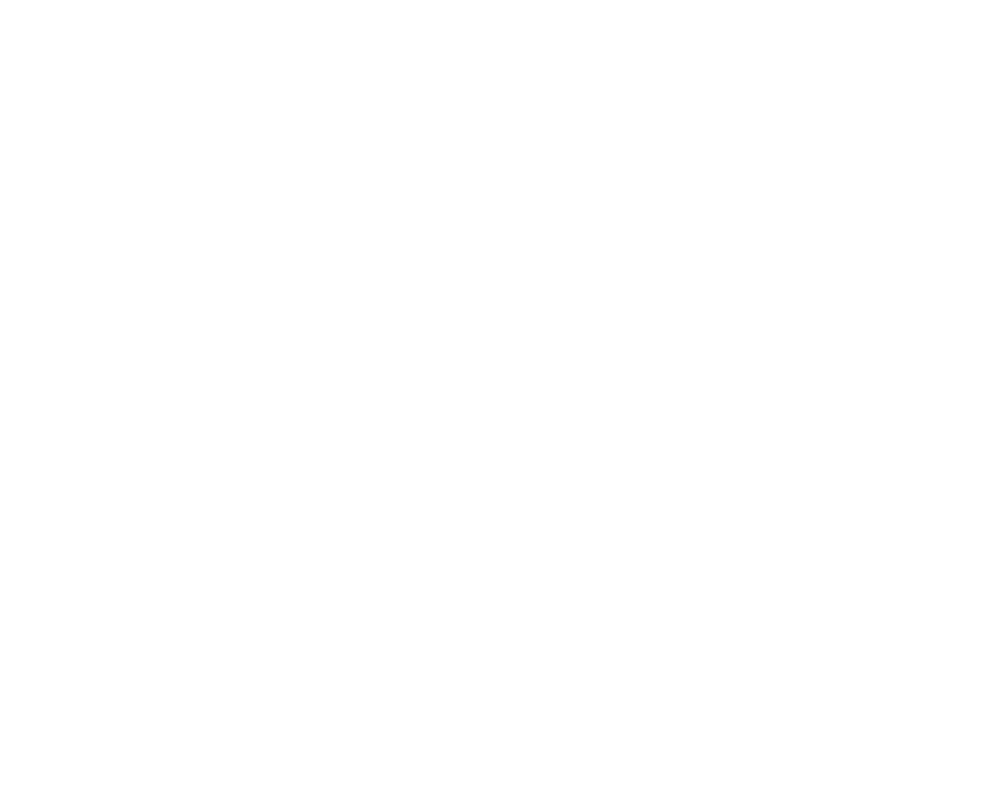

<IPython.core.display.Javascript object>


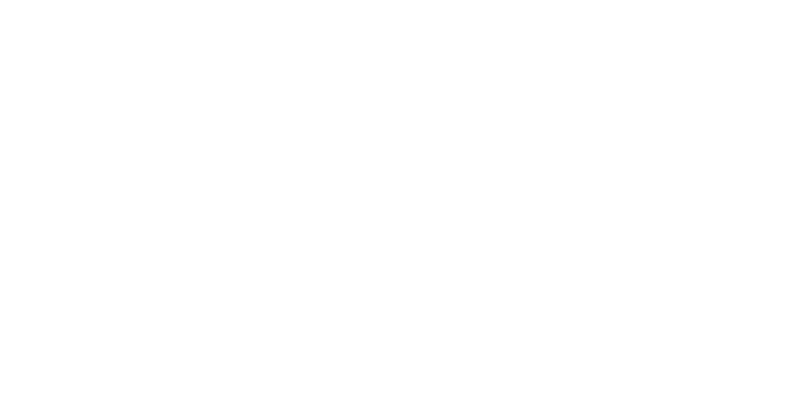

<IPython.core.display.Javascript object>


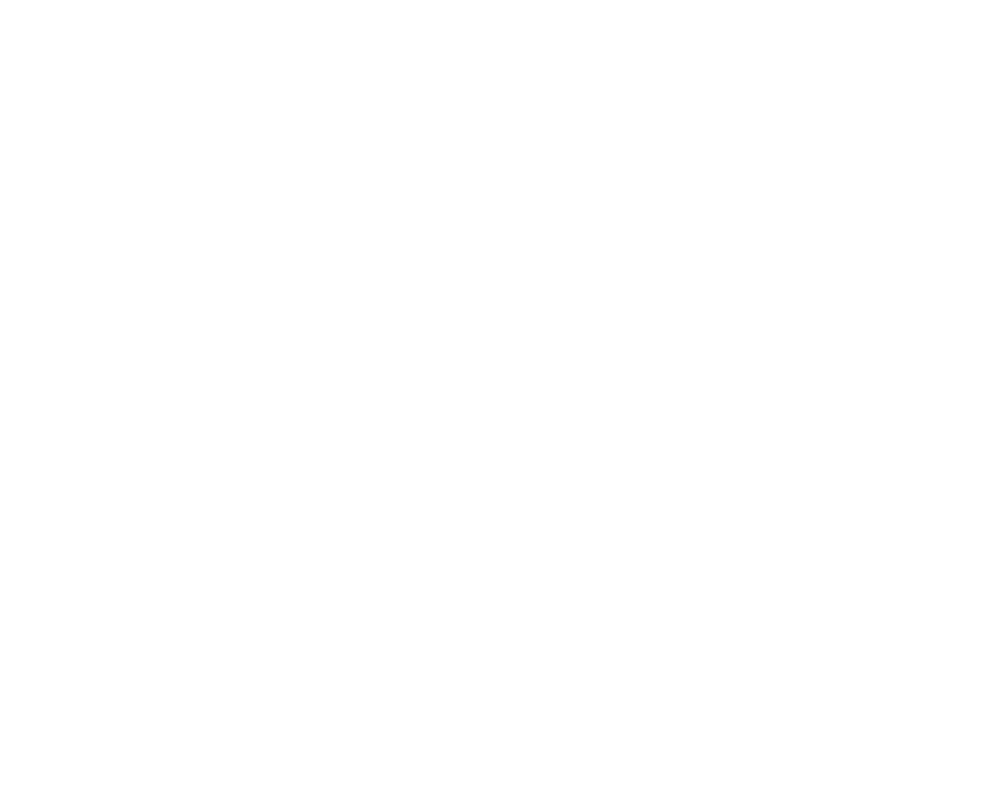

<IPython.core.display.Javascript object>


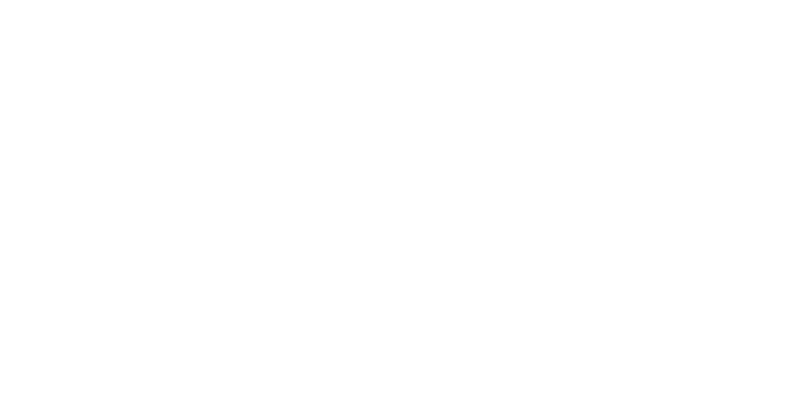

<IPython.core.display.Javascript object>


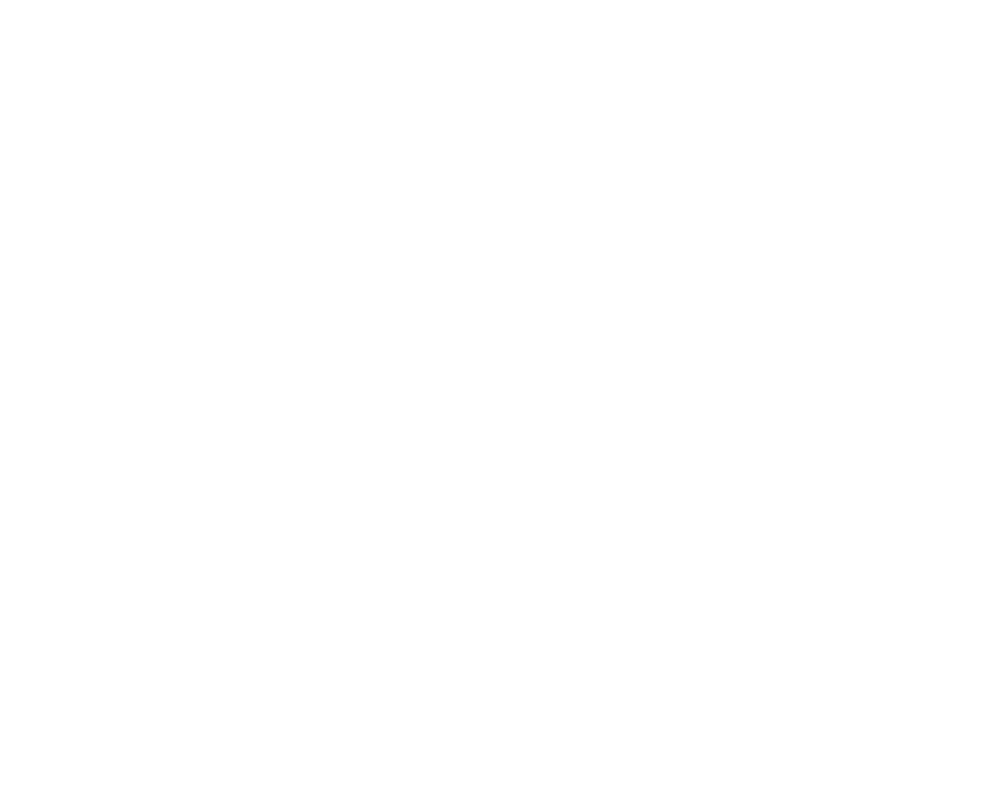

<IPython.core.display.Javascript object>


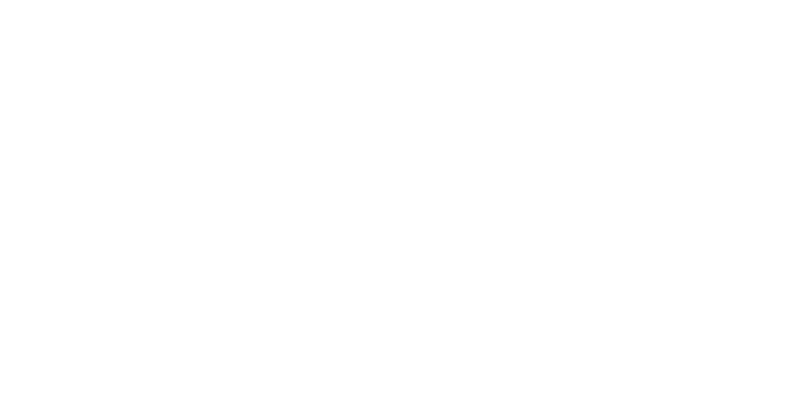

<IPython.core.display.Javascript object>


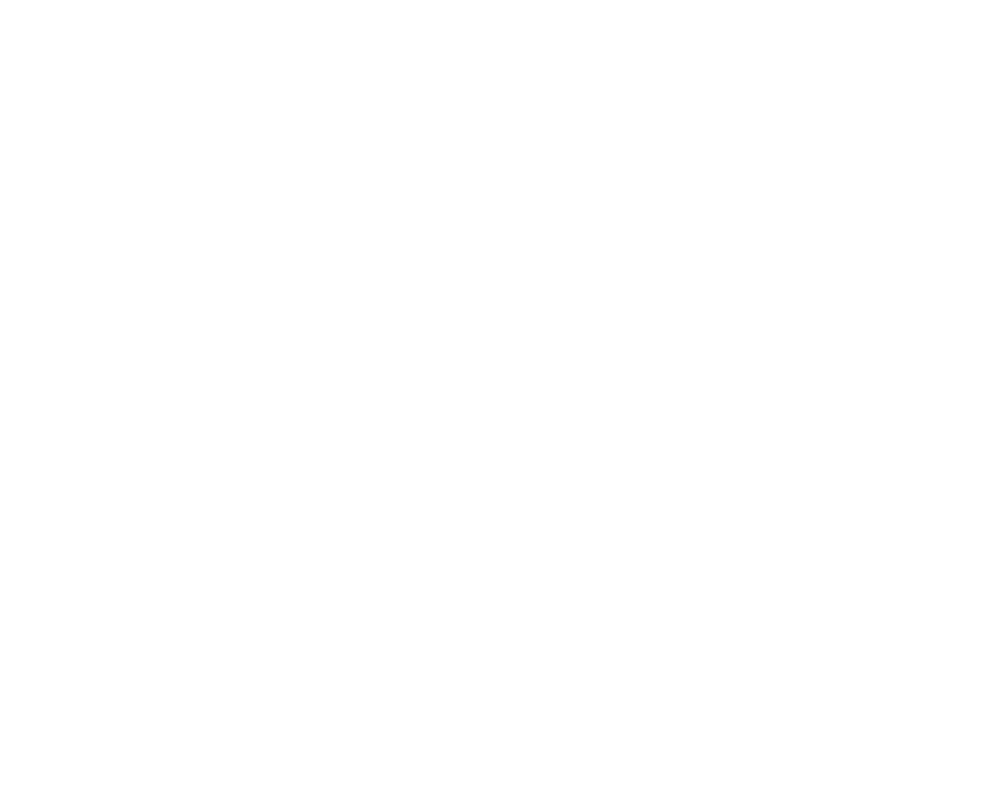

<IPython.core.display.Javascript object>


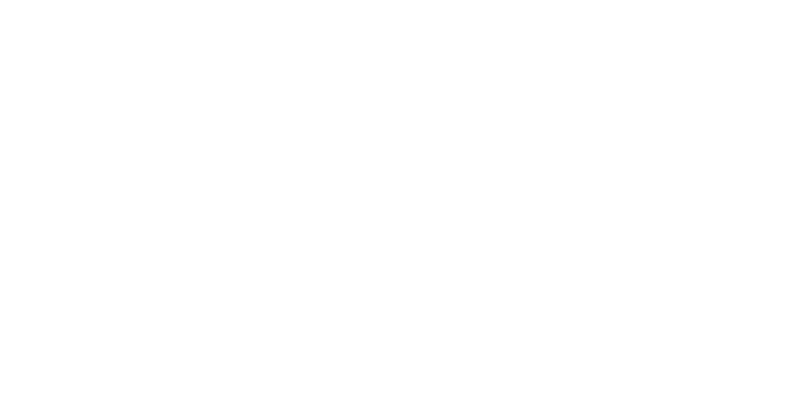

<IPython.core.display.Javascript object>


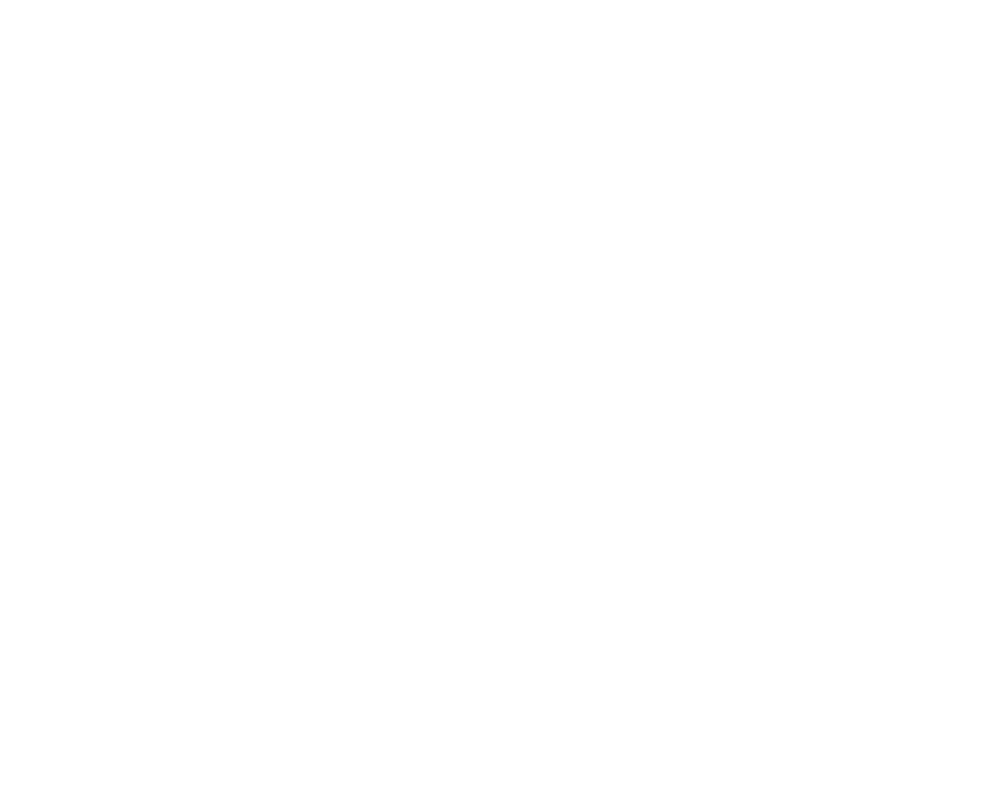

<IPython.core.display.Javascript object>


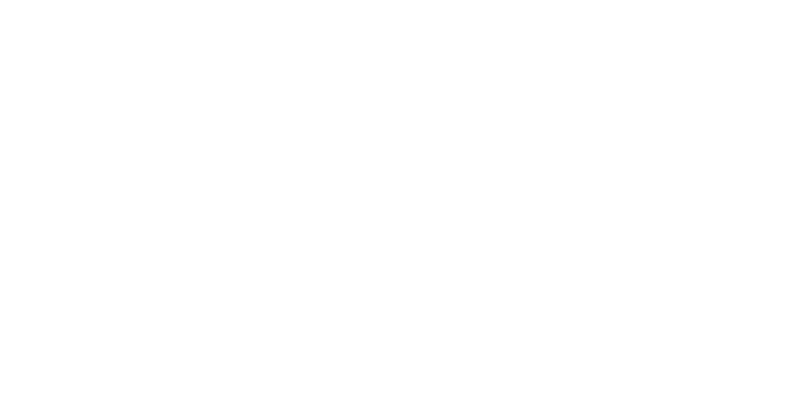

<IPython.core.display.Javascript object>


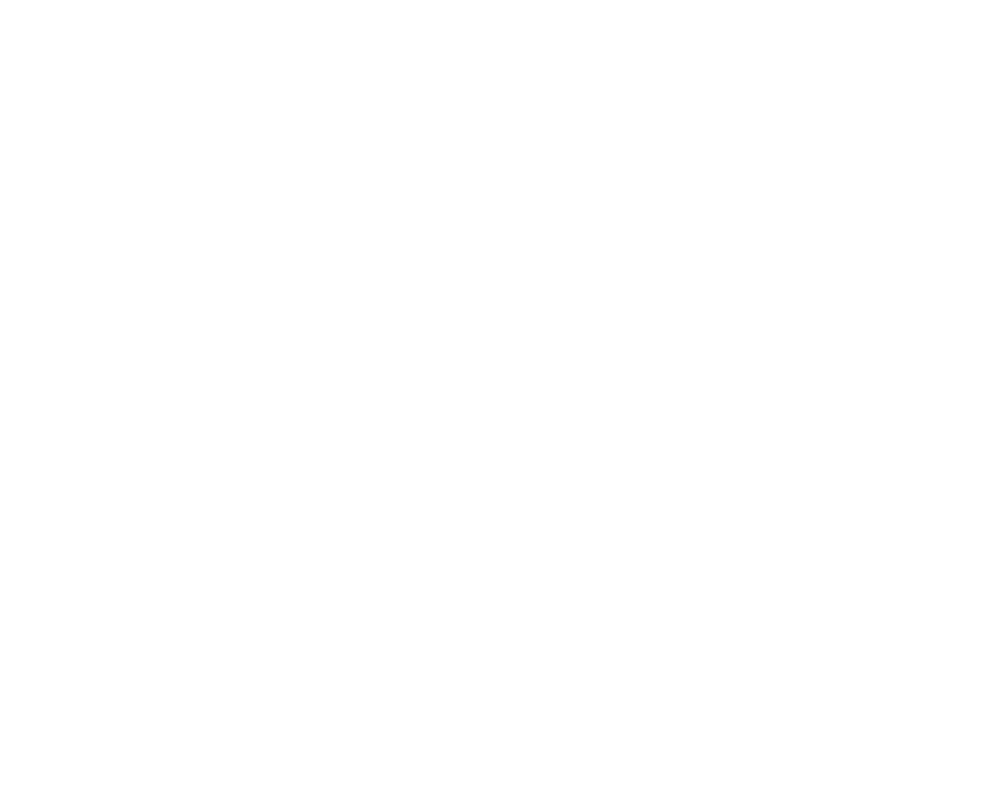

<IPython.core.display.Javascript object>


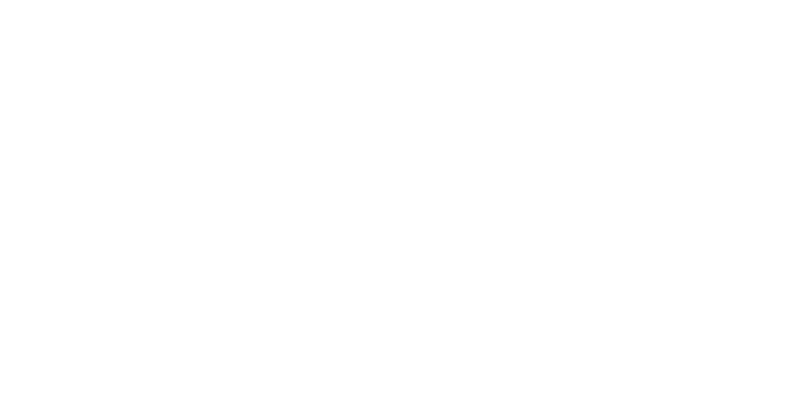

<IPython.core.display.Javascript object>


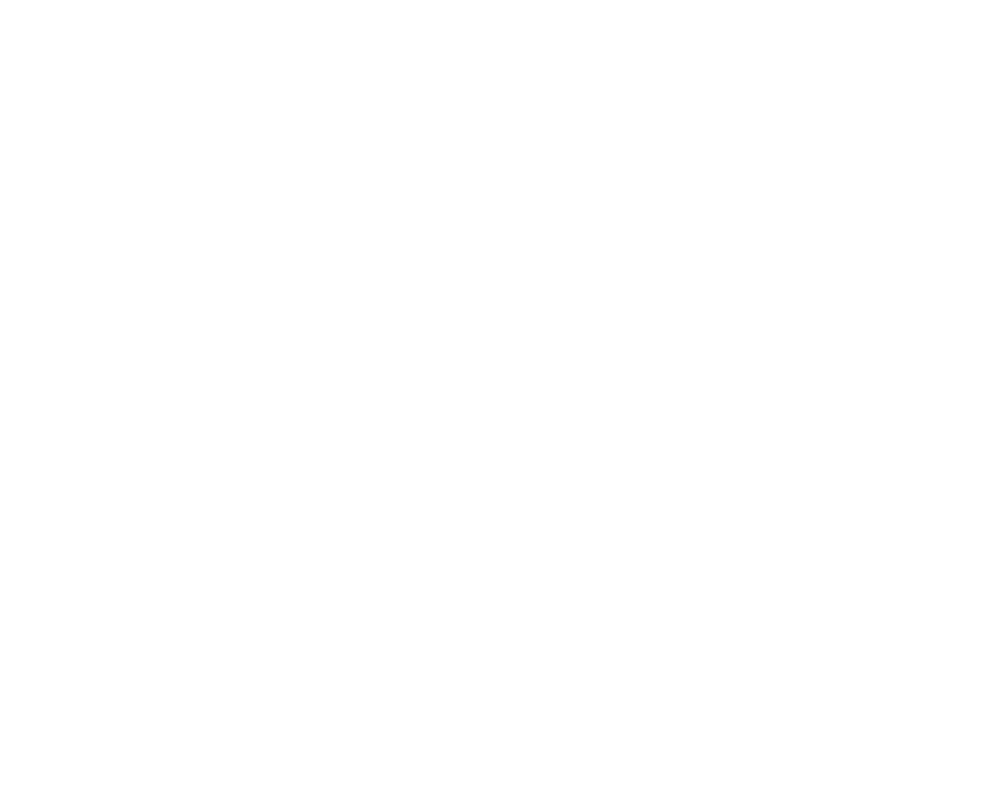

<IPython.core.display.Javascript object>


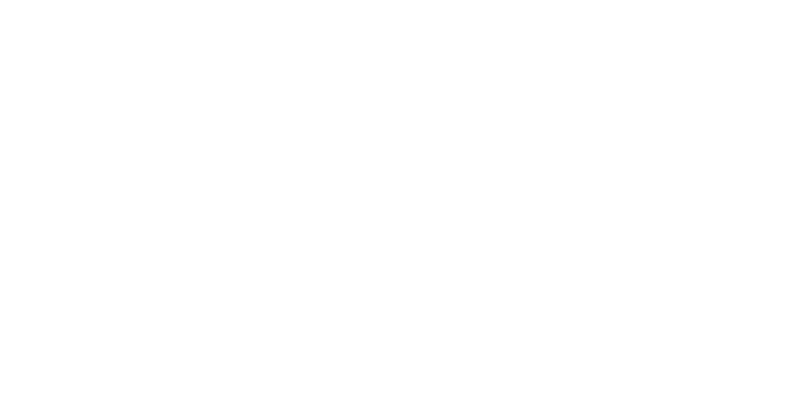

<IPython.core.display.Javascript object>


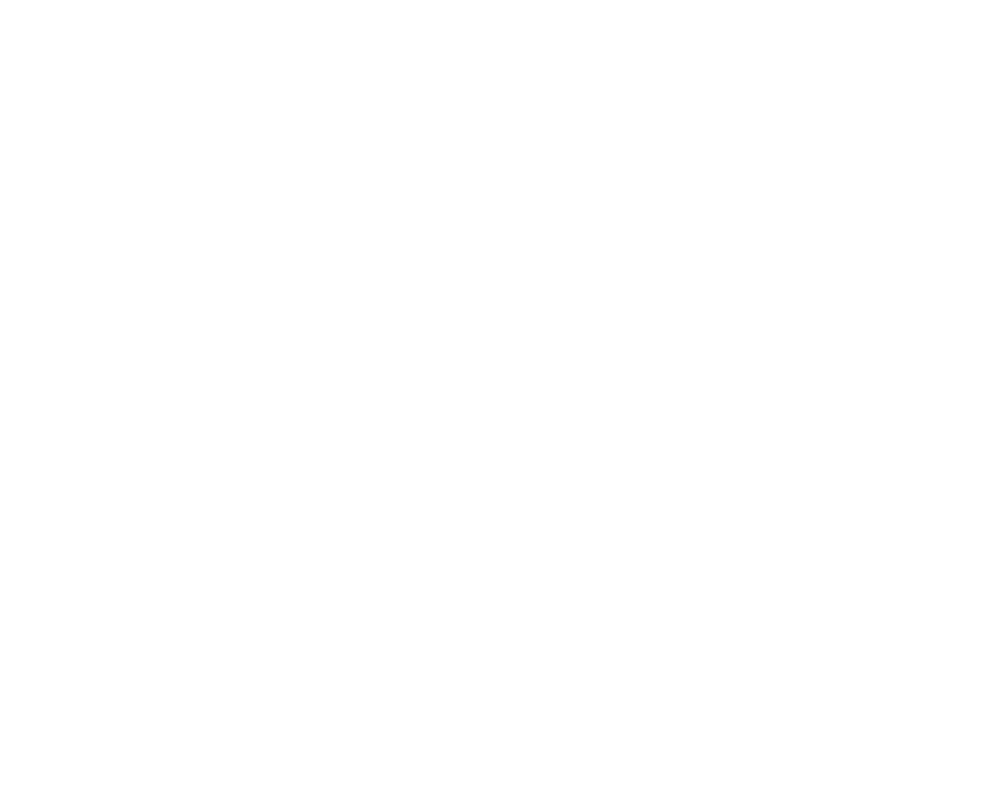

<IPython.core.display.Javascript object>


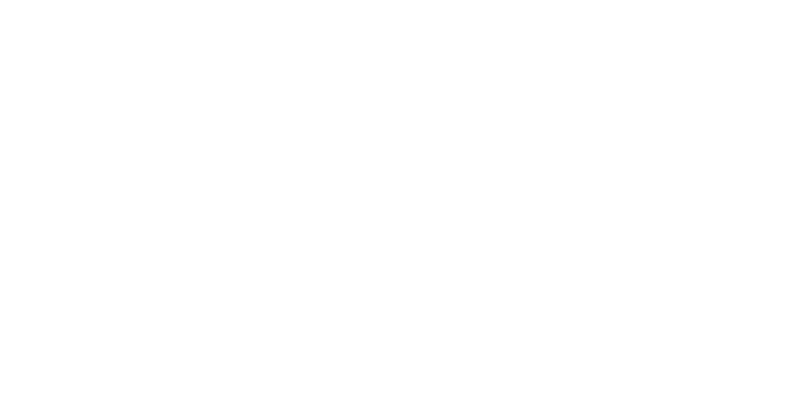

<IPython.core.display.Javascript object>


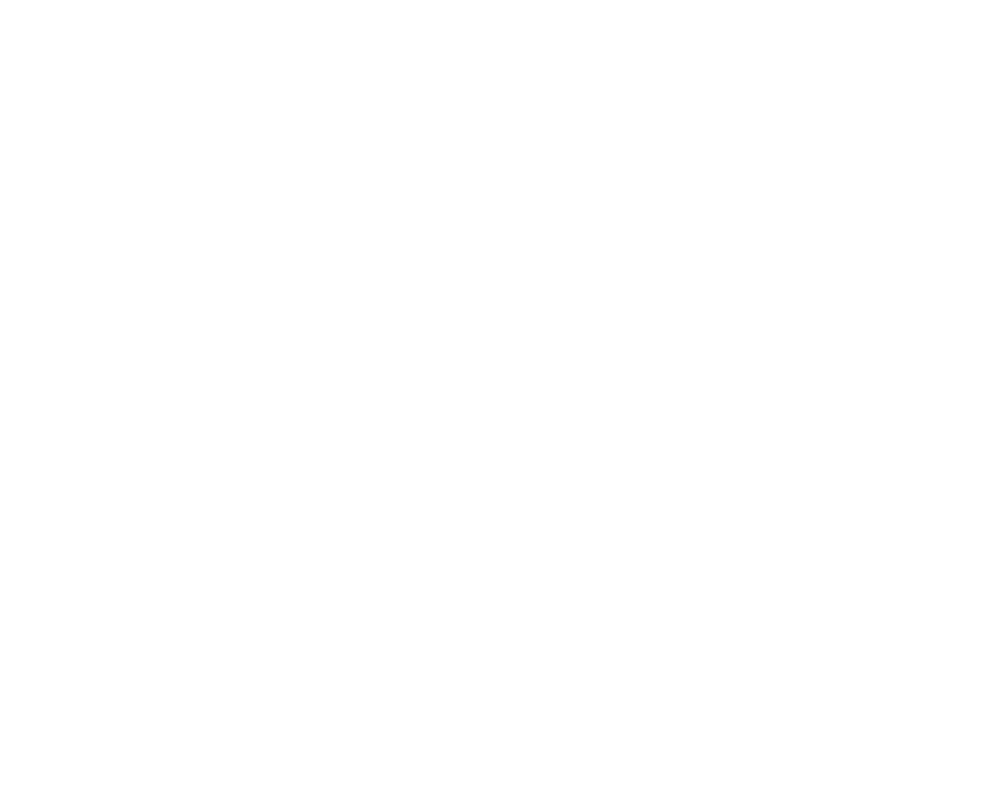

<IPython.core.display.Javascript object>


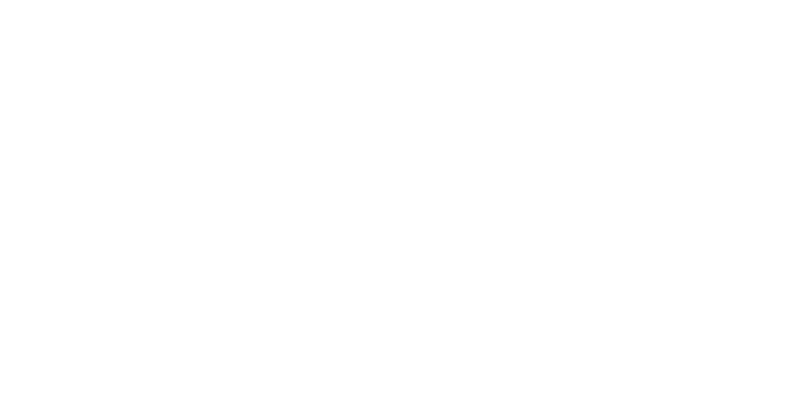

<IPython.core.display.Javascript object>


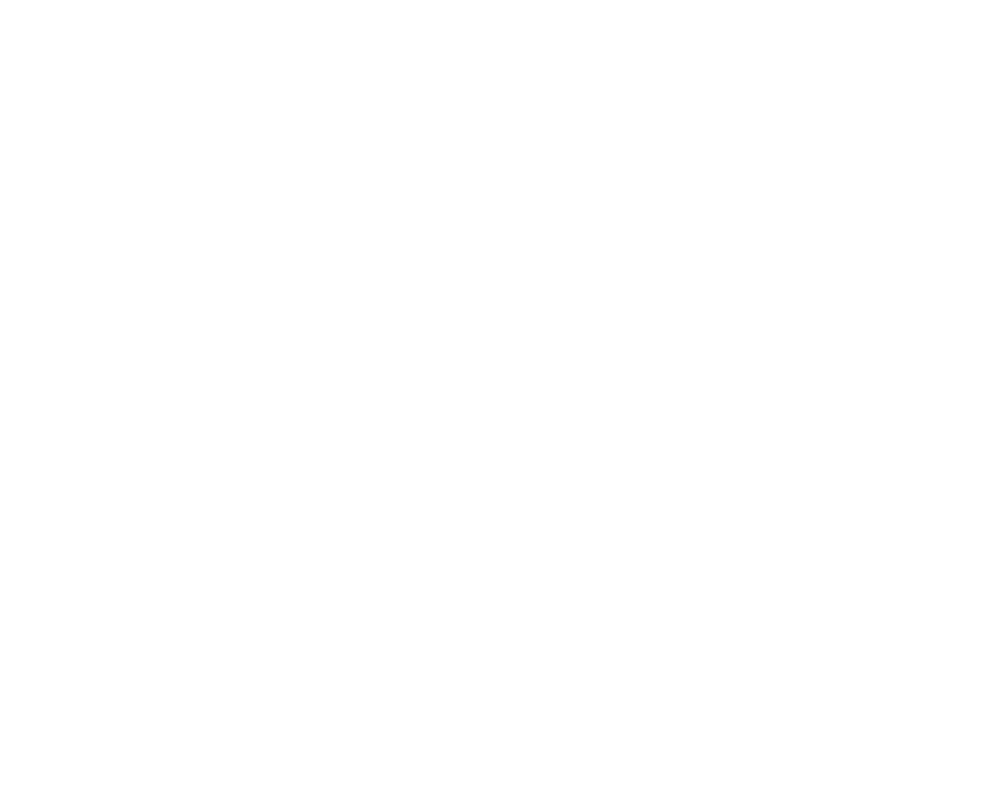

<IPython.core.display.Javascript object>


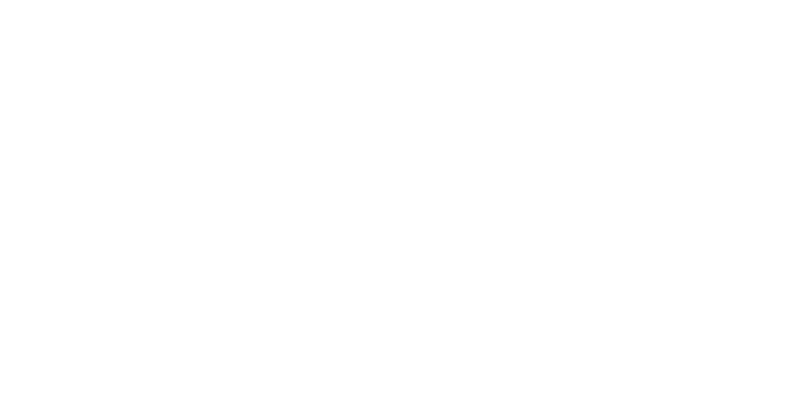

<IPython.core.display.Javascript object>


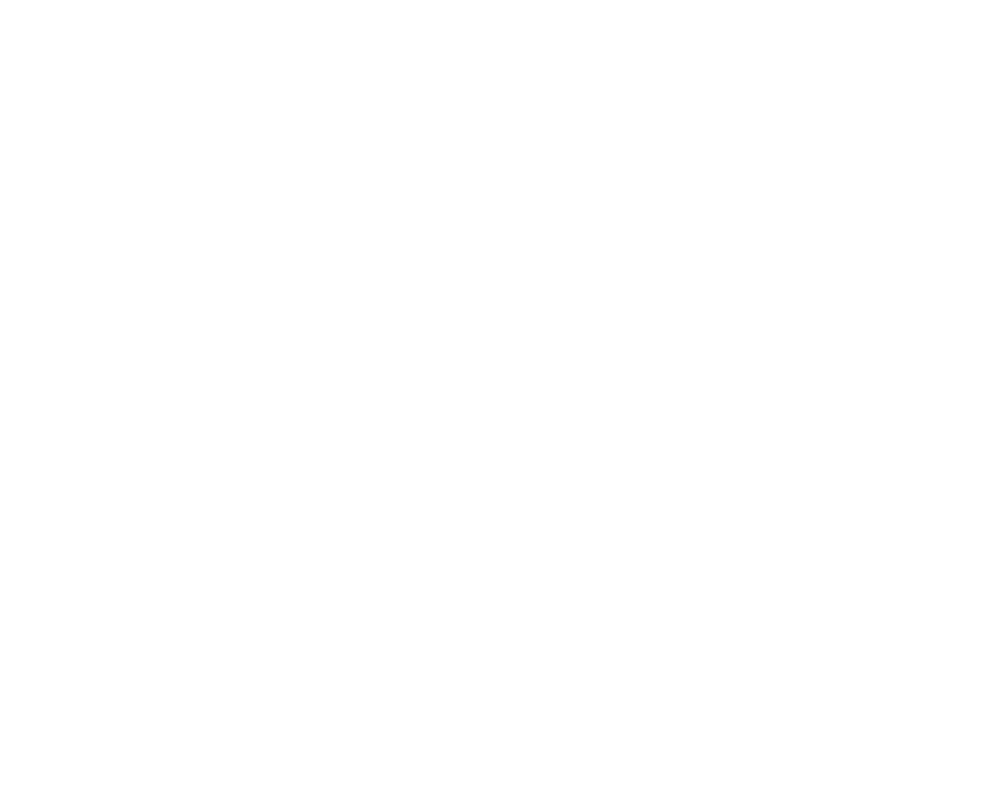

<IPython.core.display.Javascript object>


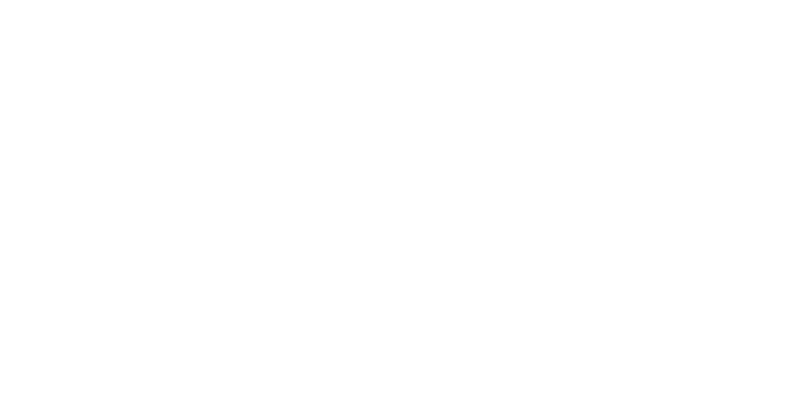

<IPython.core.display.Javascript object>


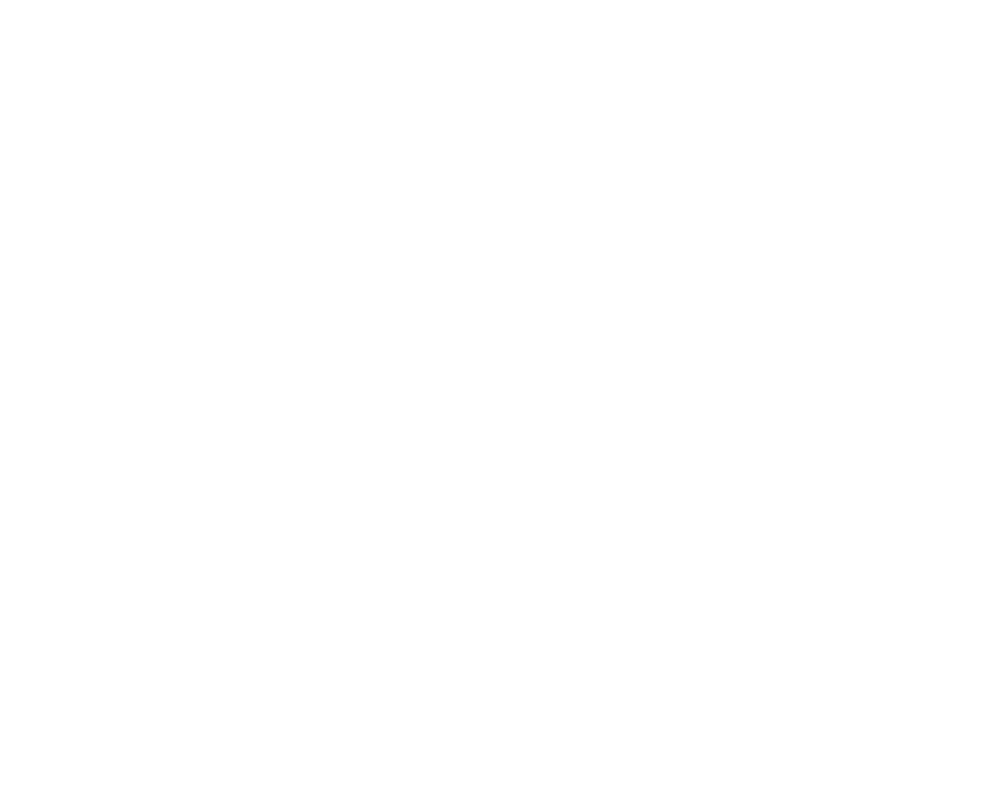

<IPython.core.display.Javascript object>


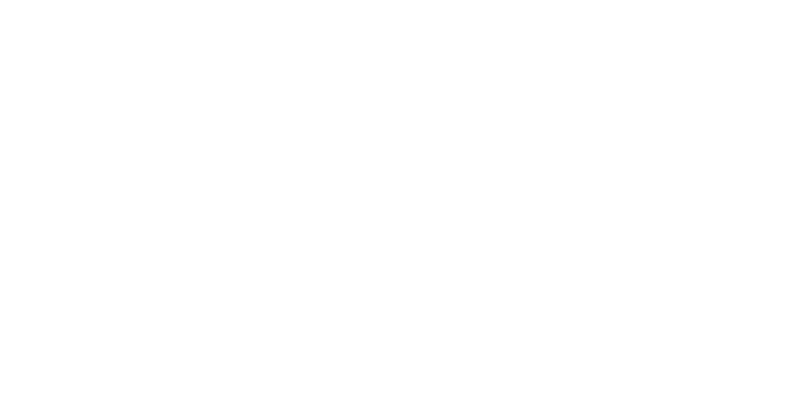

<IPython.core.display.Javascript object>


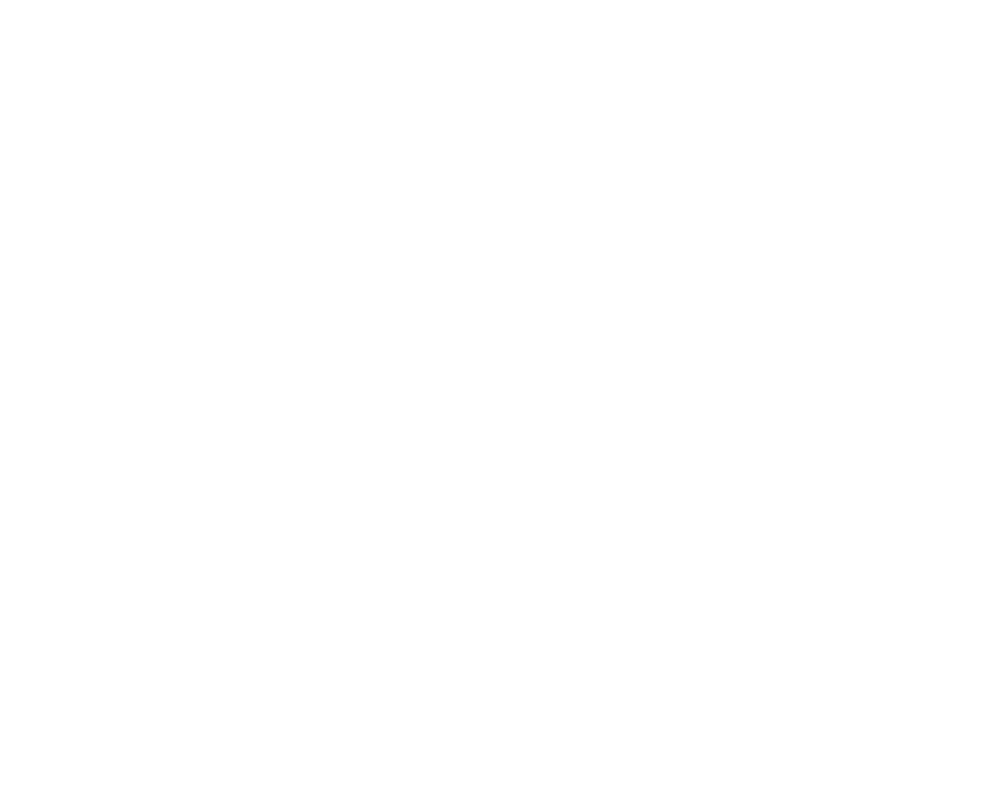

<IPython.core.display.Javascript object>


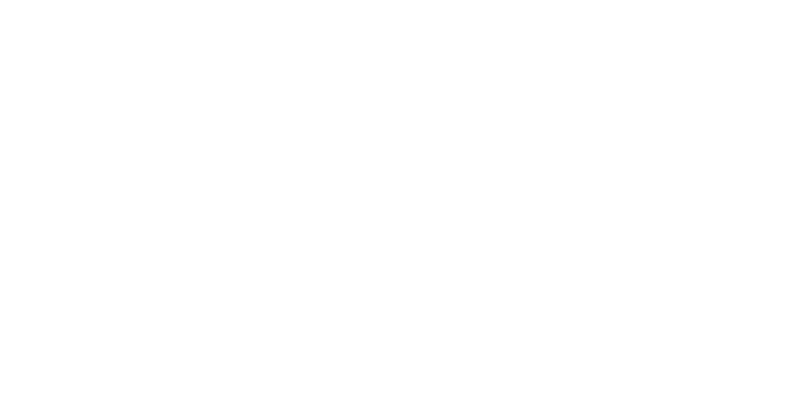

<IPython.core.display.Javascript object>


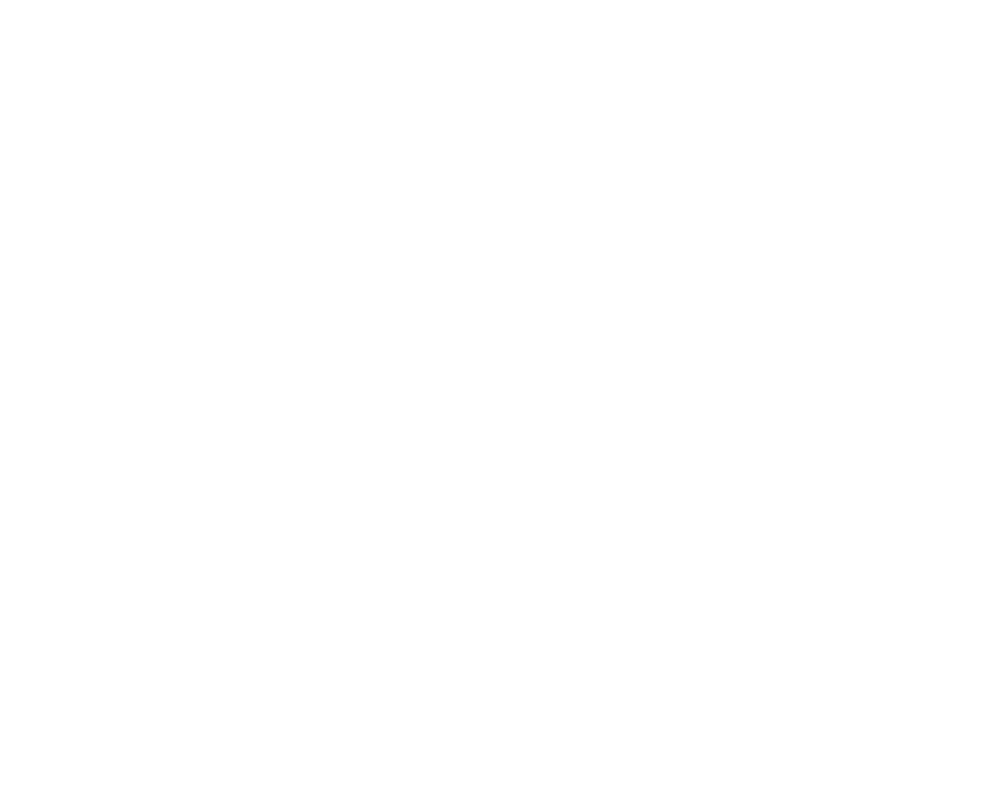

<IPython.core.display.Javascript object>


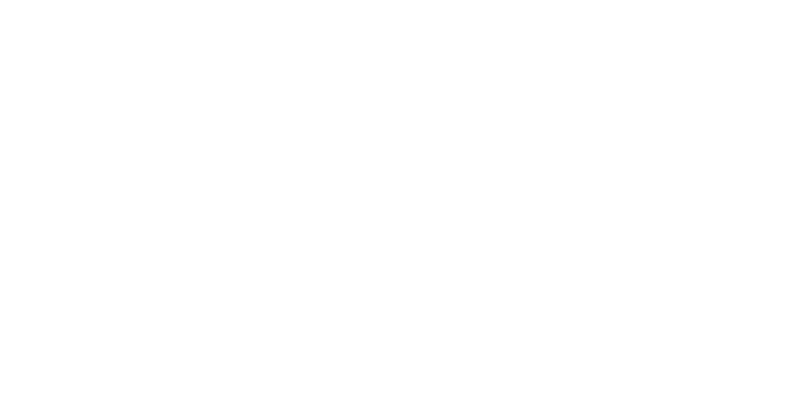

<IPython.core.display.Javascript object>


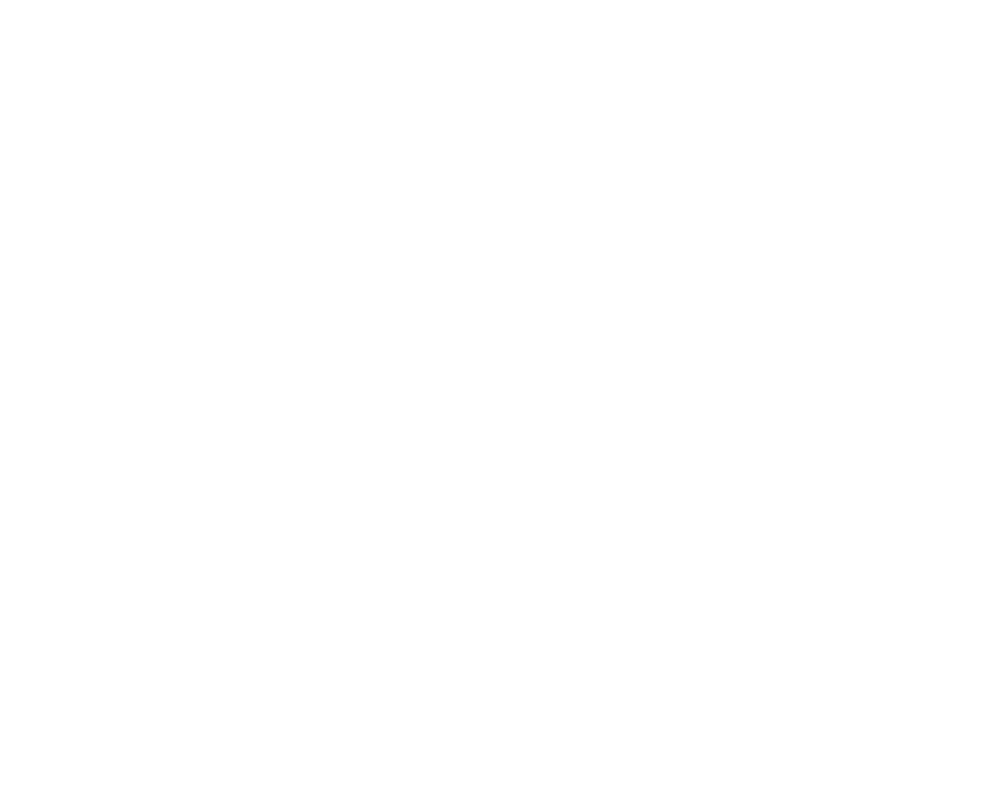

<IPython.core.display.Javascript object>


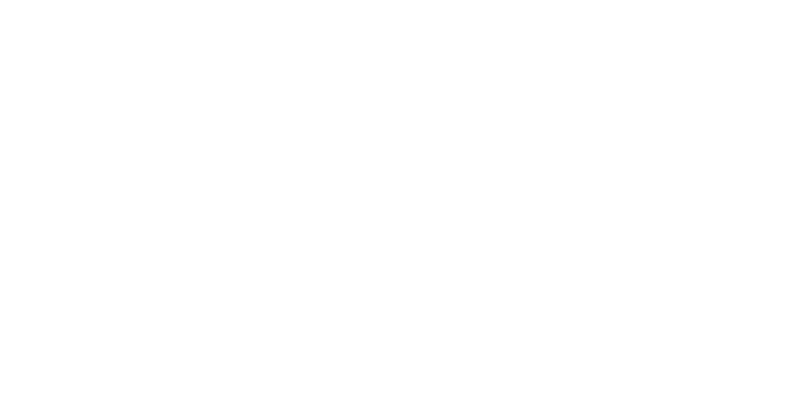

<IPython.core.display.Javascript object>


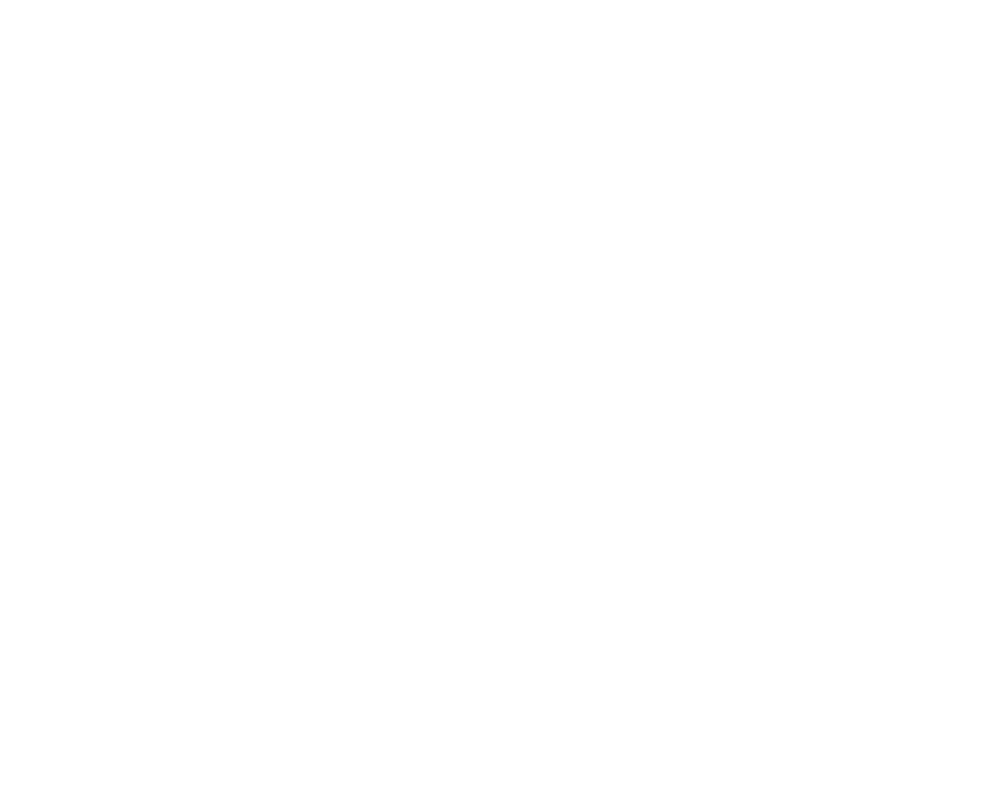

<IPython.core.display.Javascript object>


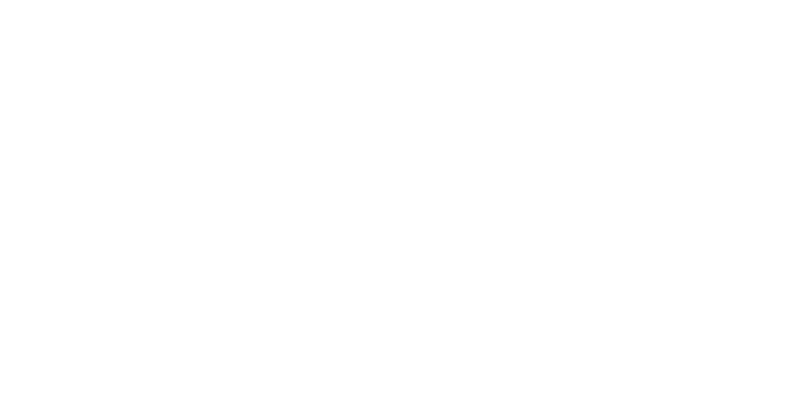

<IPython.core.display.Javascript object>


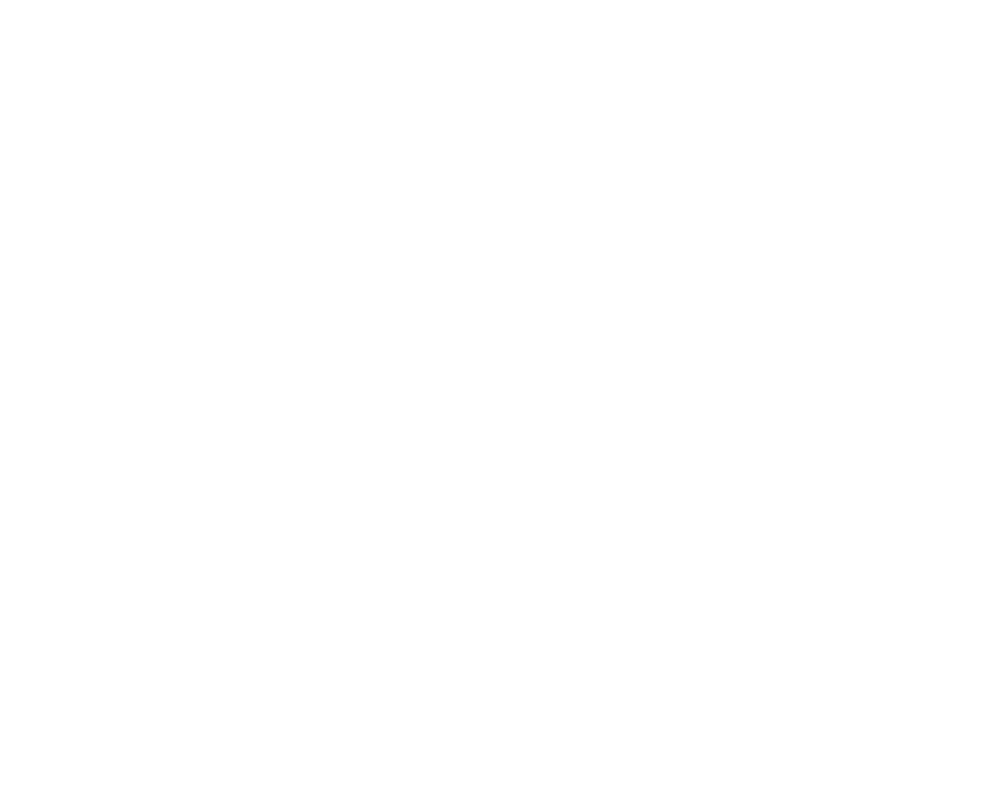

<IPython.core.display.Javascript object>


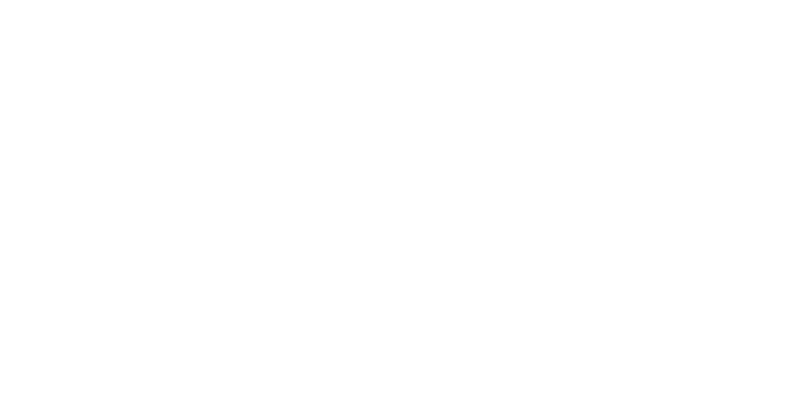

<IPython.core.display.Javascript object>


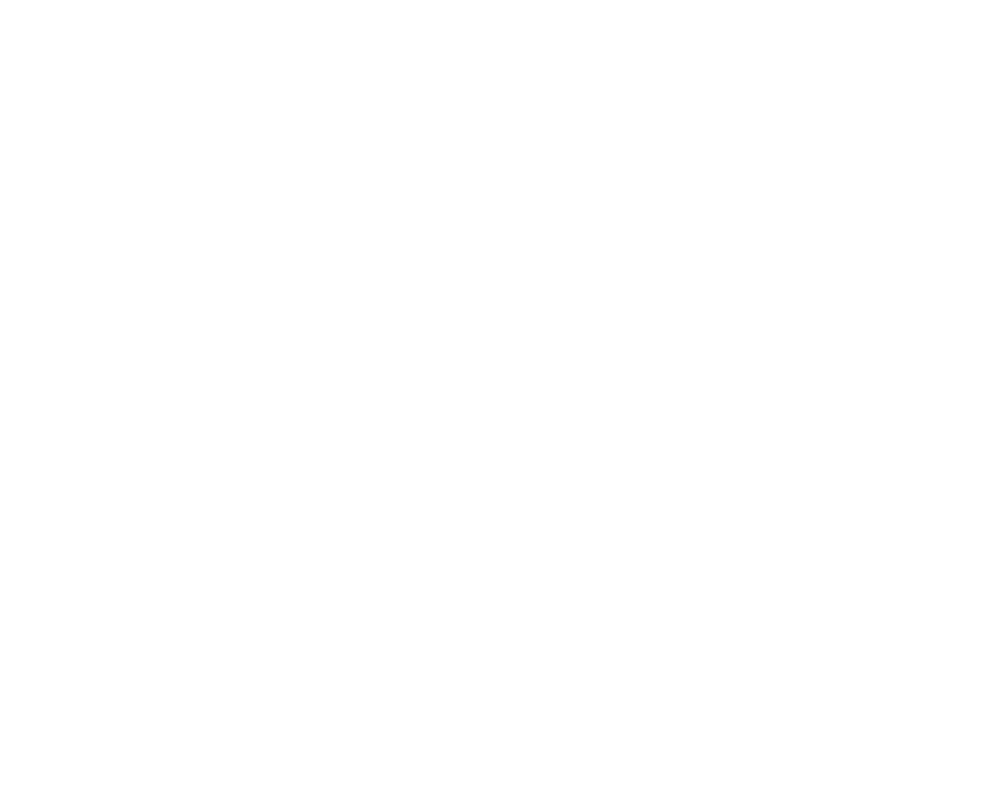

<IPython.core.display.Javascript object>


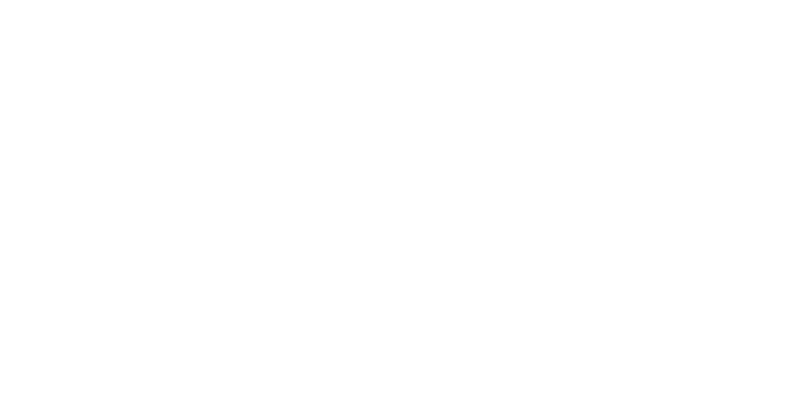

<IPython.core.display.Javascript object>


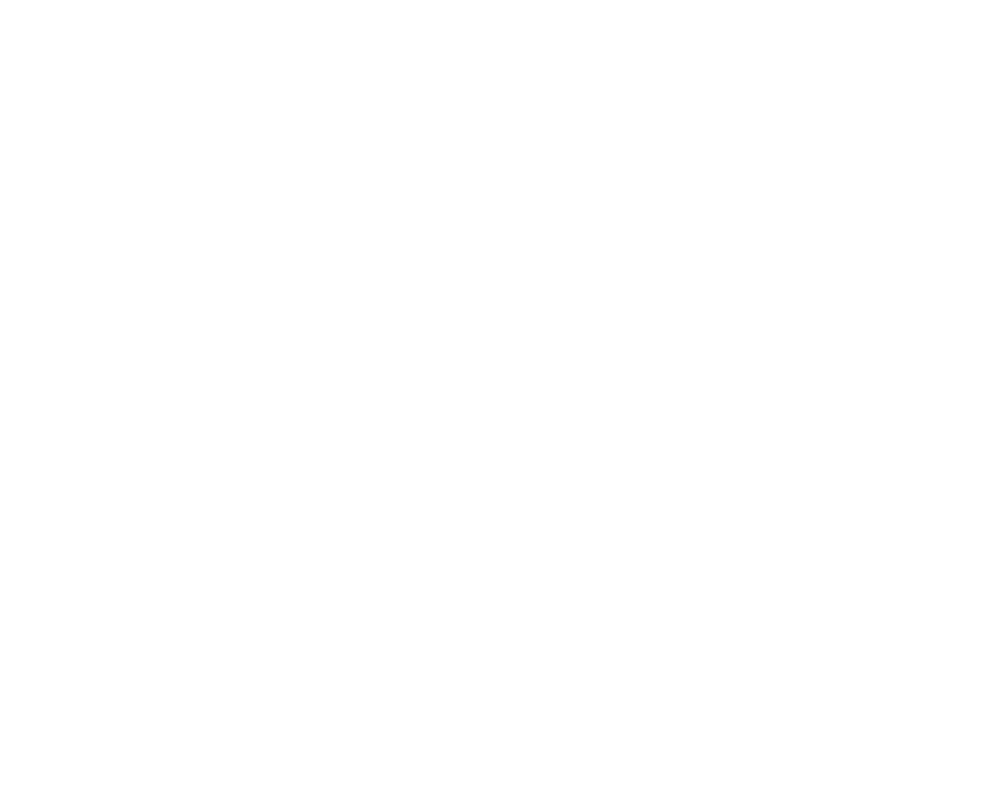

<IPython.core.display.Javascript object>


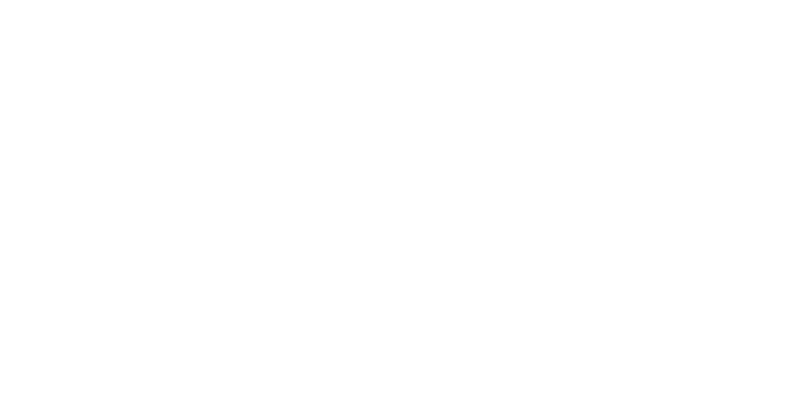

<IPython.core.display.Javascript object>


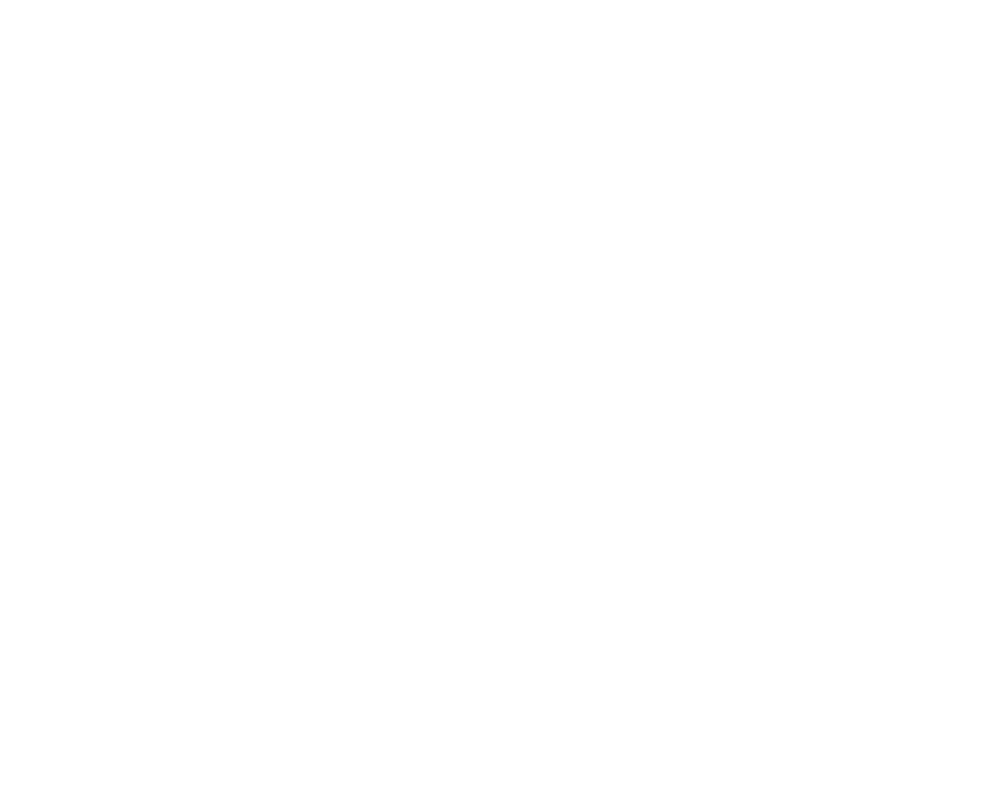

<IPython.core.display.Javascript object>


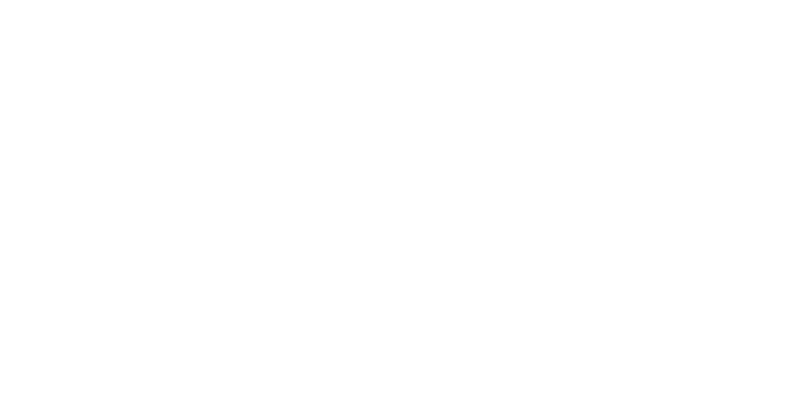

<IPython.core.display.Javascript object>


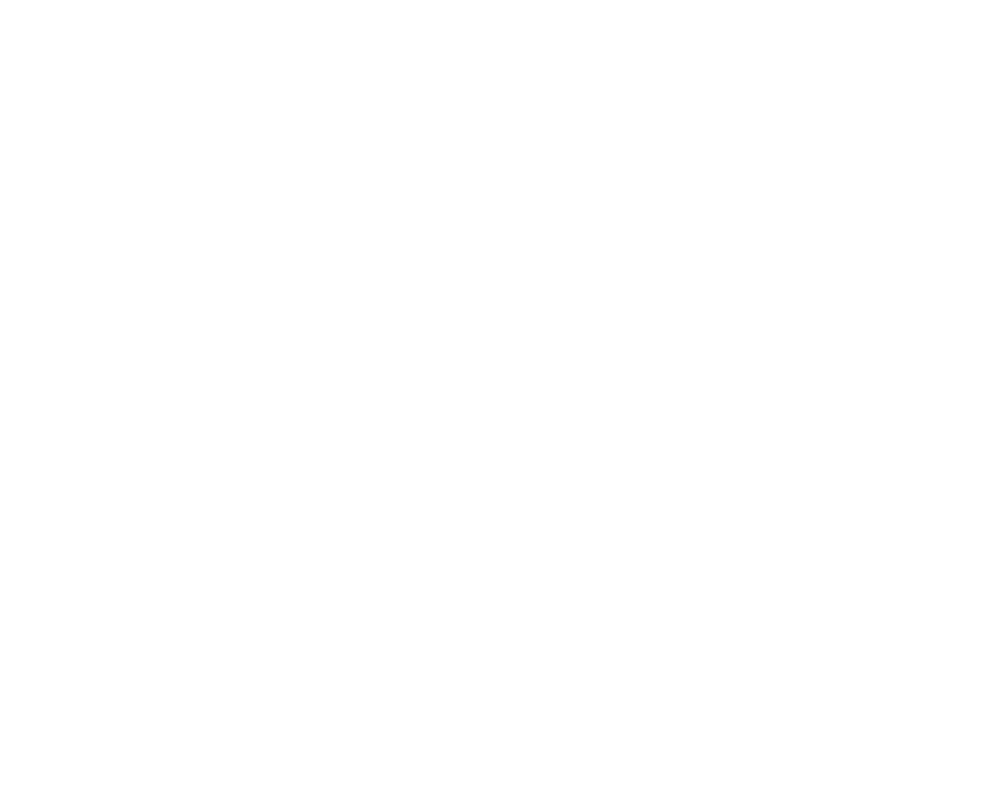

<IPython.core.display.Javascript object>


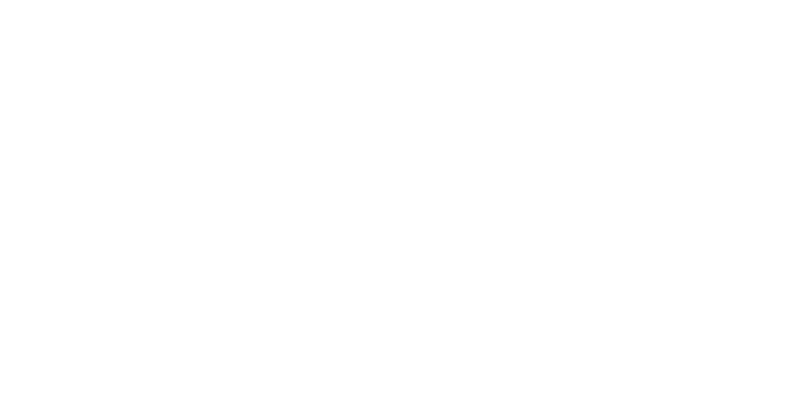

<IPython.core.display.Javascript object>


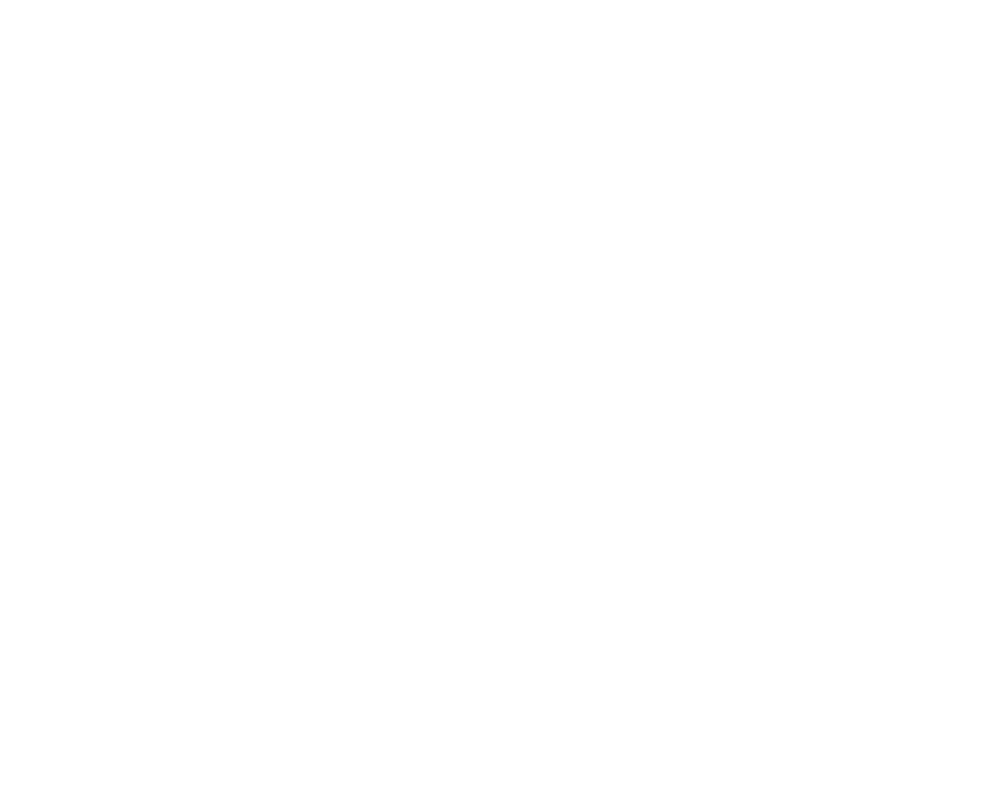

<IPython.core.display.Javascript object>


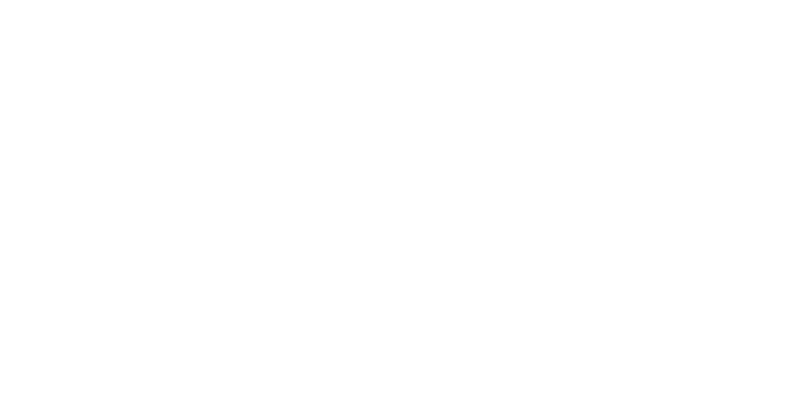

<IPython.core.display.Javascript object>


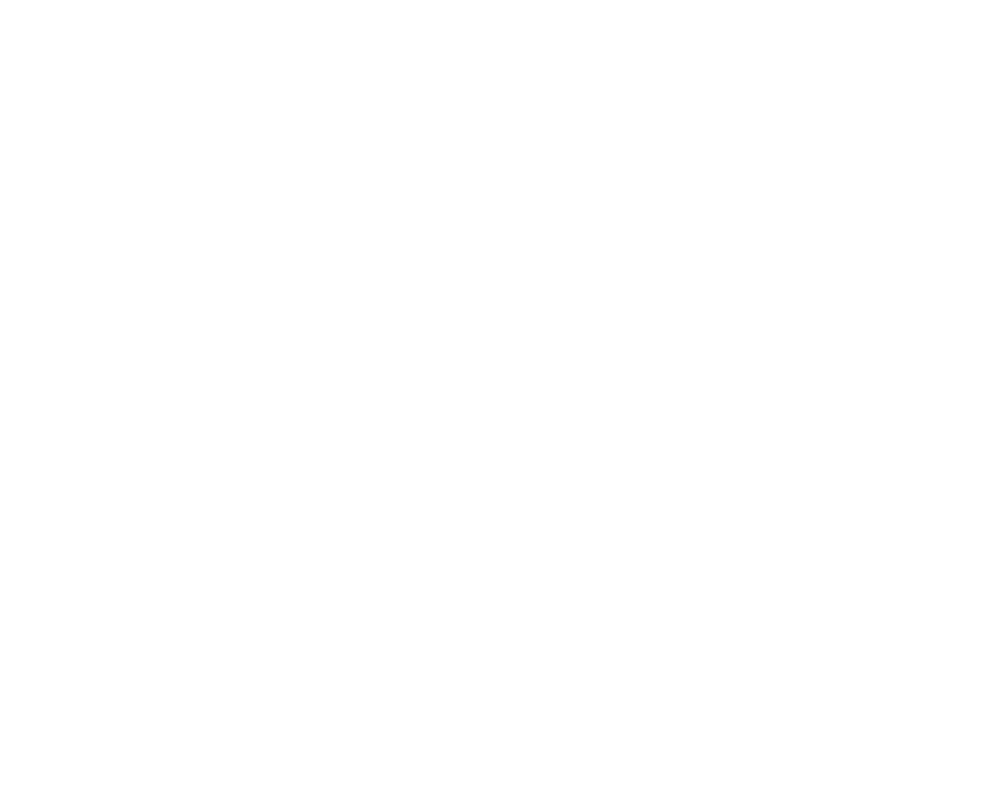

<IPython.core.display.Javascript object>


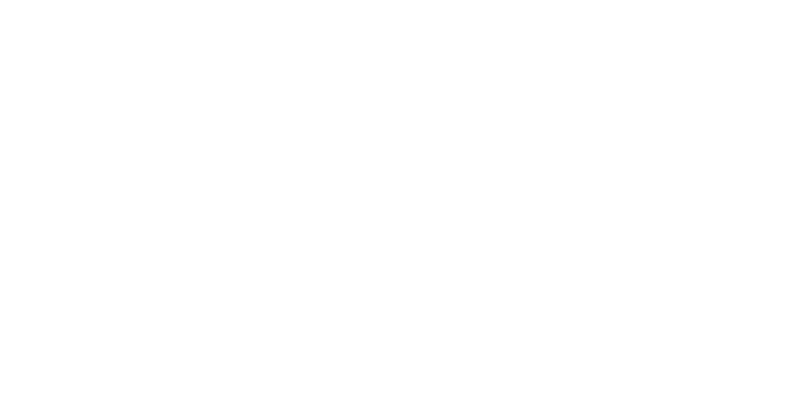

<IPython.core.display.Javascript object>


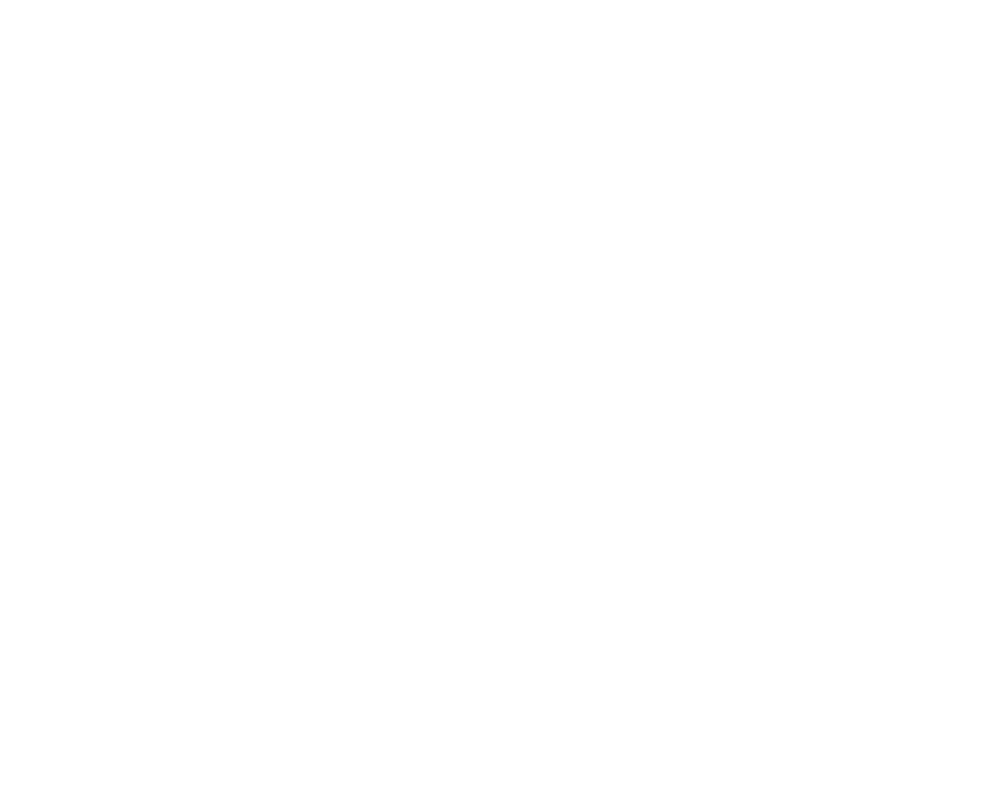

<IPython.core.display.Javascript object>


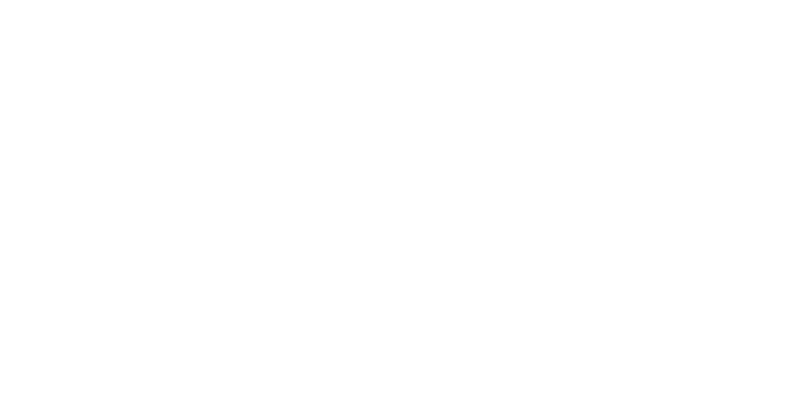

<IPython.core.display.Javascript object>


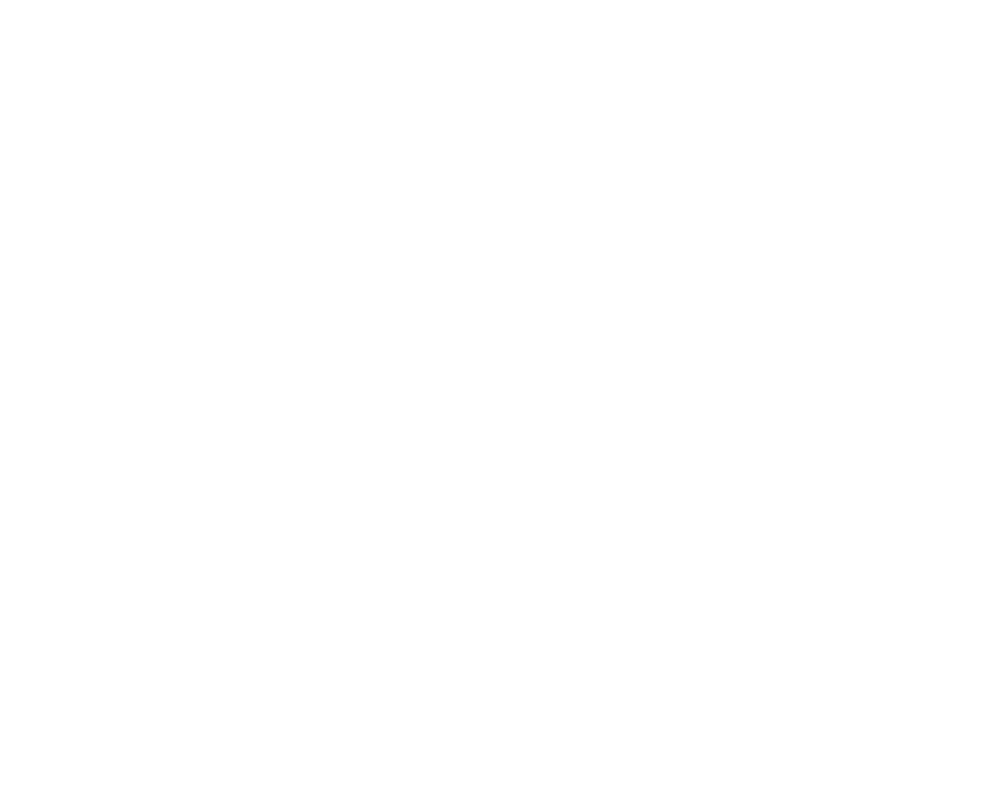

<IPython.core.display.Javascript object>


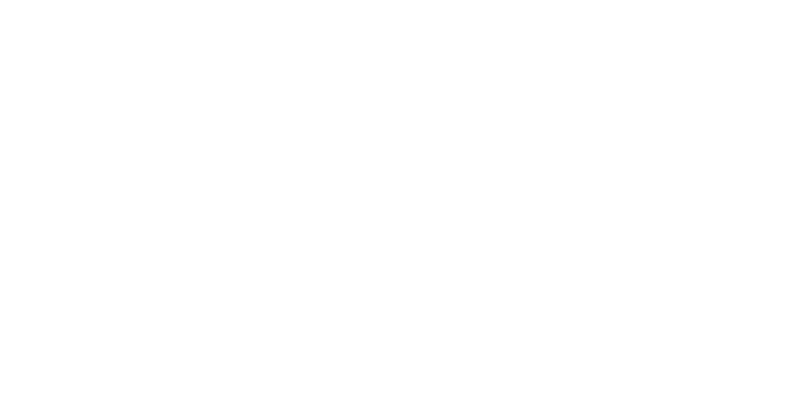

<IPython.core.display.Javascript object>


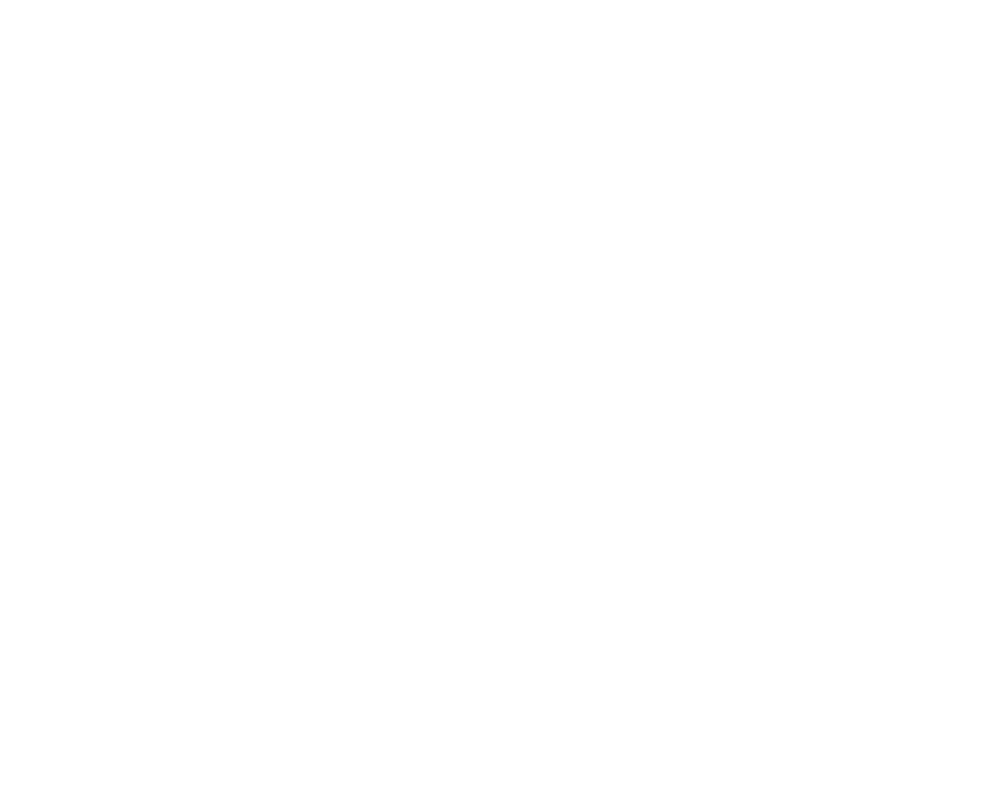

<IPython.core.display.Javascript object>


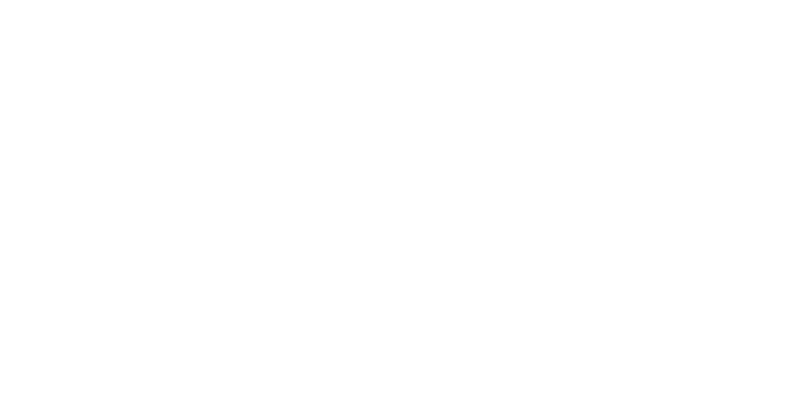

<IPython.core.display.Javascript object>


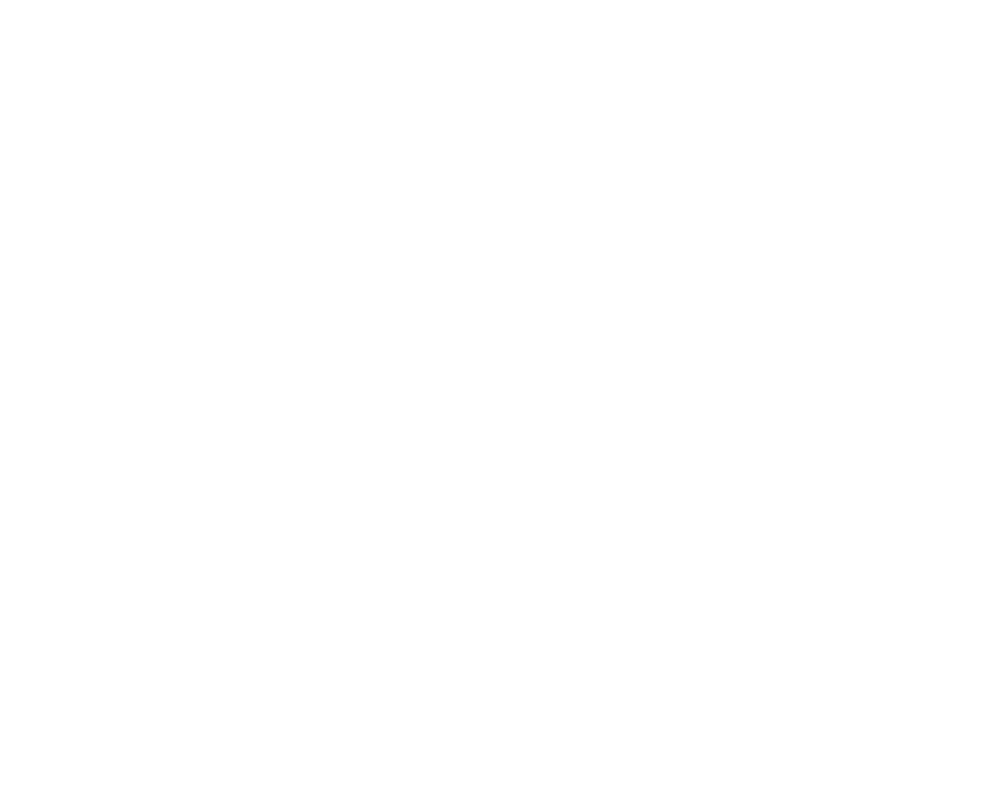

<IPython.core.display.Javascript object>


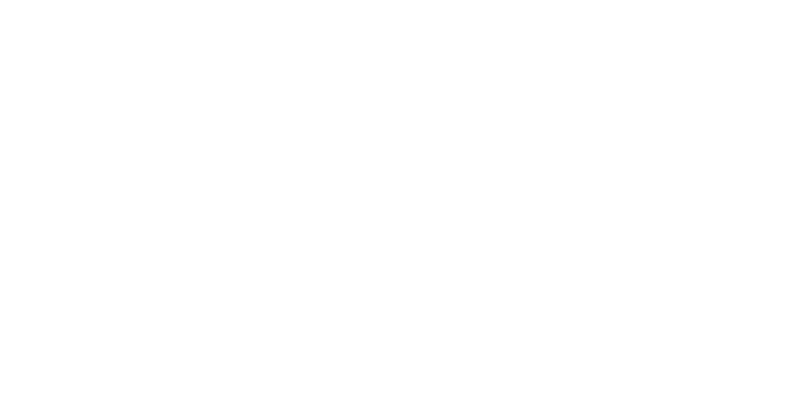

<IPython.core.display.Javascript object>


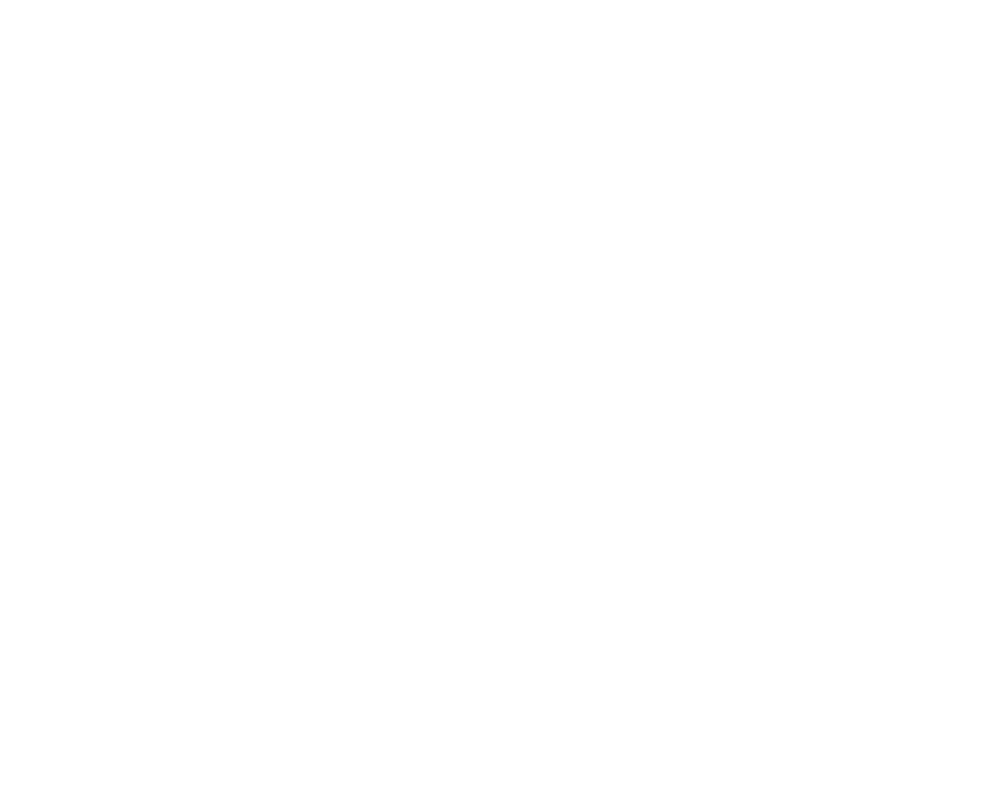

<IPython.core.display.Javascript object>


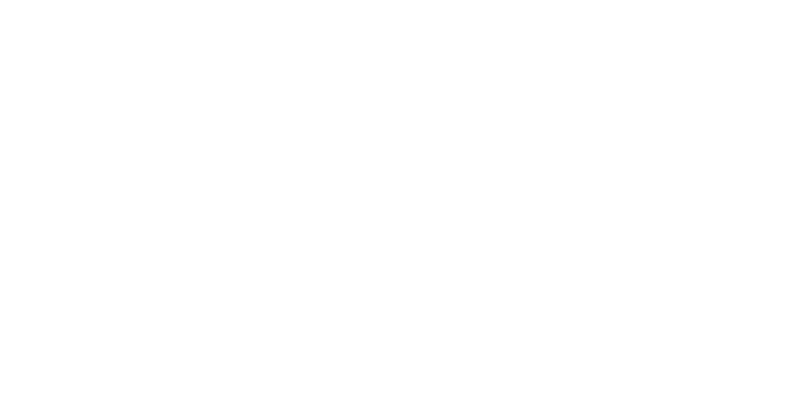

<IPython.core.display.Javascript object>


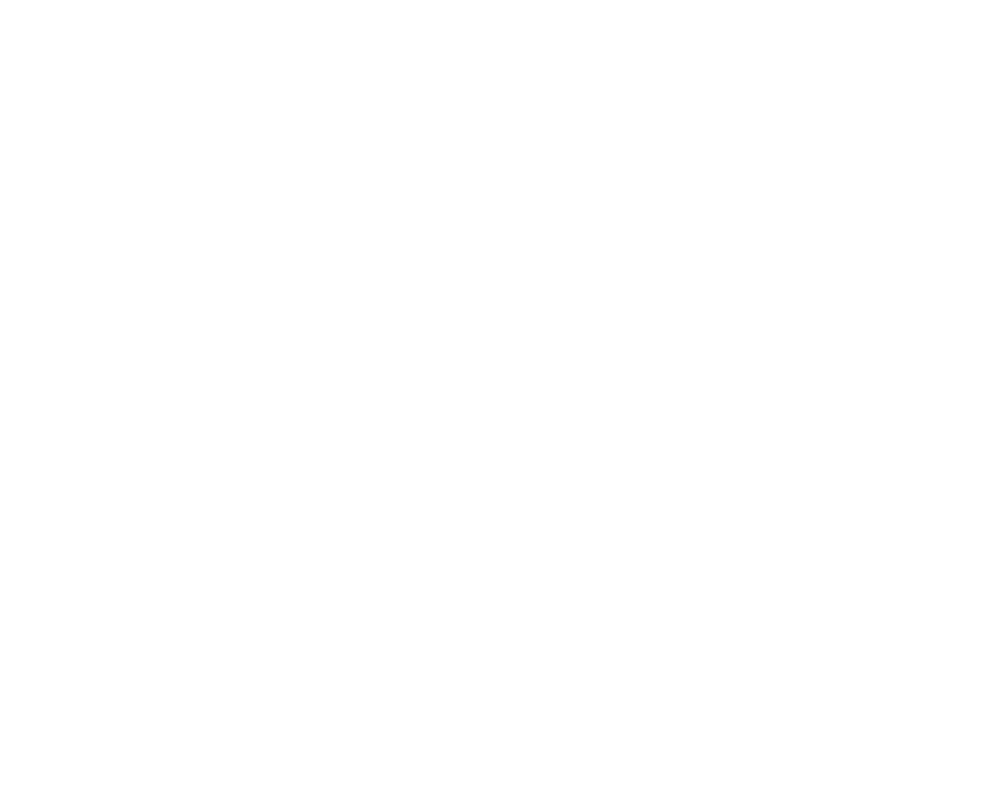

<IPython.core.display.Javascript object>


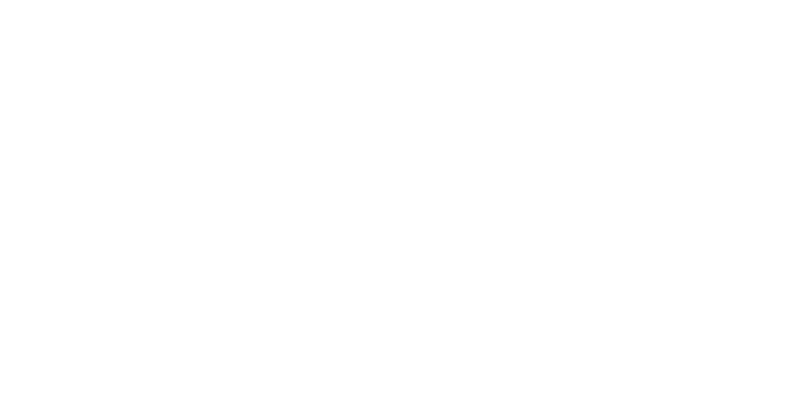

<IPython.core.display.Javascript object>


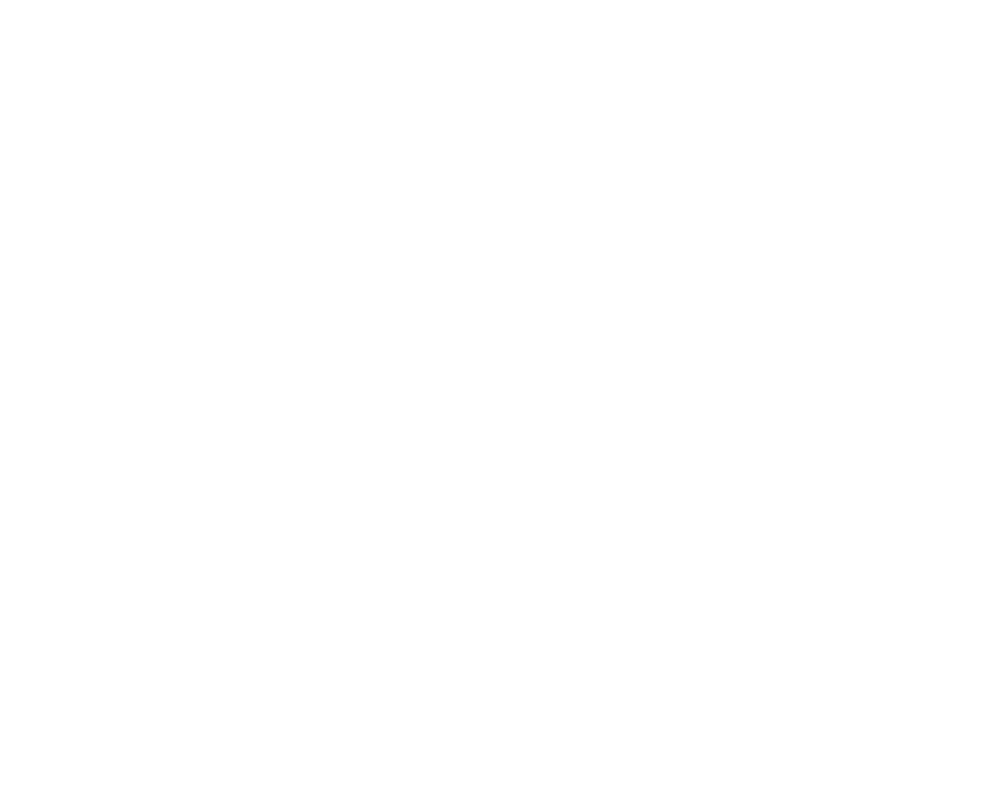

<IPython.core.display.Javascript object>


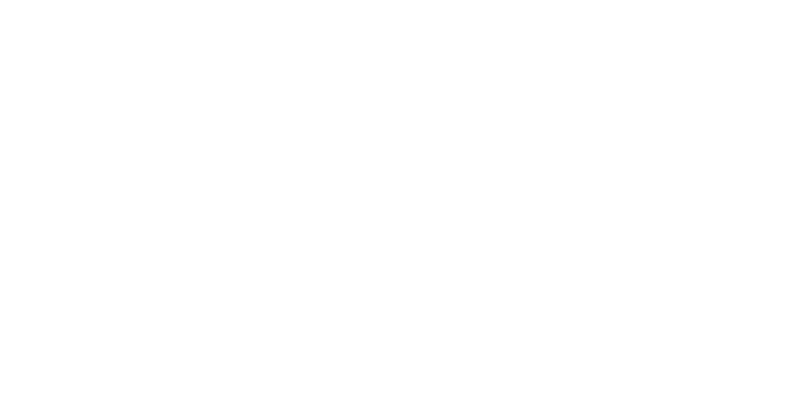

<IPython.core.display.Javascript object>


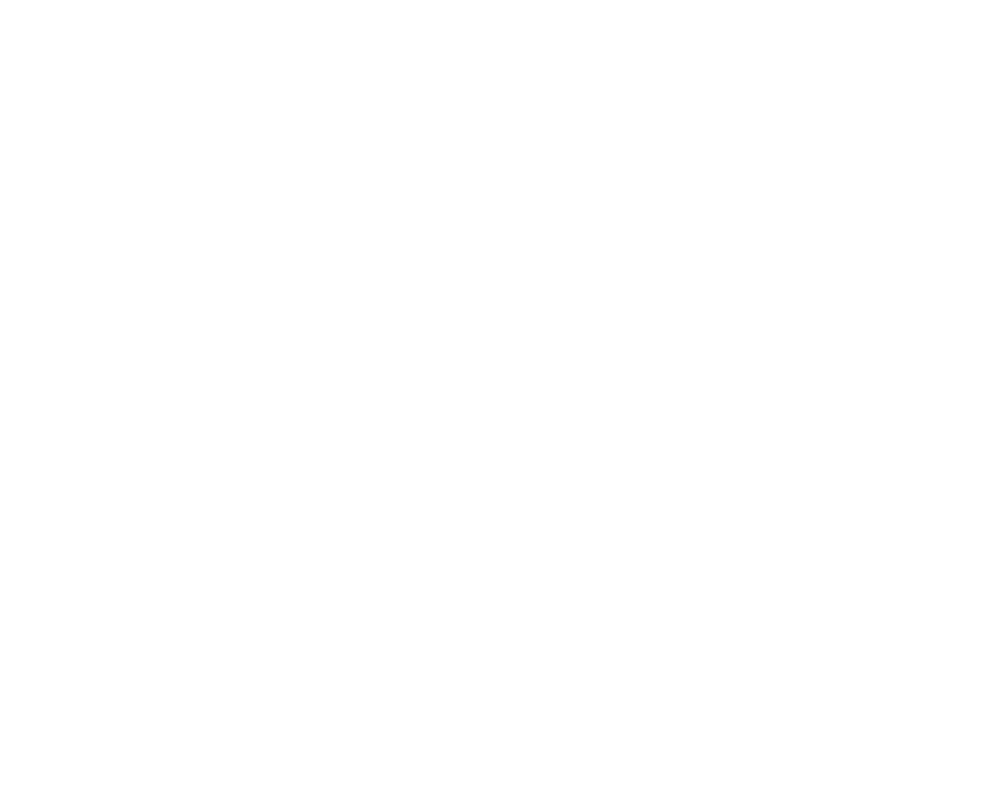

<IPython.core.display.Javascript object>


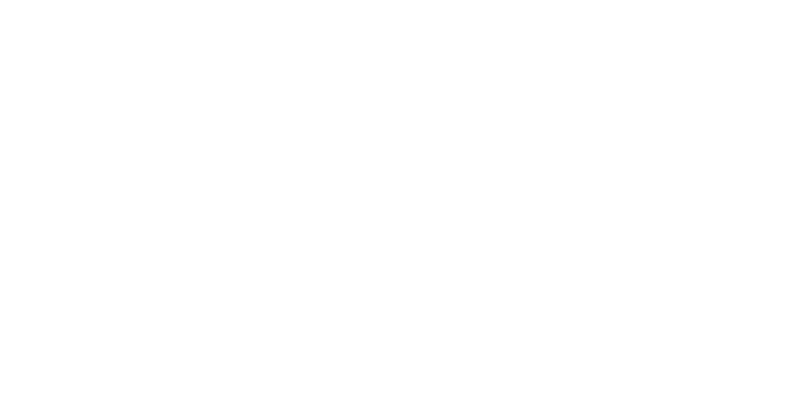

<IPython.core.display.Javascript object>


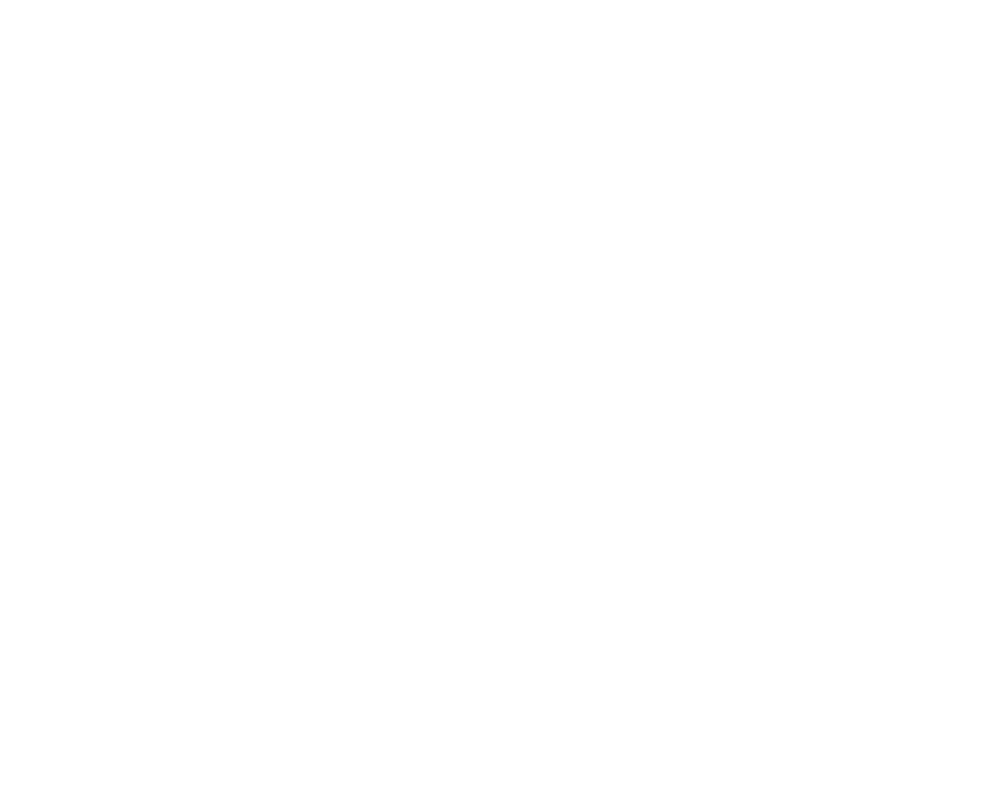

<IPython.core.display.Javascript object>


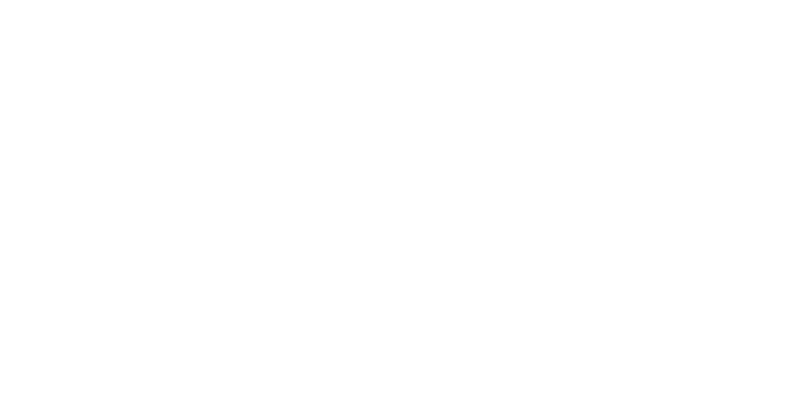

<IPython.core.display.Javascript object>


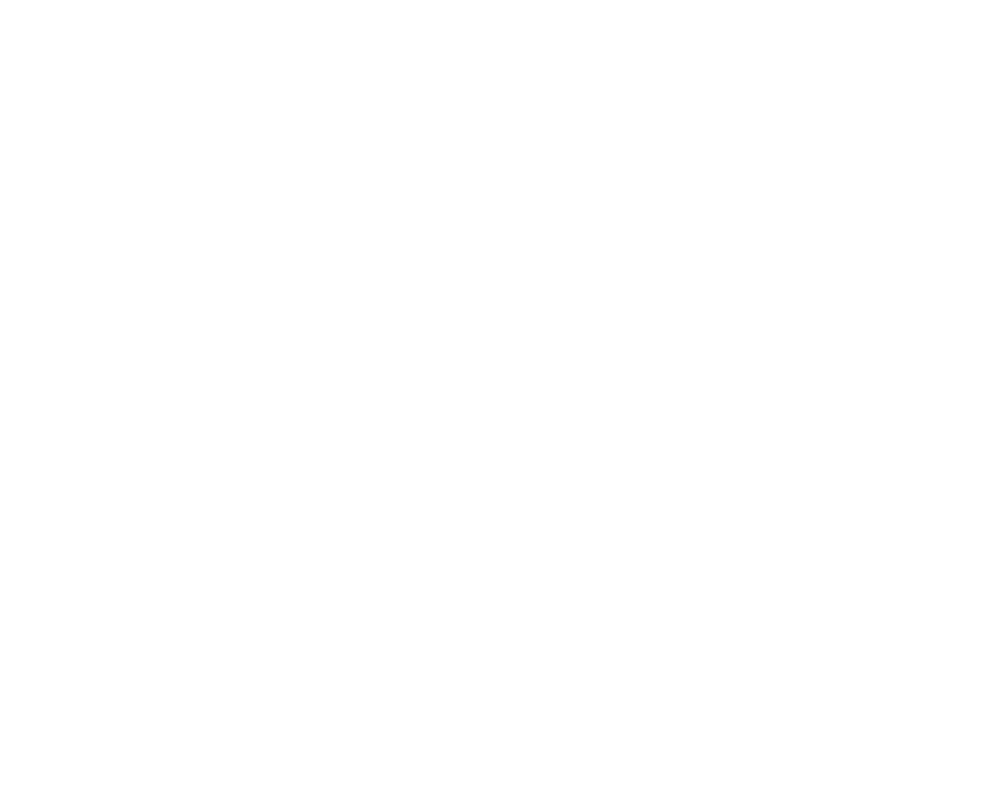

<IPython.core.display.Javascript object>


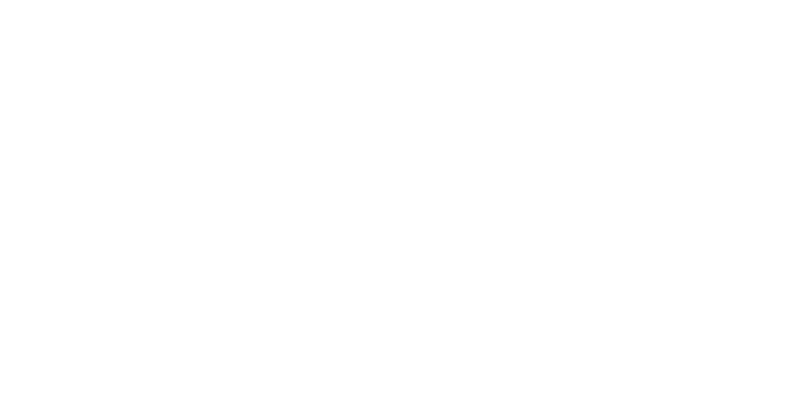

<IPython.core.display.Javascript object>


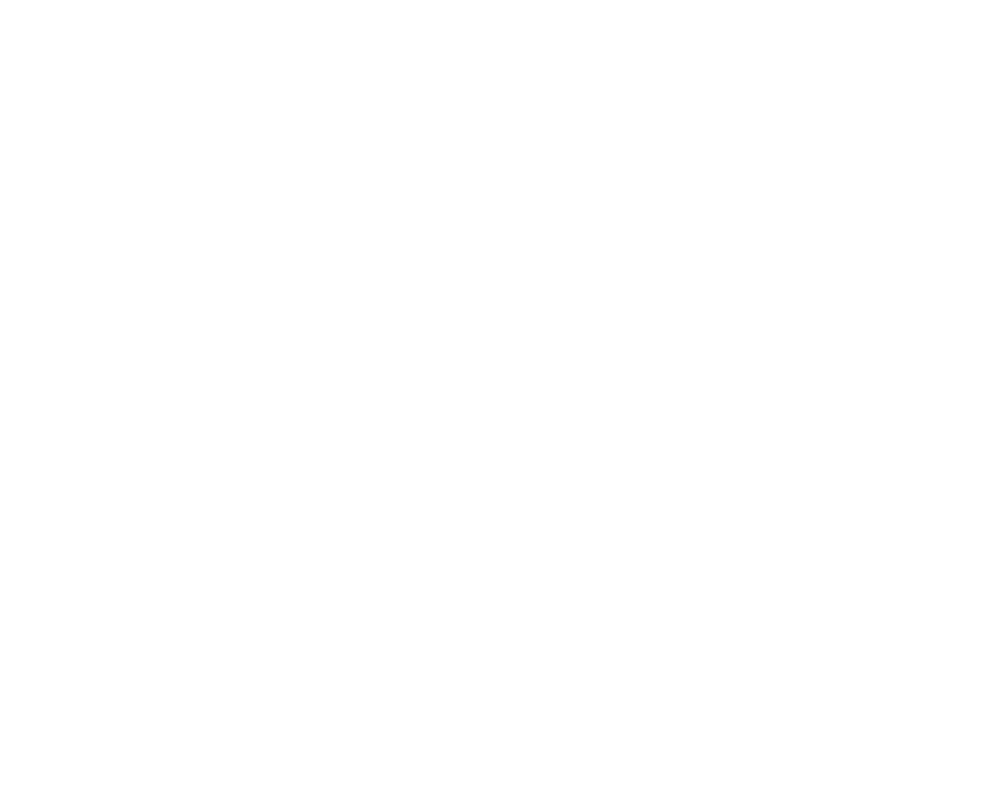

<IPython.core.display.Javascript object>


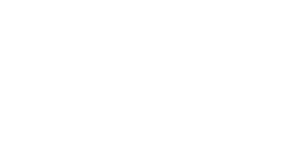

<IPython.core.display.Javascript object>


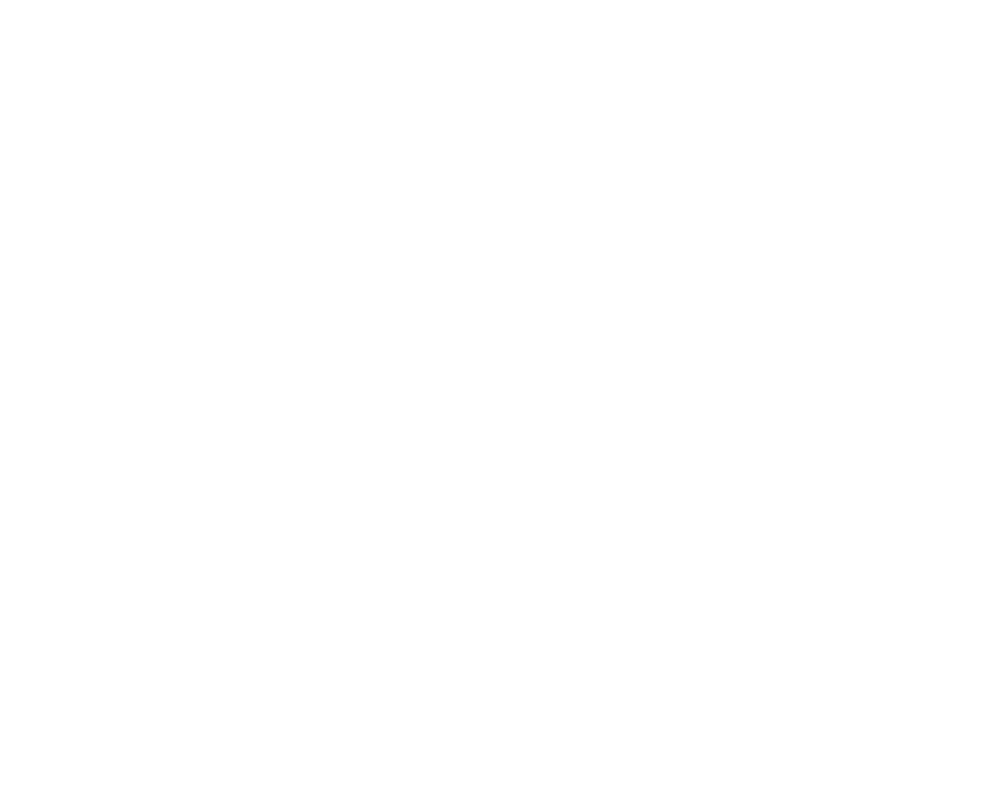

<IPython.core.display.Javascript object>


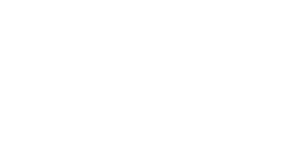

<IPython.core.display.Javascript object>


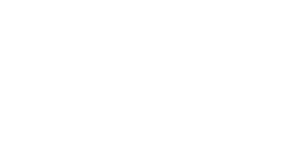

<IPython.core.display.Javascript object>


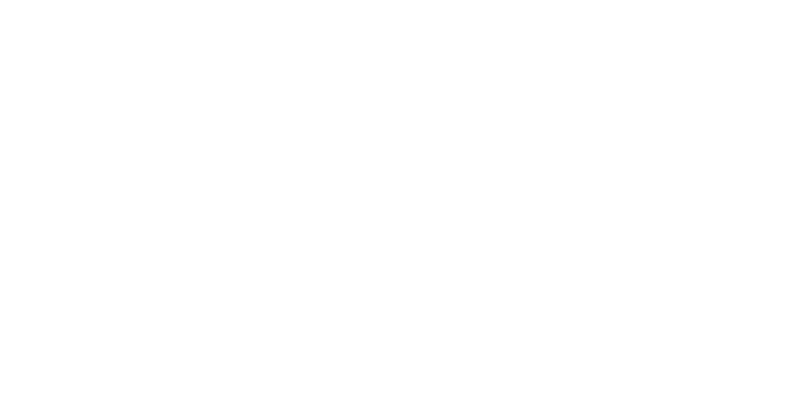

<IPython.core.display.Javascript object>


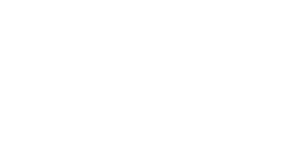

<IPython.core.display.Javascript object>


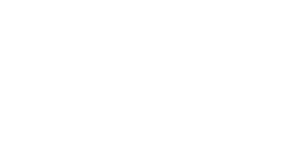

<IPython.core.display.Javascript object>


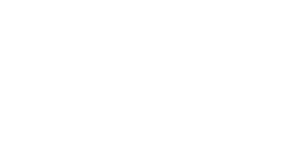

<IPython.core.display.Javascript object>


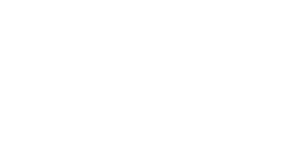

<IPython.core.display.Javascript object>


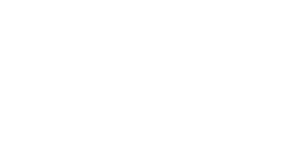

<IPython.core.display.Javascript object>


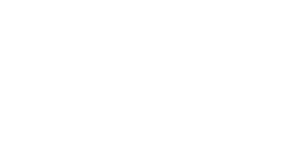

<IPython.core.display.Javascript object>


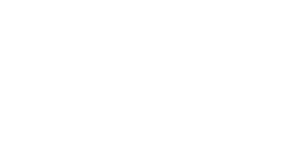

<IPython.core.display.Javascript object>


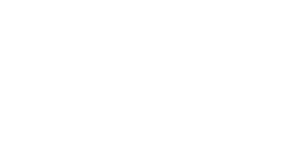

<IPython.core.display.Javascript object>


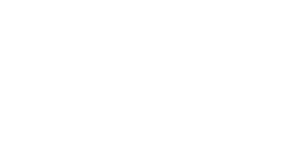

<IPython.core.display.Javascript object>


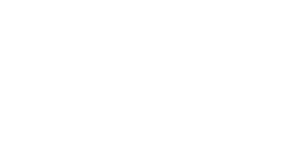

<IPython.core.display.Javascript object>


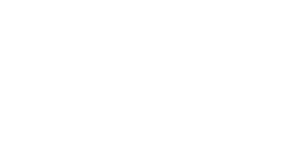

<IPython.core.display.Javascript object>


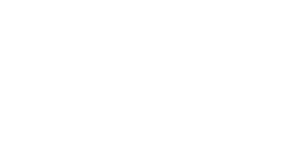

<IPython.core.display.Javascript object>


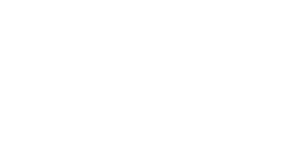

<IPython.core.display.Javascript object>


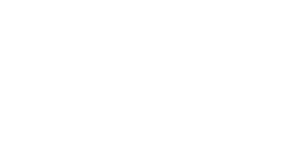

<IPython.core.display.Javascript object>


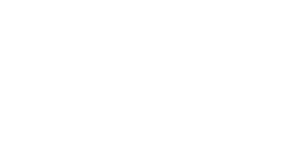

<IPython.core.display.Javascript object>


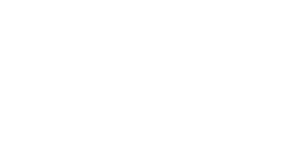

<IPython.core.display.Javascript object>


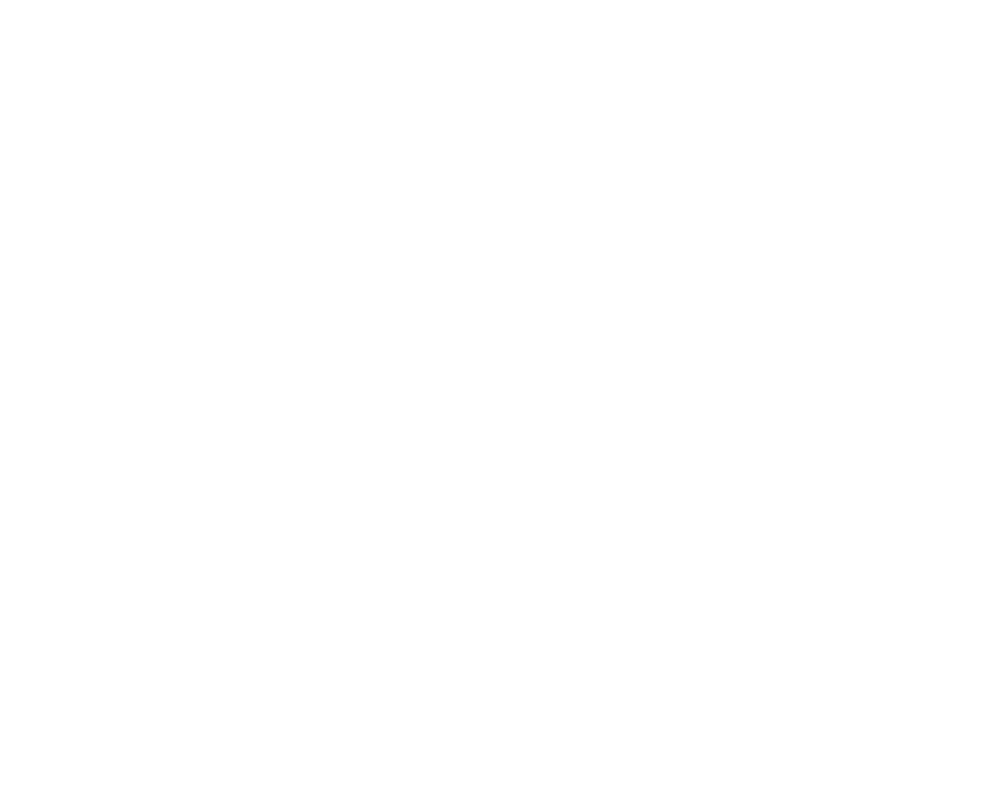

<IPython.core.display.Javascript object>


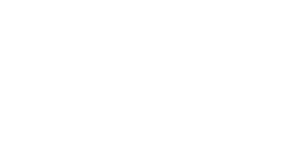

<IPython.core.display.Javascript object>


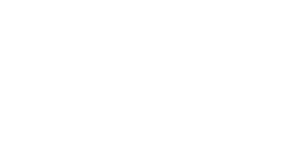

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanf

<IPython.core.display.Javascript object>


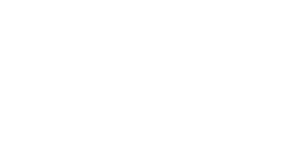

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


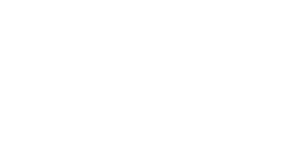

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:167: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im2 = ax[1,oi].imshow(opto_resp_FS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


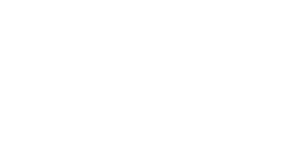

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


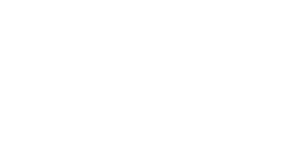

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:167: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im2 = ax[1,oi].imshow(opto_resp_FS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


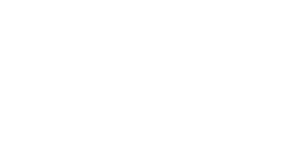

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


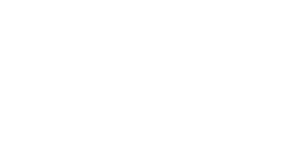

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:167: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im2 = ax[1,oi].imshow(opto_resp_FS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


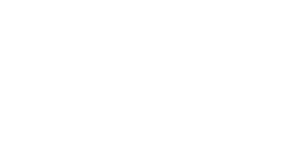

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


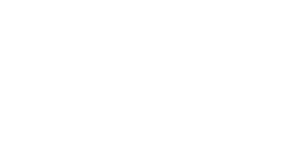

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:167: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im2 = ax[1,oi].imshow(opto_resp_FS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


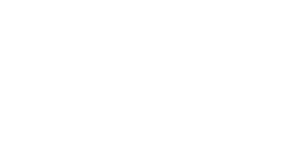

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


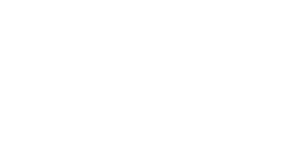

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:167: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im2 = ax[1,oi].imshow(opto_resp_FS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


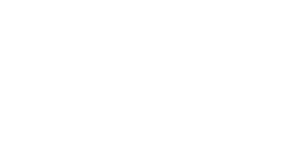

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


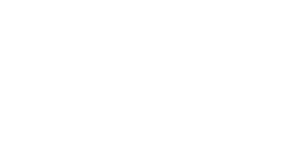

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:167: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im2 = ax[1,oi].imshow(opto_resp_FS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


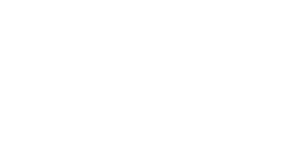

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


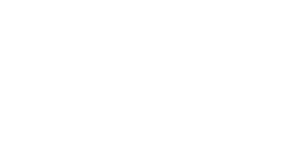

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:167: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im2 = ax[1,oi].imshow(opto_resp_FS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


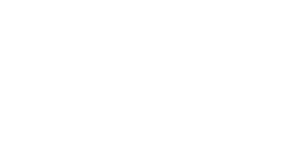

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


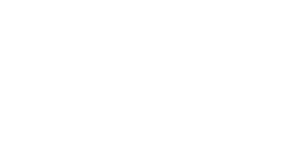

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:167: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im2 = ax[1,oi].imshow(opto_resp_FS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


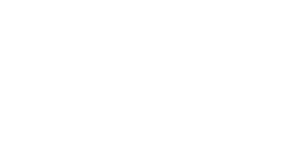

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


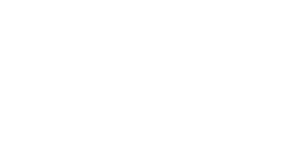

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:167: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im2 = ax[1,oi].imshow(opto_resp_FS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:80: RuntimeWarning: Mean of empty slice
  opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
C:\Anaconda3\envs\allensdk_38_new\lib\site-packages\numpy\lib\nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis

<IPython.core.display.Javascript object>


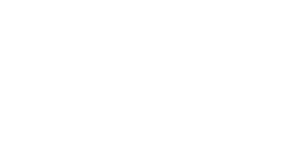

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice encountered
  maxvals.append(np.nanmax(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:132: RuntimeWarning: All-NaN slice encountered
  minvals.append(np.nanmin(y))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:131: RuntimeWarning: All-NaN slice 

<IPython.core.display.Javascript object>


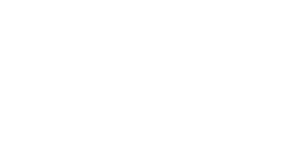

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_20380\321684435.py:167: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  im2 = ax[1,oi].imshow(opto_resp_FS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,


In [15]:
#loop through stim & areas and save
unique_areas=[]
for ss in range(0,len(sessions)):
    unique_areas.append(sessions[ss].good_units['area_short'].unique())    
unique_areas=np.unique(np.hstack(unique_areas))

stimuli=['catch','vis1','vis2','sound1','sound2']

for sel_area in unique_areas[25:]:
    for sel_stim in stimuli:

        opto_resp={}
        opto_regions=sessions[0].trials['trialOptoRegion'].unique()

        baseline_mean=[]
        baseline_std=[]

        for oo in opto_regions:
            opto_resp[oo] = []

        all_unit_info = []

        for ss in range(0,len(sessions)):

#             area_units = sessions[ss].good_units.query('area.str.contains(@sel_area)')
            area_units = sessions[ss].good_units.query('area_short == @sel_area')

            all_unit_info.append(area_units)

            for oo in opto_regions:

                sel_trials = sessions[ss].trials.query('trialStimID == @sel_stim and trialOptoRegion == @oo').index

                # compute avg firing rate for each opto stimulus

                opto_resp[oo].append(sessions[ss].trial_da.sel(
                    unit_id=area_units.index,trials=sel_trials).mean(dim=['trials']))

            baseline=sessions[ss].trial_da.sel(unit_id=area_units.index,time=slice(-0.25,-0.15)).mean(dim=['time'])
            baseline_mean.append(baseline.mean(dim=['trials']))
            baseline_std.append(baseline.std(dim=['trials']))

        baseline_mean=xr.concat(baseline_mean,dim='unit_id')
        baseline_std=xr.concat(baseline_std,dim='unit_id')

        for oo in opto_regions:   
            opto_resp[oo]=xr.concat(opto_resp[oo],dim='unit_id')

        all_unit_info = pd.concat(all_unit_info,axis=0)

        FS_units = all_unit_info.query('duration < 0.4').index
        RS_units = all_unit_info.query('duration >= 0.4').index

        # add error bars
        ### smooth each unit first, then find standard error
        gwindow = sg.gaussian(15, std=5)

        opto_resp_RS_smooth={}
        opto_resp_FS_smooth={}

        opto_resp_RS_smooth_mean={}
        opto_resp_RS_smooth_sem={}

        opto_resp_FS_smooth_mean={}
        opto_resp_FS_smooth_sem={}

        opto_resp_FS_smooth_z={}
        opto_resp_RS_smooth_z={}


        for oo in opto_regions:
            opto_resp_FS_smooth[oo]=np.zeros((len(FS_units),opto_resp[oo].shape[1]))
            opto_resp_RS_smooth[oo]=np.zeros((len(RS_units),opto_resp[oo].shape[1]))

            for iu,uu in enumerate(FS_units):
                opto_resp_FS_smooth[oo][iu,:]=sg.convolve(opto_resp[oo].sel(unit_id=uu),gwindow,mode='same')/np.sum(gwindow)
            for iu,uu in enumerate(RS_units):
                opto_resp_RS_smooth[oo][iu,:]=sg.convolve(opto_resp[oo].sel(unit_id=uu),gwindow,mode='same')/np.sum(gwindow)

            opto_resp_FS_smooth_mean[oo]=np.nanmean(opto_resp_FS_smooth[oo],0)
            opto_resp_FS_smooth_sem[oo]=np.nanstd(opto_resp_FS_smooth[oo],0)/np.sqrt(opto_resp_FS_smooth[oo].shape[0])

            opto_resp_RS_smooth_mean[oo]=np.nanmean(opto_resp_RS_smooth[oo],0)
            opto_resp_RS_smooth_sem[oo]=np.nanstd(opto_resp_RS_smooth[oo],0)/np.sqrt(opto_resp_RS_smooth[oo].shape[0])

            #zscore units firing rates
            opto_resp_FS_smooth_z[oo]=((opto_resp_FS_smooth[oo].T-baseline_mean.sel(unit_id=FS_units).values)/
                                      baseline_std.sel(unit_id=FS_units).values).T
            opto_resp_RS_smooth_z[oo]=((opto_resp_RS_smooth[oo].T-baseline_mean.sel(unit_id=RS_units).values)/
                                      baseline_std.sel(unit_id=RS_units).values).T

        fig,ax=plt.subplots(1,2,figsize=(8,4))

        stim_rect=patches.Rectangle([0,-5],0.5,100,color='grey',alpha=0.1)
        ax[0].add_patch(stim_rect)

        maxvals=[]
        minvals=[]

        for oo in opto_regions:
            y=opto_resp_RS_smooth_mean[oo]
            err=opto_resp_RS_smooth_sem[oo]
            line0=ax[0].plot(opto_resp[oo].time, y)
            ax[0].fill_between(opto_resp[oo].time, y-err, y+err,
                alpha=0.2, edgecolor=None, facecolor=line0[0].get_color())
            maxvals.append(np.nanmax(y))
            minvals.append(np.nanmin(y))

        ax[0].set_title(sel_area+' RS neurons (n='+str(len(opto_resp_RS_smooth[oo]))+') stim='+sel_stim[:])
        ax[0].set_xlabel('time relative to stimulus onset (s)')
        ax[0].set_ylabel('firing rate (Hz)')
        ax[0].set_xlim([-0.2,0.75])
        ax[0].legend(opto_regions,title='opto loc:')
        if (~np.isnan(np.nanmin(minvals)))&(~np.isnan(np.nanmax(maxvals))):
            ax[0].set_ylim([np.nanmin(minvals)-5,np.nanmax(maxvals)+5])



        stim_rect=patches.Rectangle([0,-5],0.5,100,color='grey',alpha=0.1)
        ax[1].add_patch(stim_rect)

        maxvals=[]
        minvals=[]

        for oo in opto_regions:
            y=opto_resp_FS_smooth_mean[oo]
            err=opto_resp_FS_smooth_sem[oo]
            line0=ax[1].plot(opto_resp[oo].time, y)
            ax[1].fill_between(opto_resp[oo].time, y-err, y+err,
                alpha=0.2, edgecolor=None, facecolor=line0[0].get_color())
            maxvals.append(np.nanmax(y))
            minvals.append(np.nanmin(y))

        ax[1].set_title(sel_area+' FS neurons (n='+str(len(opto_resp_FS_smooth[oo]))+') stim='+sel_stim[:])
        ax[1].set_xlabel('time relative to stimulus onset (s)')
        ax[1].set_ylabel('firing rate (Hz)')
        ax[1].set_xlim([-0.2,0.75])
        # ax[1].legend(opto_regions,title='opto loc:')
        if (~np.isnan(np.nanmin(minvals)))&(~np.isnan(np.nanmax(maxvals))):
            ax[1].set_ylim([np.nanmin(minvals)-5,np.nanmax(maxvals)+5])

        fig.tight_layout()
        
        figname=sel_area+'_'+sel_stim+'_opto_PSTH.png'
        figpath=r"C:\Users\ethan.mcbride\OneDrive - Allen Institute\quick figures\2023-06-01-DR_opto_plots"
        plt.savefig(os.path.join(figpath,figname.replace('/','-')), dpi=300, facecolor='w', edgecolor='w',
                    orientation='portrait', format='png',
                    transparent=True, bbox_inches='tight', pad_inches=0.1,
                    metadata=None)
        plt.close(fig)
        
        ###
        #plot heatmaps of unit responses - order by depth

        fig,ax=plt.subplots(2,4,figsize=(10,8))

        for oi,oo in enumerate(opto_regions): 
            im1 = ax[0,oi].imshow(opto_resp_RS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
                           cmap=plt.get_cmap('bwr'),interpolation='none',
                           extent=(-time_before_flash,trial_duration-time_before_flash,
                                   -0.5,opto_resp_RS_smooth_z[oo].shape[0]-0.5))

            ax[0,oi].axvline(0,color='k',linestyle='--',linewidth=1)
            ax[0,oi].set_title(oo)
            ax[0,oi].set_xlim(-0.25,0.75)
            
            im2 = ax[1,oi].imshow(opto_resp_FS_smooth_z[oo],aspect='auto',vmin=-3,vmax=3,
                           cmap=plt.get_cmap('bwr'),interpolation='none',
                           extent=(-time_before_flash,trial_duration-time_before_flash,
                                   -0.5,opto_resp_FS_smooth_z[oo].shape[0]-0.5))

            ax[1,oi].axvline(0,color='k',linestyle='--',linewidth=1)
            ax[1,oi].set_title(oo)
            ax[1,oi].set_xlim(-0.25,0.75)

            if oi==0:
                ax[0,oi].set_ylabel('RS neurons')
                ax[1,oi].set_ylabel('FS neurons')
            elif oi>0:
                ax[0,oi].set_yticklabels([])
                ax[1,oi].set_yticklabels([])

            ax[0,oi].yaxis.set_major_locator(MaxNLocator(integer=True))
            ax[1,oi].yaxis.set_major_locator(MaxNLocator(integer=True))

        fig.suptitle('area-'+sel_area+'; stim-'+sel_stim[:])

        # this adjusts the other plots to make space for the colorbar
        fig.subplots_adjust(bottom=0.1, right=0.8, top=0.9, hspace=0.3) 
        cax = plt.axes([0.85, 0.1, 0.025, 0.8])
        cbar = fig.colorbar(im1, cax=cax)
        cbar.ax.set_ylabel('z-scored firing rates')
        
        figname=sel_area+'_'+sel_stim+'_opto_heatmap.png'
        figpath=r"C:\Users\ethan.mcbride\OneDrive - Allen Institute\quick figures\2023-06-01-DR_opto_plots"
        plt.savefig(os.path.join(figpath,figname.replace('/','-')), dpi=300, facecolor='w', edgecolor='w',
                    orientation='portrait', format='png',
                    transparent=True, bbox_inches='tight', pad_inches=0.1,
                    metadata=None)
        plt.close(fig)


In [11]:
figname.replace('/','-')

'N-A_catch_opto_PSTH.png'

<IPython.core.display.Javascript object>


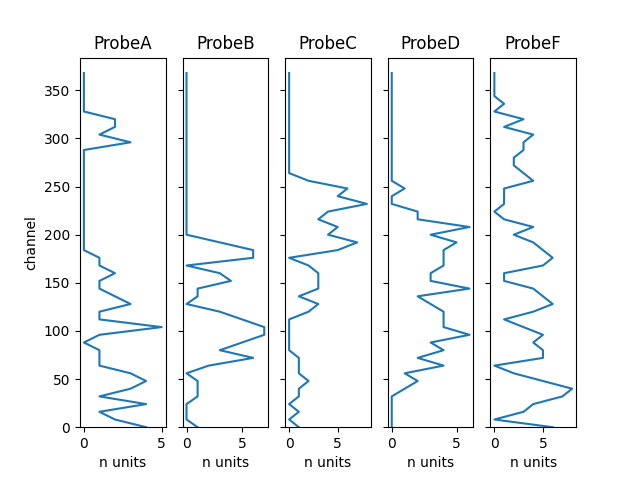

In [21]:
#unit density on diff probes
probes = sessions[0].good_units['probe'].unique()
ch_bins=np.arange(0,384,8)

units_by_channel = sessions[0].good_units[['probe','peak_channel']].value_counts()

fig,ax=plt.subplots(1,len(probes))

for ip,pr in enumerate(probes):
    unit_hist,edges=np.histogram(units_by_channel[pr].sort_index().index,bins=ch_bins)
    ax[ip].plot(unit_hist,ch_bins[:-1])
    ax[ip].set_ylim([0,384])
    ax[ip].set_xlabel('n units')
    ax[ip].set_title('Probe'+pr)
    if ip>0:
        ax[ip].set_yticklabels([])
    else:
        ax[ip].set_ylabel('channel')
        

In [24]:
unit_hist

array([6, 0, 3, 4, 7, 8, 5, 2, 0, 5, 5, 4, 5, 3, 1, 4, 6, 5, 4, 1, 1, 5,
       6, 5, 4, 2, 4, 1, 0, 1, 1, 1, 4, 3, 2, 2, 3, 3, 4, 1, 3, 0, 1, 0,
       0, 0, 0], dtype=int64)

In [ ]:
#unit density on diff probes
probes = sessions[0].good_units['probe'].unique()
ch_bins=np.arange(0,384,8)

units_by_channel = sessions[0].good_units[['probe','peak_channel']].value_counts()

fig,ax=plt.subplots(1,len(probes))

for ip,pr in enumerate(probes):
    
    for ich,ch in enumerate(ch_bins):
        
        
        
        
    unit_hist,edges=np.histogram(units_by_channel[pr].sort_index().index,bins=ch_bins)
    ax[ip].plot(unit_hist,ch_bins[:-1])
    ax[ip].set_ylim([0,384])
    ax[ip].set_xlabel('n units')
    ax[ip].set_title('Probe'+pr)
    if ip>0:
        ax[ip].set_yticklabels([])
    else:
        ax[ip].set_ylabel('channel')
        


#divide between RS & FS units, combine all spikes on each channel (or every 4 channels?)


#normalize to baseline FR


#plot normalized FR for each opto location



In [ ]:
# (opto_resp_FS_smooth[oo].T-baseline_mean.sel(unit_id=FS_units).values).T


In [ ]:
# opto_resp[oo]

In [ ]:
# need to do something different for probe-by probe analysis (below)

In [ ]:
# how deep are units affected on the targeted probe?

#figure for each probe - diff plots for diff opto locations



<IPython.core.display.Javascript object>


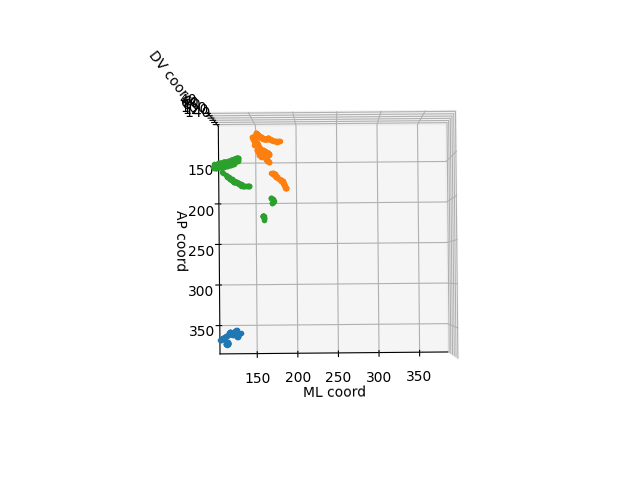

In [20]:
# plot CCF position of units along with block difference
# ss=6
sel_areas=['VISp','MOs','MOp',]

colors=['tab:blue','tab:orange','tab:green','tab:red','tab:purple']

fig=plt.figure()
ax = fig.add_subplot(projection='3d')

for aa,sel_area in enumerate(sel_areas): 

    for ss in sessions:

        area_unit_ind=sessions[ss].good_units.query('area_short==@sel_area').index

        AP_coord=sessions[ss].good_units['AP_coord'].loc[area_unit_ind]
        ML_coord=sessions[ss].good_units['ML_coord'].loc[area_unit_ind]
        DV_coord=sessions[ss].good_units['DV_coord'].loc[area_unit_ind]

        ax.plot(ML_coord,AP_coord,DV_coord,linestyle='',marker='.',color=colors[aa])

ax.set_xlabel('ML coord')
ax.set_ylabel('AP coord')
ax.set_zlabel('DV coord')


ax.invert_yaxis()
ax.invert_zaxis()